In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Parte 1 - Regressão Linear

In [2]:
def polynomial_adj(x, n):
    
    m = x.shape[0]
    aux_x = x.copy()
    aux_x = np.array(aux_x, ndmin=2)
    aux_x = aux_x.T
    aux_x = normalize(aux_x)
    for i in range(2, n+1):
        x_i = x**i
        x_i = np.array(x_i, ndmin=2)
        x_i = x_i.T
        x_i = normalize(x_i)
        aux_x = np.append(aux_x.reshape(m,i-1), x_i, axis=1)   
    
    return aux_x

In [3]:
def normalize(x):
    
    norm_x = x.copy()
    norm_x = (x - np.min(x))/(np.max(x) - np.min(x))
    
    return norm_x

In [4]:
def cost_fun(x, y, theta):
    
    m = len(y)
    h = x.dot(theta)
    J = (1/(2 * m)) * (np.sum((h-y)**2))
         
    return J

In [5]:
def descending_gradient(x, y, theta, alpha, max_iter):
    
    h = x.dot(theta)
    J_history = []
    J_history.append(cost_fun(x, y, theta))
    m = len(y)
    for i in range(max_iter):
        h = x.dot(theta)
        theta = theta - (alpha/m) * (x.T.dot(h-y))
        cost = cost_fun(x, y, theta)
        if((cost < 0.00001) or (cost > 10000)):
            J_history.append(cost)
            return theta, J_history
        else:
            J_history.append(cost)
    
    return theta, J_history

In [6]:
def normal_equation(x, y):
    
    xt_x = x.T.dot(x)
    theta = (np.linalg.pinv(xt_x)).dot(x.T.dot(y))
    
    return theta

In [7]:
def prediction(x, theta):
    
    pred = x.dot(theta)
    
    return pred

## Função principal

In [715]:
data = pd.read_csv("casesBrazil.csv")

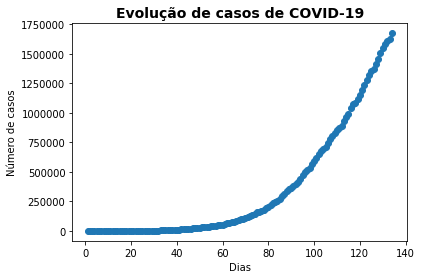

In [716]:
plt.scatter(data["day"], data["cases"])
plt.xlabel("Dias")
plt.ylabel("Número de casos")
plt.title("Evolução de casos de COVID-19", fontdict={'weight':'bold', 'size':14})
plt.show()

In [717]:
x = data["day"].values
y = data["cases"].values
y = y.reshape(m, 1)

#### 1.

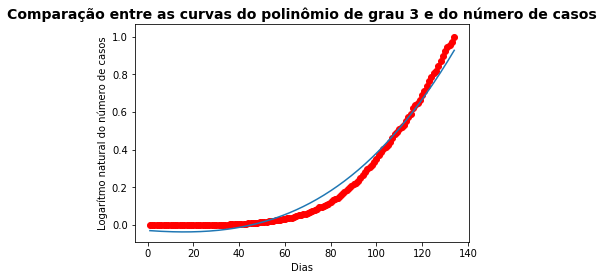

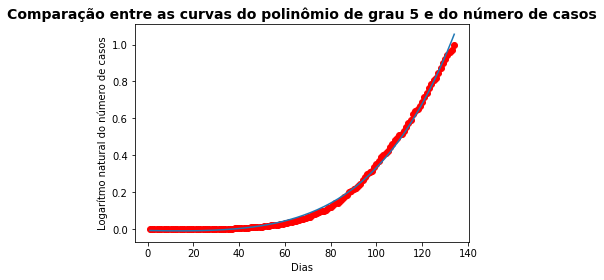

C:\Users\guigo\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in longlong_scalars
  after removing the cwd from sys.path.


[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   1.46724759e+01 -2.16358064e+01]
 [ 7.51879699e-03  1.67084378e-04  2.90926864e-06 ...  2.45302398e-15
   1.46724759e+01 -2.16358064e+01]
 [ 1.50375940e-02  4.45558340e-04  1.08058549e-05 ...  6.31052443e-14
   1.46724759e+01 -2.16358064e+01]
 ...
 [ 9.84962406e-01  9.70370370e-01  9.55888838e-01 ...  8.86651724e-01
  -4.68189499e+00  1.98408306e+01]
 [ 9.92481203e-01  9.85129490e-01  9.77778591e-01 ...  9.41834816e-01
  -6.04221451e+00 -1.65650806e+01]
 [ 1.00000000e+00  1.00000000e+00  1.00000000e+00 ...  1.00000000e+00
  -7.48686627e+00  1.42077521e+01]]


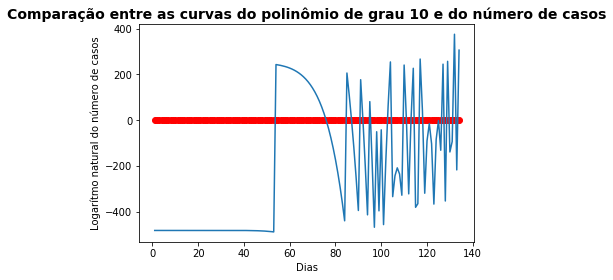

In [718]:
# Inicializando as variáveis
alpha = 0.01
max_iter = 10000
new_y = normalize(y)

# Ajustamento os dados por um polinômio
degrees = [3, 5, 10]
for i in degrees:
    new_x = polynomial_adj(x, i)
    if(i == 10):
        print(new_x)
    m = new_x.shape[0]
    new_x = np.append(np.ones([m, 1]), new_x.reshape(m, new_x.shape[1]), axis=1)
    
    theta = np.ones([new_x.shape[1], 1])

    new_theta, J_history = descending_gradient(new_x, new_y, theta, alpha, max_iter)

    plt.scatter(x, new_y, c="red")
    plt.plot(x, np.dot(new_x, new_theta))
    plt.xlabel("Dias")
    plt.ylabel("Logarítmo natural do número de casos")
    plt.title("Comparação entre as curvas do polinômio de grau "+str(i)+" e do número de casos", fontdict={'weight':'bold', 'size':14})
    plt.show()

#### 2. e 3.

In [719]:
# Linearizando a exponencial aplicando ln
log_y = np.log(y)

In [720]:
# Inicializando variáveis
alpha2 = 1
max_iter2 = 10000
new2_x = x.copy()
new2_x = normalize(new2_x)
norm2_x = new2_x.copy()
m2 = norm2_x.shape[0]
norm2_x = np.append(np.ones([m2,1]), norm2_x.reshape(m2,1),axis=1)
theta2 = np.ones([norm2_x.shape[1], 1])

In [721]:
new2_theta, J_history2 = descending_gradient(norm2_x, log_y, theta2, alpha2, max_iter2)

In [722]:
exp_h = new2_theta[0] * np.exp(new2_theta[1] * new2_x)

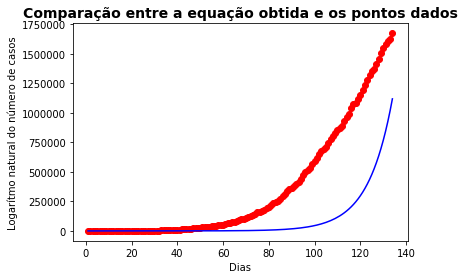

In [723]:
plt.scatter(x, y, c="red")
plt.plot(x, exp_h, c="blue")
plt.xlabel("Dias")
plt.ylabel("Logarítmo natural do número de casos")
plt.title("Comparação entre a equação obtida e os pontos dados", fontdict={'weight':'bold', 'size':14})
plt.show()

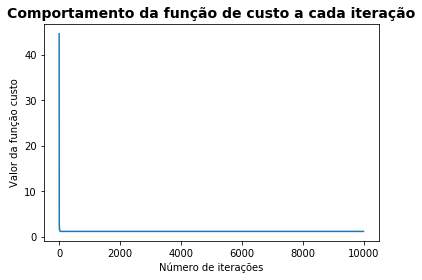

In [724]:
# Observando comportamento da função de custo a cada iteração
plt.plot(range(len(J_history2)), J_history2)
plt.xlabel("Número de iterações")
plt.ylabel("Valor da função custo")
plt.title("Comportamento da função de custo a cada iteração", fontdict={'weight':'bold', 'size':14})
plt.show()

In [725]:
ALPHA = [10, 3, 1, 0.3, 0.1, 0.03, 0.01, 0.003, 0.001]
NEW_THETA = []
J_HIST = []

In [726]:
for i in ALPHA:
    new3_theta, J_history3 = descending_gradient(norm2_x, log_y, theta2, i, max_iter2)
    NEW_THETA.append(new3_theta)
    J_HIST.append(J_history3)

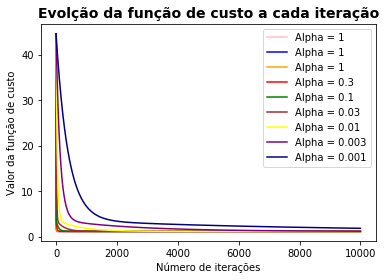

In [727]:
plt.plot(range(len(J_HIST[2])), J_HIST[2], label='Alpha = 1', c='pink')
plt.plot(range(len(J_HIST[2])), J_HIST[2], label='Alpha = 1', c='blue')
plt.plot(range(len(J_HIST[2])), J_HIST[2], label='Alpha = 1', c='orange')
plt.plot(range(len(J_HIST[3])), J_HIST[3], label='Alpha = 0.3', c='red')
plt.plot(range(len(J_HIST[4])), J_HIST[4], label='Alpha = 0.1', c='green')
plt.plot(range(len(J_HIST[5])), J_HIST[5], label='Alpha = 0.03', c='brown')
plt.plot(range(len(J_HIST[6])), J_HIST[6], label='Alpha = 0.01', c='yellow')
plt.plot(range(len(J_HIST[7])), J_HIST[7], label='Alpha = 0.003', c='purple')
plt.plot(range(len(J_HIST[8])), J_HIST[8], label='Alpha = 0.001', c='navy')
plt.xlabel("Número de iterações")
plt.ylabel("Valor da função de custo")
plt.title("Evolção da função de custo a cada iteração", fontdict={'weight':'bold', 'size':14})
plt.legend()
plt.show()

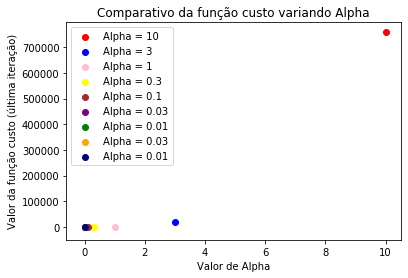

In [728]:
# Plotando o J da última iteração pelo valor de alpha
plt.scatter(ALPHA[0], J_HIST[0][-1], c='red', label='Alpha = 10')
plt.scatter(ALPHA[1], J_HIST[1][-1], c='blue', label='Alpha = 3')
plt.scatter(ALPHA[2], J_HIST[2][-1], c='pink', label='Alpha = 1')
plt.scatter(ALPHA[3], J_HIST[3][-1], c='yellow', label='Alpha = 0.3')
plt.scatter(ALPHA[4], J_HIST[4][-1], c='brown', label='Alpha = 0.1')
plt.scatter(ALPHA[5], J_HIST[5][-1], c='purple', label='Alpha = 0.03')
plt.scatter(ALPHA[6], J_HIST[6][-1], c='green', label='Alpha = 0.01')
plt.scatter(ALPHA[7], J_HIST[7][-1], c='orange', label='Alpha = 0.03')
plt.scatter(ALPHA[8], J_HIST[8][-1], c='navy', label='Alpha = 0.01')
plt.xlabel("Valor de Alpha")
plt.ylabel("Valor da função custo (última iteração)")
plt.title("Comparativo da função custo variando Alpha")
plt.legend()
plt.show()

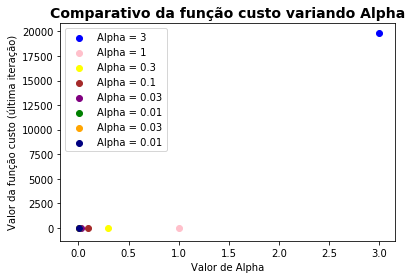

In [729]:
plt.scatter(ALPHA[1], J_HIST[1][-1], c='blue', label='Alpha = 3')
plt.scatter(ALPHA[2], J_HIST[2][-1], c='pink', label='Alpha = 1')
plt.scatter(ALPHA[3], J_HIST[3][-1], c='yellow', label='Alpha = 0.3')
plt.scatter(ALPHA[4], J_HIST[4][-1], c='brown', label='Alpha = 0.1')
plt.scatter(ALPHA[5], J_HIST[5][-1], c='purple', label='Alpha = 0.03')
plt.scatter(ALPHA[6], J_HIST[6][-1], c='green', label='Alpha = 0.01')
plt.scatter(ALPHA[7], J_HIST[7][-1], c='orange', label='Alpha = 0.03')
plt.scatter(ALPHA[8], J_HIST[8][-1], c='navy', label='Alpha = 0.01')
plt.xlabel("Valor de Alpha")
plt.ylabel("Valor da função custo (última iteração)")
plt.title("Comparativo da função custo variando Alpha", fontdict={'weight':'bold', 'size':14})
plt.legend()
plt.show()

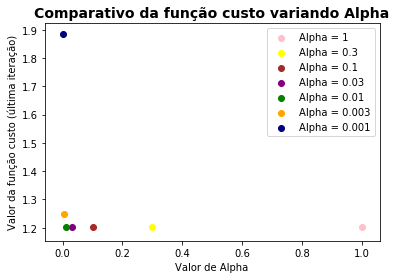

In [735]:
plt.scatter(ALPHA[2], J_HIST[2][-1], c='pink', label='Alpha = 1')
plt.scatter(ALPHA[3], J_HIST[3][-1], c='yellow', label='Alpha = 0.3')
plt.scatter(ALPHA[4], J_HIST[4][-1], c='brown', label='Alpha = 0.1')
plt.scatter(ALPHA[5], J_HIST[5][-1], c='purple', label='Alpha = 0.03')
plt.scatter(ALPHA[6], J_HIST[6][-1], c='green', label='Alpha = 0.01')
plt.scatter(ALPHA[7], J_HIST[7][-1], c='orange', label='Alpha = 0.003')
plt.scatter(ALPHA[8], J_HIST[8][-1], c='navy', label='Alpha = 0.001')
plt.xlabel("Valor de Alpha")
plt.ylabel("Valor da função custo (última iteração)")
plt.title("Comparativo da função custo variando Alpha", fontdict={'weight':'bold', 'size':14})
plt.legend()
plt.show()

#### 4

In [731]:
# Inicializando variáveis
alpha4 = 1
max_iter4 = 10000
new4_x = x.copy()
m4 = new4_x.shape[0]
new4_x = np.append(np.ones([m4,1]), new4_x.reshape(m4,1),axis=1)
theta4 = np.ones([new4_x.shape[1], 1])

In [732]:
new4_theta = normal_equation(new4_x, y)
# POR QUE NEW4_THETA ESTÁ FICANDO TÃO GRANDE?????
print(new4_theta)

[[-372470.88957467]
 [  10873.01760122]]


In [733]:
exp_h2 = new4_theta[0] * np.exp(new4_theta[1] * x)
print(exp_h2)

[-inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf -inf
 -inf -inf -inf -inf -inf -inf -inf -inf]


C:\Users\guigo\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.


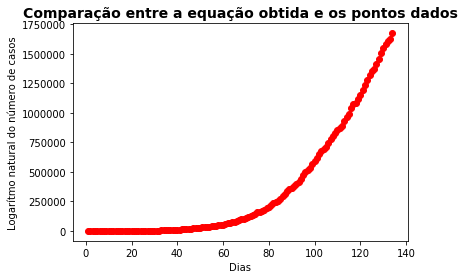

In [734]:
plt.scatter(x, y, c="red")
plt.plot(x, exp_h2, c="blue")
plt.xlabel("Dias")
plt.ylabel("Logarítmo natural do número de casos")
plt.title("Comparação entre a equação obtida e os pontos dados", fontdict={'weight':'bold', 'size':14})
plt.show()

_______________________________________________________________________________________________________________________________

# Parte 2 - Regressão Logística

In [8]:
def features(df):
    
    x = []
    df2 = df.copy()
    m = df2.shape[0]
    n = df2.shape[1]
    x = df2.iloc[:1,:].values
    x = normalize(x)
    for i in range(1, m):
        aux = df2.iloc[i:i+1,:].values
        aux = normalize(aux)
        x = np.append(x.reshape(i, n), aux, axis=0)
    x = np.append(np.ones([m, 1]), x.reshape(m, df2.shape[1]), axis=1)
    
    return x

In [9]:
def sigmoid(z):
    
    return 1/(1+np.exp(-z))

In [10]:
def cost_fun_lg(x, y, theta):
    
    m = len(y)
    h = sigmoid(x.dot(theta))
    J = (1/m)*(np.sum((-y * np.log(h)) - ((1 - y) * np.log(1 - h))))
    
    return J

In [11]:
def descending_gradient_lg(x, y, theta, alpha, max_iter):
    
    J_history = []
    J_history.append(cost_fun_lg(x, y, theta))
    m = len(y)
    for i in range(max_iter):
        h = sigmoid(x.dot(theta))
        theta = theta - (alpha/m) * (x.T.dot(h-y))
        cost = cost_fun_lg(x, y, theta)
        if(cost > J_history[-1]):
            J_history.append(cost)
            theta = theta.reshape(theta.shape[0])
            return theta, J_history
        else:
            J_history.append(cost)
    
    theta = theta.reshape(theta.shape[0])
    
    return theta, J_history

In [12]:
def adj_labels(y):
    
    adj_y = np.zeros([len(np.unique(y)), y.shape[0]])
    for i in range(len(np.unique(y))):
        adj_y[i, :] = (y == i/9).reshape(len(y))
        
    return adj_y

In [13]:
def cost_fun_lg_reg(x, y, theta, lambda1):
    
    m = len(y)
    h = sigmoid(x.dot(theta))
    J = ((1/m) * (np.sum((-y * np.log(h)) - ((1 - y) * np.log(1 - h))))) + (1/(2*m) * lambda1.dot(theta**2))
    
    return J

In [14]:
def descending_gradient_lg_reg(x, y, theta, alpha, max_iter, lambda1):
    
    J_history = []
    J_history.append(cost_fun_lg_reg(x, y, theta, lambda1))
    m = len(y)
    for i in range(max_iter):
        h = sigmoid(x.dot(theta))
        theta = theta - (alpha/m) * ((x.T.dot(h-y)) + (lambda1.dot(theta)))
        cost = cost_fun_lg_reg(x, y, theta, lambda1)
        if(cost > J_history[-1]):
            J_history.append(cost)
            theta = theta.reshape(theta.shape[0])
            return theta, J_history
        else:
            J_history.append(cost)
    
    theta = theta.reshape(theta.shape[0])
    
    return theta, J_history

In [15]:
def prediction_lg(x, theta):
    
    pred = sigmoid(x.dot(theta))
    
    return pred

## Função Principal

### 1)

In [16]:
# Importando dados
images = pd.read_csv("imageMNIST.csv", decimal=",", thousands=".")
images.columns = range(400)
images = images.apply(pd.to_numeric)
labels = pd.read_csv("labelMNIST.csv")
labels.columns = range(1)

# Possuíamos valores 10 no labelMNIST. Como estamos classificando de 0 a 9, então substituo onde tenho 10, por 0.
labels[labels == 10] = 0

In [17]:
# Inicializando x e y
y_lg = normalize(labels[0].values)
y_lg = np.array(y_lg).reshape(-1,1)
x_lg = features(images)

In [18]:
# Construindo matriz auxiliar para treinamento do conjunto dos parâmetros pra cada dígito (d). Y_lg[i] = 1 se y_lg[i] = d e 0, c.c. 
Y_lg = adj_labels(y_lg)

# Matriz de parâmetros: na i-ésima linha temos os parâmetros para o i-ésimo dígito
THETA = np.zeros([len(np.unique(y_lg)), x_lg.shape[1]])

In [37]:
# Inicializando as variáveis e encontrando os 10 conjuntos de parâmetros, treinados para cada dígito
alpha_lg = 0.007908
max_iter_lg = 100
theta_lg = np.full((x_lg.shape[1], 1), 0.1)
for i in range(len(np.unique(y_lg))):
    new_y_lg = Y_lg[i, :].copy()
    new_y_lg = new_y_lg.reshape(-1, 1)
    THETA[i], J_history_lg = descending_gradient_lg(x_lg, new_y_lg, theta_lg, alpha_lg, max_iter_lg)

cont_dif = 0
w_images = []
pred = labels.copy()
for j in range(len(y_lg)):
    max_valor = 0
    for i in range(10):
        valor = prediction_lg(x_lg[j], THETA[i])
        if(valor > max_valor):
            max_valor = valor
            digito = i
    if(labels[0][j] != digito):
        w_images.append(j)
        pred[0][j] = digito 
        cont_dif += 1
print("O números de previsões incorretas é:", cont_dif, "\nLogo, o percentual de acertos é:", round(100*((len(y_lg)-cont_dif)/len(y_lg)), 2), "%")

O números de previsões incorretas é: 1119 
Logo, o percentual de acertos é: 77.62 %


O dígito é: 0
O dígito previsto foi: 6


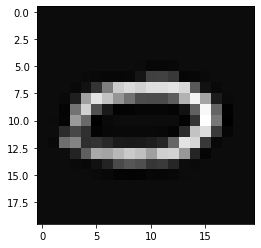

O dígito é: 0
O dígito previsto foi: 6


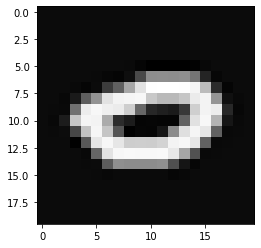

O dígito é: 0
O dígito previsto foi: 2


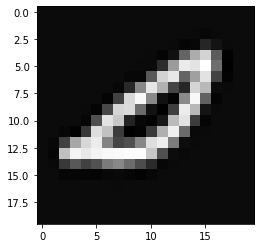

O dígito é: 0
O dígito previsto foi: 6


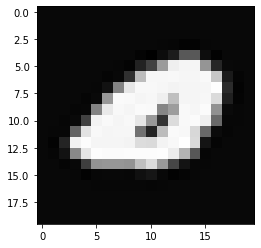

O dígito é: 0
O dígito previsto foi: 8


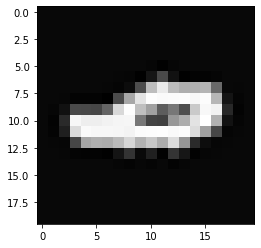

O dígito é: 0
O dígito previsto foi: 3


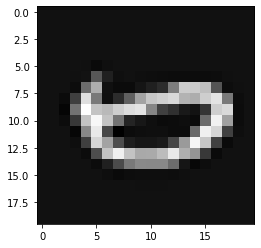

O dígito é: 0
O dígito previsto foi: 6


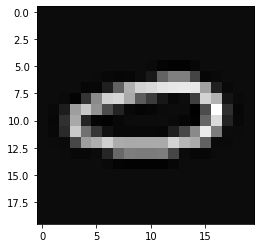

O dígito é: 0
O dígito previsto foi: 6


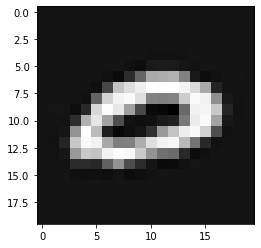

O dígito é: 0
O dígito previsto foi: 6


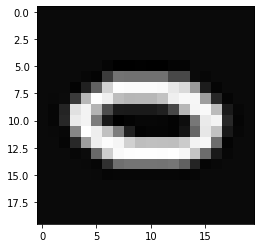

O dígito é: 0
O dígito previsto foi: 6


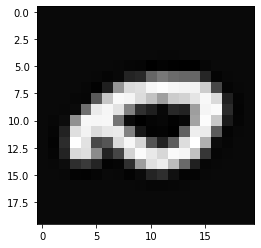

O dígito é: 0
O dígito previsto foi: 6


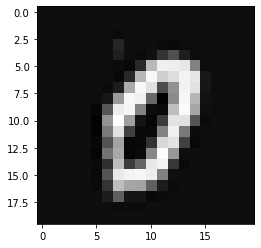

O dígito é: 0
O dígito previsto foi: 8


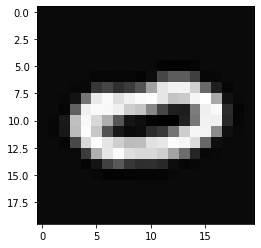

O dígito é: 0
O dígito previsto foi: 3


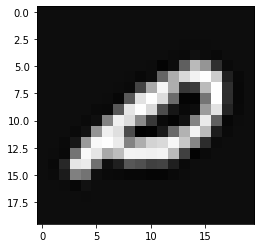

O dígito é: 0
O dígito previsto foi: 6


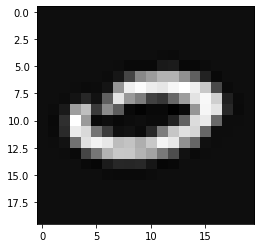

O dígito é: 0
O dígito previsto foi: 6


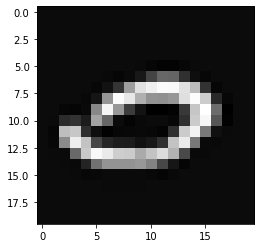

O dígito é: 0
O dígito previsto foi: 6


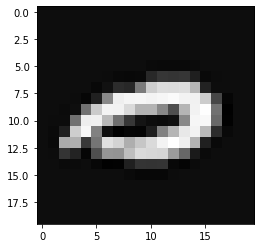

O dígito é: 0
O dígito previsto foi: 6


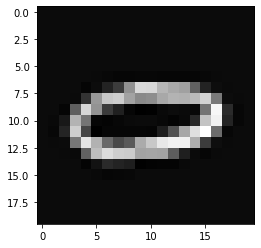

O dígito é: 0
O dígito previsto foi: 6


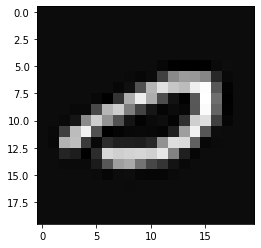

O dígito é: 0
O dígito previsto foi: 6


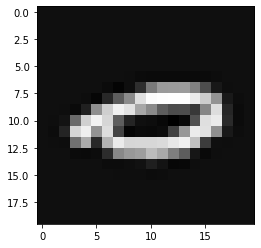

O dígito é: 1
O dígito previsto foi: 6


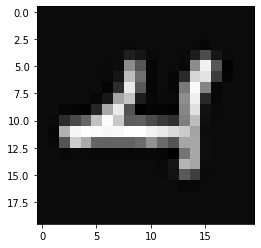

O dígito é: 1
O dígito previsto foi: 6


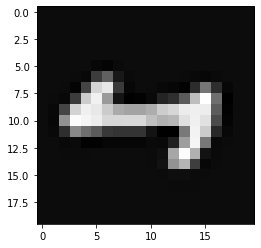

O dígito é: 1
O dígito previsto foi: 8


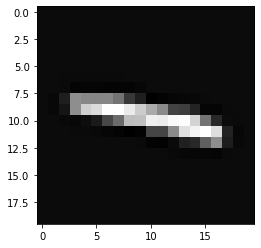

O dígito é: 1
O dígito previsto foi: 3


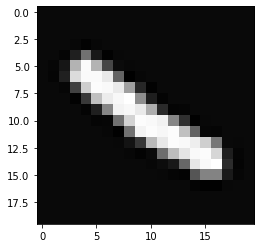

O dígito é: 1
O dígito previsto foi: 8


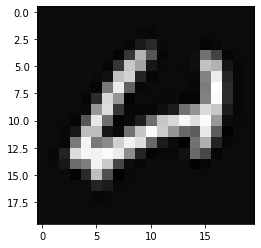

O dígito é: 1
O dígito previsto foi: 8


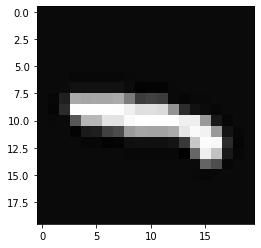

O dígito é: 1
O dígito previsto foi: 8


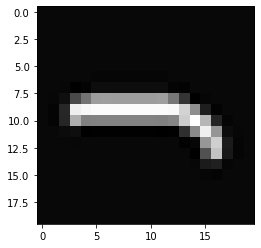

O dígito é: 1
O dígito previsto foi: 8


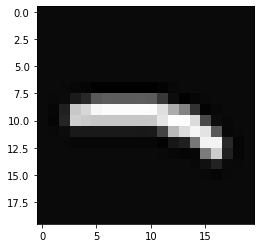

O dígito é: 1
O dígito previsto foi: 8


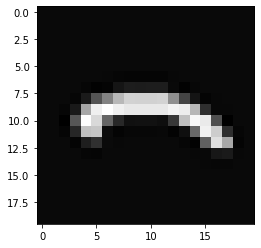

O dígito é: 1
O dígito previsto foi: 8


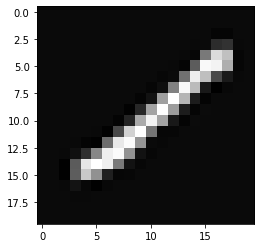

O dígito é: 1
O dígito previsto foi: 8


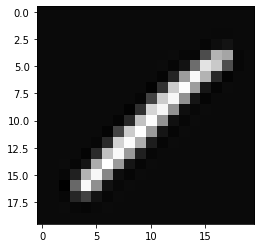

O dígito é: 1
O dígito previsto foi: 8


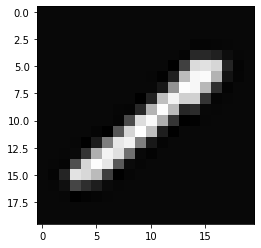

O dígito é: 1
O dígito previsto foi: 3


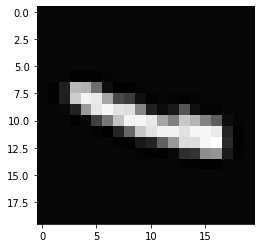

O dígito é: 1
O dígito previsto foi: 8


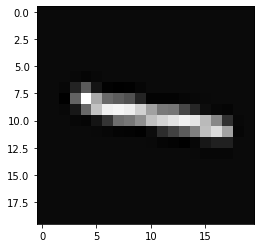

O dígito é: 1
O dígito previsto foi: 8


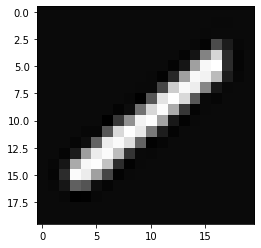

O dígito é: 1
O dígito previsto foi: 8


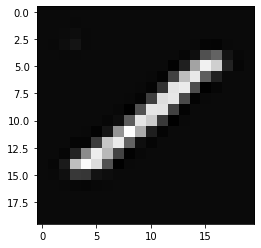

O dígito é: 1
O dígito previsto foi: 8


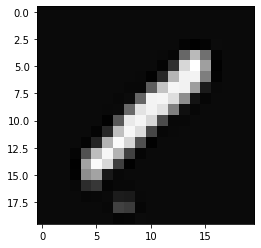

O dígito é: 1
O dígito previsto foi: 8


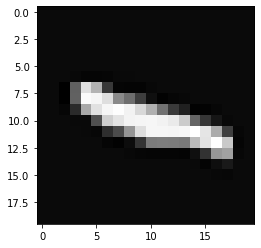

O dígito é: 1
O dígito previsto foi: 8


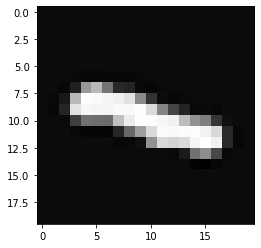

O dígito é: 1
O dígito previsto foi: 8


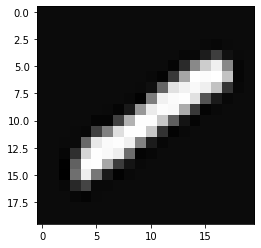

O dígito é: 1
O dígito previsto foi: 2


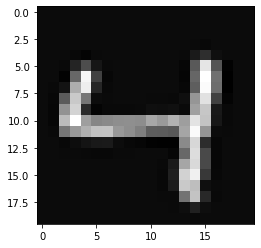

O dígito é: 1
O dígito previsto foi: 8


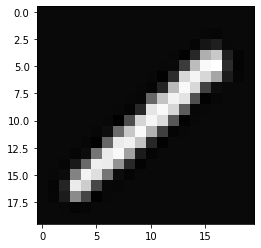

O dígito é: 1
O dígito previsto foi: 3


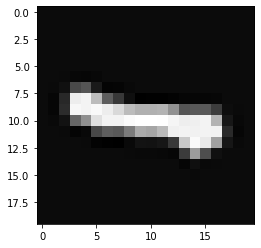

O dígito é: 1
O dígito previsto foi: 8


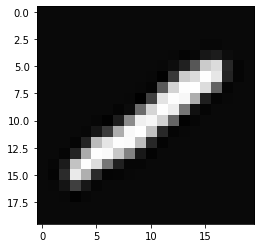

O dígito é: 1
O dígito previsto foi: 8


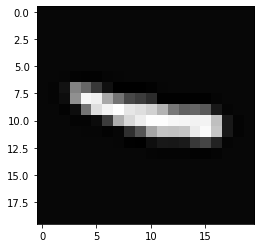

O dígito é: 1
O dígito previsto foi: 8


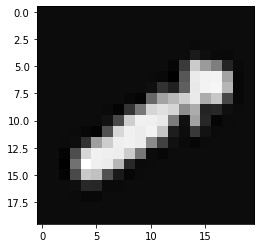

O dígito é: 1
O dígito previsto foi: 8


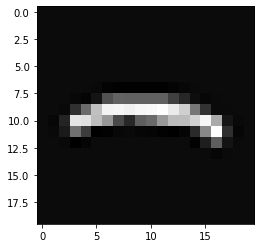

O dígito é: 1
O dígito previsto foi: 8


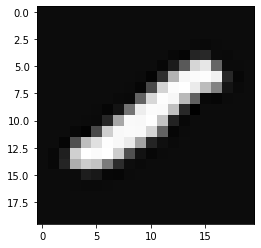

O dígito é: 1
O dígito previsto foi: 8


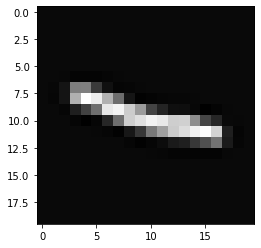

O dígito é: 1
O dígito previsto foi: 8


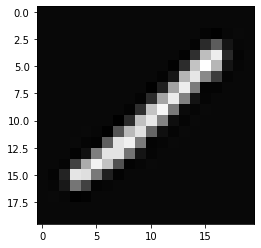

O dígito é: 1
O dígito previsto foi: 8


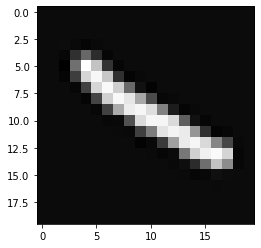

O dígito é: 1
O dígito previsto foi: 8


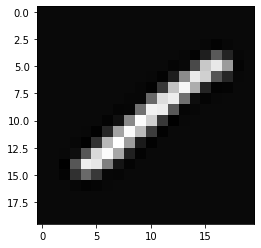

O dígito é: 1
O dígito previsto foi: 8


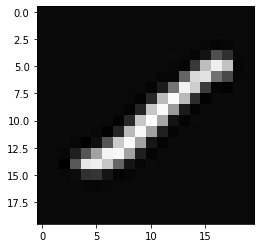

O dígito é: 1
O dígito previsto foi: 8


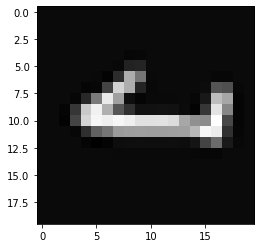

O dígito é: 1
O dígito previsto foi: 6


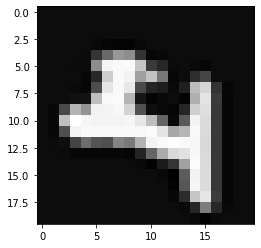

O dígito é: 2
O dígito previsto foi: 3


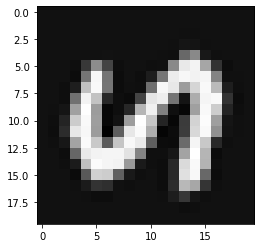

O dígito é: 2
O dígito previsto foi: 7


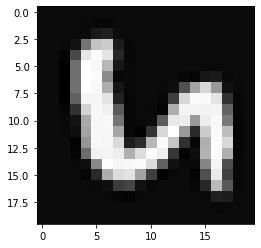

O dígito é: 2
O dígito previsto foi: 3


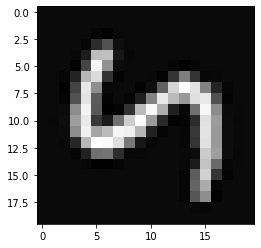

O dígito é: 2
O dígito previsto foi: 6


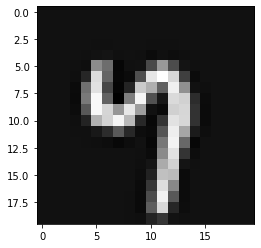

O dígito é: 2
O dígito previsto foi: 7


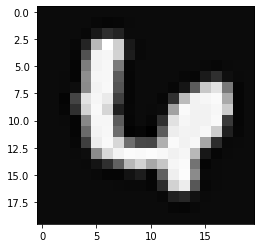

O dígito é: 2
O dígito previsto foi: 0


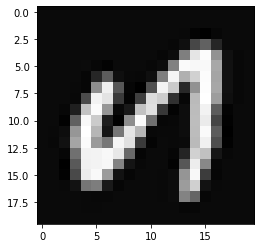

O dígito é: 2
O dígito previsto foi: 0


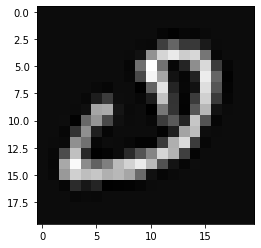

O dígito é: 2
O dígito previsto foi: 1


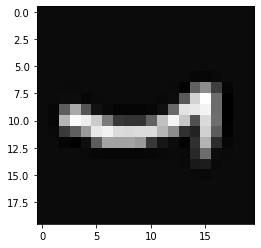

O dígito é: 2
O dígito previsto foi: 6


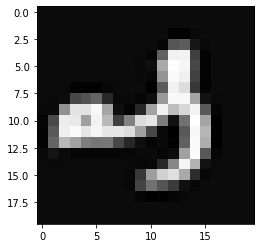

O dígito é: 2
O dígito previsto foi: 0


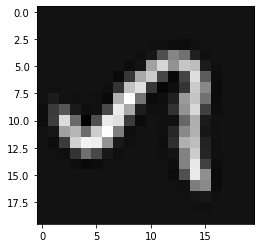

O dígito é: 2
O dígito previsto foi: 7


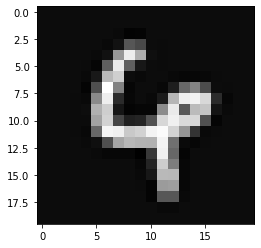

O dígito é: 2
O dígito previsto foi: 3


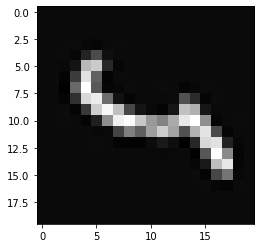

O dígito é: 2
O dígito previsto foi: 0


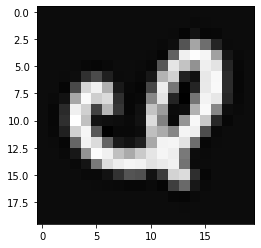

O dígito é: 2
O dígito previsto foi: 6


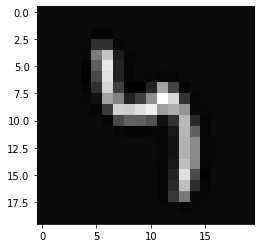

O dígito é: 2
O dígito previsto foi: 6


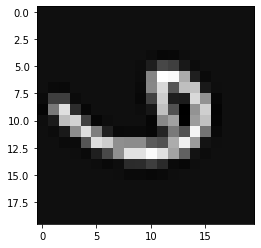

O dígito é: 2
O dígito previsto foi: 1


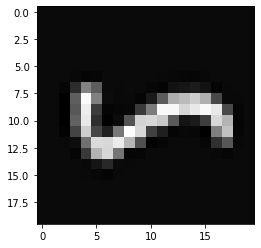

O dígito é: 2
O dígito previsto foi: 0


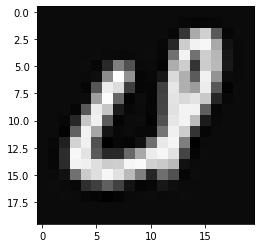

O dígito é: 2
O dígito previsto foi: 1


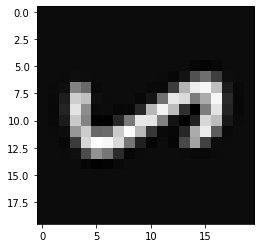

O dígito é: 2
O dígito previsto foi: 1


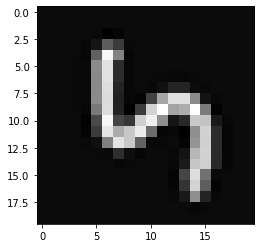

O dígito é: 2
O dígito previsto foi: 7


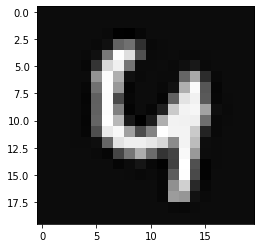

O dígito é: 2
O dígito previsto foi: 1


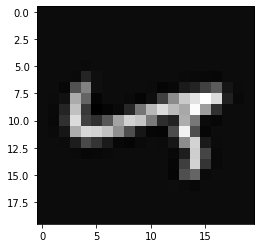

O dígito é: 2
O dígito previsto foi: 4


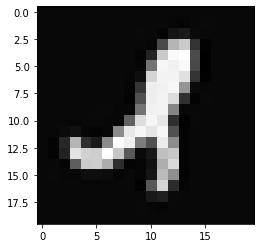

O dígito é: 2
O dígito previsto foi: 3


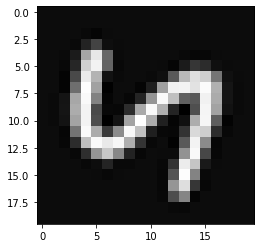

O dígito é: 2
O dígito previsto foi: 0


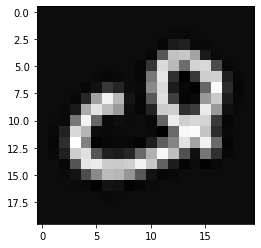

O dígito é: 2
O dígito previsto foi: 9


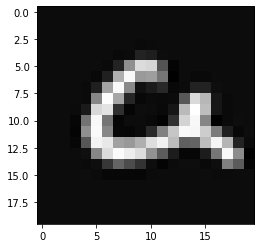

O dígito é: 2
O dígito previsto foi: 4


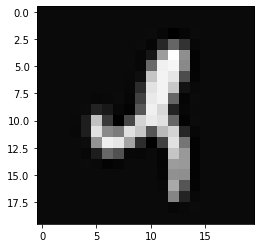

O dígito é: 2
O dígito previsto foi: 3


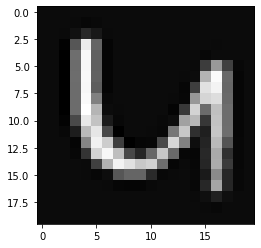

O dígito é: 2
O dígito previsto foi: 3


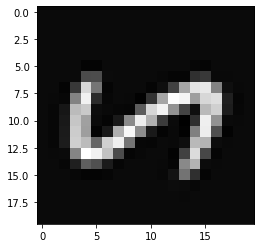

O dígito é: 2
O dígito previsto foi: 8


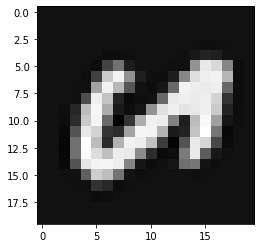

O dígito é: 2
O dígito previsto foi: 3


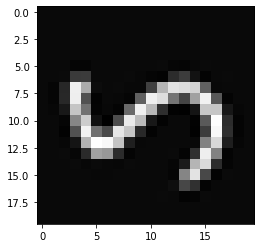

O dígito é: 2
O dígito previsto foi: 8


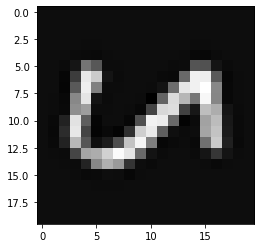

O dígito é: 2
O dígito previsto foi: 0


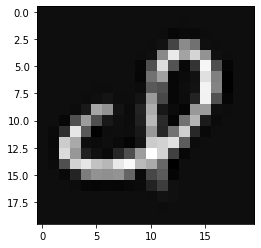

O dígito é: 2
O dígito previsto foi: 3


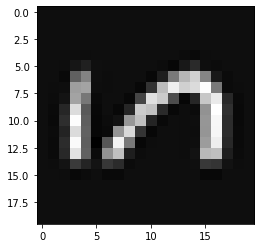

O dígito é: 2
O dígito previsto foi: 6


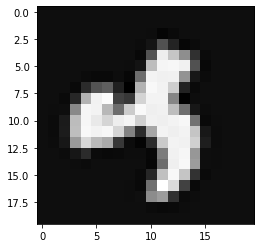

O dígito é: 2
O dígito previsto foi: 1


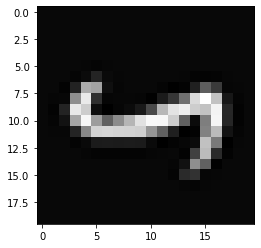

O dígito é: 2
O dígito previsto foi: 0


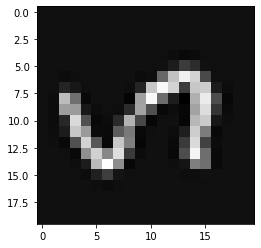

O dígito é: 2
O dígito previsto foi: 1


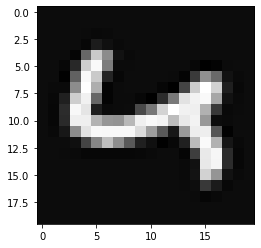

O dígito é: 2
O dígito previsto foi: 6


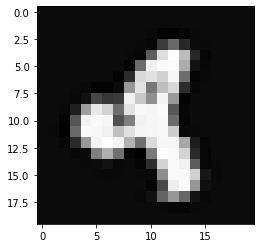

O dígito é: 2
O dígito previsto foi: 6


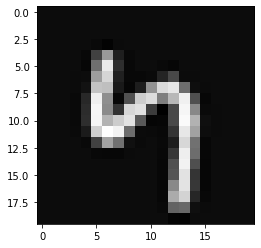

O dígito é: 2
O dígito previsto foi: 1


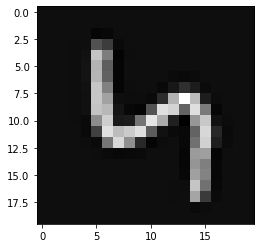

O dígito é: 2
O dígito previsto foi: 6


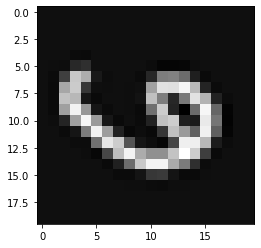

O dígito é: 2
O dígito previsto foi: 6


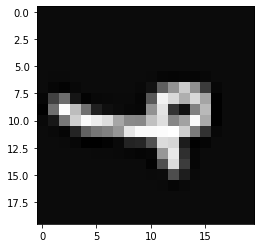

O dígito é: 2
O dígito previsto foi: 1


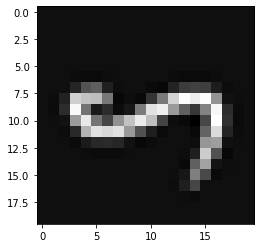

O dígito é: 2
O dígito previsto foi: 4


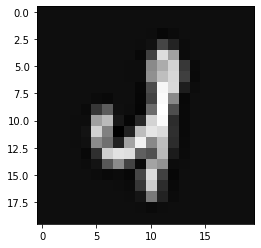

O dígito é: 2
O dígito previsto foi: 3


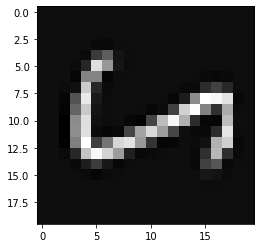

O dígito é: 2
O dígito previsto foi: 8


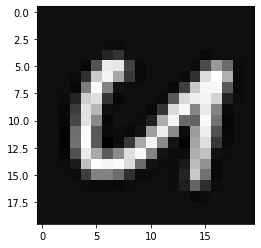

O dígito é: 2
O dígito previsto foi: 8


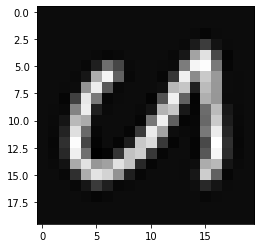

O dígito é: 2
O dígito previsto foi: 0


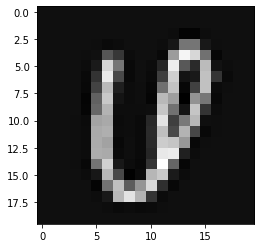

O dígito é: 2
O dígito previsto foi: 3


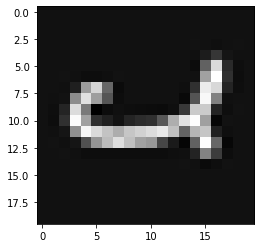

O dígito é: 2
O dígito previsto foi: 0


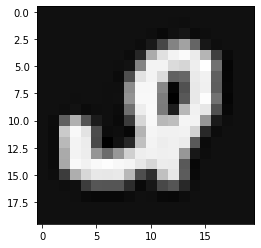

O dígito é: 2
O dígito previsto foi: 3


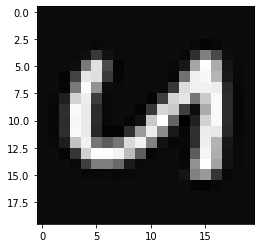

O dígito é: 2
O dígito previsto foi: 3


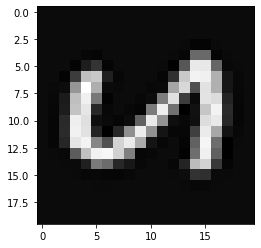

O dígito é: 2
O dígito previsto foi: 6


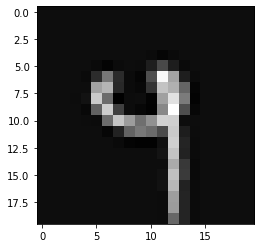

O dígito é: 2
O dígito previsto foi: 6


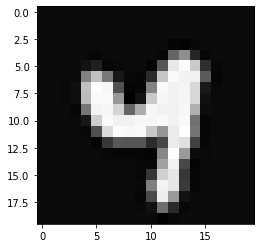

O dígito é: 2
O dígito previsto foi: 6


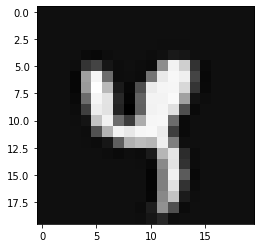

O dígito é: 2
O dígito previsto foi: 0


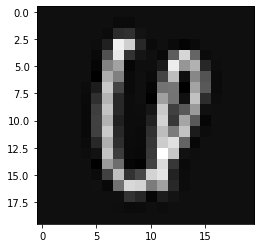

O dígito é: 2
O dígito previsto foi: 3


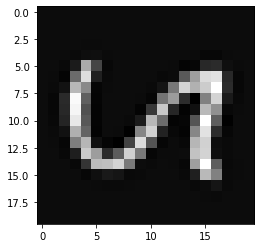

O dígito é: 2
O dígito previsto foi: 8


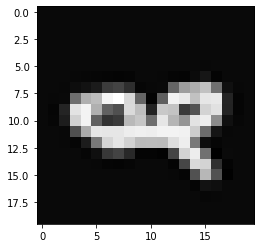

O dígito é: 2
O dígito previsto foi: 6


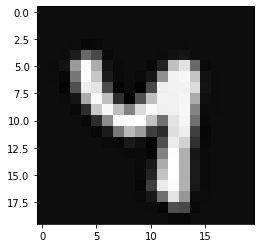

O dígito é: 2
O dígito previsto foi: 1


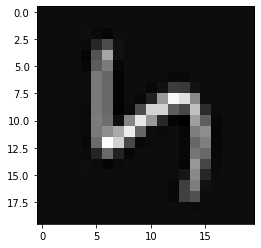

O dígito é: 2
O dígito previsto foi: 8


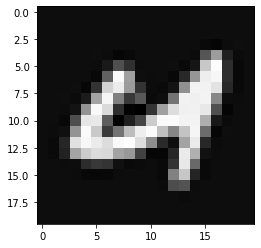

O dígito é: 2
O dígito previsto foi: 6


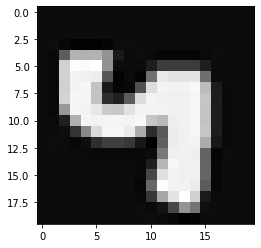

O dígito é: 2
O dígito previsto foi: 3


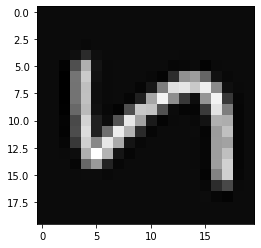

O dígito é: 2
O dígito previsto foi: 0


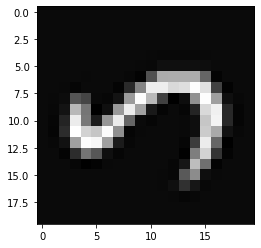

O dígito é: 2
O dígito previsto foi: 6


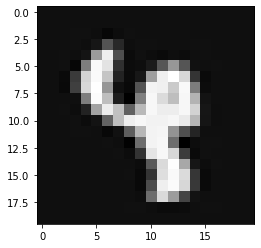

O dígito é: 2
O dígito previsto foi: 8


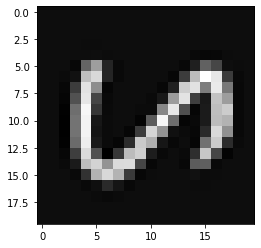

O dígito é: 2
O dígito previsto foi: 3


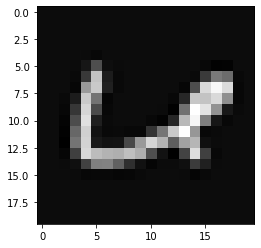

O dígito é: 2
O dígito previsto foi: 6


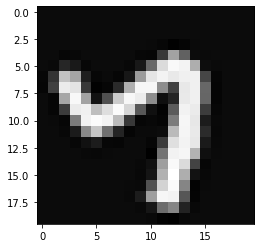

O dígito é: 2
O dígito previsto foi: 3


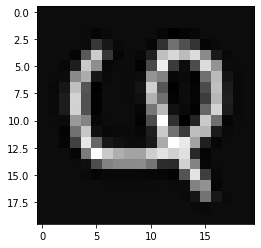

O dígito é: 2
O dígito previsto foi: 3


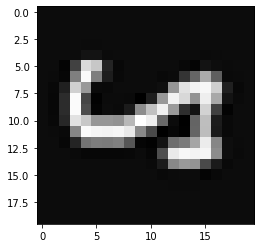

O dígito é: 2
O dígito previsto foi: 0


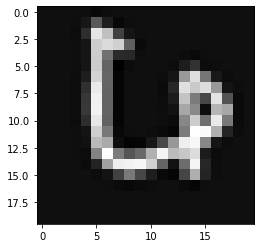

O dígito é: 2
O dígito previsto foi: 3


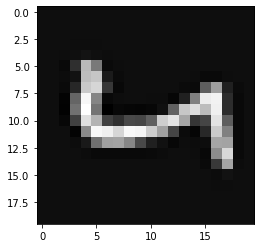

O dígito é: 2
O dígito previsto foi: 6


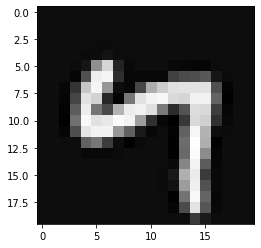

O dígito é: 2
O dígito previsto foi: 0


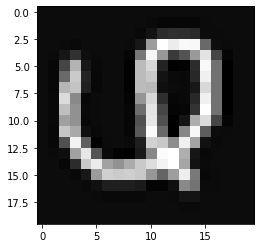

O dígito é: 2
O dígito previsto foi: 3


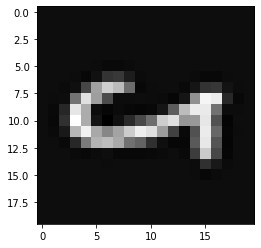

O dígito é: 2
O dígito previsto foi: 0


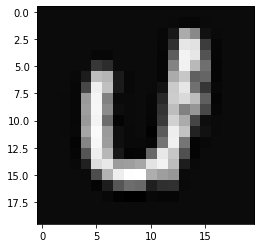

O dígito é: 2
O dígito previsto foi: 6


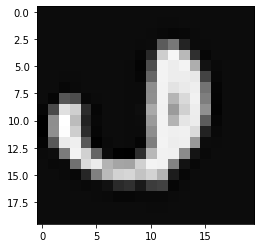

O dígito é: 2
O dígito previsto foi: 8


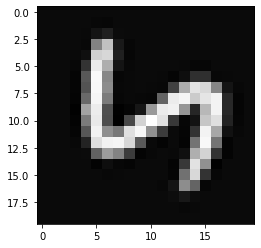

O dígito é: 2
O dígito previsto foi: 8


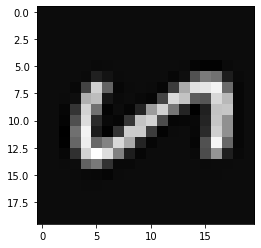

O dígito é: 2
O dígito previsto foi: 0


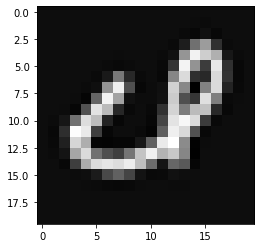

O dígito é: 2
O dígito previsto foi: 3


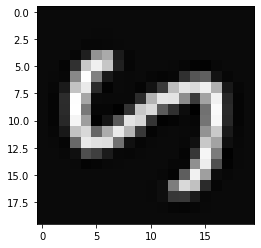

O dígito é: 2
O dígito previsto foi: 3


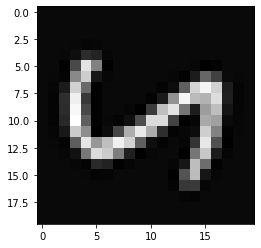

O dígito é: 2
O dígito previsto foi: 0


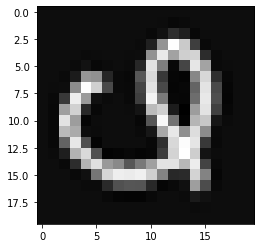

O dígito é: 2
O dígito previsto foi: 0


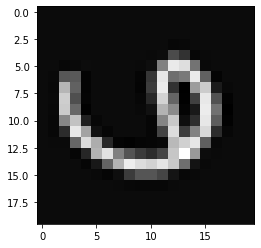

O dígito é: 2
O dígito previsto foi: 6


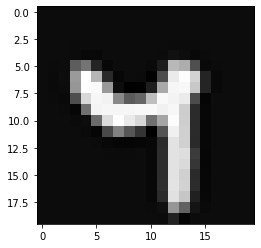

O dígito é: 2
O dígito previsto foi: 8


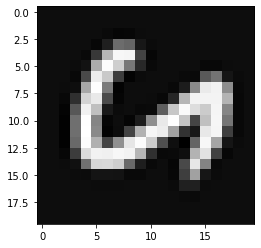

O dígito é: 2
O dígito previsto foi: 6


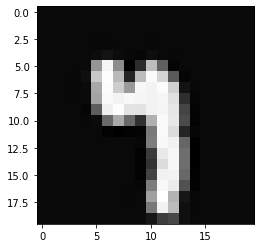

O dígito é: 2
O dígito previsto foi: 0


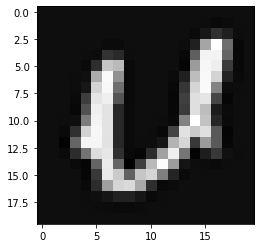

O dígito é: 2
O dígito previsto foi: 3


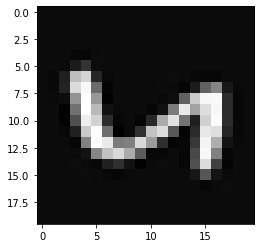

O dígito é: 2
O dígito previsto foi: 0


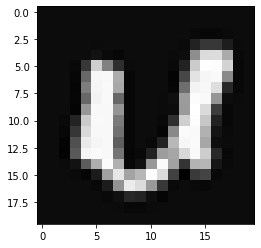

O dígito é: 2
O dígito previsto foi: 8


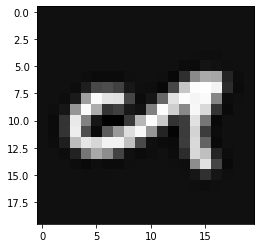

O dígito é: 2
O dígito previsto foi: 8


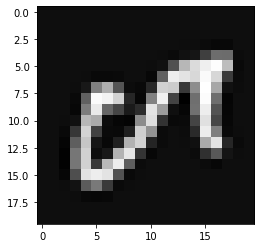

O dígito é: 2
O dígito previsto foi: 8


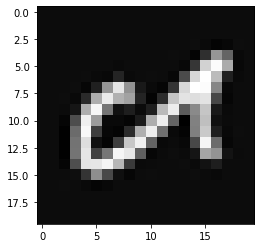

O dígito é: 2
O dígito previsto foi: 8


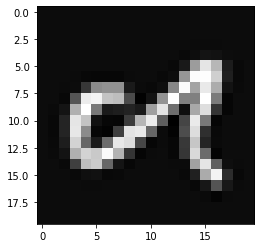

O dígito é: 2
O dígito previsto foi: 8


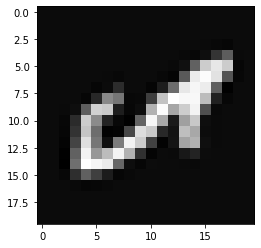

O dígito é: 2
O dígito previsto foi: 8


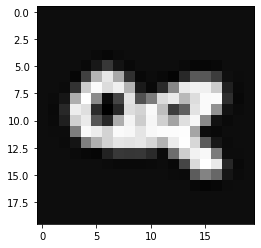

O dígito é: 2
O dígito previsto foi: 3


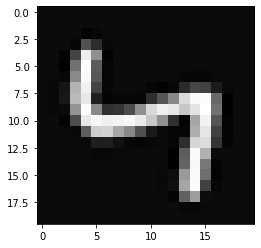

O dígito é: 2
O dígito previsto foi: 6


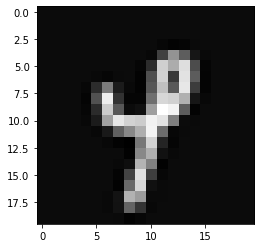

O dígito é: 2
O dígito previsto foi: 6


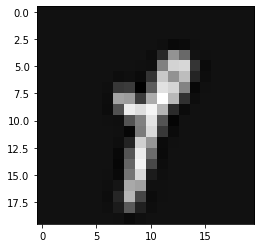

O dígito é: 2
O dígito previsto foi: 6


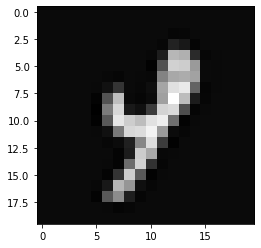

O dígito é: 2
O dígito previsto foi: 3


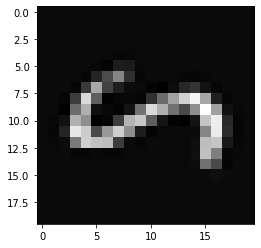

O dígito é: 2
O dígito previsto foi: 6


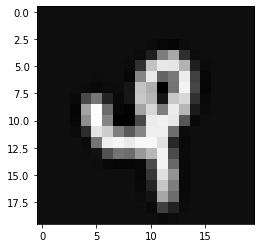

O dígito é: 2
O dígito previsto foi: 4


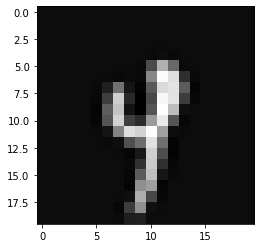

O dígito é: 2
O dígito previsto foi: 1


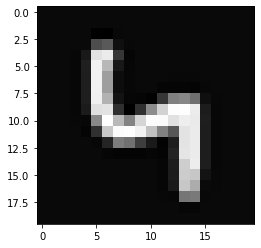

O dígito é: 2
O dígito previsto foi: 8


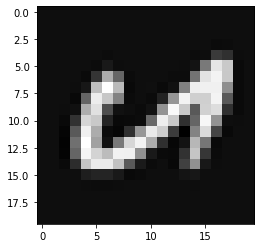

O dígito é: 2
O dígito previsto foi: 8


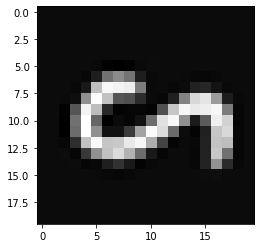

O dígito é: 2
O dígito previsto foi: 3


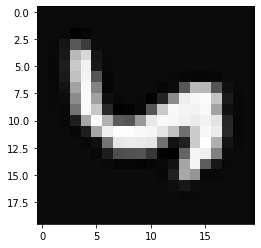

O dígito é: 2
O dígito previsto foi: 1


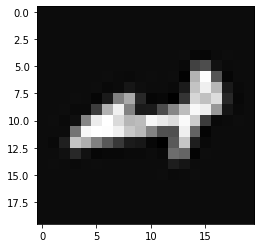

O dígito é: 2
O dígito previsto foi: 3


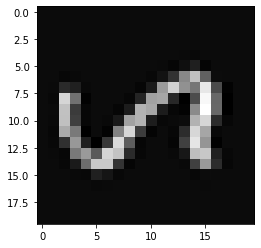

O dígito é: 2
O dígito previsto foi: 3


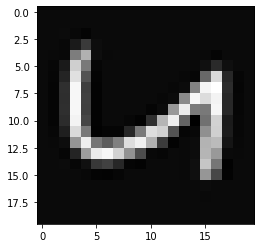

O dígito é: 2
O dígito previsto foi: 6


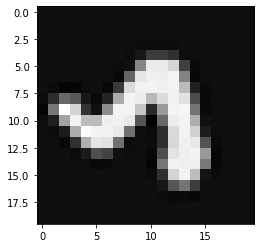

O dígito é: 2
O dígito previsto foi: 6


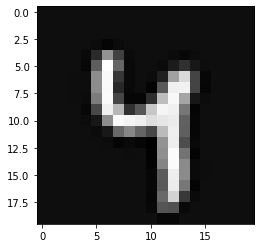

O dígito é: 2
O dígito previsto foi: 6


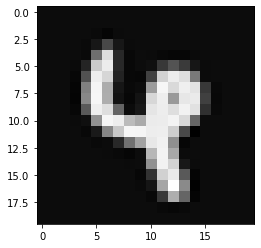

O dígito é: 2
O dígito previsto foi: 6


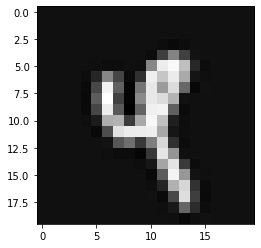

O dígito é: 2
O dígito previsto foi: 7


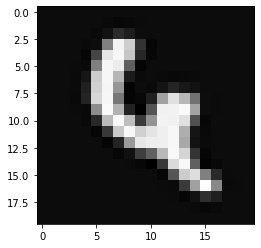

O dígito é: 2
O dígito previsto foi: 6


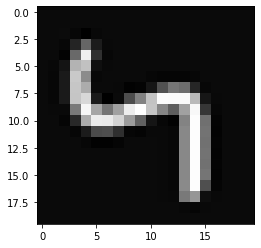

O dígito é: 2
O dígito previsto foi: 0


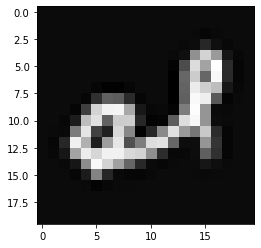

O dígito é: 2
O dígito previsto foi: 0


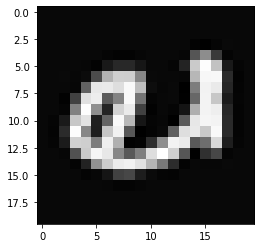

O dígito é: 2
O dígito previsto foi: 8


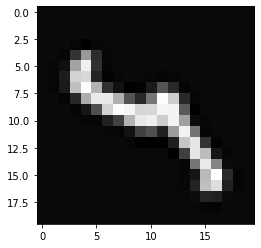

O dígito é: 2
O dígito previsto foi: 0


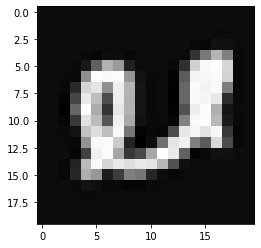

O dígito é: 2
O dígito previsto foi: 0


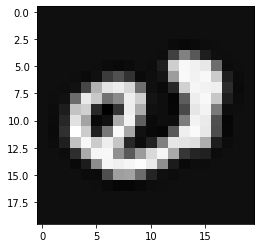

O dígito é: 2
O dígito previsto foi: 0


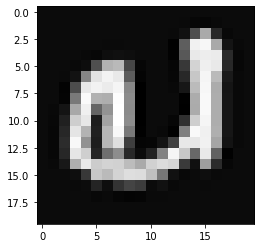

O dígito é: 3
O dígito previsto foi: 8


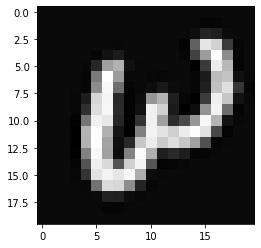

O dígito é: 3
O dígito previsto foi: 8


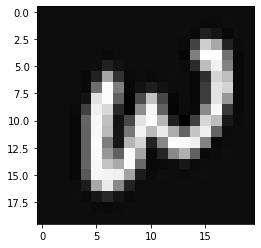

O dígito é: 3
O dígito previsto foi: 0


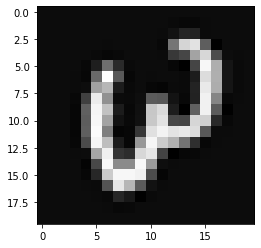

O dígito é: 3
O dígito previsto foi: 5


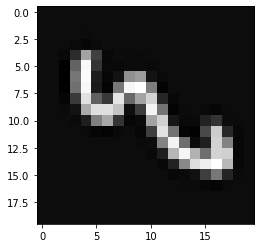

O dígito é: 3
O dígito previsto foi: 6


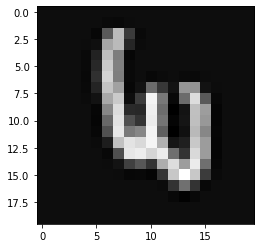

O dígito é: 3
O dígito previsto foi: 0


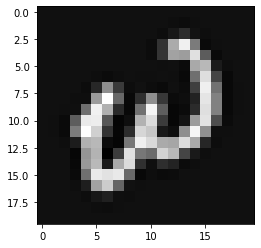

O dígito é: 3
O dígito previsto foi: 0


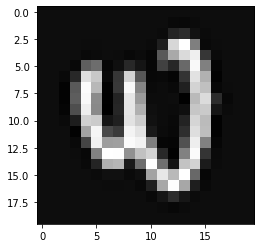

O dígito é: 3
O dígito previsto foi: 9


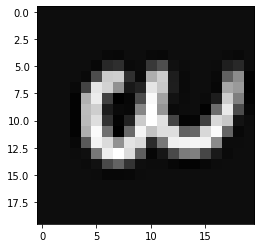

O dígito é: 3
O dígito previsto foi: 7


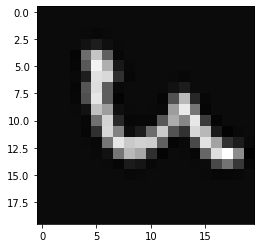

O dígito é: 3
O dígito previsto foi: 8


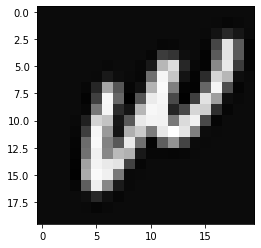

O dígito é: 3
O dígito previsto foi: 2


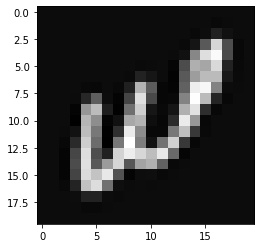

O dígito é: 3
O dígito previsto foi: 8


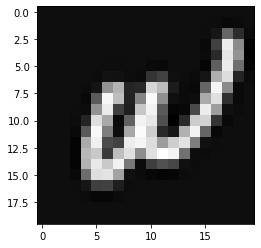

O dígito é: 3
O dígito previsto foi: 8


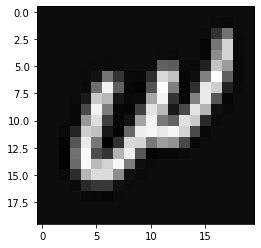

O dígito é: 3
O dígito previsto foi: 0


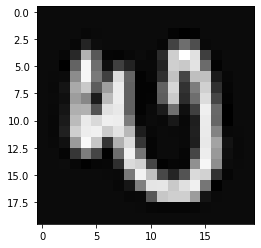

O dígito é: 3
O dígito previsto foi: 6


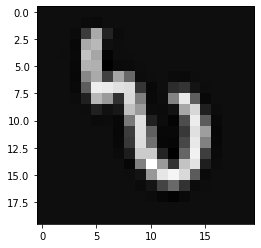

O dígito é: 3
O dígito previsto foi: 0


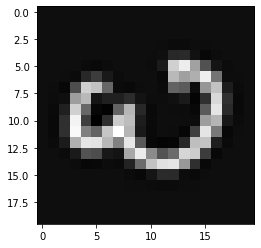

O dígito é: 3
O dígito previsto foi: 9


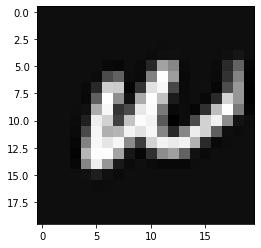

O dígito é: 3
O dígito previsto foi: 8


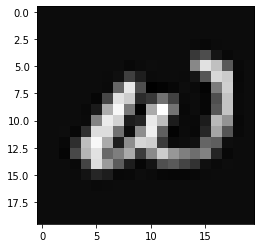

O dígito é: 3
O dígito previsto foi: 0


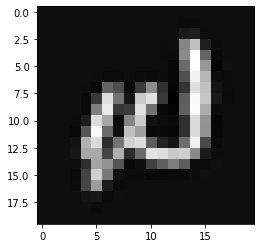

O dígito é: 3
O dígito previsto foi: 0


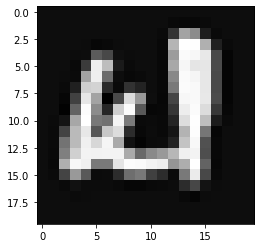

O dígito é: 3
O dígito previsto foi: 0


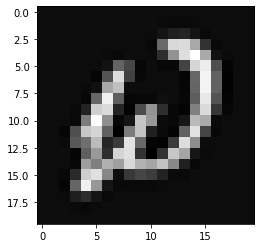

O dígito é: 3
O dígito previsto foi: 0


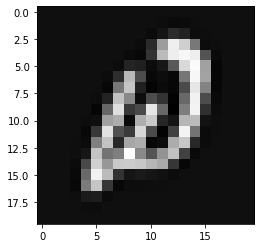

O dígito é: 3
O dígito previsto foi: 2


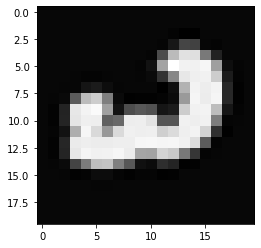

O dígito é: 3
O dígito previsto foi: 8


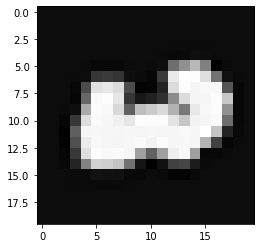

O dígito é: 3
O dígito previsto foi: 9


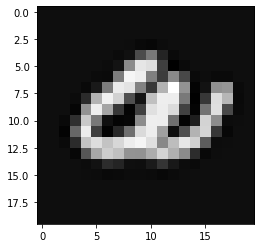

O dígito é: 3
O dígito previsto foi: 5


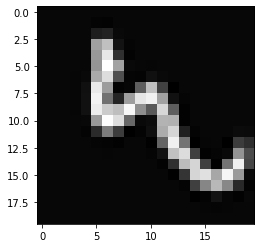

O dígito é: 3
O dígito previsto foi: 2


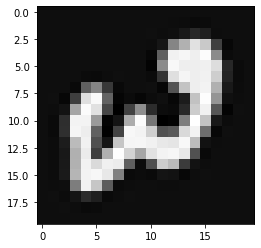

O dígito é: 3
O dígito previsto foi: 2


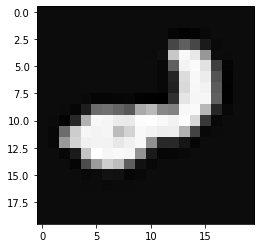

O dígito é: 3
O dígito previsto foi: 2


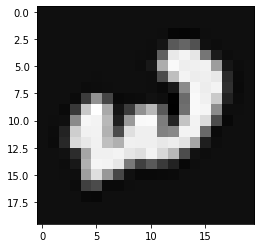

O dígito é: 3
O dígito previsto foi: 2


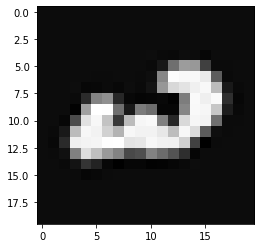

O dígito é: 3
O dígito previsto foi: 0


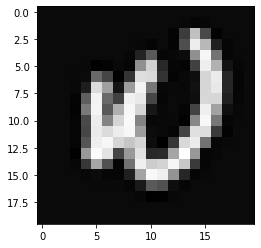

O dígito é: 3
O dígito previsto foi: 0


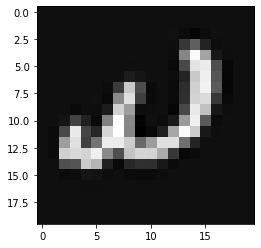

O dígito é: 3
O dígito previsto foi: 2


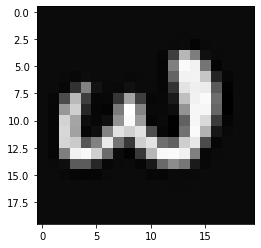

O dígito é: 3
O dígito previsto foi: 0


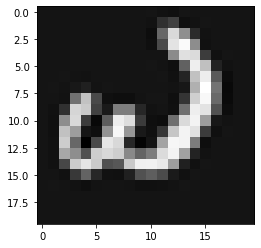

O dígito é: 3
O dígito previsto foi: 0


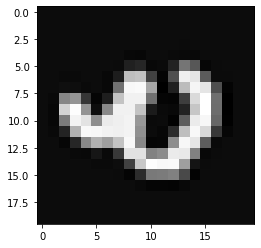

O dígito é: 3
O dígito previsto foi: 4


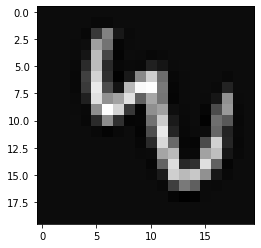

O dígito é: 3
O dígito previsto foi: 7


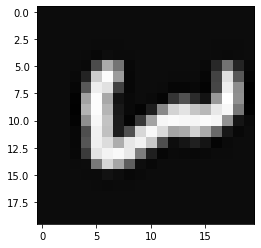

O dígito é: 3
O dígito previsto foi: 1


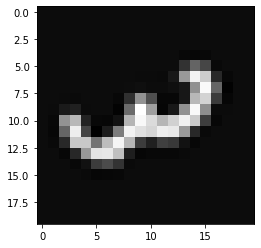

O dígito é: 3
O dígito previsto foi: 1


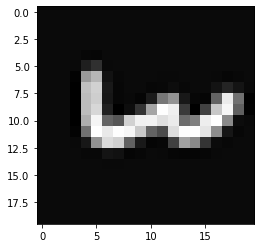

O dígito é: 3
O dígito previsto foi: 8


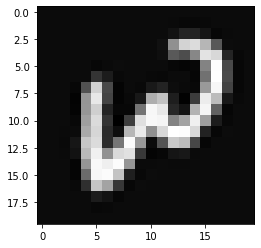

O dígito é: 3
O dígito previsto foi: 2


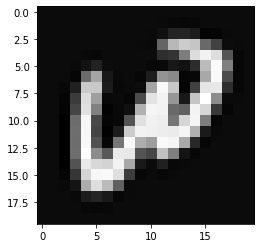

O dígito é: 3
O dígito previsto foi: 8


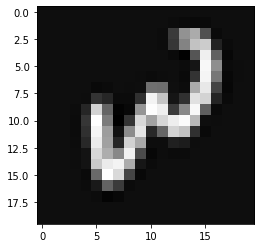

O dígito é: 3
O dígito previsto foi: 2


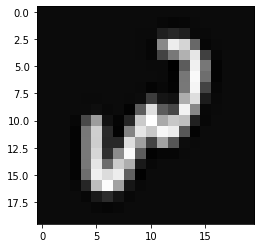

O dígito é: 3
O dígito previsto foi: 8


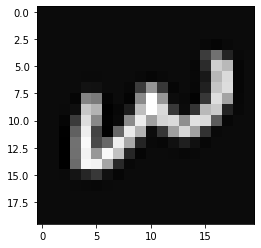

O dígito é: 3
O dígito previsto foi: 8


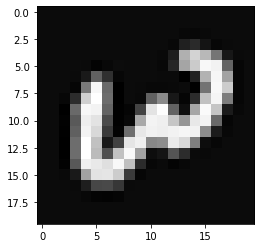

O dígito é: 3
O dígito previsto foi: 8


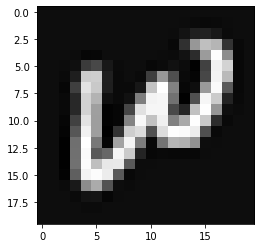

O dígito é: 3
O dígito previsto foi: 8


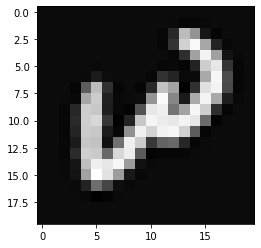

O dígito é: 3
O dígito previsto foi: 8


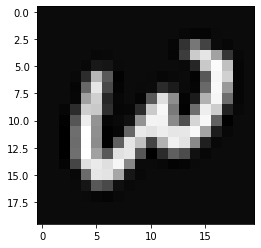

O dígito é: 3
O dígito previsto foi: 8


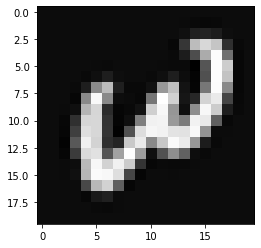

O dígito é: 3
O dígito previsto foi: 8


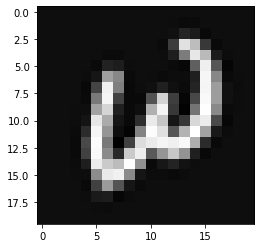

O dígito é: 3
O dígito previsto foi: 1


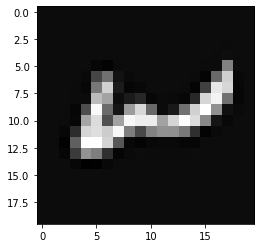

O dígito é: 3
O dígito previsto foi: 0


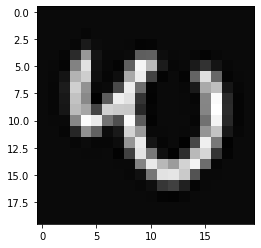

O dígito é: 3
O dígito previsto foi: 2


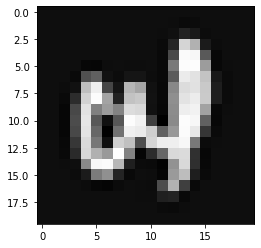

O dígito é: 3
O dígito previsto foi: 7


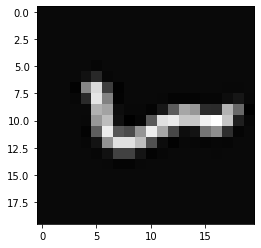

O dígito é: 3
O dígito previsto foi: 8


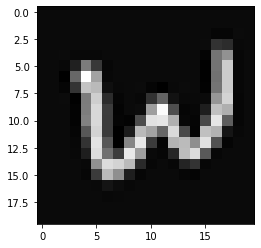

O dígito é: 3
O dígito previsto foi: 0


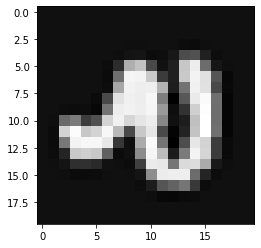

O dígito é: 3
O dígito previsto foi: 8


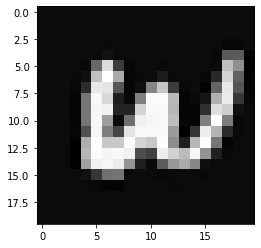

O dígito é: 3
O dígito previsto foi: 9


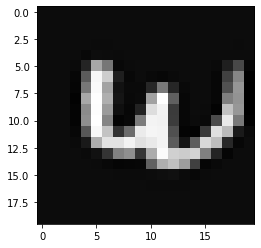

O dígito é: 3
O dígito previsto foi: 8


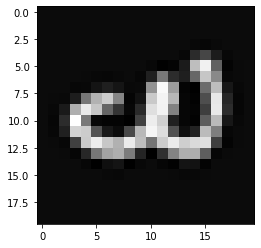

O dígito é: 3
O dígito previsto foi: 8


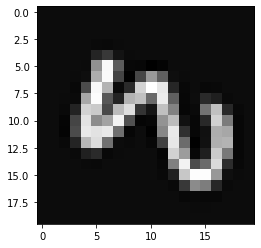

O dígito é: 3
O dígito previsto foi: 8


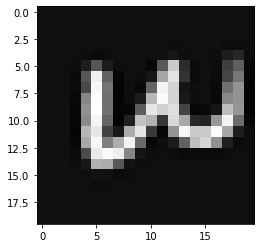

O dígito é: 3
O dígito previsto foi: 8


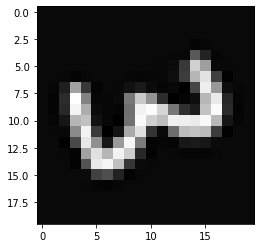

O dígito é: 3
O dígito previsto foi: 2


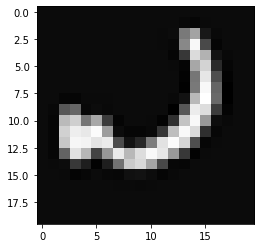

O dígito é: 3
O dígito previsto foi: 8


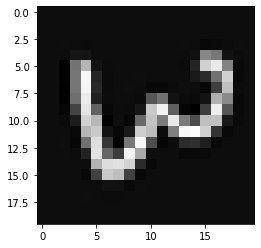

O dígito é: 3
O dígito previsto foi: 7


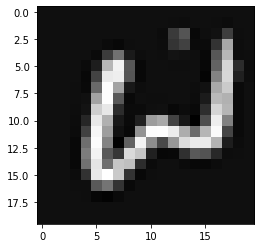

O dígito é: 3
O dígito previsto foi: 0


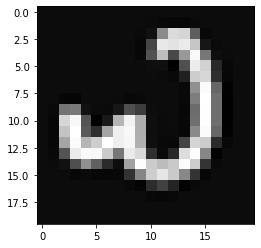

O dígito é: 3
O dígito previsto foi: 8


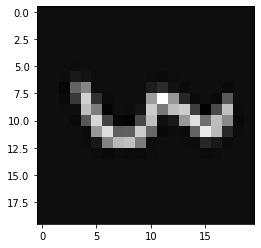

O dígito é: 3
O dígito previsto foi: 0


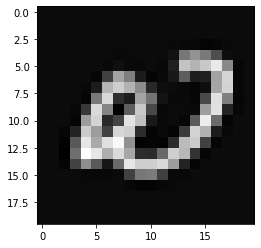

O dígito é: 3
O dígito previsto foi: 9


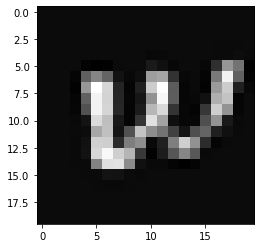

O dígito é: 3
O dígito previsto foi: 2


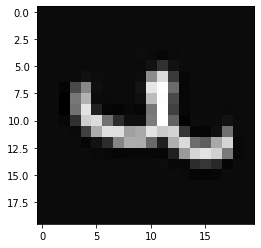

O dígito é: 3
O dígito previsto foi: 0


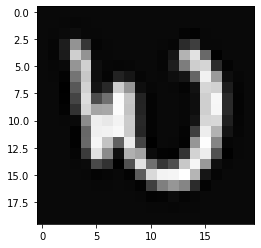

O dígito é: 3
O dígito previsto foi: 0


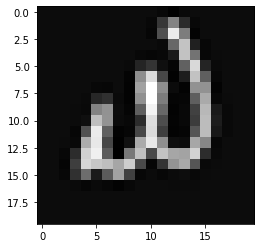

O dígito é: 3
O dígito previsto foi: 0


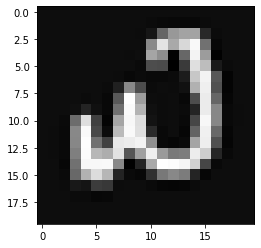

O dígito é: 3
O dígito previsto foi: 2


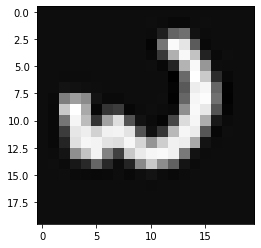

O dígito é: 3
O dígito previsto foi: 0


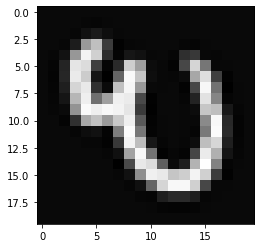

O dígito é: 3
O dígito previsto foi: 9


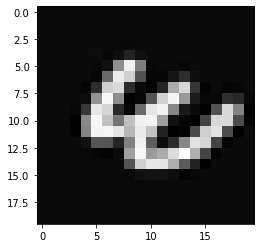

O dígito é: 3
O dígito previsto foi: 8


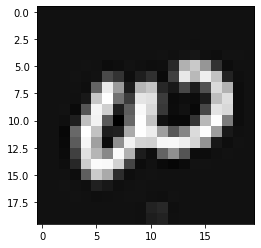

O dígito é: 3
O dígito previsto foi: 8


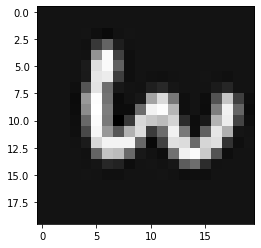

O dígito é: 3
O dígito previsto foi: 8


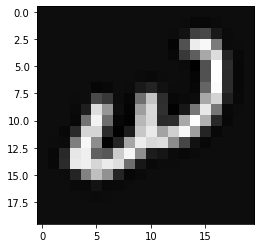

O dígito é: 3
O dígito previsto foi: 8


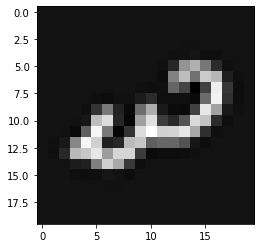

O dígito é: 3
O dígito previsto foi: 8


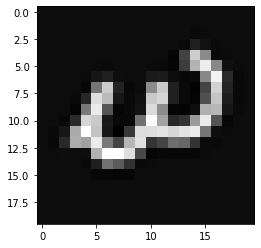

O dígito é: 3
O dígito previsto foi: 6


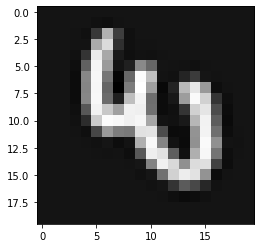

O dígito é: 3
O dígito previsto foi: 1


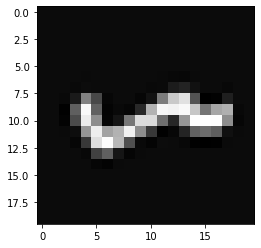

O dígito é: 3
O dígito previsto foi: 6


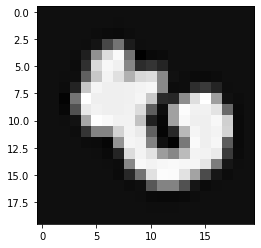

O dígito é: 3
O dígito previsto foi: 0


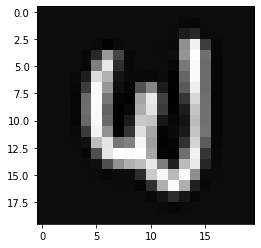

O dígito é: 3
O dígito previsto foi: 7


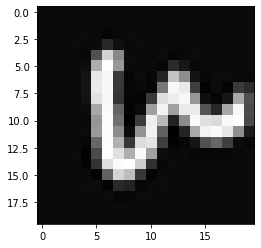

O dígito é: 3
O dígito previsto foi: 8


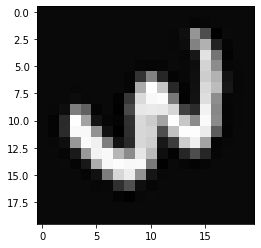

O dígito é: 3
O dígito previsto foi: 0


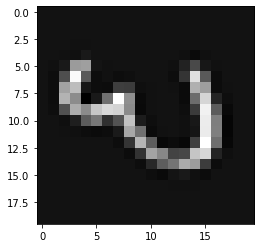

O dígito é: 3
O dígito previsto foi: 7


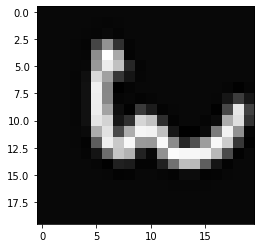

O dígito é: 3
O dígito previsto foi: 8


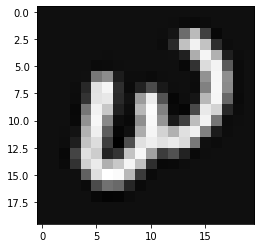

O dígito é: 4
O dígito previsto foi: 9


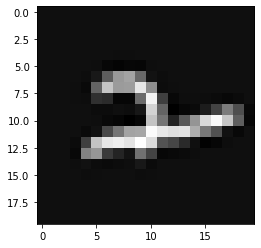

O dígito é: 4
O dígito previsto foi: 1


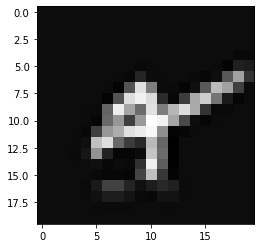

O dígito é: 4
O dígito previsto foi: 0


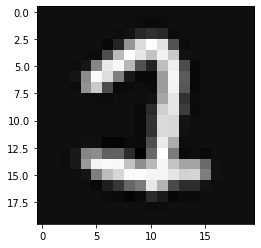

O dígito é: 4
O dígito previsto foi: 8


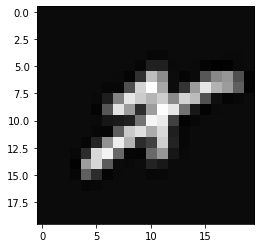

O dígito é: 4
O dígito previsto foi: 0


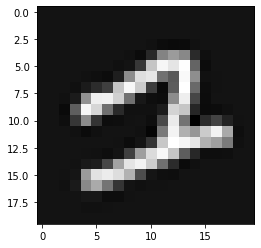

O dígito é: 4
O dígito previsto foi: 6


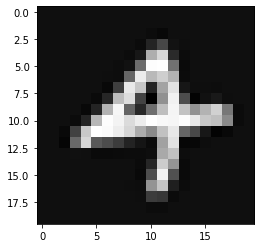

O dígito é: 4
O dígito previsto foi: 6


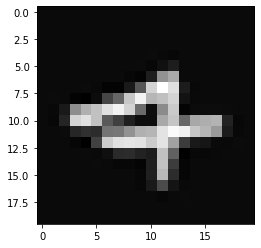

O dígito é: 4
O dígito previsto foi: 9


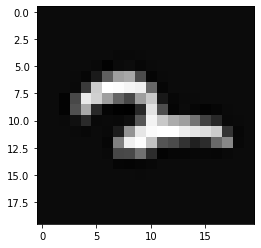

O dígito é: 4
O dígito previsto foi: 9


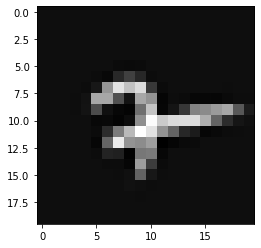

O dígito é: 4
O dígito previsto foi: 6


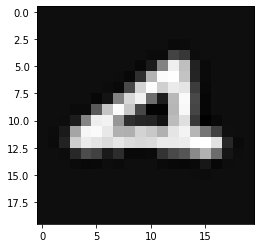

O dígito é: 4
O dígito previsto foi: 3


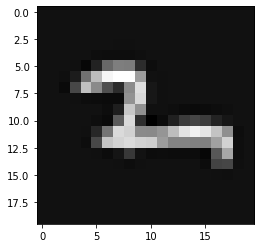

O dígito é: 4
O dígito previsto foi: 8


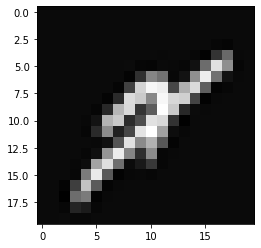

O dígito é: 4
O dígito previsto foi: 6


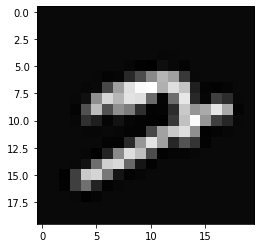

O dígito é: 4
O dígito previsto foi: 0


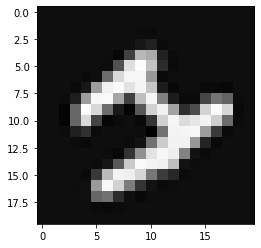

O dígito é: 4
O dígito previsto foi: 0


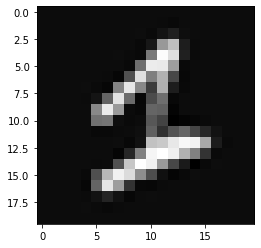

O dígito é: 4
O dígito previsto foi: 8


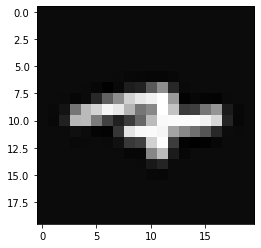

O dígito é: 4
O dígito previsto foi: 9


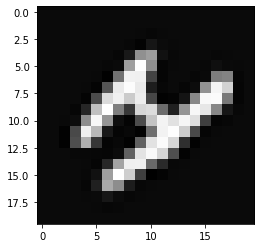

O dígito é: 4
O dígito previsto foi: 9


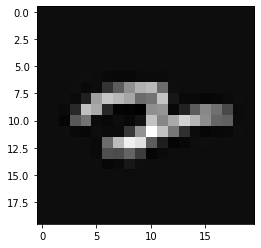

O dígito é: 4
O dígito previsto foi: 0


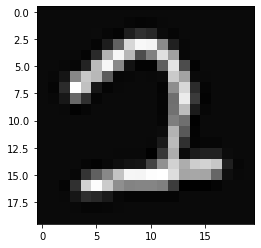

O dígito é: 4
O dígito previsto foi: 6


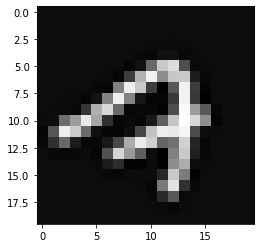

O dígito é: 4
O dígito previsto foi: 9


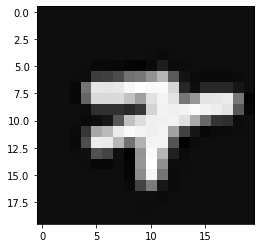

O dígito é: 4
O dígito previsto foi: 6


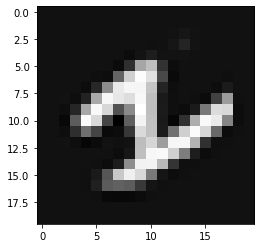

O dígito é: 4
O dígito previsto foi: 3


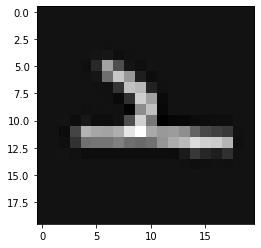

O dígito é: 4
O dígito previsto foi: 6


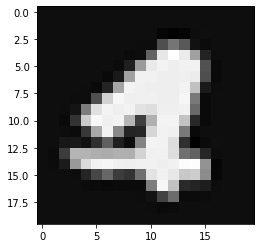

O dígito é: 4
O dígito previsto foi: 1


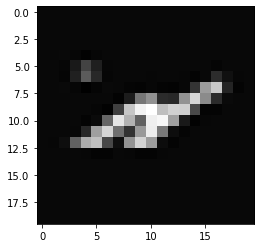

O dígito é: 4
O dígito previsto foi: 9


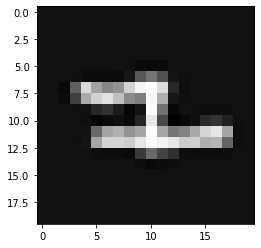

O dígito é: 4
O dígito previsto foi: 6


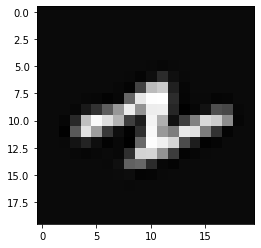

O dígito é: 4
O dígito previsto foi: 8


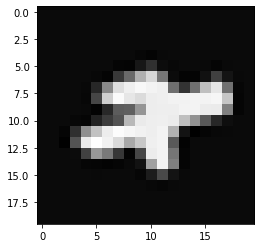

O dígito é: 4
O dígito previsto foi: 0


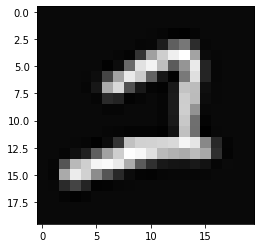

O dígito é: 4
O dígito previsto foi: 2


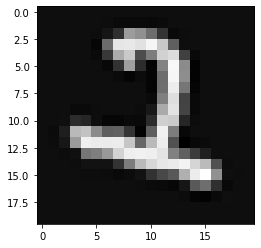

O dígito é: 4
O dígito previsto foi: 1


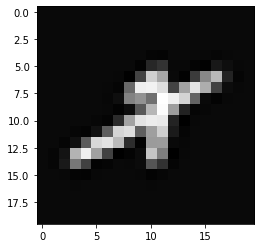

O dígito é: 4
O dígito previsto foi: 8


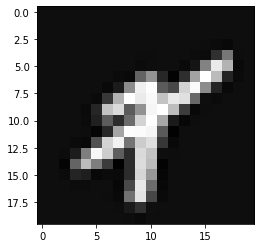

O dígito é: 4
O dígito previsto foi: 1


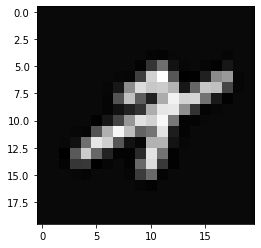

O dígito é: 4
O dígito previsto foi: 8


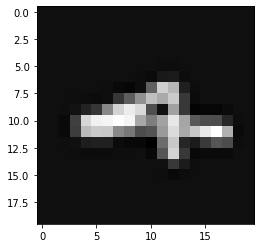

O dígito é: 4
O dígito previsto foi: 9


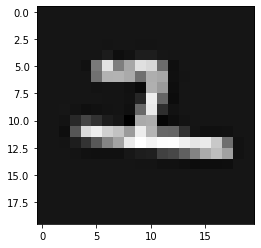

O dígito é: 4
O dígito previsto foi: 9


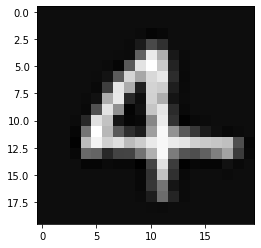

O dígito é: 4
O dígito previsto foi: 9


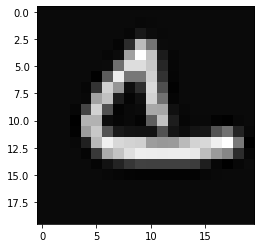

O dígito é: 4
O dígito previsto foi: 1


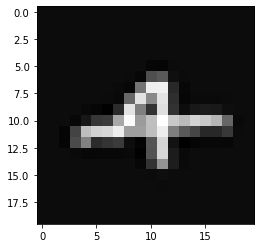

O dígito é: 4
O dígito previsto foi: 9


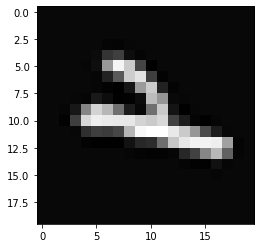

O dígito é: 4
O dígito previsto foi: 6


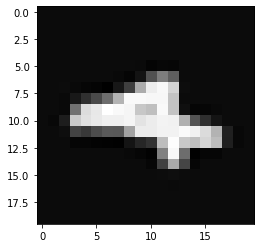

O dígito é: 4
O dígito previsto foi: 2


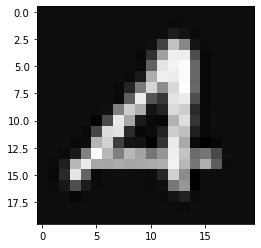

O dígito é: 4
O dígito previsto foi: 6


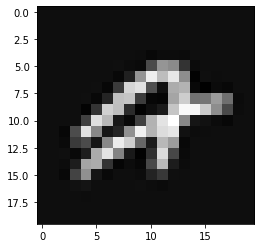

O dígito é: 4
O dígito previsto foi: 9


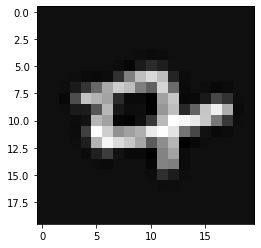

O dígito é: 4
O dígito previsto foi: 9


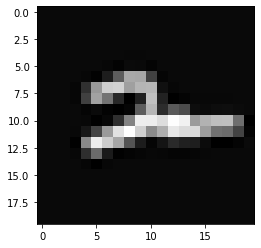

O dígito é: 4
O dígito previsto foi: 9


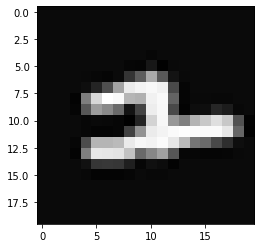

O dígito é: 4
O dígito previsto foi: 6


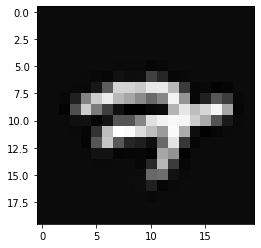

O dígito é: 4
O dígito previsto foi: 0


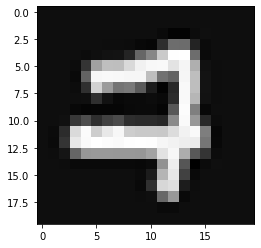

O dígito é: 4
O dígito previsto foi: 9


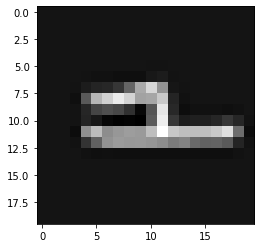

O dígito é: 4
O dígito previsto foi: 3


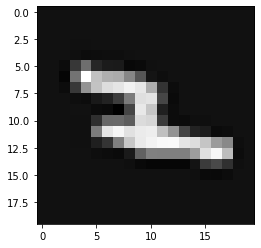

O dígito é: 4
O dígito previsto foi: 0


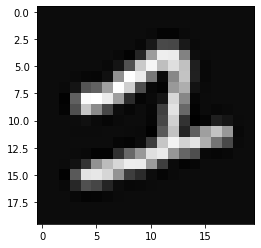

O dígito é: 4
O dígito previsto foi: 9


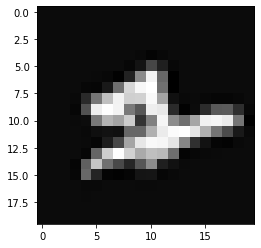

O dígito é: 4
O dígito previsto foi: 9


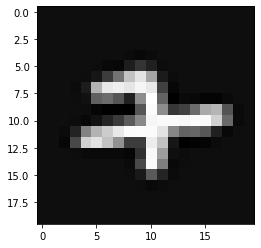

O dígito é: 4
O dígito previsto foi: 9


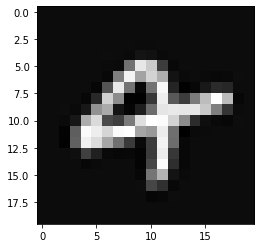

O dígito é: 4
O dígito previsto foi: 6


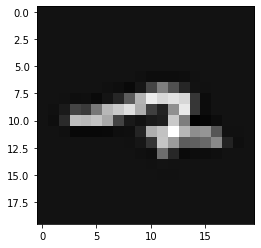

O dígito é: 4
O dígito previsto foi: 0


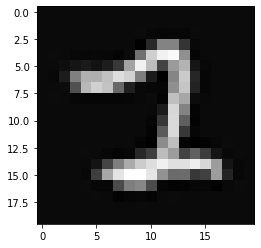

O dígito é: 4
O dígito previsto foi: 9


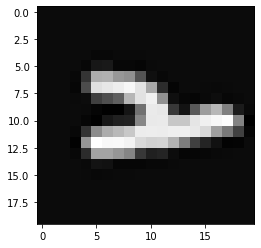

O dígito é: 4
O dígito previsto foi: 9


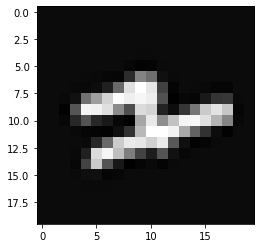

O dígito é: 4
O dígito previsto foi: 9


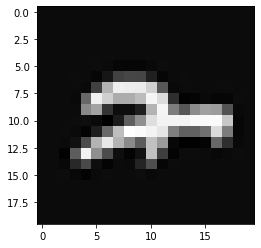

O dígito é: 4
O dígito previsto foi: 9


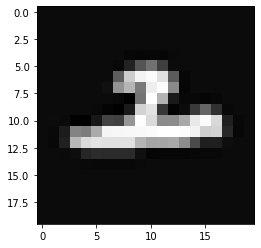

O dígito é: 4
O dígito previsto foi: 9


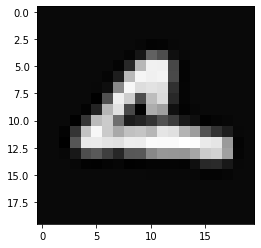

O dígito é: 4
O dígito previsto foi: 9


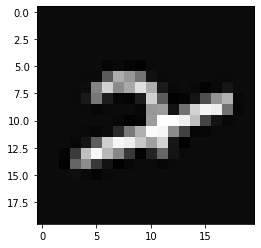

O dígito é: 4
O dígito previsto foi: 2


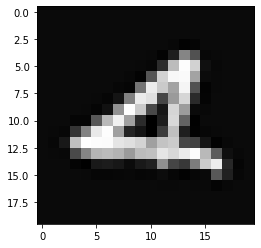

O dígito é: 4
O dígito previsto foi: 9


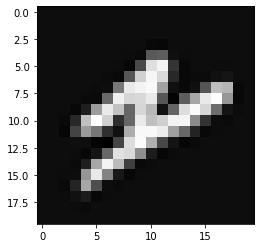

O dígito é: 4
O dígito previsto foi: 9


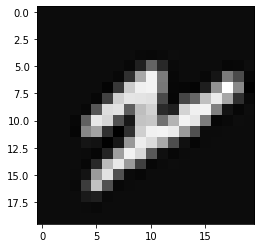

O dígito é: 4
O dígito previsto foi: 8


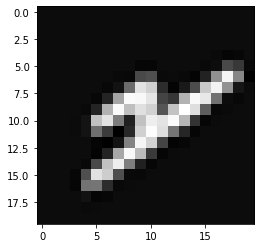

O dígito é: 4
O dígito previsto foi: 6


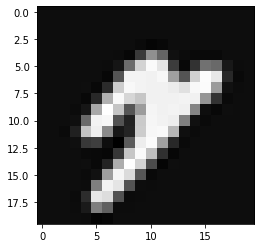

O dígito é: 4
O dígito previsto foi: 9


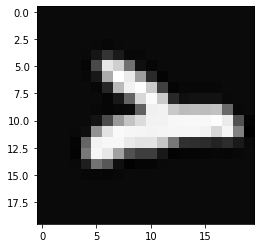

O dígito é: 4
O dígito previsto foi: 8


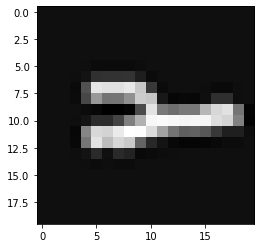

O dígito é: 4
O dígito previsto foi: 9


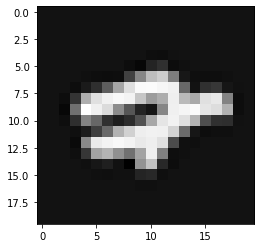

O dígito é: 4
O dígito previsto foi: 6


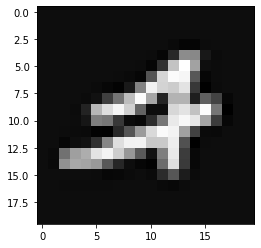

O dígito é: 4
O dígito previsto foi: 9


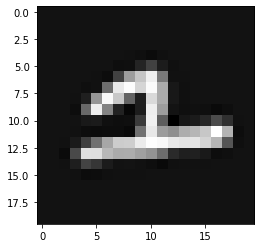

O dígito é: 4
O dígito previsto foi: 6


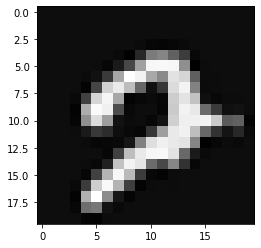

O dígito é: 4
O dígito previsto foi: 9


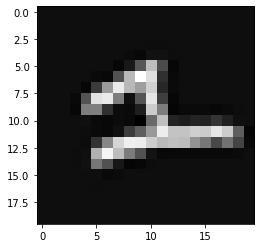

O dígito é: 4
O dígito previsto foi: 7


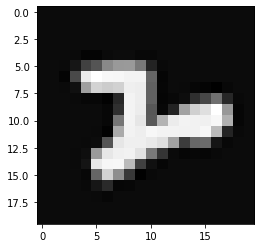

O dígito é: 4
O dígito previsto foi: 9


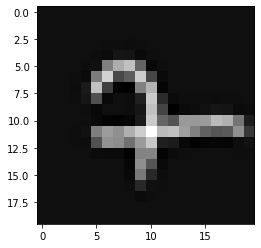

O dígito é: 4
O dígito previsto foi: 6


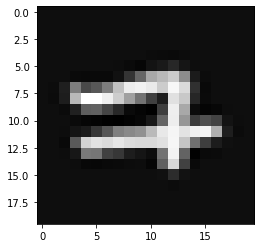

O dígito é: 4
O dígito previsto foi: 9


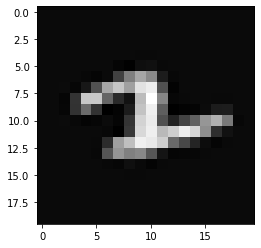

O dígito é: 4
O dígito previsto foi: 3


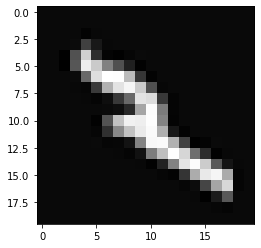

O dígito é: 4
O dígito previsto foi: 6


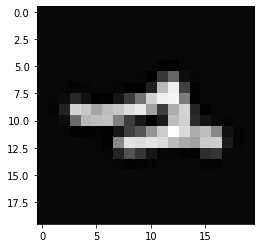

O dígito é: 4
O dígito previsto foi: 9


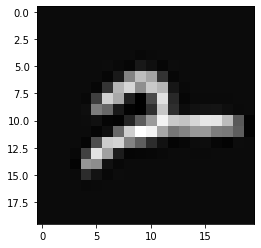

O dígito é: 4
O dígito previsto foi: 9


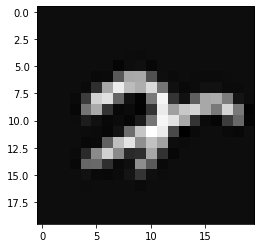

O dígito é: 4
O dígito previsto foi: 6


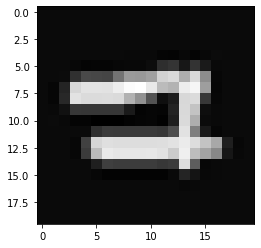

O dígito é: 4
O dígito previsto foi: 9


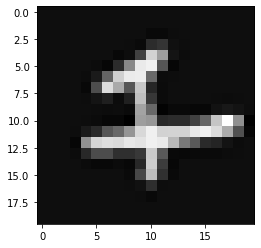

O dígito é: 4
O dígito previsto foi: 6


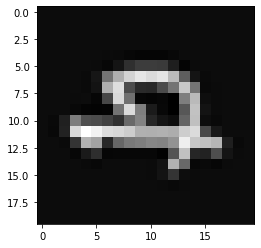

O dígito é: 4
O dígito previsto foi: 1


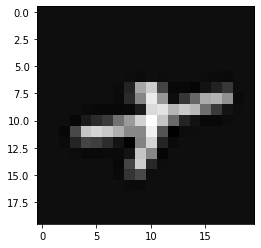

O dígito é: 4
O dígito previsto foi: 9


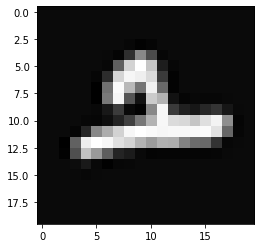

O dígito é: 4
O dígito previsto foi: 0


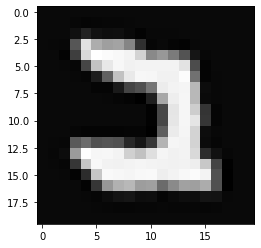

O dígito é: 4
O dígito previsto foi: 9


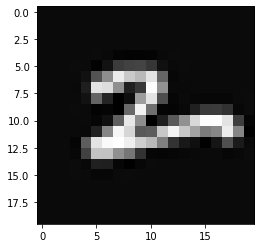

O dígito é: 4
O dígito previsto foi: 8


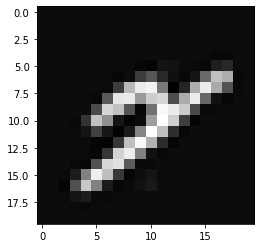

O dígito é: 4
O dígito previsto foi: 8


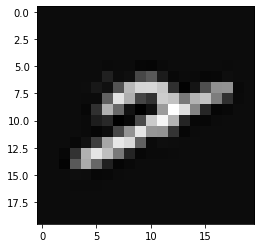

O dígito é: 4
O dígito previsto foi: 9


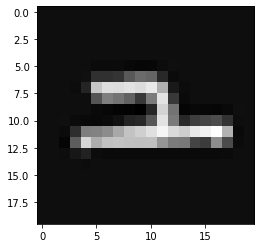

O dígito é: 4
O dígito previsto foi: 9


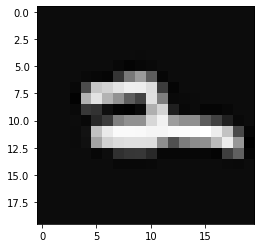

O dígito é: 4
O dígito previsto foi: 9


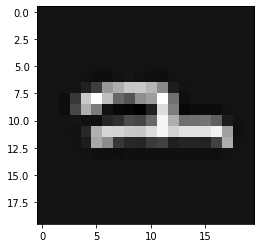

O dígito é: 4
O dígito previsto foi: 9


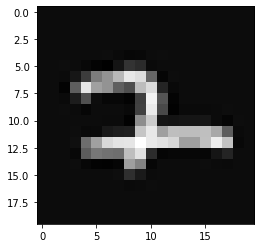

O dígito é: 4
O dígito previsto foi: 9


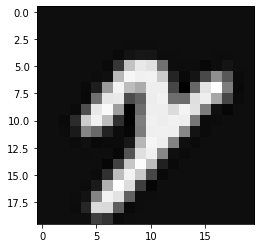

O dígito é: 4
O dígito previsto foi: 0


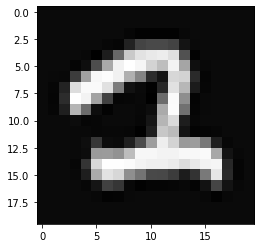

O dígito é: 4
O dígito previsto foi: 9


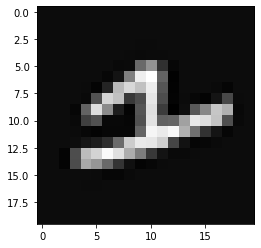

O dígito é: 4
O dígito previsto foi: 0


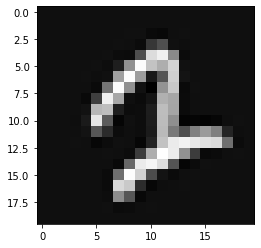

O dígito é: 4
O dígito previsto foi: 0


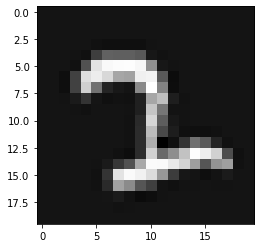

O dígito é: 4
O dígito previsto foi: 9


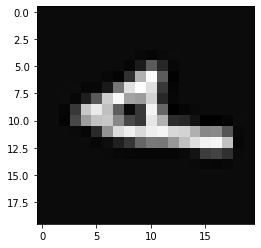

O dígito é: 4
O dígito previsto foi: 9


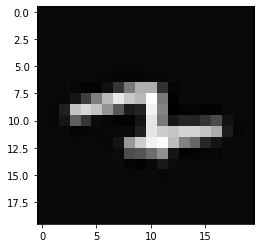

O dígito é: 4
O dígito previsto foi: 9


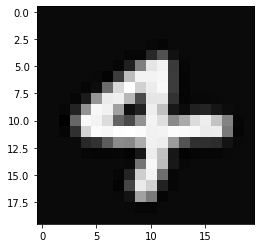

O dígito é: 4
O dígito previsto foi: 6


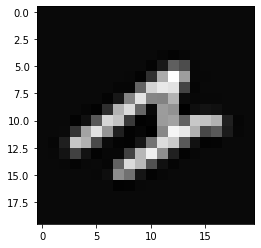

O dígito é: 4
O dígito previsto foi: 0


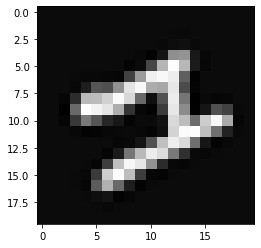

O dígito é: 4
O dígito previsto foi: 9


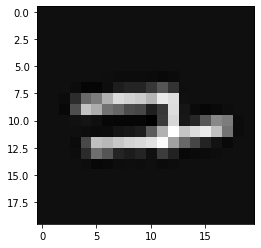

O dígito é: 4
O dígito previsto foi: 8


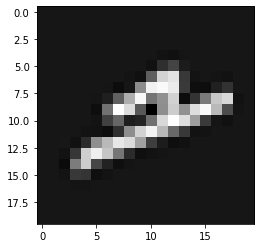

O dígito é: 4
O dígito previsto foi: 9


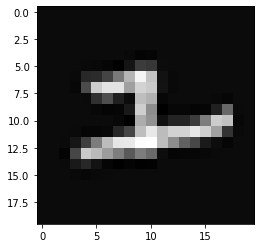

O dígito é: 4
O dígito previsto foi: 8


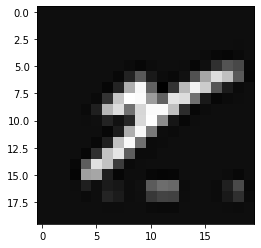

O dígito é: 4
O dígito previsto foi: 9


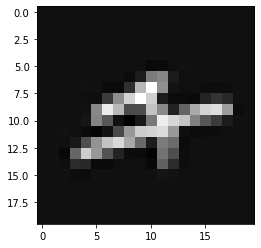

O dígito é: 4
O dígito previsto foi: 6


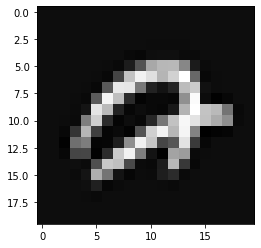

O dígito é: 4
O dígito previsto foi: 9


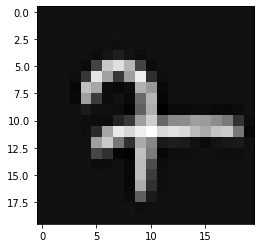

O dígito é: 4
O dígito previsto foi: 9


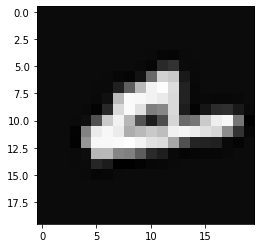

O dígito é: 4
O dígito previsto foi: 7


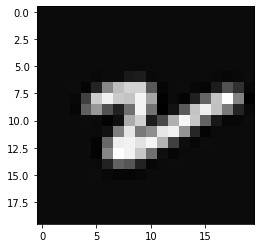

O dígito é: 4
O dígito previsto foi: 9


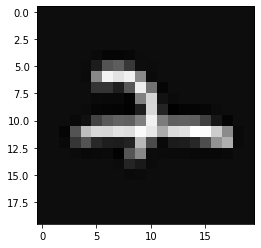

O dígito é: 4
O dígito previsto foi: 8


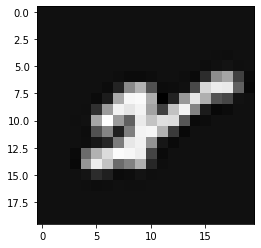

O dígito é: 5
O dígito previsto foi: 3


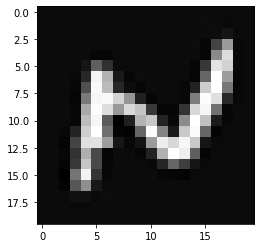

O dígito é: 5
O dígito previsto foi: 2


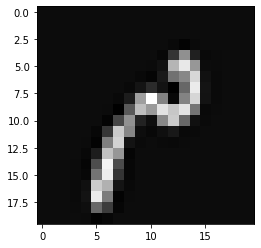

O dígito é: 5
O dígito previsto foi: 8


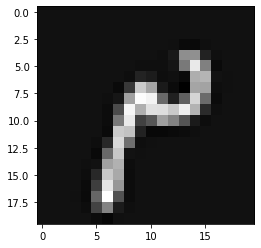

O dígito é: 5
O dígito previsto foi: 8


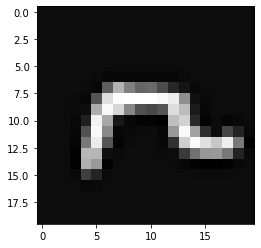

O dígito é: 5
O dígito previsto foi: 3


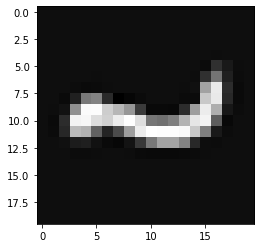

O dígito é: 5
O dígito previsto foi: 0


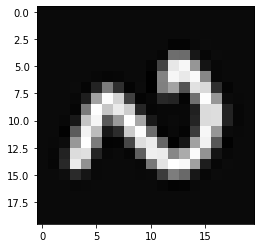

O dígito é: 5
O dígito previsto foi: 1


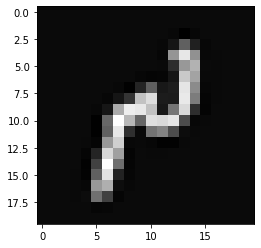

O dígito é: 5
O dígito previsto foi: 3


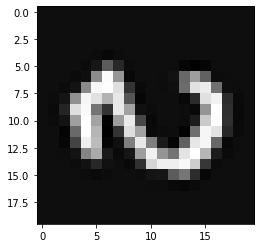

O dígito é: 5
O dígito previsto foi: 2


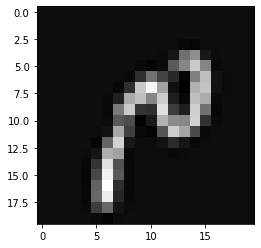

O dígito é: 5
O dígito previsto foi: 0


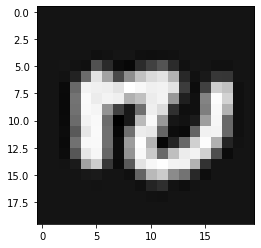

O dígito é: 5
O dígito previsto foi: 3


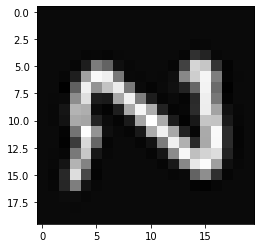

O dígito é: 5
O dígito previsto foi: 6


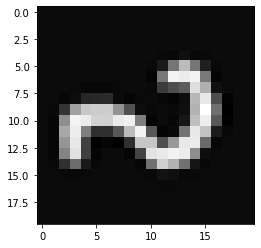

O dígito é: 5
O dígito previsto foi: 3


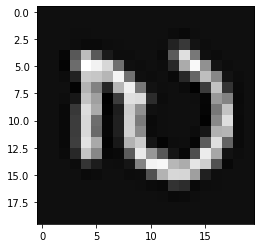

O dígito é: 5
O dígito previsto foi: 0


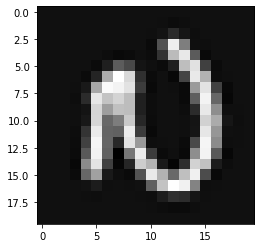

O dígito é: 5
O dígito previsto foi: 3


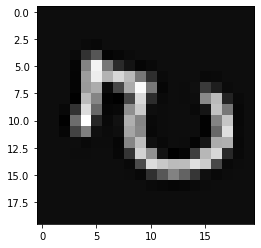

O dígito é: 5
O dígito previsto foi: 3


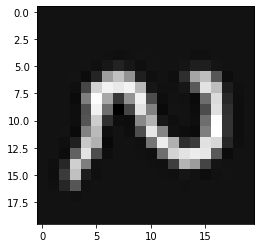

O dígito é: 5
O dígito previsto foi: 8


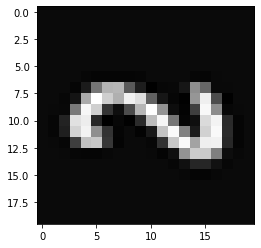

O dígito é: 5
O dígito previsto foi: 3


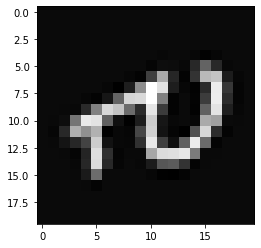

O dígito é: 5
O dígito previsto foi: 2


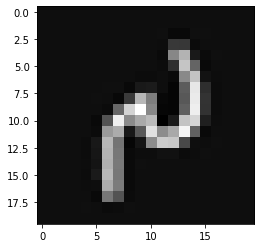

O dígito é: 5
O dígito previsto foi: 3


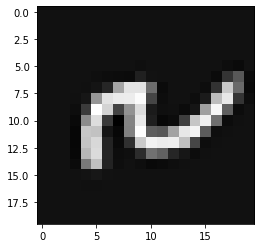

O dígito é: 5
O dígito previsto foi: 6


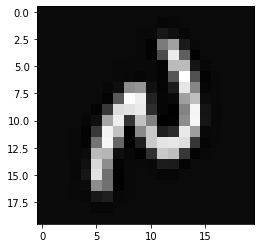

O dígito é: 5
O dígito previsto foi: 0


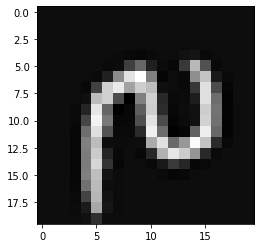

O dígito é: 5
O dígito previsto foi: 8


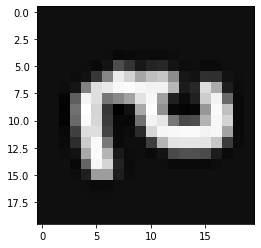

O dígito é: 5
O dígito previsto foi: 3


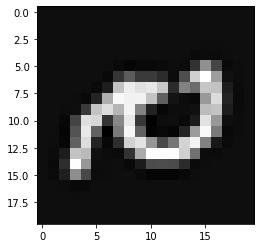

O dígito é: 5
O dígito previsto foi: 8


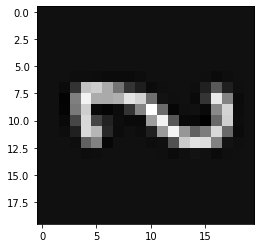

O dígito é: 5
O dígito previsto foi: 3


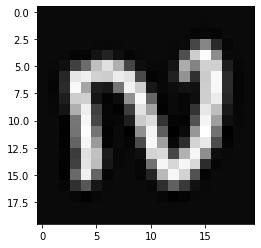

O dígito é: 5
O dígito previsto foi: 0


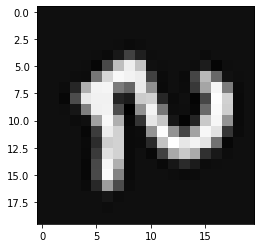

O dígito é: 5
O dígito previsto foi: 3


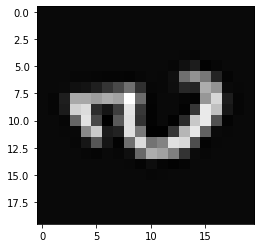

O dígito é: 5
O dígito previsto foi: 0


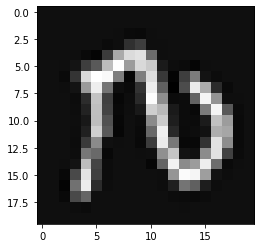

O dígito é: 5
O dígito previsto foi: 8


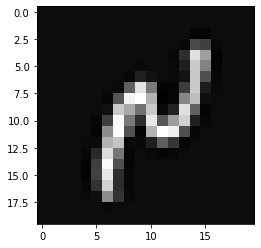

O dígito é: 5
O dígito previsto foi: 3


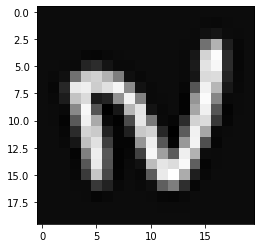

O dígito é: 5
O dígito previsto foi: 0


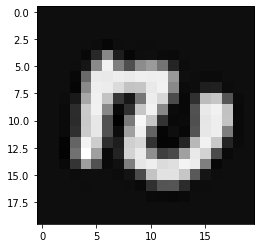

O dígito é: 5
O dígito previsto foi: 0


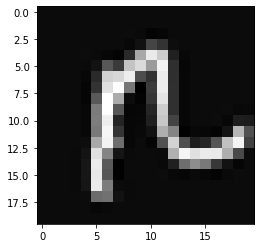

O dígito é: 5
O dígito previsto foi: 4


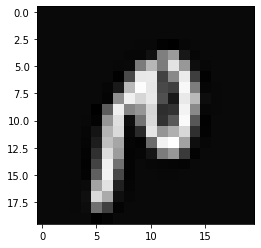

O dígito é: 5
O dígito previsto foi: 0


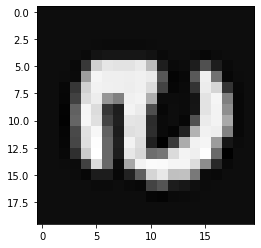

O dígito é: 5
O dígito previsto foi: 0


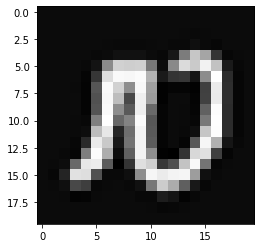

O dígito é: 5
O dígito previsto foi: 8


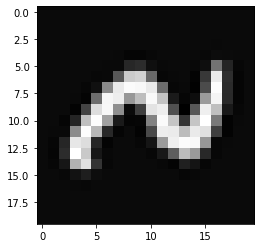

O dígito é: 5
O dígito previsto foi: 2


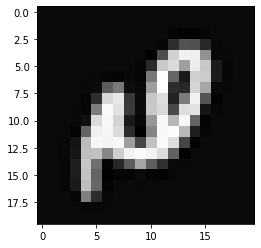

O dígito é: 5
O dígito previsto foi: 3


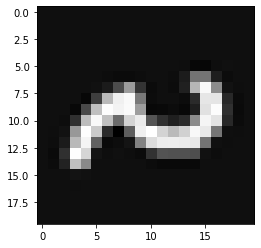

O dígito é: 5
O dígito previsto foi: 0


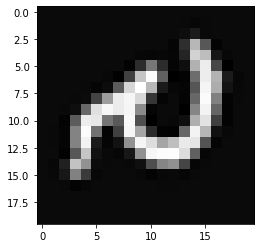

O dígito é: 5
O dígito previsto foi: 6


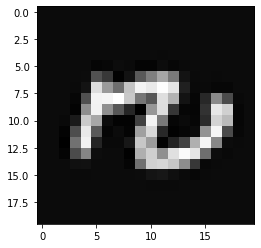

O dígito é: 5
O dígito previsto foi: 0


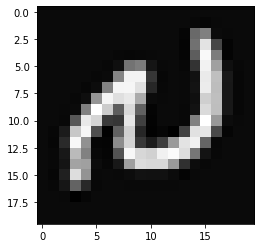

O dígito é: 5
O dígito previsto foi: 0


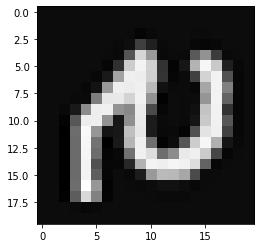

O dígito é: 5
O dígito previsto foi: 0


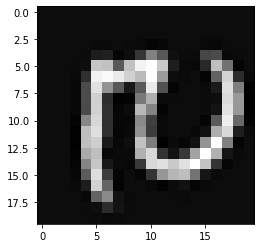

O dígito é: 5
O dígito previsto foi: 3


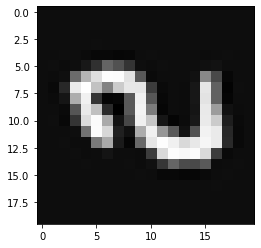

O dígito é: 5
O dígito previsto foi: 3


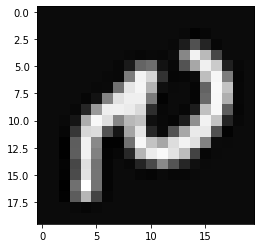

O dígito é: 5
O dígito previsto foi: 0


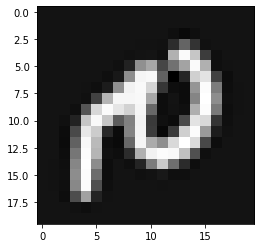

O dígito é: 5
O dígito previsto foi: 3


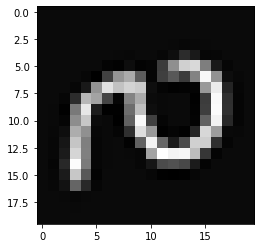

O dígito é: 5
O dígito previsto foi: 6


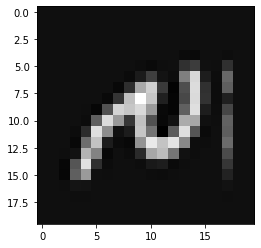

O dígito é: 5
O dígito previsto foi: 4


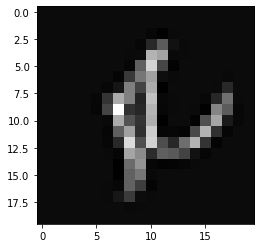

O dígito é: 5
O dígito previsto foi: 0


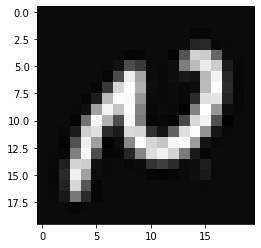

O dígito é: 5
O dígito previsto foi: 3


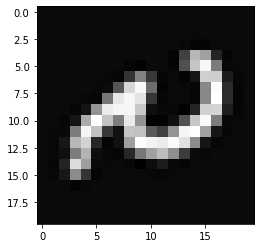

O dígito é: 5
O dígito previsto foi: 0


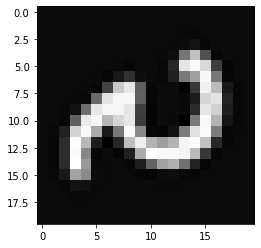

O dígito é: 5
O dígito previsto foi: 3


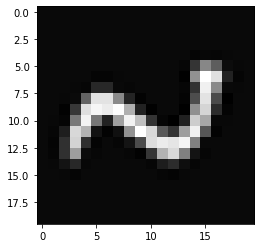

O dígito é: 5
O dígito previsto foi: 0


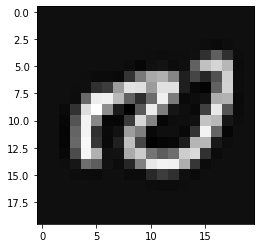

O dígito é: 5
O dígito previsto foi: 0


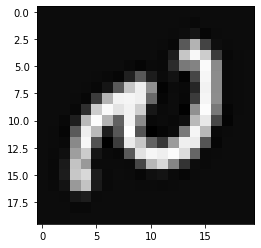

O dígito é: 5
O dígito previsto foi: 3


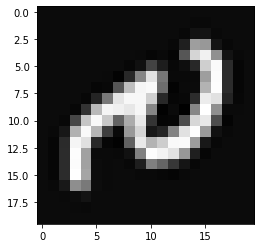

O dígito é: 5
O dígito previsto foi: 8


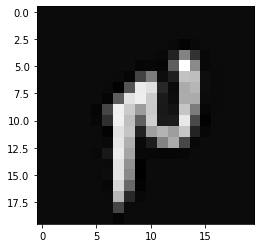

O dígito é: 5
O dígito previsto foi: 3


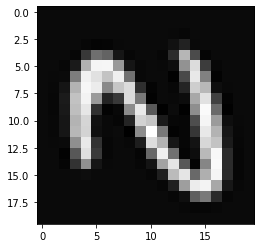

O dígito é: 5
O dígito previsto foi: 2


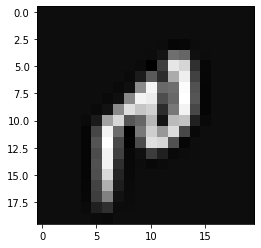

O dígito é: 5
O dígito previsto foi: 8


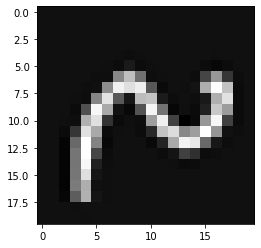

O dígito é: 5
O dígito previsto foi: 8


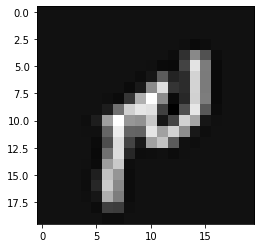

O dígito é: 5
O dígito previsto foi: 6


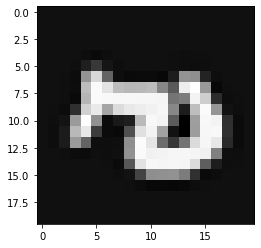

O dígito é: 5
O dígito previsto foi: 6


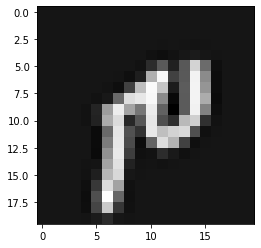

O dígito é: 5
O dígito previsto foi: 3


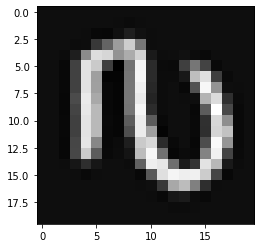

O dígito é: 5
O dígito previsto foi: 6


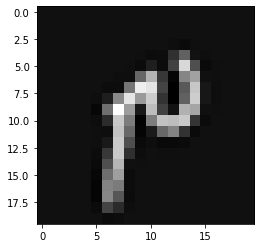

O dígito é: 5
O dígito previsto foi: 3


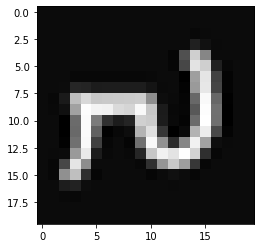

O dígito é: 5
O dígito previsto foi: 3


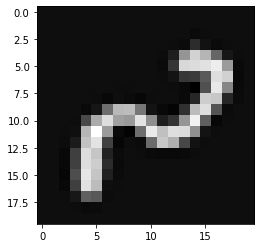

O dígito é: 5
O dígito previsto foi: 3


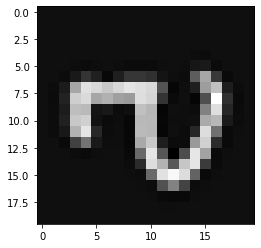

O dígito é: 5
O dígito previsto foi: 2


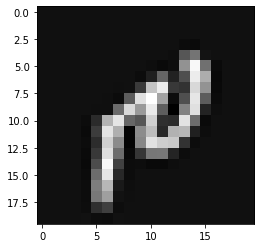

O dígito é: 5
O dígito previsto foi: 4


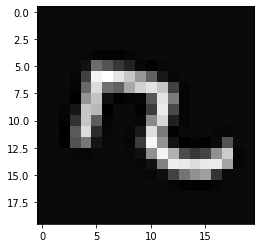

O dígito é: 5
O dígito previsto foi: 3


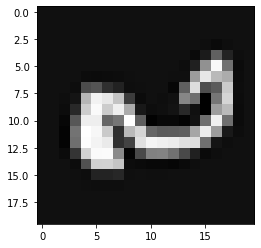

O dígito é: 5
O dígito previsto foi: 8


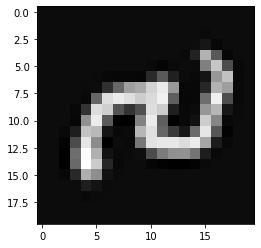

O dígito é: 5
O dígito previsto foi: 6


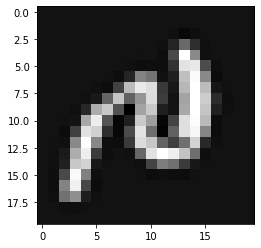

O dígito é: 5
O dígito previsto foi: 6


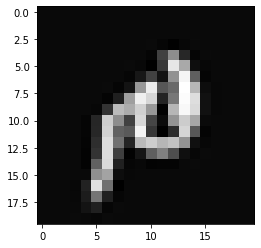

O dígito é: 5
O dígito previsto foi: 3


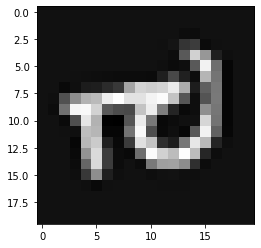

O dígito é: 5
O dígito previsto foi: 0


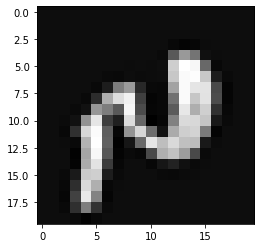

O dígito é: 5
O dígito previsto foi: 2


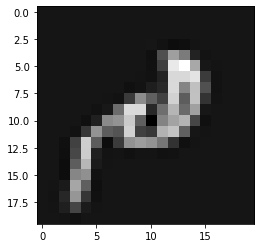

O dígito é: 5
O dígito previsto foi: 6


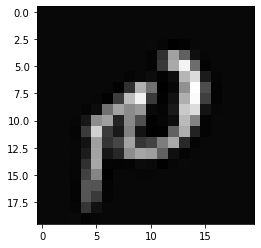

O dígito é: 5
O dígito previsto foi: 0


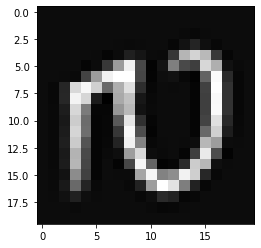

O dígito é: 5
O dígito previsto foi: 3


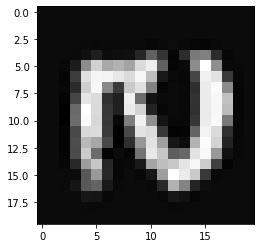

O dígito é: 5
O dígito previsto foi: 3


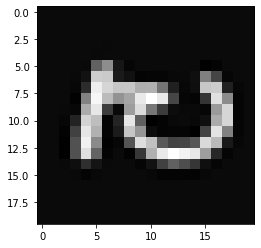

O dígito é: 5
O dígito previsto foi: 0


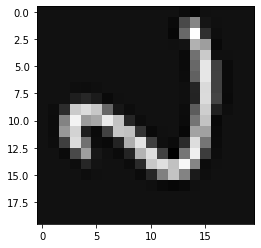

O dígito é: 5
O dígito previsto foi: 0


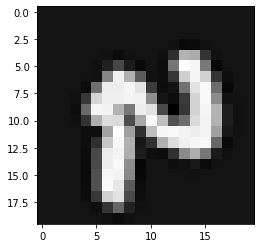

O dígito é: 5
O dígito previsto foi: 8


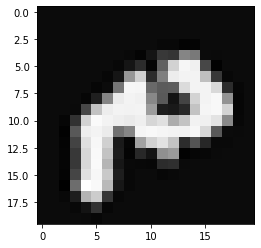

O dígito é: 5
O dígito previsto foi: 8


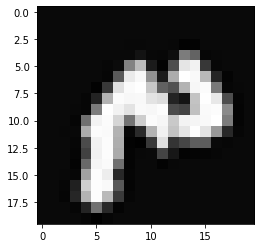

O dígito é: 5
O dígito previsto foi: 0


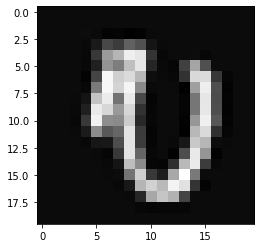

O dígito é: 5
O dígito previsto foi: 6


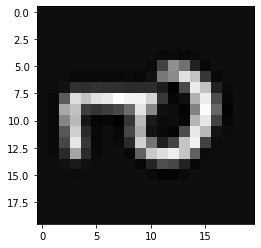

O dígito é: 5
O dígito previsto foi: 8


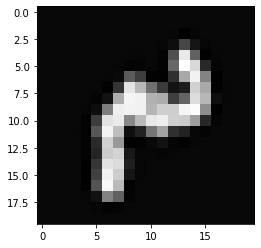

O dígito é: 5
O dígito previsto foi: 8


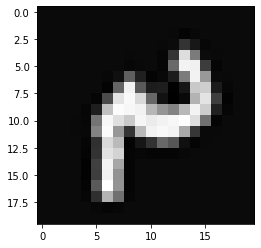

O dígito é: 5
O dígito previsto foi: 8


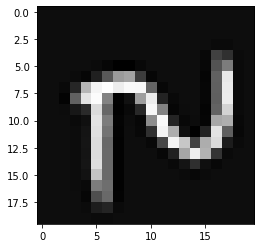

O dígito é: 5
O dígito previsto foi: 8


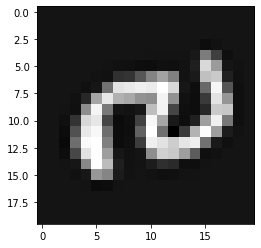

O dígito é: 5
O dígito previsto foi: 8


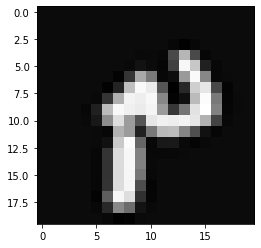

O dígito é: 5
O dígito previsto foi: 0


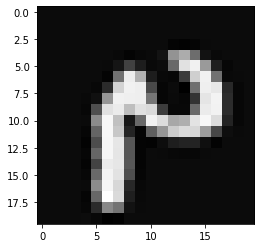

O dígito é: 5
O dígito previsto foi: 3


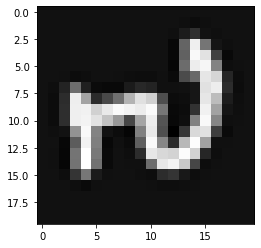

O dígito é: 5
O dígito previsto foi: 2


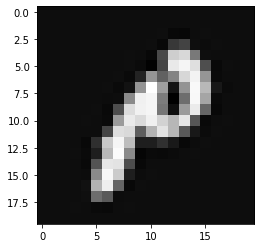

O dígito é: 5
O dígito previsto foi: 0


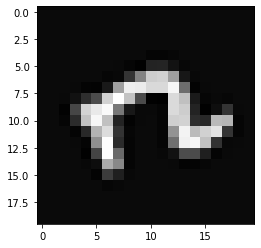

O dígito é: 5
O dígito previsto foi: 8


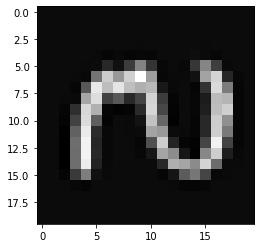

O dígito é: 5
O dígito previsto foi: 0


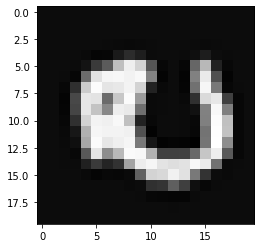

O dígito é: 5
O dígito previsto foi: 9


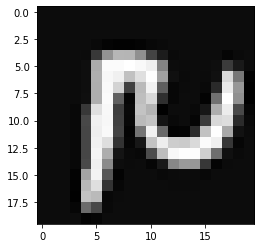

O dígito é: 5
O dígito previsto foi: 4


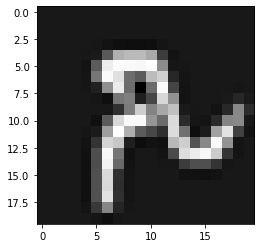

O dígito é: 5
O dígito previsto foi: 0


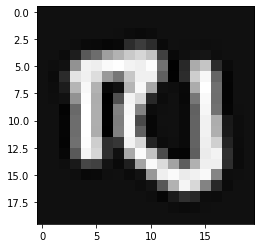

O dígito é: 5
O dígito previsto foi: 0


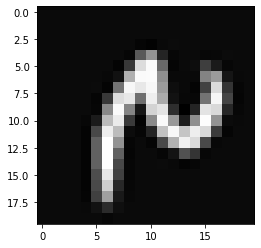

O dígito é: 5
O dígito previsto foi: 6


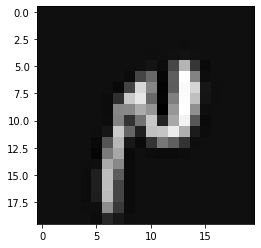

O dígito é: 5
O dígito previsto foi: 2


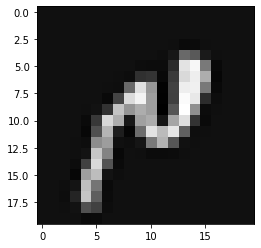

O dígito é: 5
O dígito previsto foi: 8


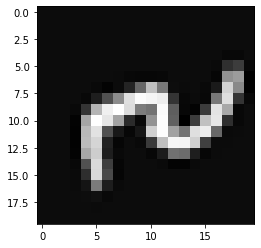

O dígito é: 5
O dígito previsto foi: 6


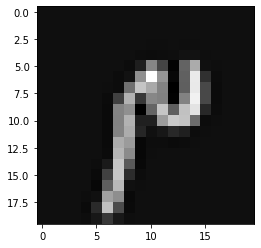

O dígito é: 5
O dígito previsto foi: 8


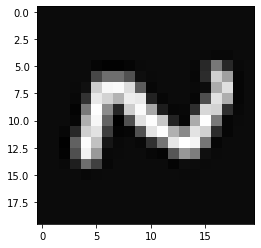

O dígito é: 5
O dígito previsto foi: 3


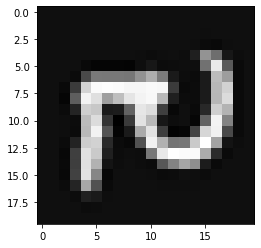

O dígito é: 5
O dígito previsto foi: 6


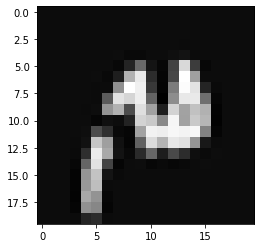

O dígito é: 5
O dígito previsto foi: 9


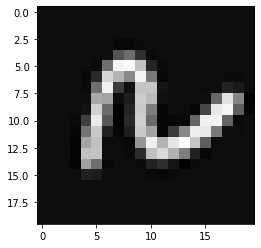

O dígito é: 5
O dígito previsto foi: 8


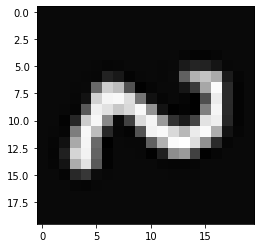

O dígito é: 5
O dígito previsto foi: 8


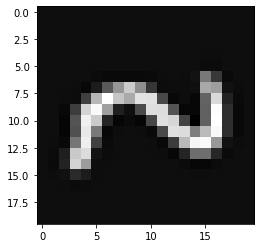

O dígito é: 5
O dígito previsto foi: 0


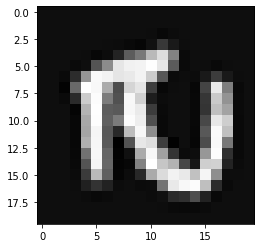

O dígito é: 5
O dígito previsto foi: 3


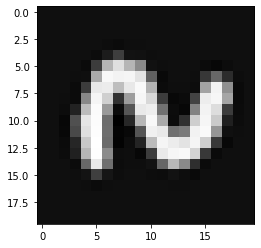

O dígito é: 5
O dígito previsto foi: 6


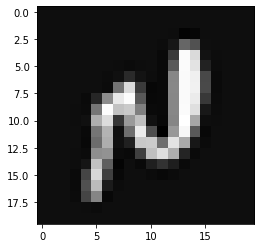

O dígito é: 5
O dígito previsto foi: 3


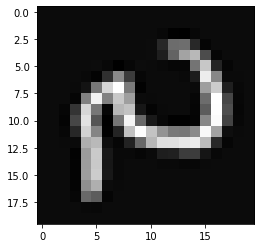

O dígito é: 5
O dígito previsto foi: 0


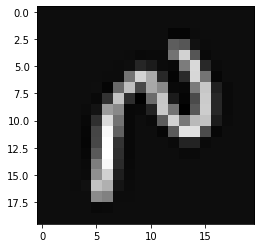

O dígito é: 5
O dígito previsto foi: 0


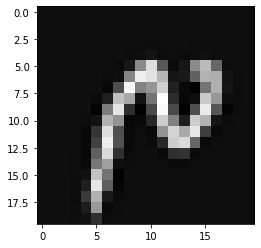

O dígito é: 5
O dígito previsto foi: 0


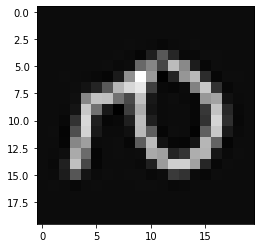

O dígito é: 5
O dígito previsto foi: 0


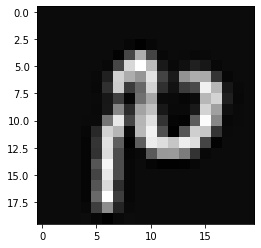

O dígito é: 5
O dígito previsto foi: 0


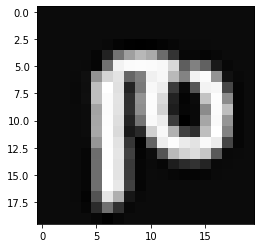

O dígito é: 5
O dígito previsto foi: 0


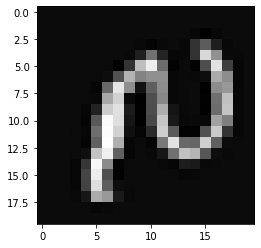

O dígito é: 5
O dígito previsto foi: 3


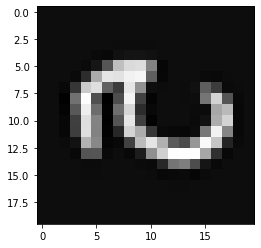

O dígito é: 5
O dígito previsto foi: 0


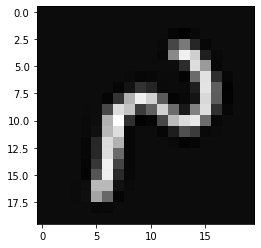

O dígito é: 5
O dígito previsto foi: 0


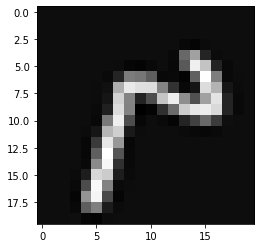

O dígito é: 5
O dígito previsto foi: 0


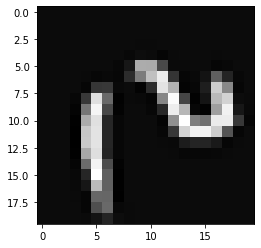

O dígito é: 5
O dígito previsto foi: 0


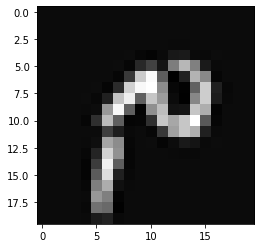

O dígito é: 5
O dígito previsto foi: 3


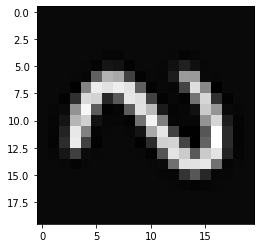

O dígito é: 5
O dígito previsto foi: 8


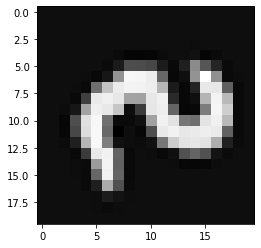

O dígito é: 5
O dígito previsto foi: 0


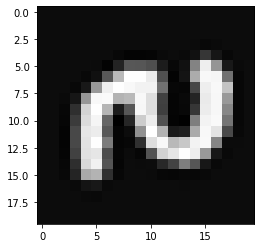

O dígito é: 5
O dígito previsto foi: 3


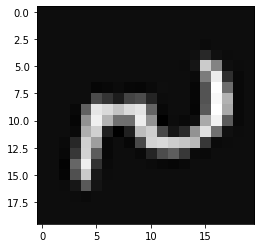

O dígito é: 5
O dígito previsto foi: 8


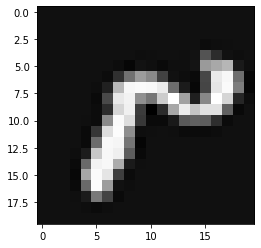

O dígito é: 5
O dígito previsto foi: 0


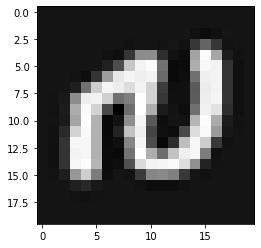

O dígito é: 5
O dígito previsto foi: 0


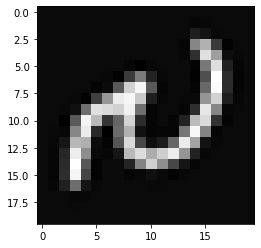

O dígito é: 5
O dígito previsto foi: 0


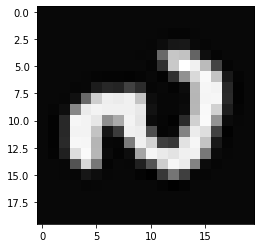

O dígito é: 5
O dígito previsto foi: 3


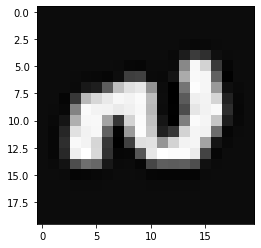

O dígito é: 5
O dígito previsto foi: 0


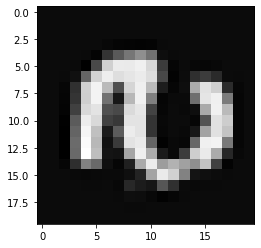

O dígito é: 5
O dígito previsto foi: 0


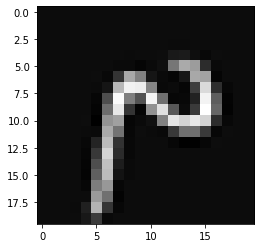

O dígito é: 5
O dígito previsto foi: 3


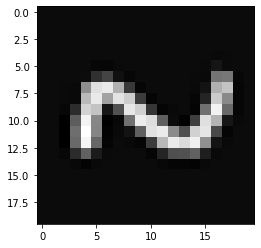

O dígito é: 5
O dígito previsto foi: 0


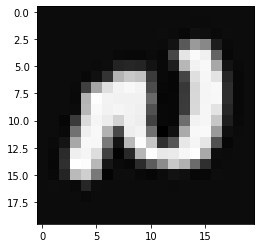

O dígito é: 5
O dígito previsto foi: 8


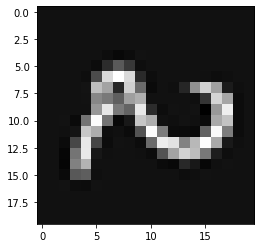

O dígito é: 5
O dígito previsto foi: 0


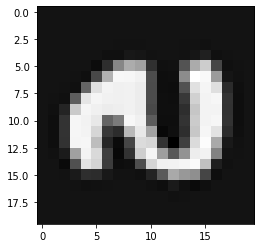

O dígito é: 5
O dígito previsto foi: 6


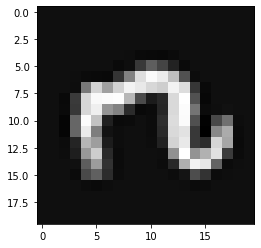

O dígito é: 5
O dígito previsto foi: 8


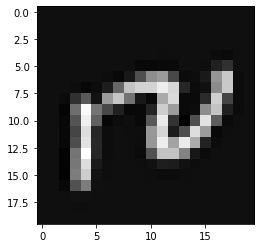

O dígito é: 5
O dígito previsto foi: 0


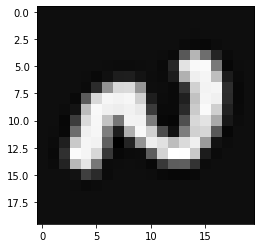

O dígito é: 5
O dígito previsto foi: 0


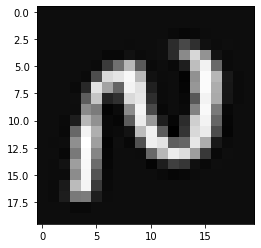

O dígito é: 5
O dígito previsto foi: 0


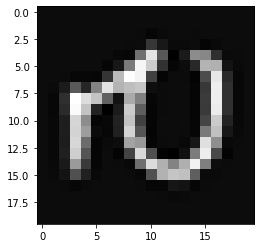

O dígito é: 5
O dígito previsto foi: 3


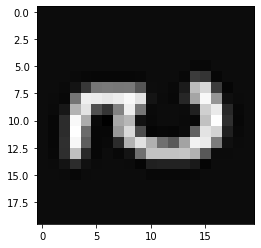

O dígito é: 5
O dígito previsto foi: 0


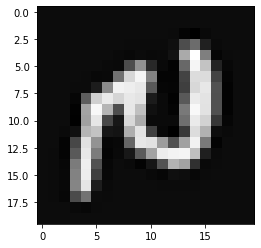

O dígito é: 5
O dígito previsto foi: 8


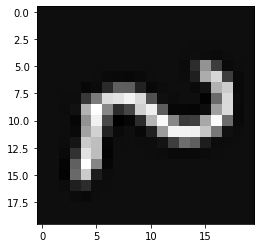

O dígito é: 5
O dígito previsto foi: 0


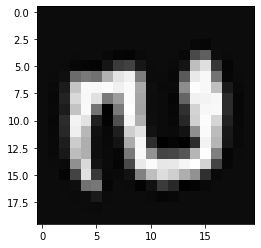

O dígito é: 5
O dígito previsto foi: 3


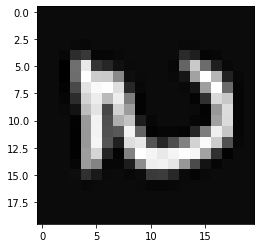

O dígito é: 5
O dígito previsto foi: 8


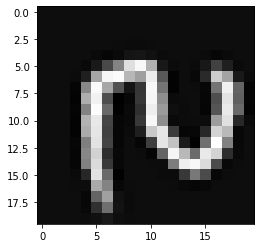

O dígito é: 5
O dígito previsto foi: 3


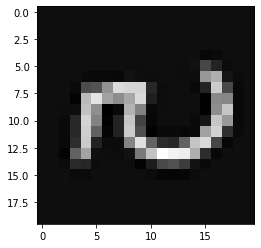

O dígito é: 5
O dígito previsto foi: 6


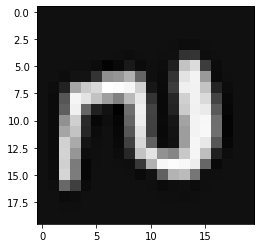

O dígito é: 5
O dígito previsto foi: 6


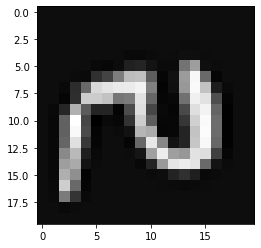

O dígito é: 5
O dígito previsto foi: 3


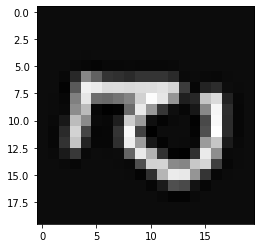

O dígito é: 5
O dígito previsto foi: 8


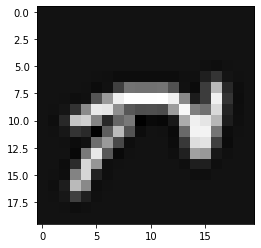

O dígito é: 5
O dígito previsto foi: 0


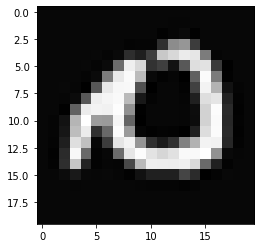

O dígito é: 5
O dígito previsto foi: 8


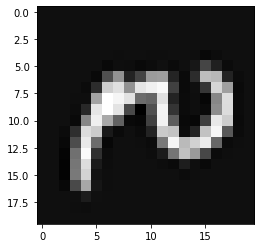

O dígito é: 5
O dígito previsto foi: 0


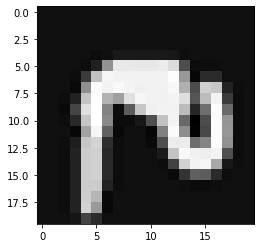

O dígito é: 5
O dígito previsto foi: 3


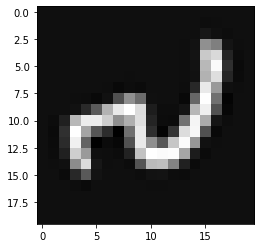

O dígito é: 5
O dígito previsto foi: 0


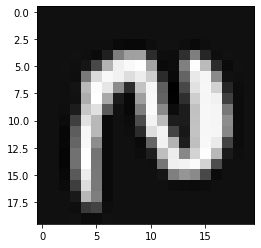

O dígito é: 5
O dígito previsto foi: 0


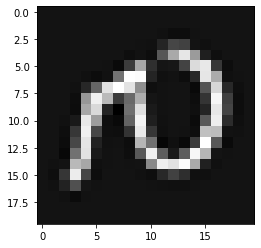

O dígito é: 5
O dígito previsto foi: 3


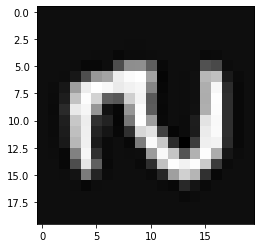

O dígito é: 5
O dígito previsto foi: 9


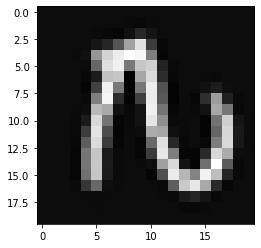

O dígito é: 5
O dígito previsto foi: 0


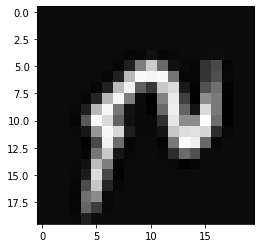

O dígito é: 5
O dígito previsto foi: 3


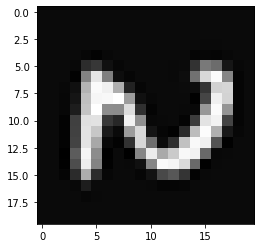

O dígito é: 5
O dígito previsto foi: 0


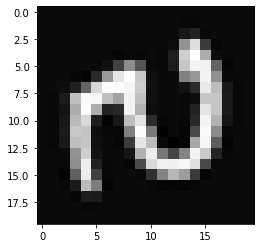

O dígito é: 5
O dígito previsto foi: 1


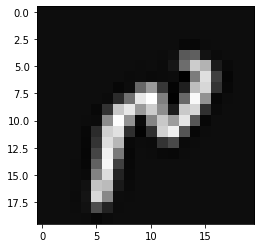

O dígito é: 5
O dígito previsto foi: 3


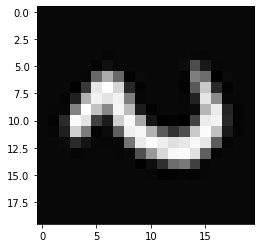

O dígito é: 5
O dígito previsto foi: 3


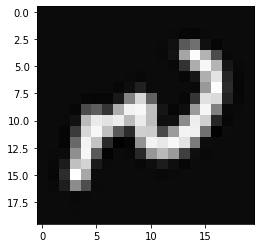

O dígito é: 5
O dígito previsto foi: 2


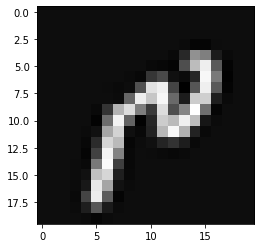

O dígito é: 5
O dígito previsto foi: 0


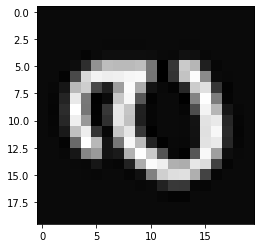

O dígito é: 5
O dígito previsto foi: 3


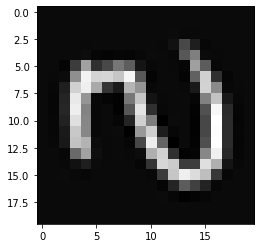

O dígito é: 5
O dígito previsto foi: 8


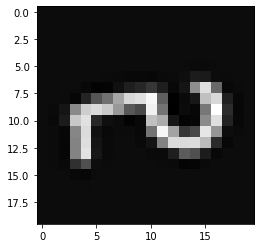

O dígito é: 5
O dígito previsto foi: 2


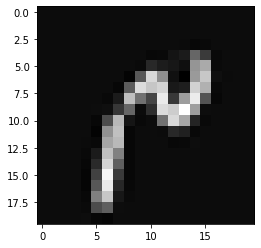

O dígito é: 5
O dígito previsto foi: 0


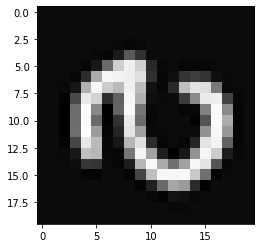

O dígito é: 5
O dígito previsto foi: 0


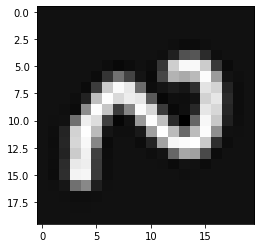

O dígito é: 5
O dígito previsto foi: 2


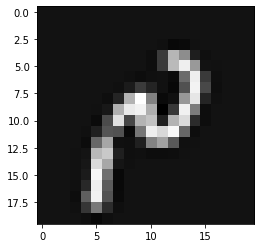

O dígito é: 5
O dígito previsto foi: 2


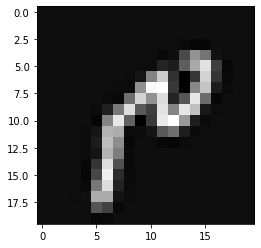

O dígito é: 5
O dígito previsto foi: 0


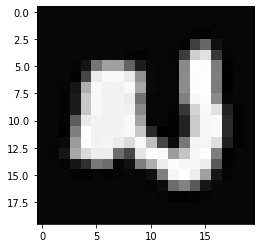

O dígito é: 5
O dígito previsto foi: 9


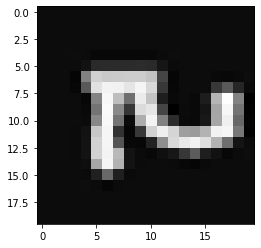

O dígito é: 5
O dígito previsto foi: 0


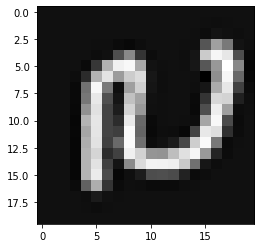

O dígito é: 5
O dígito previsto foi: 0


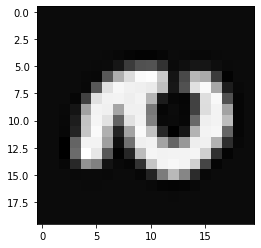

O dígito é: 5
O dígito previsto foi: 3


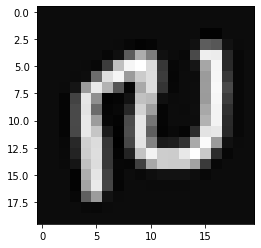

O dígito é: 5
O dígito previsto foi: 8


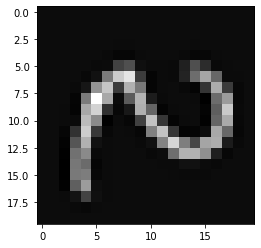

O dígito é: 5
O dígito previsto foi: 2


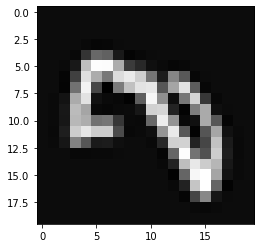

O dígito é: 5
O dígito previsto foi: 4


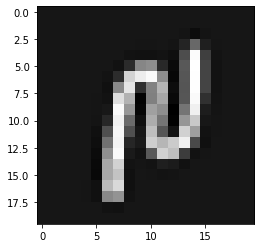

O dígito é: 5
O dígito previsto foi: 0


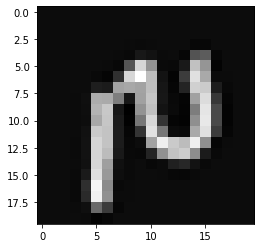

O dígito é: 5
O dígito previsto foi: 3


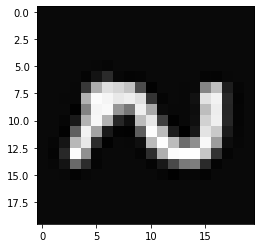

O dígito é: 5
O dígito previsto foi: 0


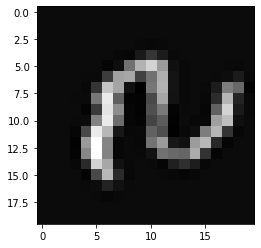

O dígito é: 5
O dígito previsto foi: 3


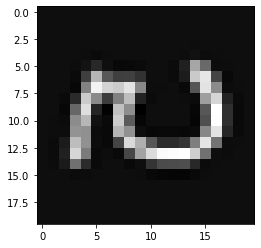

O dígito é: 5
O dígito previsto foi: 4


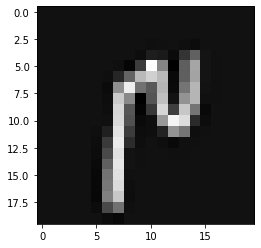

O dígito é: 5
O dígito previsto foi: 0


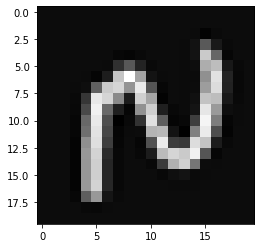

O dígito é: 5
O dígito previsto foi: 0


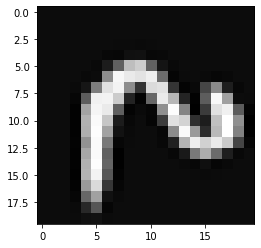

O dígito é: 5
O dígito previsto foi: 3


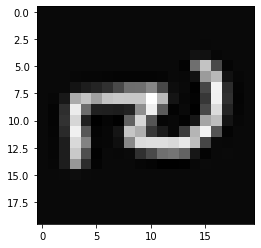

O dígito é: 5
O dígito previsto foi: 0


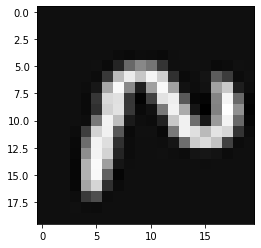

O dígito é: 5
O dígito previsto foi: 3


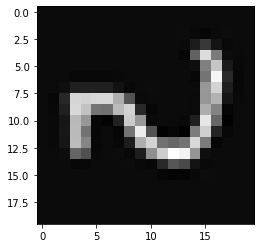

O dígito é: 5
O dígito previsto foi: 4


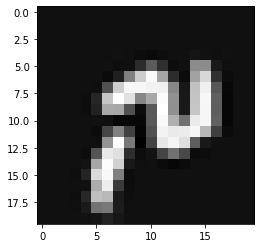

O dígito é: 5
O dígito previsto foi: 3


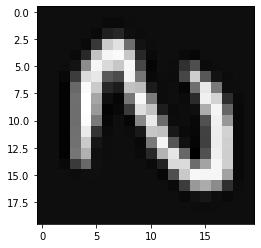

O dígito é: 5
O dígito previsto foi: 4


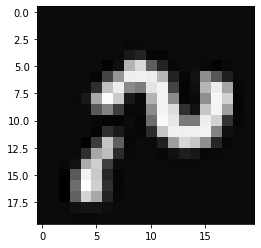

O dígito é: 5
O dígito previsto foi: 0


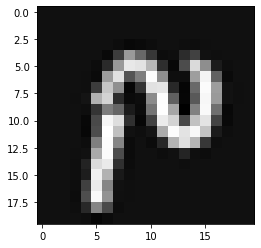

O dígito é: 5
O dígito previsto foi: 0


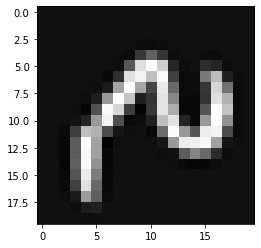

O dígito é: 5
O dígito previsto foi: 0


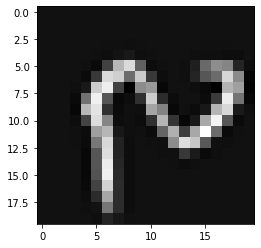

O dígito é: 5
O dígito previsto foi: 0


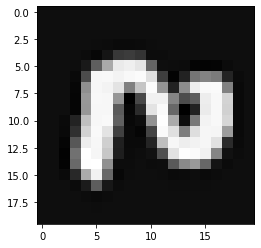

O dígito é: 5
O dígito previsto foi: 0


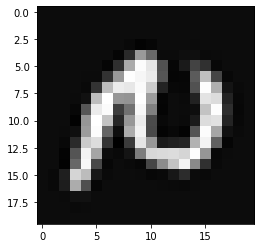

O dígito é: 5
O dígito previsto foi: 6


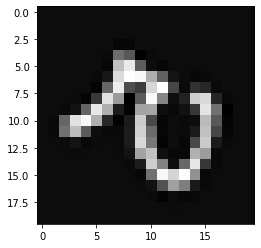

O dígito é: 5
O dígito previsto foi: 3


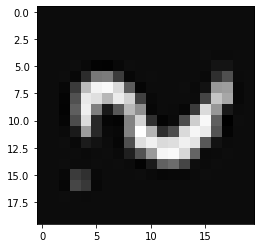

O dígito é: 5
O dígito previsto foi: 8


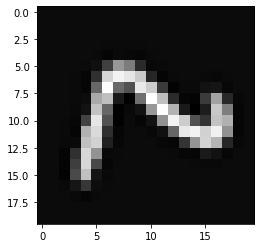

O dígito é: 5
O dígito previsto foi: 0


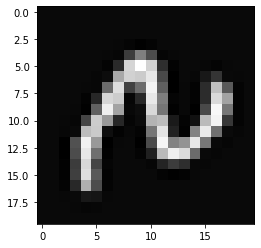

O dígito é: 5
O dígito previsto foi: 0


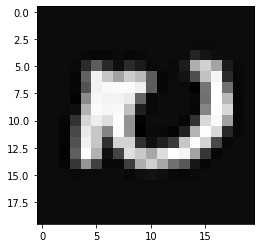

O dígito é: 5
O dígito previsto foi: 3


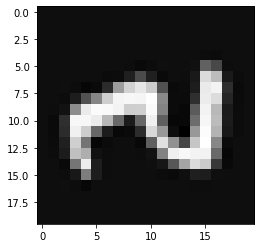

O dígito é: 5
O dígito previsto foi: 0


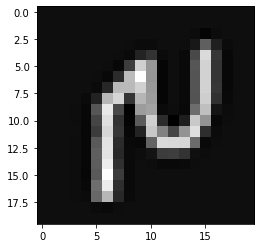

O dígito é: 5
O dígito previsto foi: 0


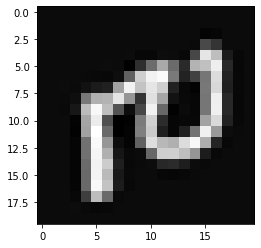

O dígito é: 5
O dígito previsto foi: 3


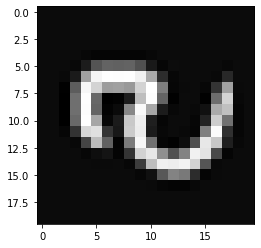

O dígito é: 5
O dígito previsto foi: 3


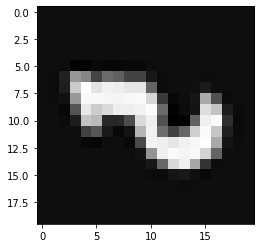

O dígito é: 5
O dígito previsto foi: 3


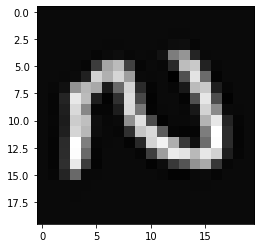

O dígito é: 5
O dígito previsto foi: 6


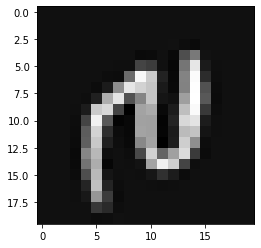

O dígito é: 5
O dígito previsto foi: 0


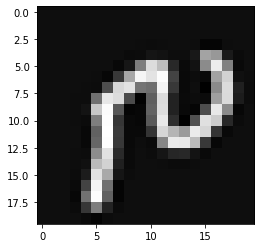

O dígito é: 5
O dígito previsto foi: 0


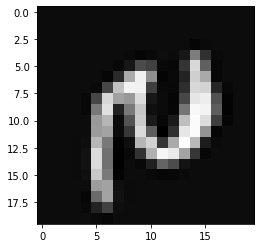

O dígito é: 5
O dígito previsto foi: 8


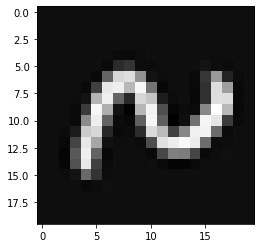

O dígito é: 5
O dígito previsto foi: 3


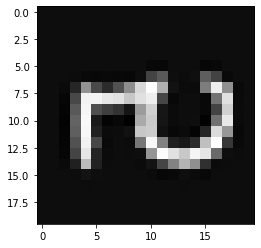

O dígito é: 5
O dígito previsto foi: 8


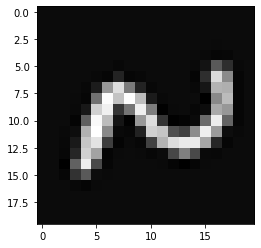

O dígito é: 5
O dígito previsto foi: 0


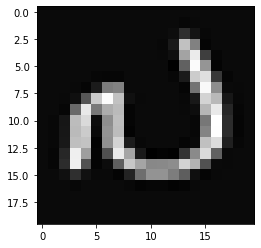

O dígito é: 5
O dígito previsto foi: 1


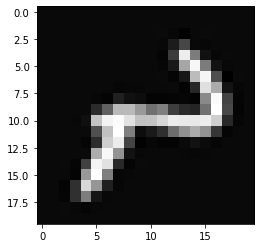

O dígito é: 5
O dígito previsto foi: 0


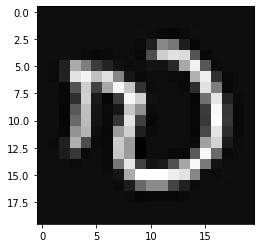

O dígito é: 5
O dígito previsto foi: 1


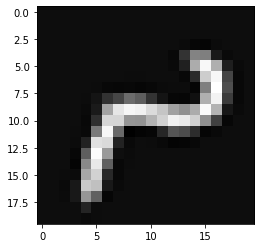

O dígito é: 5
O dígito previsto foi: 3


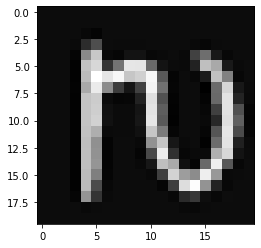

O dígito é: 5
O dígito previsto foi: 1


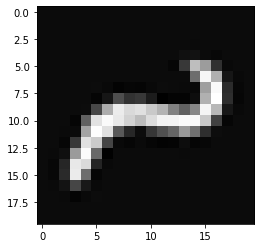

O dígito é: 5
O dígito previsto foi: 1


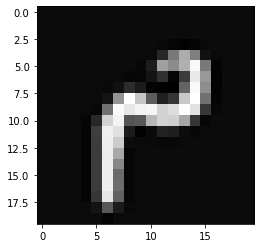

O dígito é: 5
O dígito previsto foi: 0


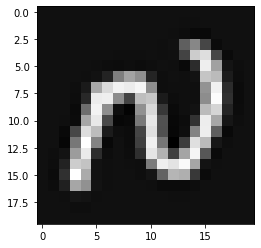

O dígito é: 5
O dígito previsto foi: 7


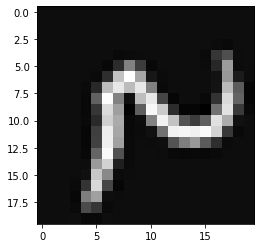

O dígito é: 5
O dígito previsto foi: 7


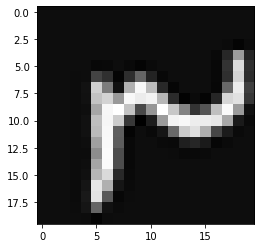

O dígito é: 5
O dígito previsto foi: 0


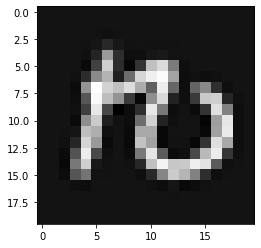

O dígito é: 5
O dígito previsto foi: 7


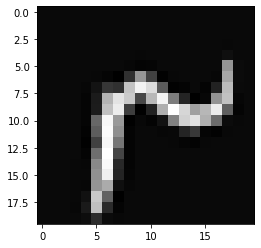

O dígito é: 5
O dígito previsto foi: 9


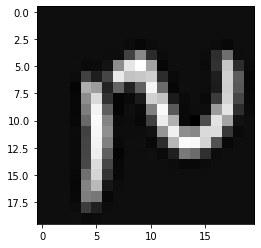

O dígito é: 5
O dígito previsto foi: 0


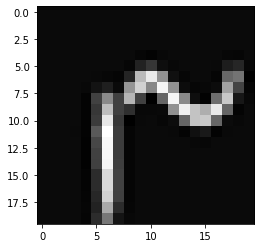

O dígito é: 5
O dígito previsto foi: 8


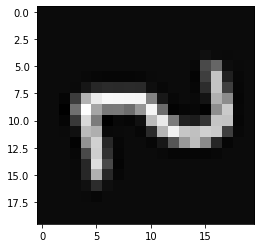

O dígito é: 5
O dígito previsto foi: 3


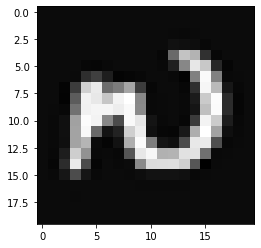

O dígito é: 5
O dígito previsto foi: 8


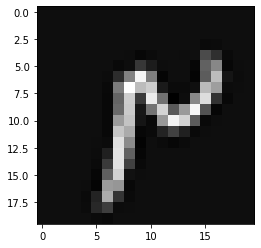

O dígito é: 5
O dígito previsto foi: 0


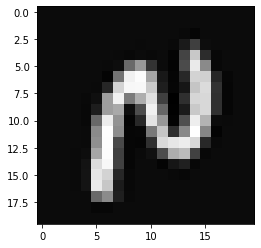

O dígito é: 5
O dígito previsto foi: 0


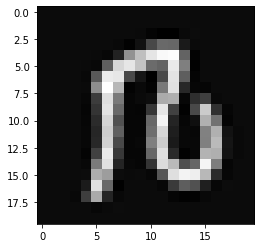

O dígito é: 5
O dígito previsto foi: 0


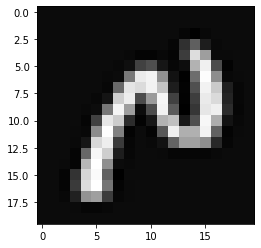

O dígito é: 5
O dígito previsto foi: 0


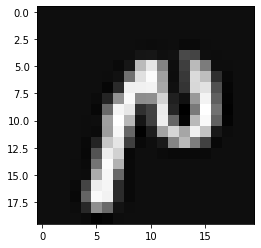

O dígito é: 5
O dígito previsto foi: 1


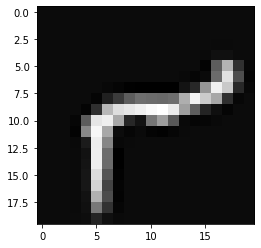

O dígito é: 5
O dígito previsto foi: 3


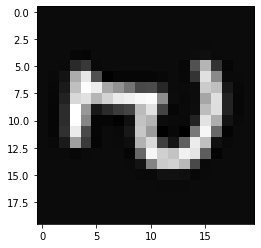

O dígito é: 5
O dígito previsto foi: 0


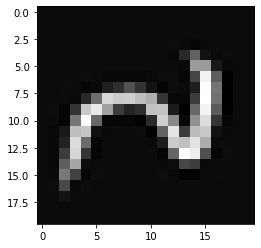

O dígito é: 5
O dígito previsto foi: 0


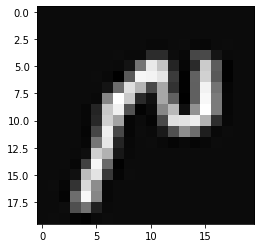

O dígito é: 5
O dígito previsto foi: 0


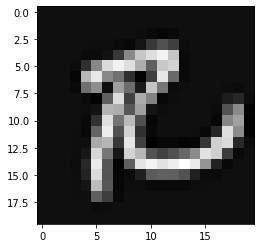

O dígito é: 5
O dígito previsto foi: 0


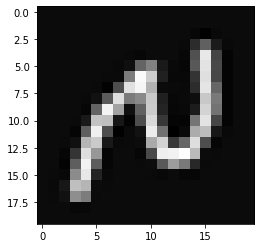

O dígito é: 5
O dígito previsto foi: 0


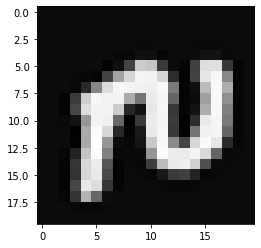

O dígito é: 5
O dígito previsto foi: 0


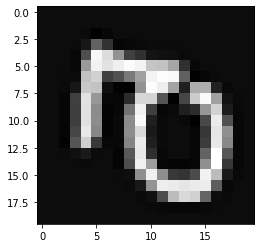

O dígito é: 5
O dígito previsto foi: 0


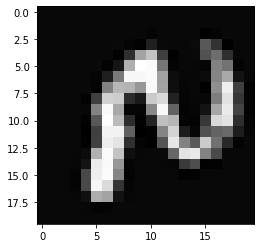

O dígito é: 5
O dígito previsto foi: 0


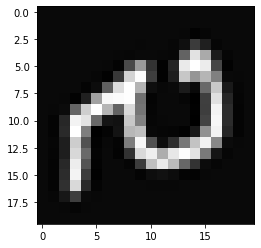

O dígito é: 5
O dígito previsto foi: 0


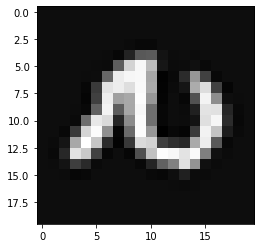

O dígito é: 5
O dígito previsto foi: 0


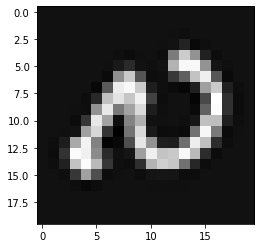

O dígito é: 5
O dígito previsto foi: 0


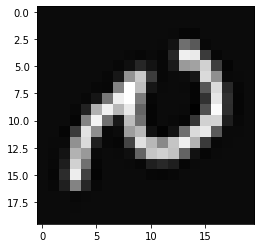

O dígito é: 5
O dígito previsto foi: 3


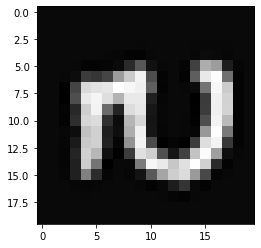

O dígito é: 5
O dígito previsto foi: 8


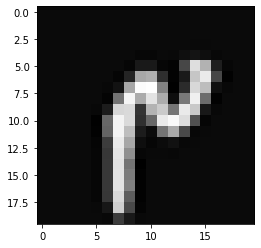

O dígito é: 5
O dígito previsto foi: 3


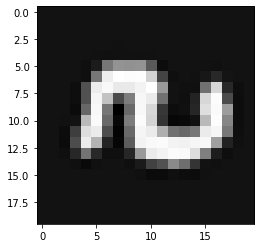

O dígito é: 5
O dígito previsto foi: 0


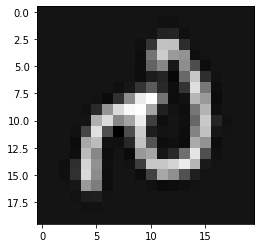

O dígito é: 5
O dígito previsto foi: 0


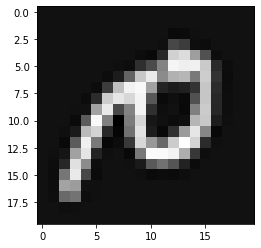

O dígito é: 5
O dígito previsto foi: 0


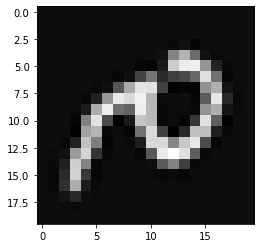

O dígito é: 5
O dígito previsto foi: 0


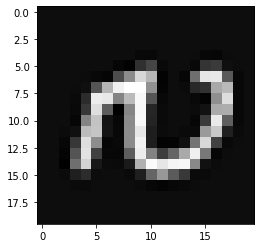

O dígito é: 5
O dígito previsto foi: 8


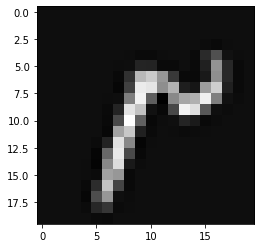

O dígito é: 5
O dígito previsto foi: 6


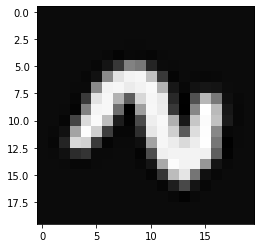

O dígito é: 5
O dígito previsto foi: 0


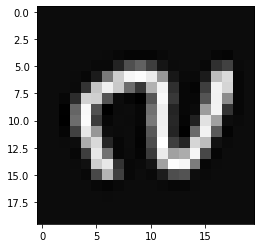

O dígito é: 5
O dígito previsto foi: 0


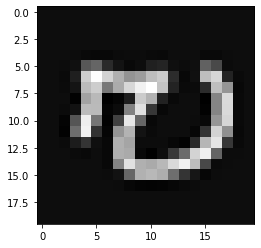

O dígito é: 5
O dígito previsto foi: 3


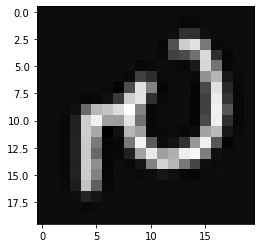

O dígito é: 5
O dígito previsto foi: 0


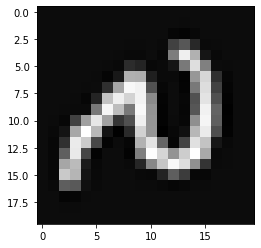

O dígito é: 5
O dígito previsto foi: 0


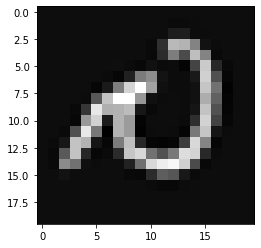

O dígito é: 5
O dígito previsto foi: 0


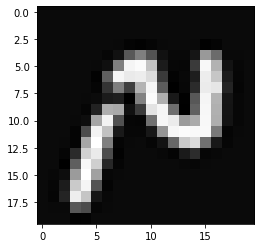

O dígito é: 5
O dígito previsto foi: 0


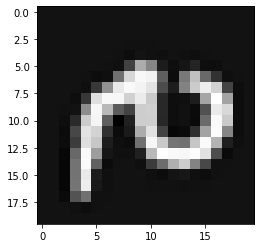

O dígito é: 5
O dígito previsto foi: 0


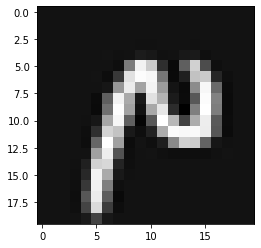

O dígito é: 5
O dígito previsto foi: 9


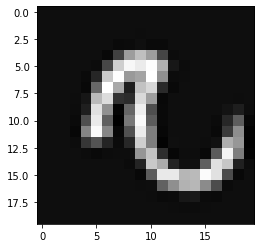

O dígito é: 5
O dígito previsto foi: 3


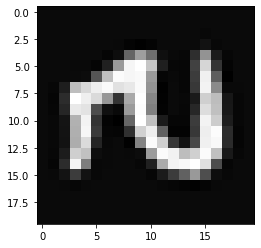

O dígito é: 5
O dígito previsto foi: 6


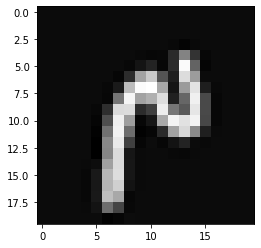

O dígito é: 5
O dígito previsto foi: 0


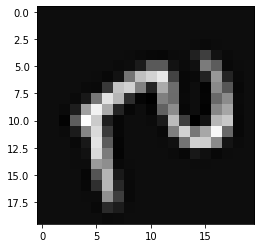

O dígito é: 5
O dígito previsto foi: 0


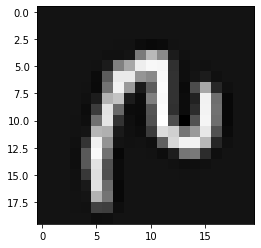

O dígito é: 5
O dígito previsto foi: 0


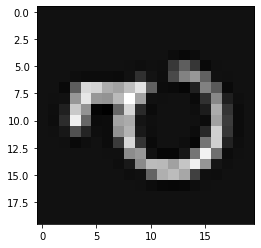

O dígito é: 5
O dígito previsto foi: 3


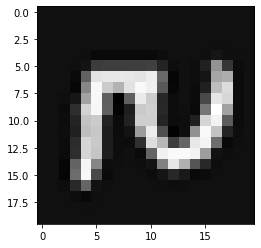

O dígito é: 5
O dígito previsto foi: 0


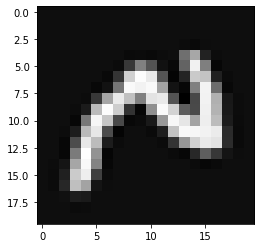

O dígito é: 5
O dígito previsto foi: 9


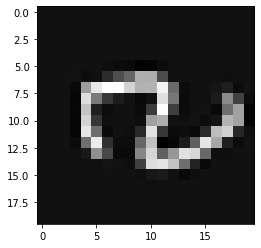

O dígito é: 5
O dígito previsto foi: 1


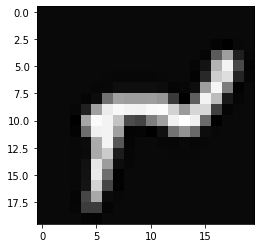

O dígito é: 5
O dígito previsto foi: 0


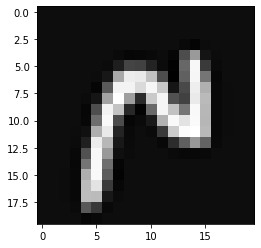

O dígito é: 5
O dígito previsto foi: 9


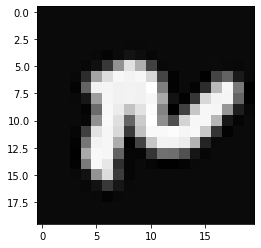

O dígito é: 5
O dígito previsto foi: 3


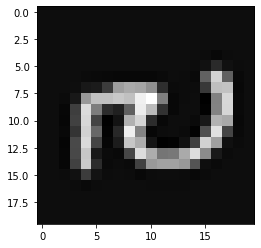

O dígito é: 5
O dígito previsto foi: 3


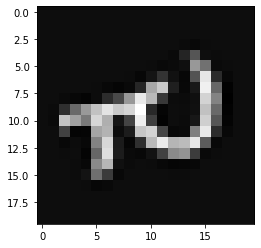

O dígito é: 5
O dígito previsto foi: 3


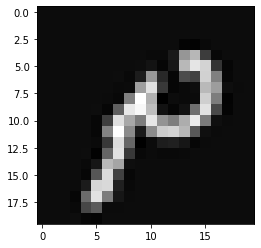

O dígito é: 5
O dígito previsto foi: 3


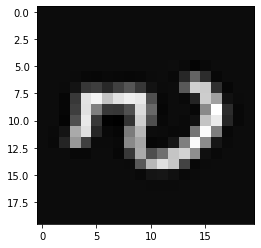

O dígito é: 5
O dígito previsto foi: 3


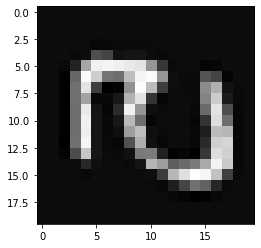

O dígito é: 5
O dígito previsto foi: 8


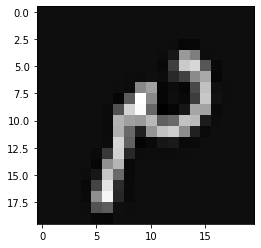

O dígito é: 5
O dígito previsto foi: 8


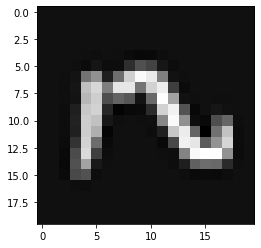

O dígito é: 5
O dígito previsto foi: 3


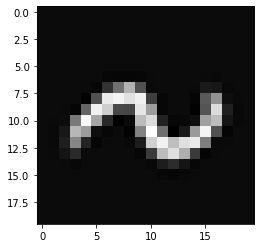

O dígito é: 5
O dígito previsto foi: 0


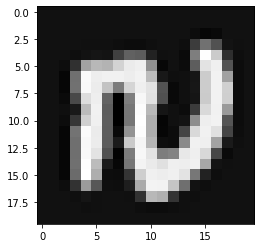

O dígito é: 5
O dígito previsto foi: 3


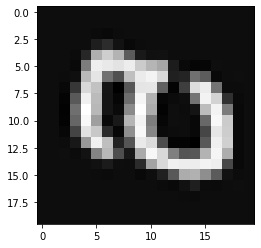

O dígito é: 5
O dígito previsto foi: 7


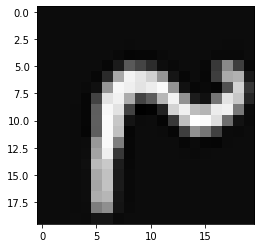

O dígito é: 5
O dígito previsto foi: 0


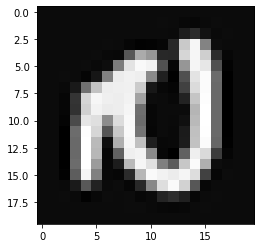

O dígito é: 5
O dígito previsto foi: 0


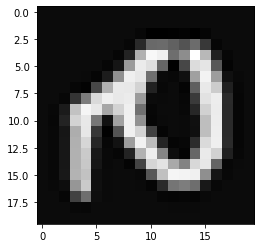

O dígito é: 5
O dígito previsto foi: 6


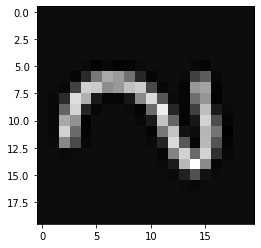

O dígito é: 5
O dígito previsto foi: 0


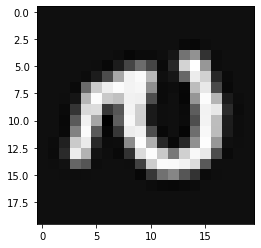

O dígito é: 5
O dígito previsto foi: 3


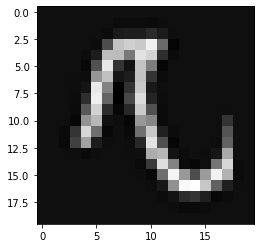

O dígito é: 5
O dígito previsto foi: 9


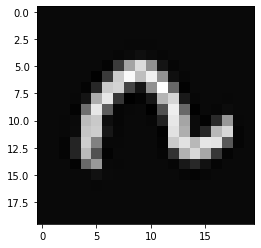

O dígito é: 5
O dígito previsto foi: 8


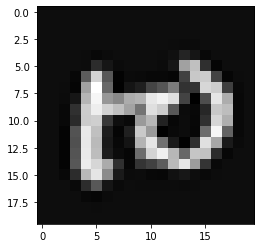

O dígito é: 5
O dígito previsto foi: 0


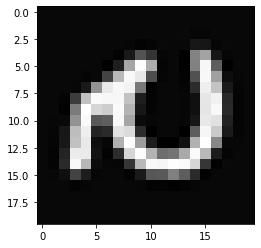

O dígito é: 5
O dígito previsto foi: 0


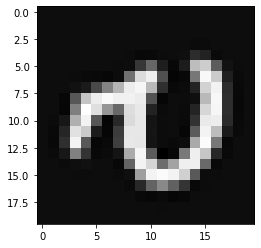

O dígito é: 5
O dígito previsto foi: 0


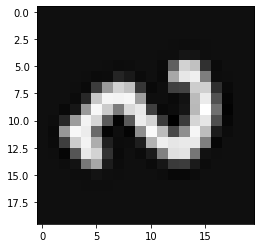

O dígito é: 5
O dígito previsto foi: 0


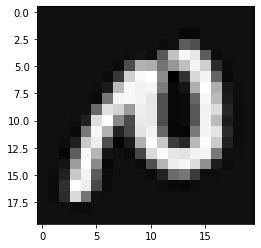

O dígito é: 5
O dígito previsto foi: 0


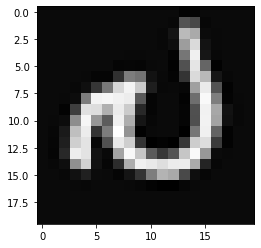

O dígito é: 5
O dígito previsto foi: 0


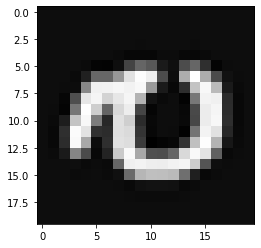

O dígito é: 5
O dígito previsto foi: 6


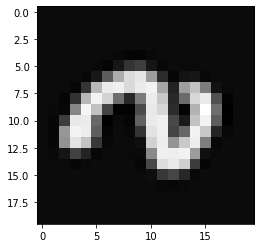

O dígito é: 5
O dígito previsto foi: 6


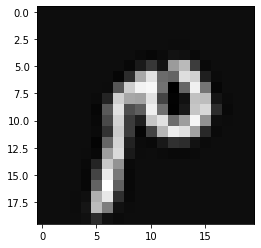

O dígito é: 5
O dígito previsto foi: 0


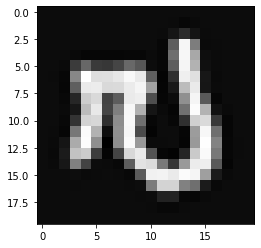

O dígito é: 5
O dígito previsto foi: 9


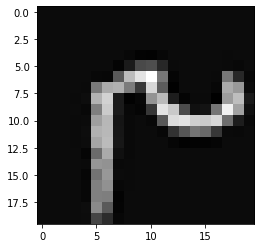

O dígito é: 5
O dígito previsto foi: 0


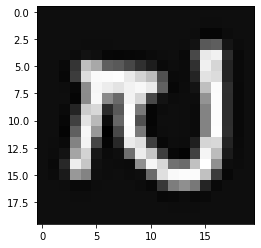

O dígito é: 5
O dígito previsto foi: 8


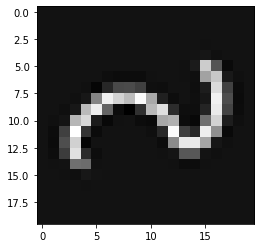

O dígito é: 5
O dígito previsto foi: 0


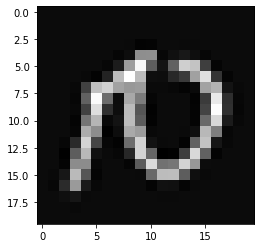

O dígito é: 5
O dígito previsto foi: 8


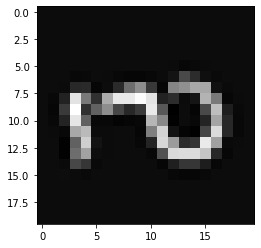

O dígito é: 5
O dígito previsto foi: 8


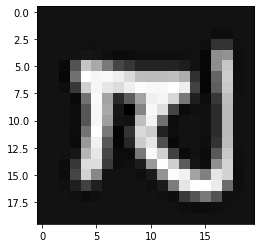

O dígito é: 5
O dígito previsto foi: 0


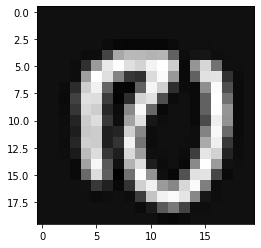

O dígito é: 5
O dígito previsto foi: 3


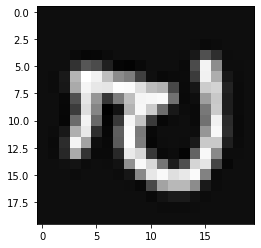

O dígito é: 5
O dígito previsto foi: 3


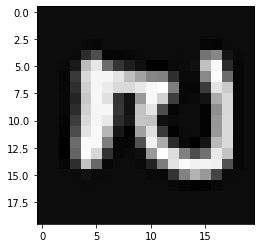

O dígito é: 5
O dígito previsto foi: 0


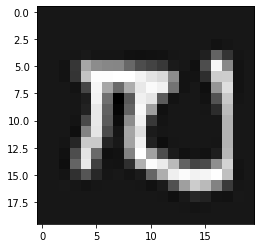

O dígito é: 5
O dígito previsto foi: 1


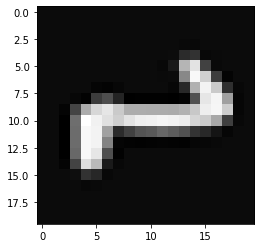

O dígito é: 5
O dígito previsto foi: 8


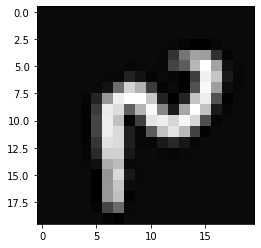

O dígito é: 5
O dígito previsto foi: 2


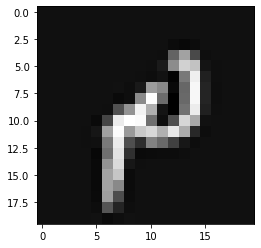

O dígito é: 5
O dígito previsto foi: 0


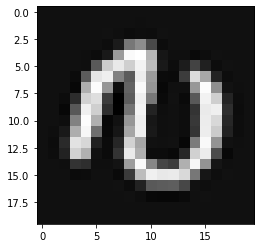

O dígito é: 5
O dígito previsto foi: 8


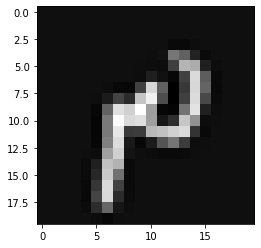

O dígito é: 5
O dígito previsto foi: 3


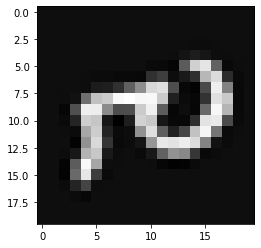

O dígito é: 5
O dígito previsto foi: 3


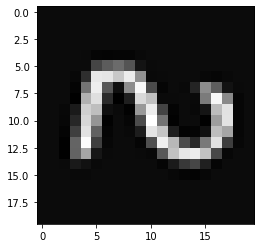

O dígito é: 5
O dígito previsto foi: 3


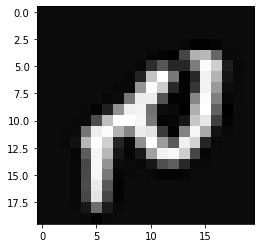

O dígito é: 5
O dígito previsto foi: 3


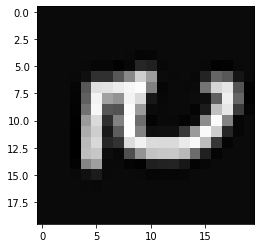

O dígito é: 5
O dígito previsto foi: 0


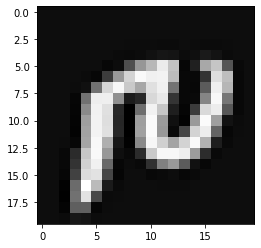

O dígito é: 5
O dígito previsto foi: 3


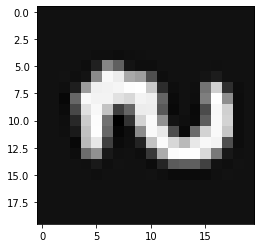

O dígito é: 5
O dígito previsto foi: 2


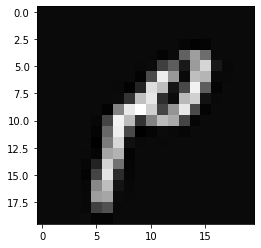

O dígito é: 5
O dígito previsto foi: 3


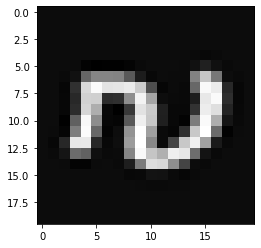

O dígito é: 5
O dígito previsto foi: 8


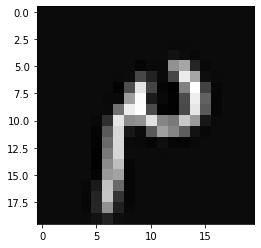

O dígito é: 5
O dígito previsto foi: 3


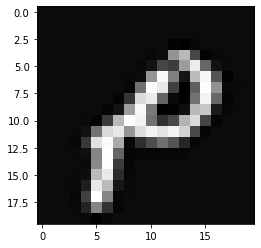

O dígito é: 5
O dígito previsto foi: 4


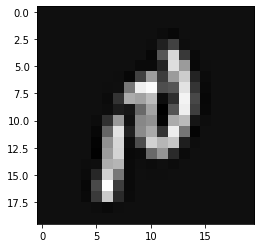

O dígito é: 5
O dígito previsto foi: 0


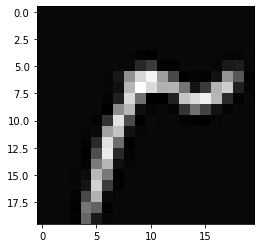

O dígito é: 5
O dígito previsto foi: 9


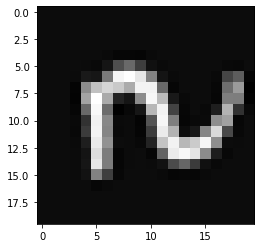

O dígito é: 5
O dígito previsto foi: 2


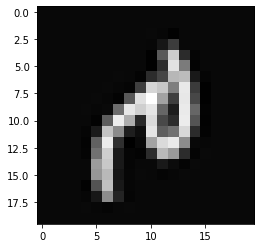

O dígito é: 5
O dígito previsto foi: 8


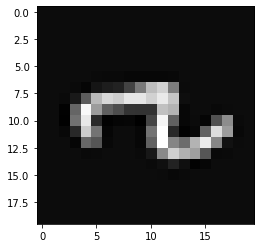

O dígito é: 5
O dígito previsto foi: 3


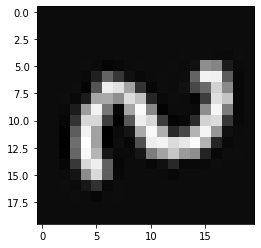

O dígito é: 5
O dígito previsto foi: 6


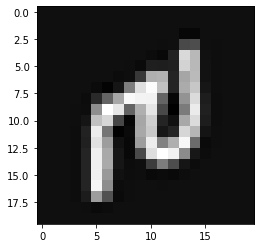

O dígito é: 5
O dígito previsto foi: 0


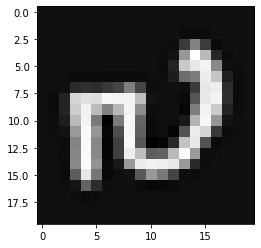

O dígito é: 5
O dígito previsto foi: 8


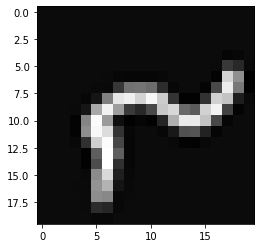

O dígito é: 5
O dígito previsto foi: 4


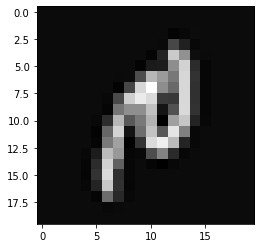

O dígito é: 5
O dígito previsto foi: 6


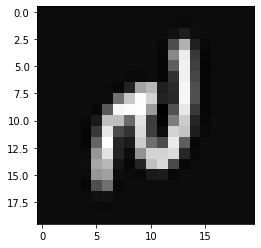

O dígito é: 5
O dígito previsto foi: 6


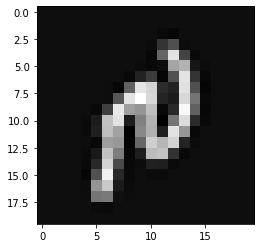

O dígito é: 5
O dígito previsto foi: 9


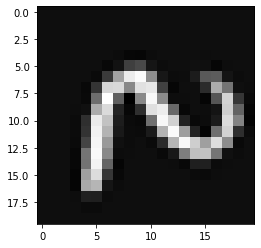

O dígito é: 5
O dígito previsto foi: 9


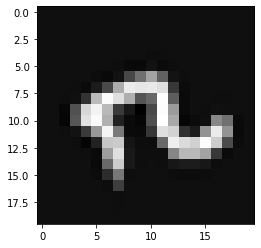

O dígito é: 5
O dígito previsto foi: 0


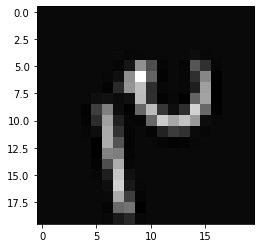

O dígito é: 5
O dígito previsto foi: 0


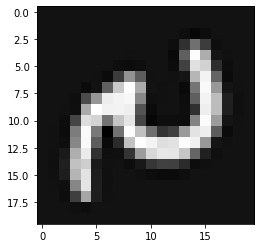

O dígito é: 5
O dígito previsto foi: 0


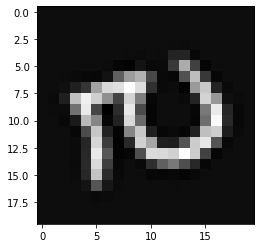

O dígito é: 5
O dígito previsto foi: 0


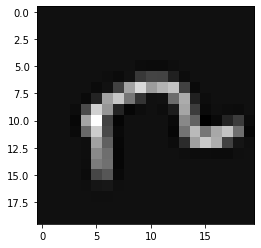

O dígito é: 5
O dígito previsto foi: 0


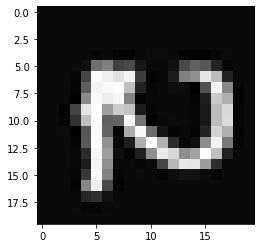

O dígito é: 5
O dígito previsto foi: 3


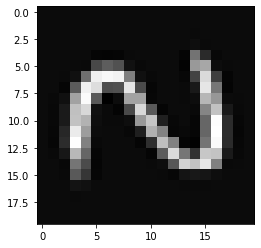

O dígito é: 5
O dígito previsto foi: 3


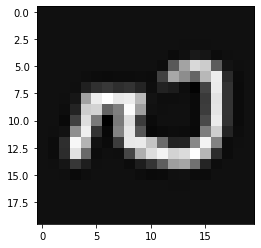

O dígito é: 5
O dígito previsto foi: 6


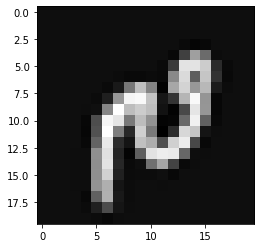

O dígito é: 5
O dígito previsto foi: 8


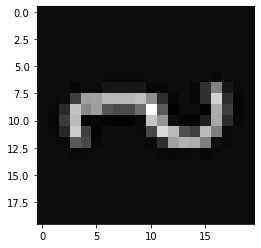

O dígito é: 5
O dígito previsto foi: 3


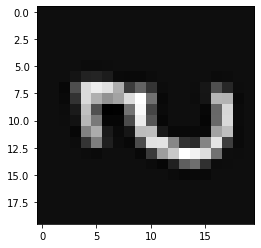

O dígito é: 5
O dígito previsto foi: 8


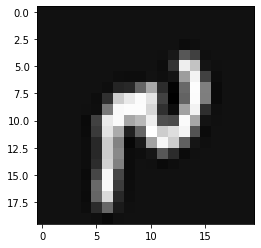

O dígito é: 5
O dígito previsto foi: 8


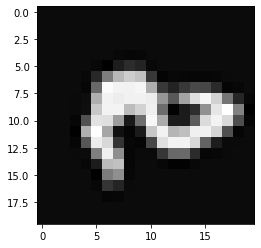

O dígito é: 5
O dígito previsto foi: 0


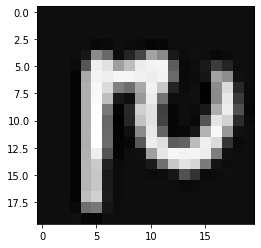

O dígito é: 5
O dígito previsto foi: 6


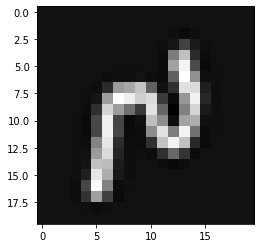

O dígito é: 5
O dígito previsto foi: 9


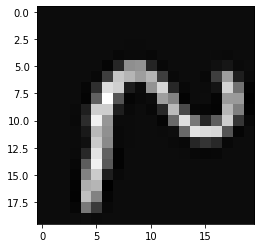

O dígito é: 5
O dígito previsto foi: 8


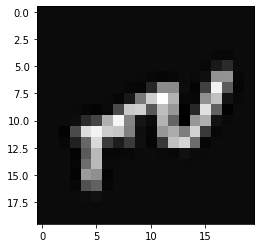

O dígito é: 5
O dígito previsto foi: 0


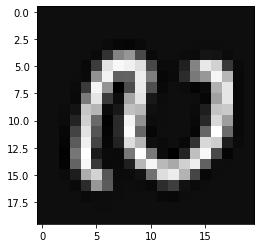

O dígito é: 5
O dígito previsto foi: 3


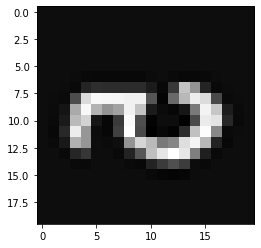

O dígito é: 5
O dígito previsto foi: 0


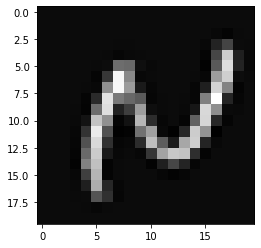

O dígito é: 5
O dígito previsto foi: 3


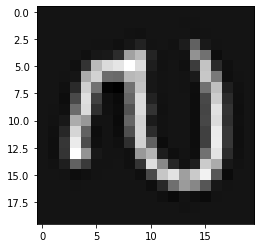

O dígito é: 5
O dígito previsto foi: 8


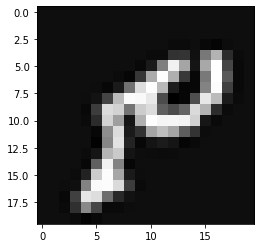

O dígito é: 5
O dígito previsto foi: 8


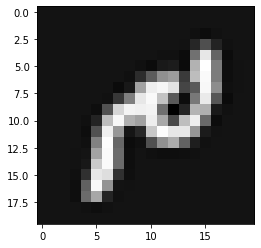

O dígito é: 5
O dígito previsto foi: 8


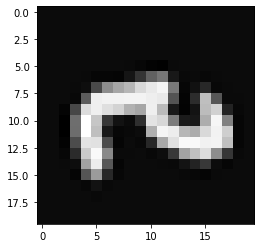

O dígito é: 5
O dígito previsto foi: 8


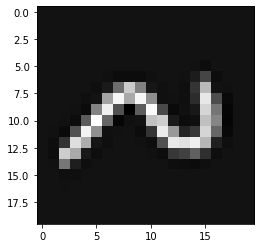

O dígito é: 5
O dígito previsto foi: 3


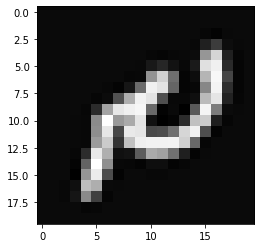

O dígito é: 5
O dígito previsto foi: 3


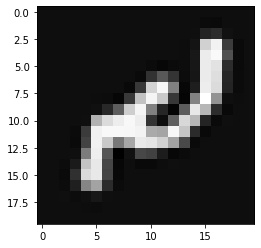

O dígito é: 5
O dígito previsto foi: 3


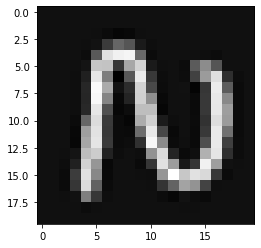

O dígito é: 5
O dígito previsto foi: 0


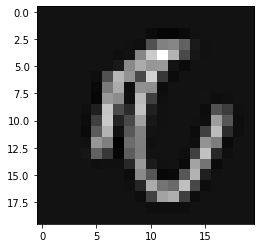

O dígito é: 5
O dígito previsto foi: 1


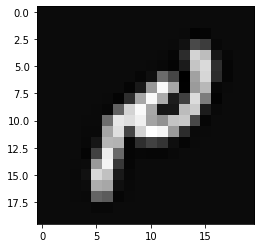

O dígito é: 6
O dígito previsto foi: 1


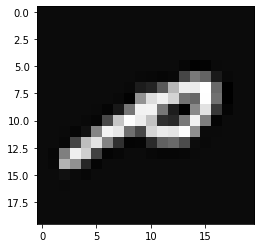

O dígito é: 6
O dígito previsto foi: 4


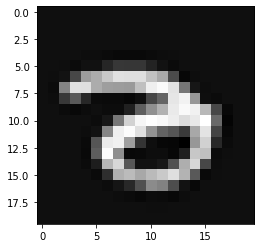

O dígito é: 6
O dígito previsto foi: 0


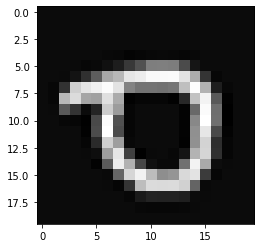

O dígito é: 6
O dígito previsto foi: 2


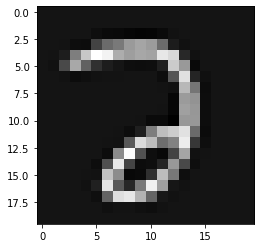

O dígito é: 6
O dígito previsto foi: 0


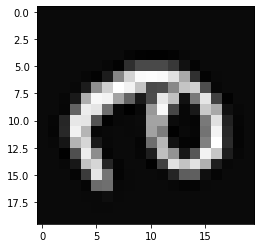

O dígito é: 6
O dígito previsto foi: 2


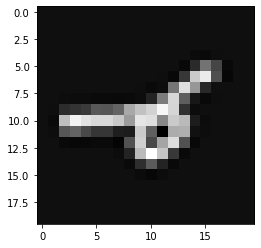

O dígito é: 6
O dígito previsto foi: 0


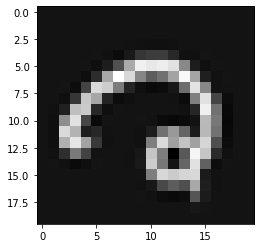

O dígito é: 6
O dígito previsto foi: 2


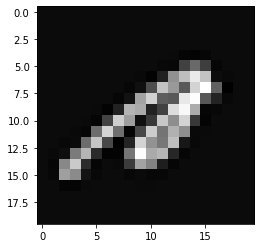

O dígito é: 6
O dígito previsto foi: 1


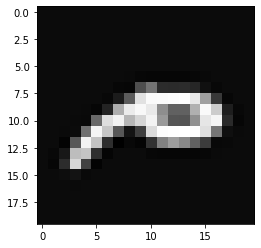

O dígito é: 6
O dígito previsto foi: 0


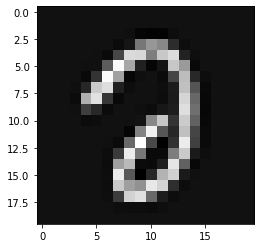

O dígito é: 6
O dígito previsto foi: 0


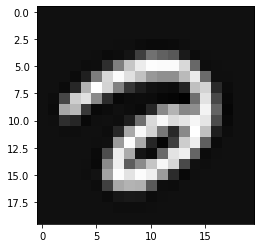

O dígito é: 6
O dígito previsto foi: 2


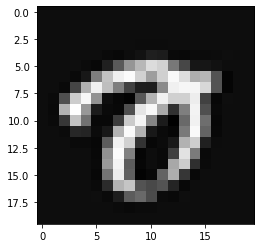

O dígito é: 6
O dígito previsto foi: 0


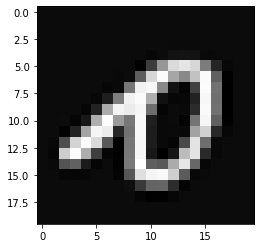

O dígito é: 6
O dígito previsto foi: 0


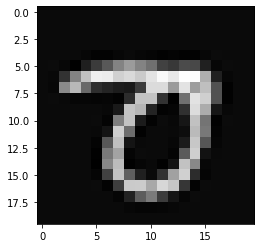

O dígito é: 6
O dígito previsto foi: 1


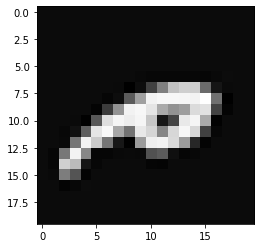

O dígito é: 6
O dígito previsto foi: 0


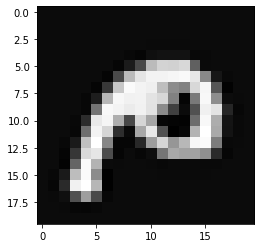

O dígito é: 6
O dígito previsto foi: 8


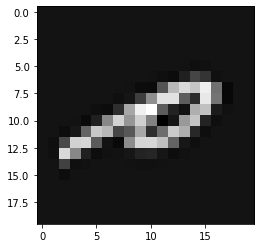

O dígito é: 6
O dígito previsto foi: 1


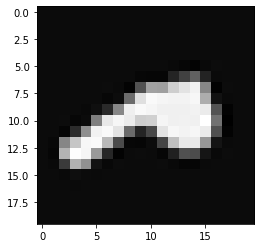

O dígito é: 6
O dígito previsto foi: 1


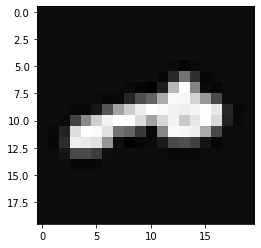

O dígito é: 6
O dígito previsto foi: 0


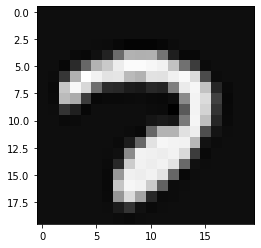

O dígito é: 6
O dígito previsto foi: 5


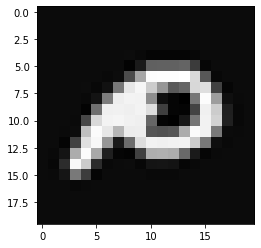

O dígito é: 6
O dígito previsto foi: 2


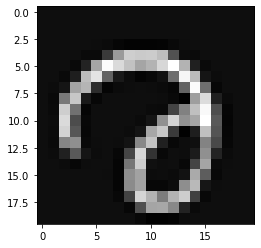

O dígito é: 6
O dígito previsto foi: 2


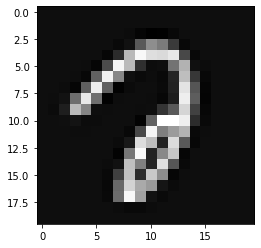

O dígito é: 6
O dígito previsto foi: 4


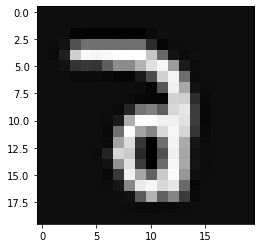

O dígito é: 6
O dígito previsto foi: 8


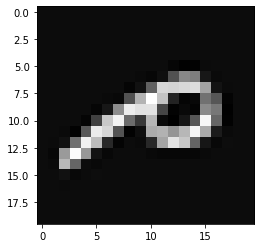

O dígito é: 6
O dígito previsto foi: 0


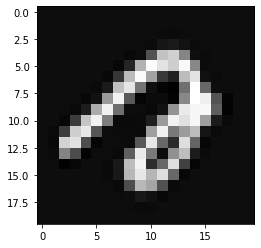

O dígito é: 6
O dígito previsto foi: 1


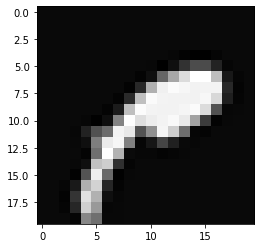

O dígito é: 6
O dígito previsto foi: 1


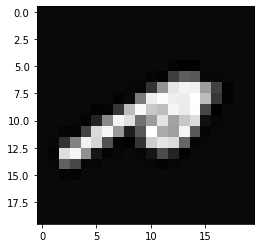

O dígito é: 6
O dígito previsto foi: 2


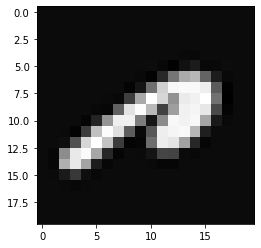

O dígito é: 6
O dígito previsto foi: 0


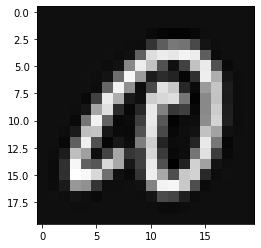

O dígito é: 6
O dígito previsto foi: 8


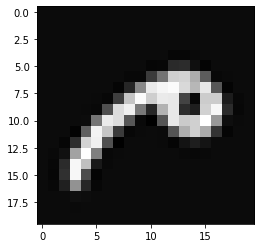

O dígito é: 6
O dígito previsto foi: 0


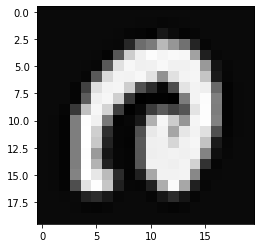

O dígito é: 6
O dígito previsto foi: 0


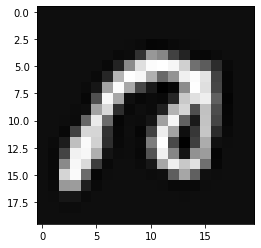

O dígito é: 6
O dígito previsto foi: 2


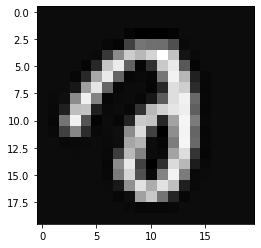

O dígito é: 6
O dígito previsto foi: 4


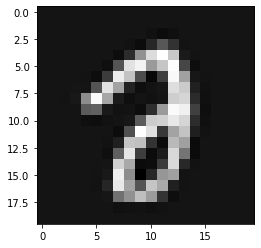

O dígito é: 6
O dígito previsto foi: 2


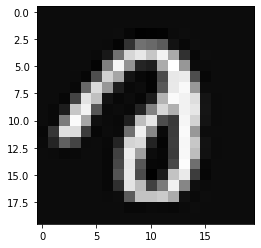

O dígito é: 6
O dígito previsto foi: 0


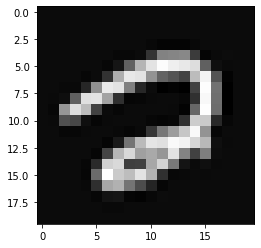

O dígito é: 6
O dígito previsto foi: 2


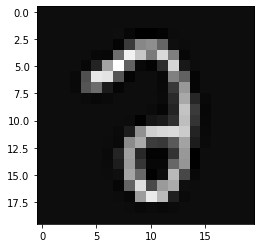

O dígito é: 6
O dígito previsto foi: 0


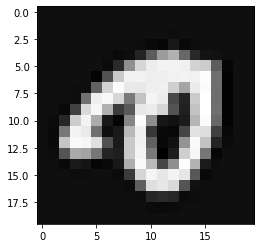

O dígito é: 6
O dígito previsto foi: 2


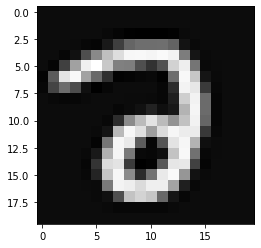

O dígito é: 6
O dígito previsto foi: 8


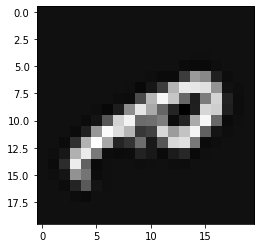

O dígito é: 6
O dígito previsto foi: 0


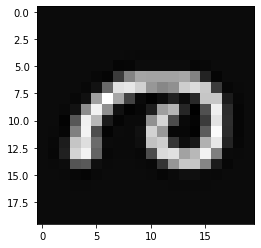

O dígito é: 6
O dígito previsto foi: 8


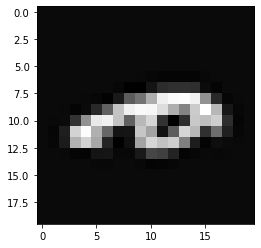

O dígito é: 6
O dígito previsto foi: 0


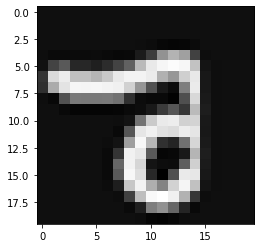

O dígito é: 6
O dígito previsto foi: 0


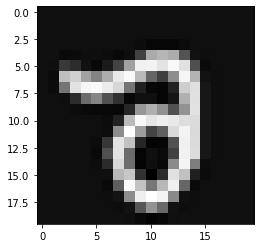

O dígito é: 6
O dígito previsto foi: 2


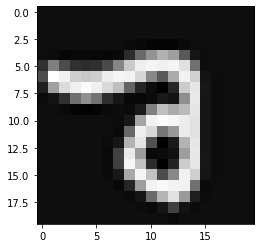

O dígito é: 7
O dígito previsto foi: 8


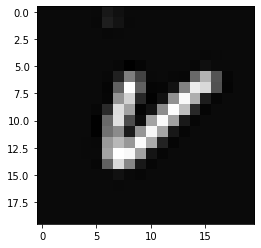

O dígito é: 7
O dígito previsto foi: 9


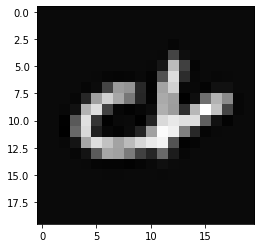

O dígito é: 7
O dígito previsto foi: 0


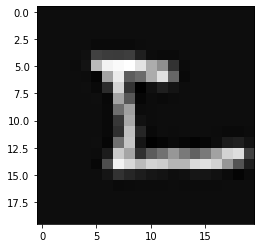

O dígito é: 7
O dígito previsto foi: 1


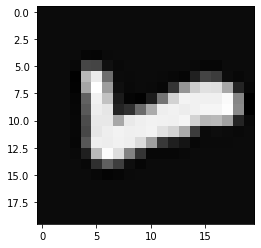

O dígito é: 7
O dígito previsto foi: 9


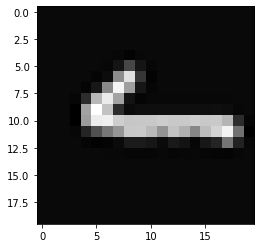

O dígito é: 7
O dígito previsto foi: 9


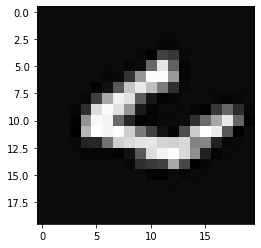

O dígito é: 7
O dígito previsto foi: 1


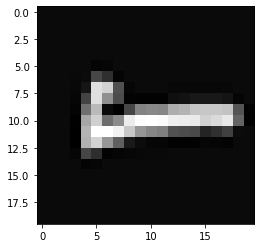

O dígito é: 7
O dígito previsto foi: 9


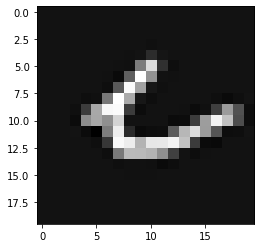

O dígito é: 7
O dígito previsto foi: 0


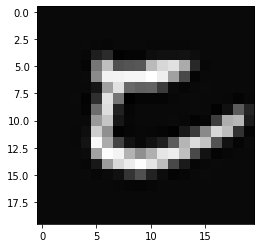

O dígito é: 7
O dígito previsto foi: 0


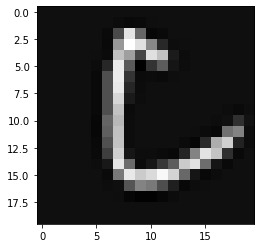

O dígito é: 7
O dígito previsto foi: 2


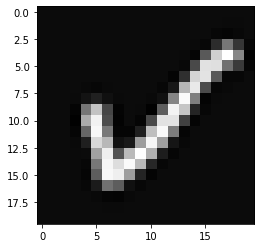

O dígito é: 7
O dígito previsto foi: 8


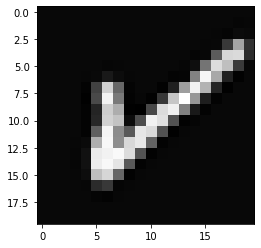

O dígito é: 7
O dígito previsto foi: 1


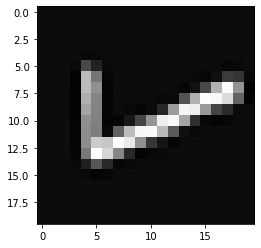

O dígito é: 7
O dígito previsto foi: 9


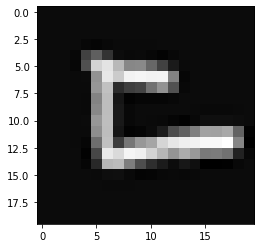

O dígito é: 7
O dígito previsto foi: 8


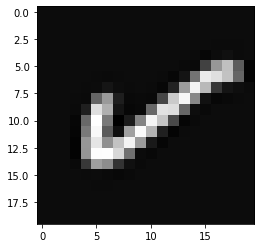

O dígito é: 7
O dígito previsto foi: 0


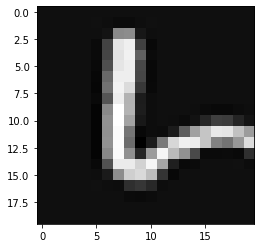

O dígito é: 7
O dígito previsto foi: 1


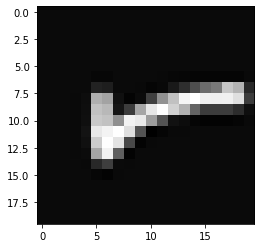

O dígito é: 7
O dígito previsto foi: 8


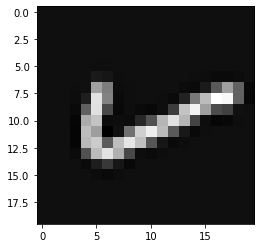

O dígito é: 7
O dígito previsto foi: 1


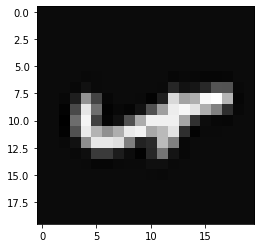

O dígito é: 7
O dígito previsto foi: 8


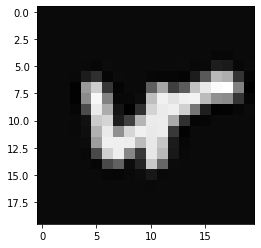

O dígito é: 7
O dígito previsto foi: 4


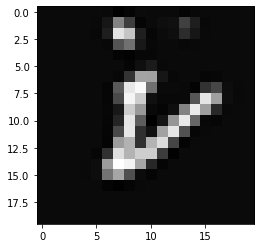

O dígito é: 7
O dígito previsto foi: 8


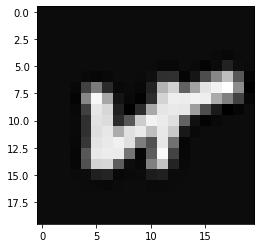

O dígito é: 7
O dígito previsto foi: 9


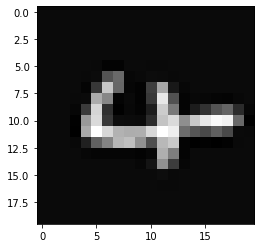

O dígito é: 7
O dígito previsto foi: 4


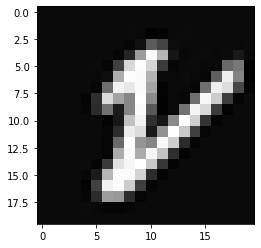

O dígito é: 7
O dígito previsto foi: 0


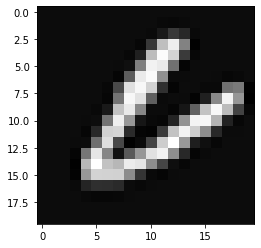

O dígito é: 7
O dígito previsto foi: 4


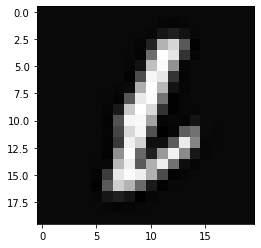

O dígito é: 7
O dígito previsto foi: 8


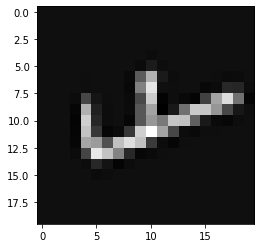

O dígito é: 7
O dígito previsto foi: 1


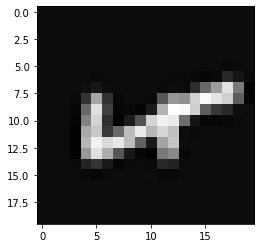

O dígito é: 7
O dígito previsto foi: 0


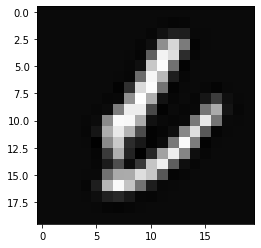

O dígito é: 7
O dígito previsto foi: 9


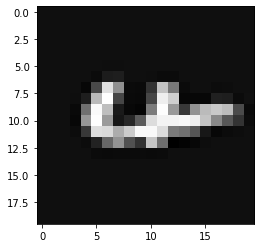

O dígito é: 7
O dígito previsto foi: 4


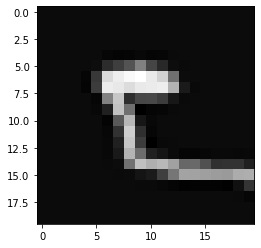

O dígito é: 7
O dígito previsto foi: 9


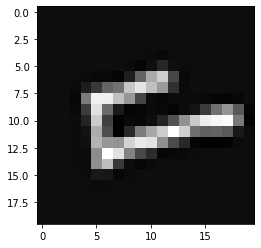

O dígito é: 7
O dígito previsto foi: 0


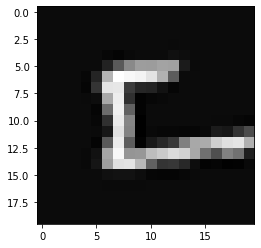

O dígito é: 7
O dígito previsto foi: 6


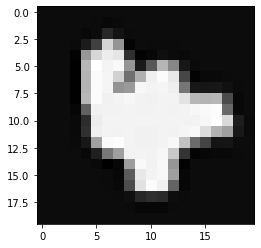

O dígito é: 7
O dígito previsto foi: 0


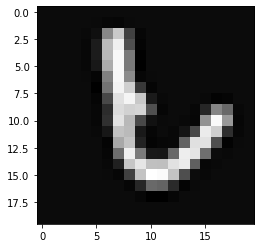

O dígito é: 7
O dígito previsto foi: 1


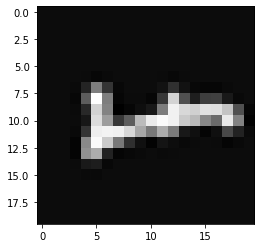

O dígito é: 7
O dígito previsto foi: 1


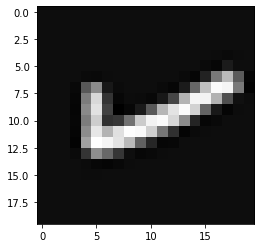

O dígito é: 7
O dígito previsto foi: 0


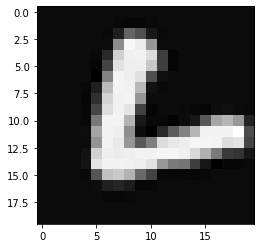

O dígito é: 7
O dígito previsto foi: 0


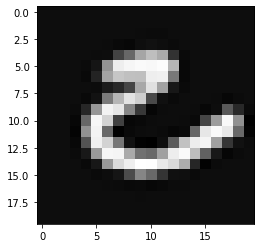

O dígito é: 7
O dígito previsto foi: 2


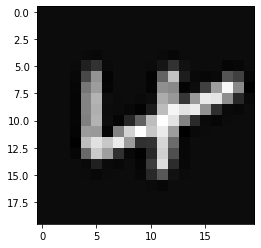

O dígito é: 7
O dígito previsto foi: 2


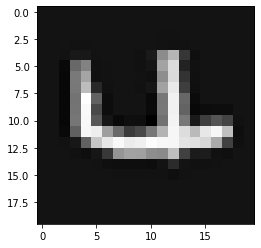

O dígito é: 7
O dígito previsto foi: 1


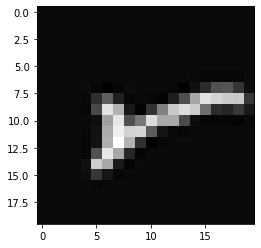

O dígito é: 7
O dígito previsto foi: 4


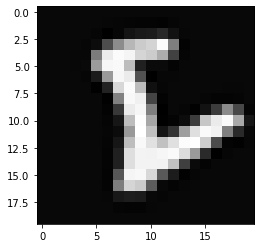

O dígito é: 7
O dígito previsto foi: 0


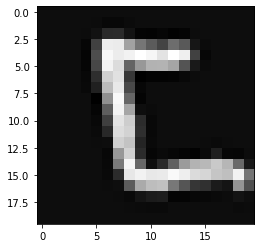

O dígito é: 7
O dígito previsto foi: 0


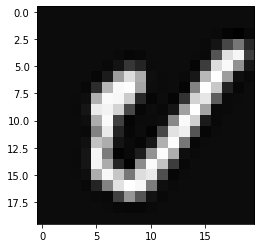

O dígito é: 7
O dígito previsto foi: 9


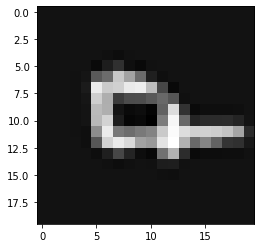

O dígito é: 7
O dígito previsto foi: 9


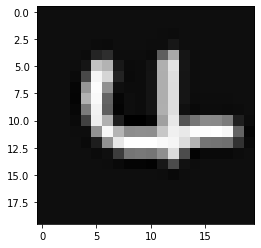

O dígito é: 7
O dígito previsto foi: 3


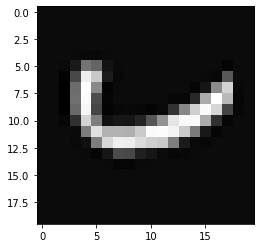

O dígito é: 7
O dígito previsto foi: 9


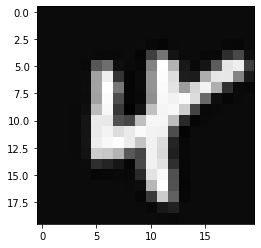

O dígito é: 7
O dígito previsto foi: 0


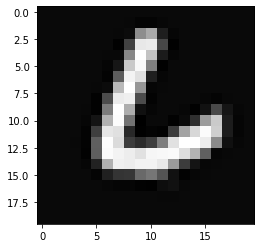

O dígito é: 7
O dígito previsto foi: 2


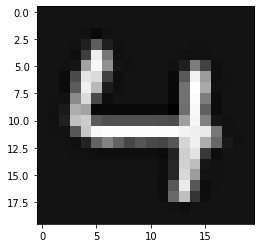

O dígito é: 7
O dígito previsto foi: 0


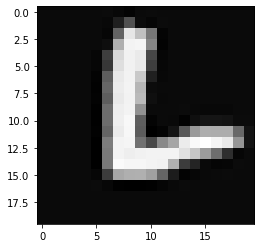

O dígito é: 7
O dígito previsto foi: 0


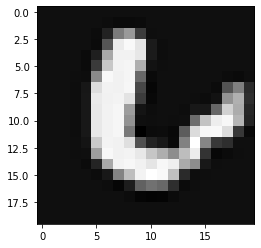

O dígito é: 7
O dígito previsto foi: 1


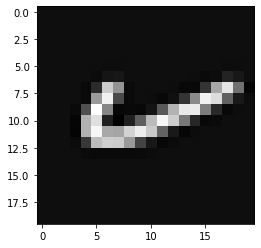

O dígito é: 7
O dígito previsto foi: 1


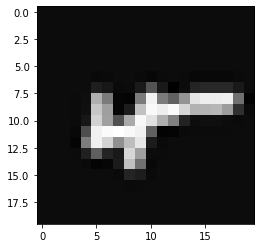

O dígito é: 7
O dígito previsto foi: 8


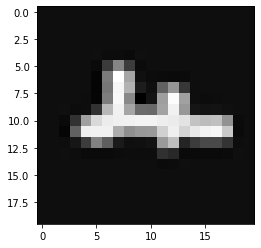

O dígito é: 7
O dígito previsto foi: 1


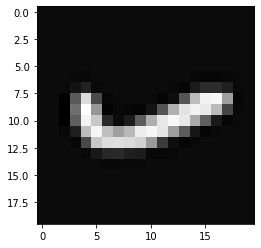

O dígito é: 7
O dígito previsto foi: 1


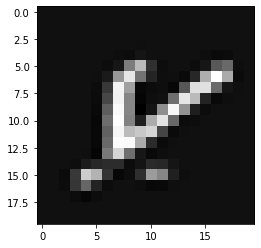

O dígito é: 7
O dígito previsto foi: 8


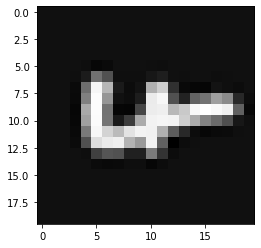

O dígito é: 7
O dígito previsto foi: 9


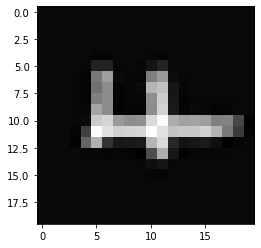

O dígito é: 7
O dígito previsto foi: 1


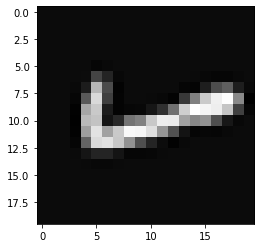

O dígito é: 7
O dígito previsto foi: 1


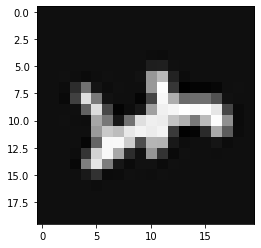

O dígito é: 7
O dígito previsto foi: 4


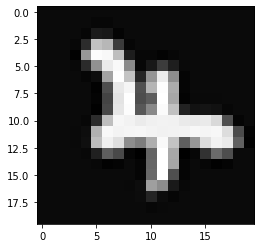

O dígito é: 7
O dígito previsto foi: 0


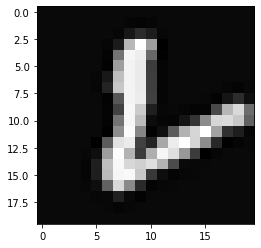

O dígito é: 7
O dígito previsto foi: 0


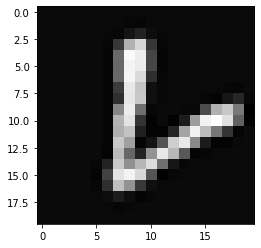

O dígito é: 7
O dígito previsto foi: 1


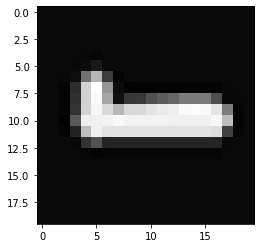

O dígito é: 7
O dígito previsto foi: 0


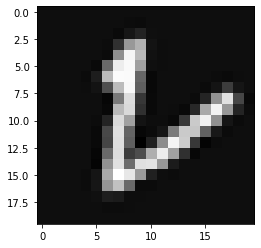

O dígito é: 7
O dígito previsto foi: 0


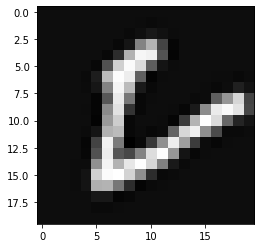

O dígito é: 7
O dígito previsto foi: 0


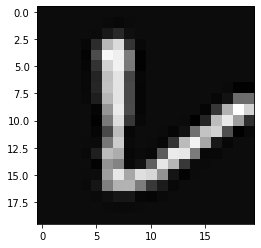

O dígito é: 7
O dígito previsto foi: 0


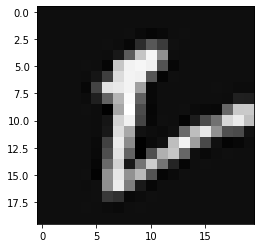

O dígito é: 7
O dígito previsto foi: 0


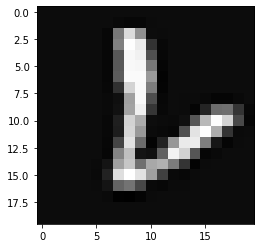

O dígito é: 7
O dígito previsto foi: 8


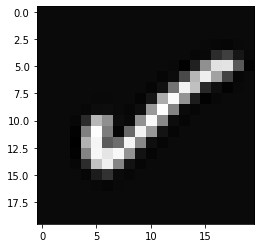

O dígito é: 7
O dígito previsto foi: 4


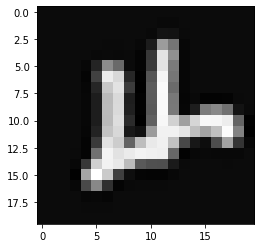

O dígito é: 7
O dígito previsto foi: 1


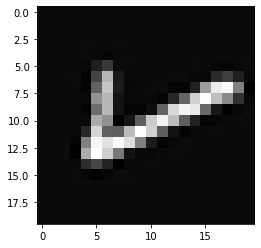

O dígito é: 7
O dígito previsto foi: 8


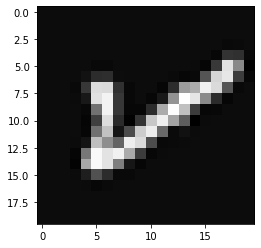

O dígito é: 7
O dígito previsto foi: 9


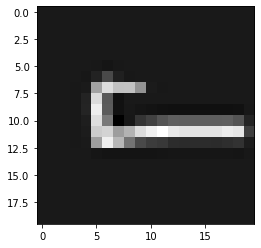

O dígito é: 7
O dígito previsto foi: 2


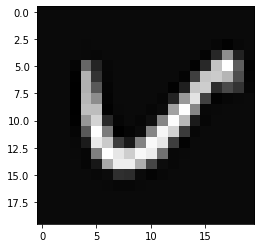

O dígito é: 7
O dígito previsto foi: 1


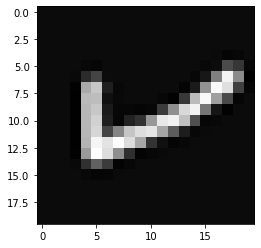

O dígito é: 7
O dígito previsto foi: 9


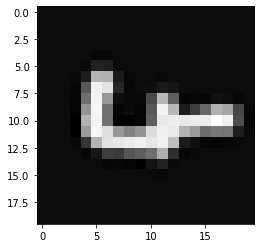

O dígito é: 7
O dígito previsto foi: 2


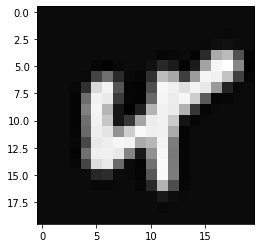

O dígito é: 7
O dígito previsto foi: 0


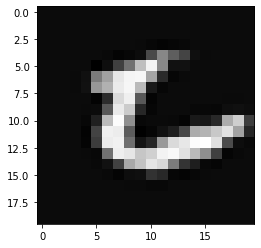

O dígito é: 7
O dígito previsto foi: 0


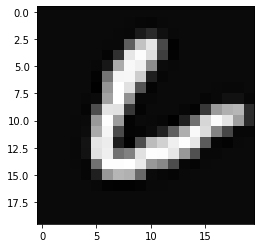

O dígito é: 7
O dígito previsto foi: 0


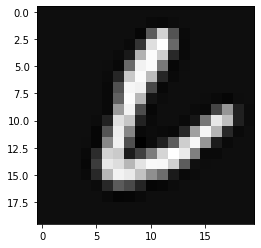

O dígito é: 7
O dígito previsto foi: 0


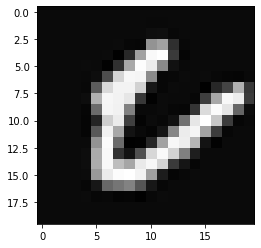

O dígito é: 7
O dígito previsto foi: 9


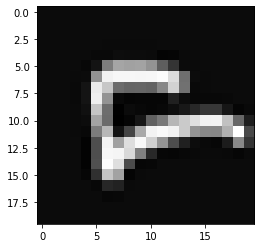

O dígito é: 7
O dígito previsto foi: 4


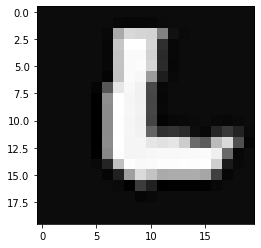

O dígito é: 7
O dígito previsto foi: 9


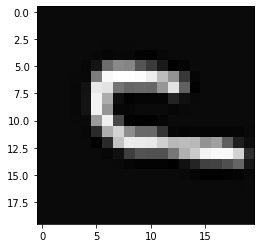

O dígito é: 8
O dígito previsto foi: 3


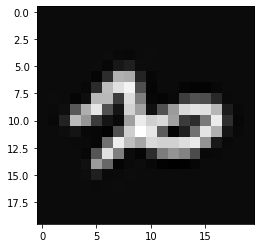

O dígito é: 8
O dígito previsto foi: 3


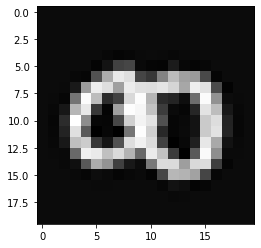

O dígito é: 8
O dígito previsto foi: 3


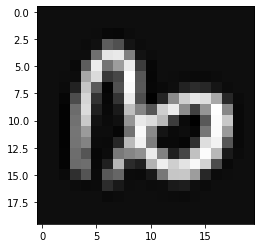

O dígito é: 8
O dígito previsto foi: 3


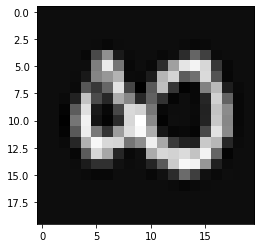

O dígito é: 8
O dígito previsto foi: 2


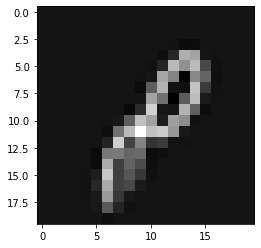

O dígito é: 8
O dígito previsto foi: 6


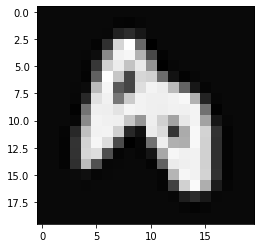

O dígito é: 8
O dígito previsto foi: 3


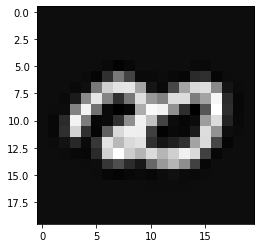

O dígito é: 8
O dígito previsto foi: 3


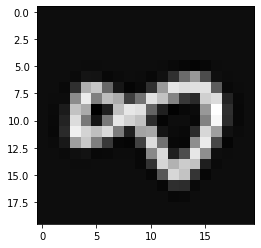

O dígito é: 8
O dígito previsto foi: 6


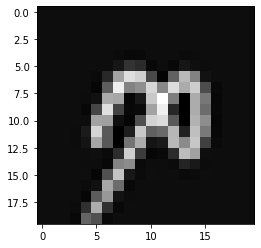

O dígito é: 8
O dígito previsto foi: 3


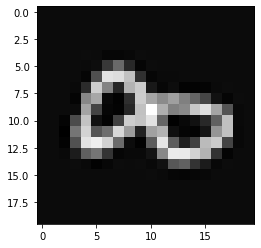

O dígito é: 8
O dígito previsto foi: 3


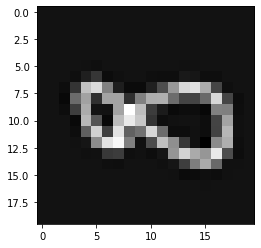

O dígito é: 8
O dígito previsto foi: 3


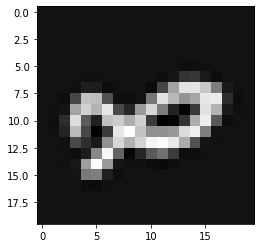

O dígito é: 8
O dígito previsto foi: 3


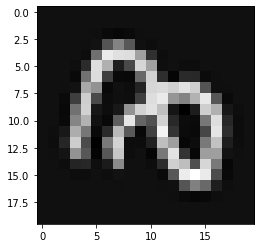

O dígito é: 8
O dígito previsto foi: 2


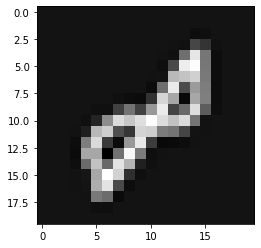

O dígito é: 8
O dígito previsto foi: 3


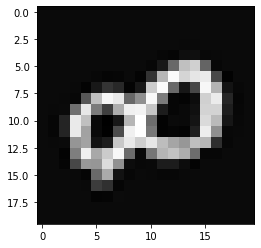

O dígito é: 8
O dígito previsto foi: 3


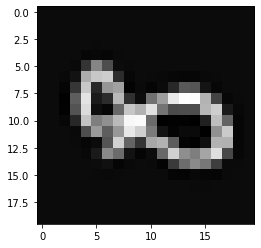

O dígito é: 8
O dígito previsto foi: 3


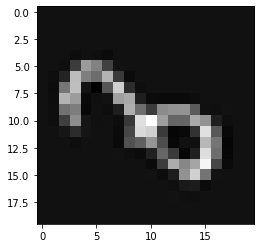

O dígito é: 8
O dígito previsto foi: 3


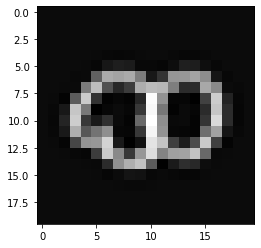

O dígito é: 8
O dígito previsto foi: 3


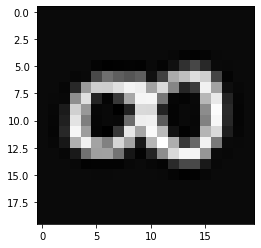

O dígito é: 8
O dígito previsto foi: 0


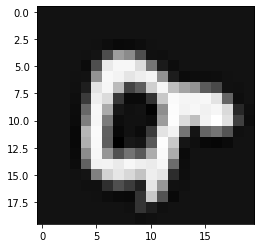

O dígito é: 8
O dígito previsto foi: 0


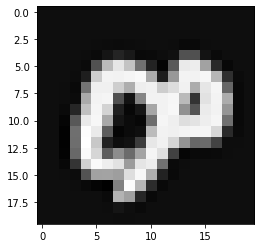

O dígito é: 8
O dígito previsto foi: 6


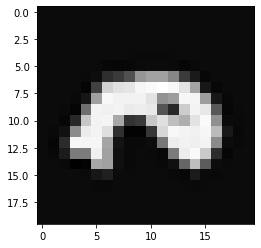

O dígito é: 8
O dígito previsto foi: 3


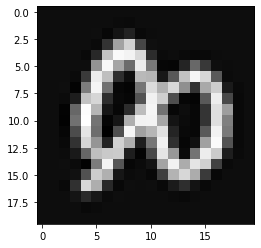

O dígito é: 8
O dígito previsto foi: 9


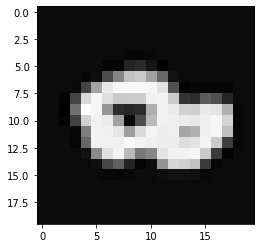

O dígito é: 8
O dígito previsto foi: 3


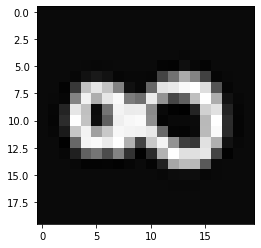

O dígito é: 8
O dígito previsto foi: 3


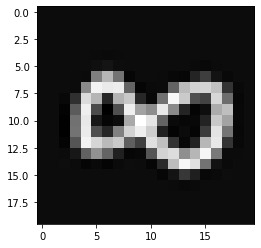

O dígito é: 8
O dígito previsto foi: 3


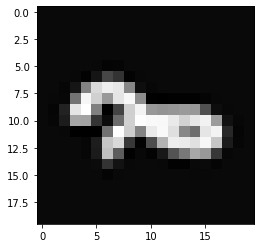

O dígito é: 8
O dígito previsto foi: 3


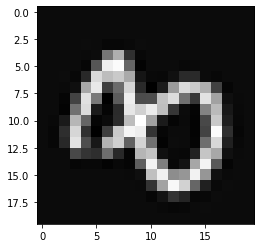

O dígito é: 8
O dígito previsto foi: 9


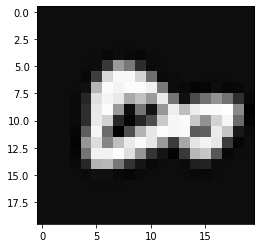

O dígito é: 8
O dígito previsto foi: 6


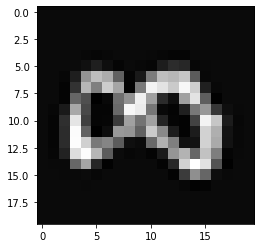

O dígito é: 8
O dígito previsto foi: 2


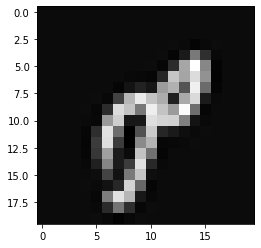

O dígito é: 8
O dígito previsto foi: 3


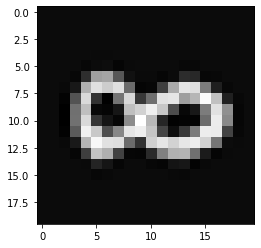

O dígito é: 8
O dígito previsto foi: 3


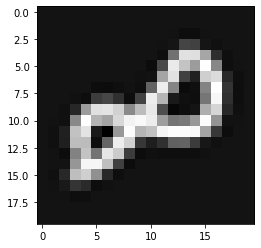

O dígito é: 8
O dígito previsto foi: 0


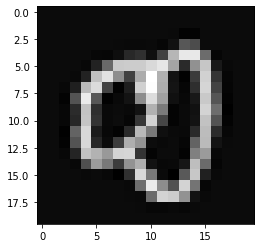

O dígito é: 8
O dígito previsto foi: 3


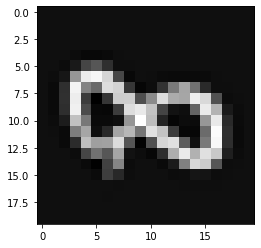

O dígito é: 8
O dígito previsto foi: 3


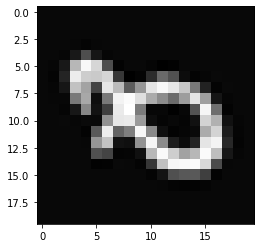

O dígito é: 8
O dígito previsto foi: 0


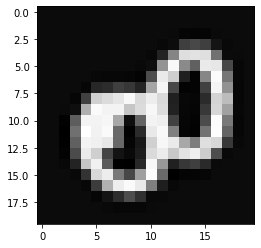

O dígito é: 8
O dígito previsto foi: 3


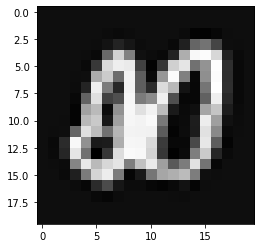

O dígito é: 8
O dígito previsto foi: 0


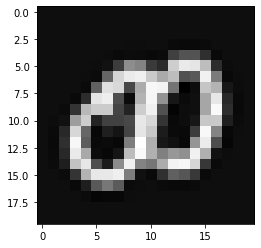

O dígito é: 8
O dígito previsto foi: 0


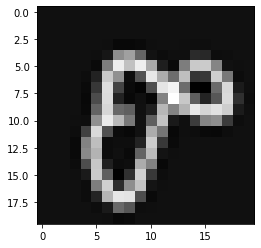

O dígito é: 8
O dígito previsto foi: 0


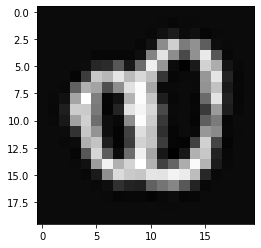

O dígito é: 8
O dígito previsto foi: 0


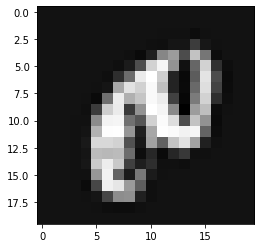

O dígito é: 8
O dígito previsto foi: 0


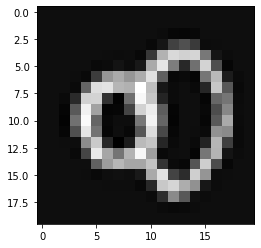

O dígito é: 8
O dígito previsto foi: 0


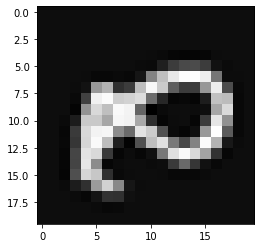

O dígito é: 8
O dígito previsto foi: 9


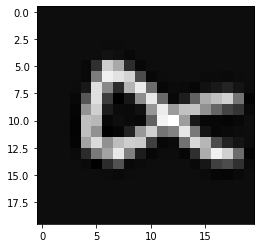

O dígito é: 8
O dígito previsto foi: 9


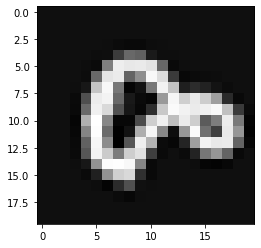

O dígito é: 8
O dígito previsto foi: 3


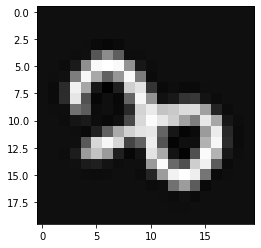

O dígito é: 8
O dígito previsto foi: 3


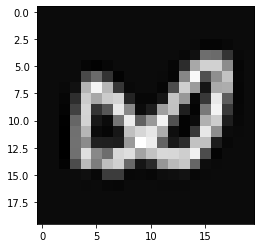

O dígito é: 8
O dígito previsto foi: 3


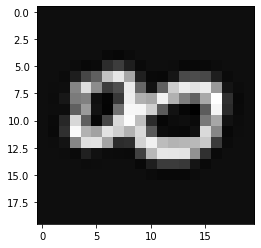

O dígito é: 8
O dígito previsto foi: 9


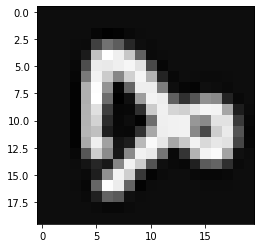

O dígito é: 8
O dígito previsto foi: 3


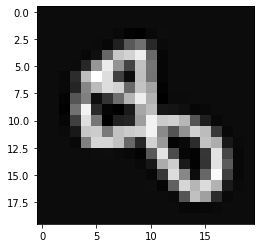

O dígito é: 8
O dígito previsto foi: 3


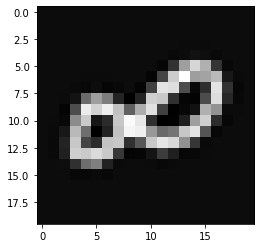

O dígito é: 8
O dígito previsto foi: 3


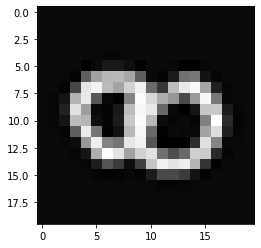

O dígito é: 8
O dígito previsto foi: 9


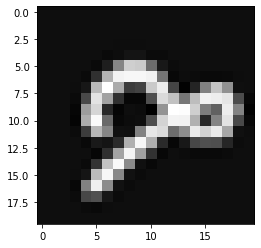

O dígito é: 8
O dígito previsto foi: 3


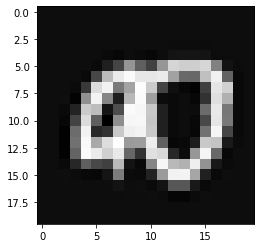

O dígito é: 8
O dígito previsto foi: 1


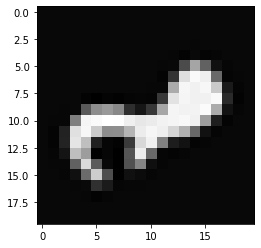

O dígito é: 8
O dígito previsto foi: 3


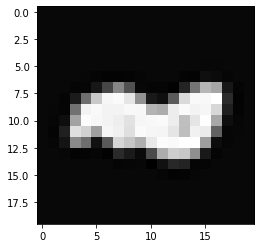

O dígito é: 8
O dígito previsto foi: 3


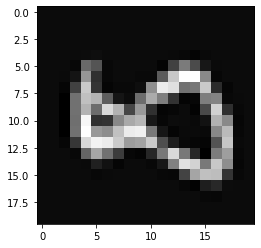

O dígito é: 8
O dígito previsto foi: 3


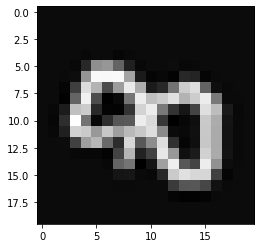

O dígito é: 8
O dígito previsto foi: 3


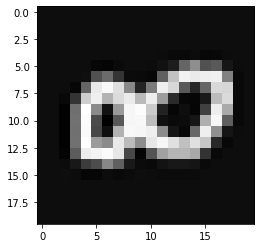

O dígito é: 8
O dígito previsto foi: 3


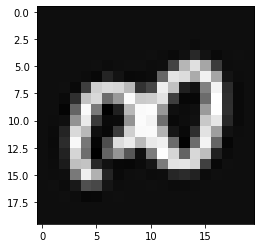

O dígito é: 8
O dígito previsto foi: 3


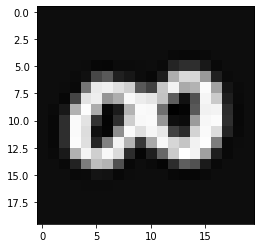

O dígito é: 8
O dígito previsto foi: 3


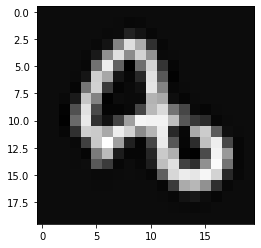

O dígito é: 8
O dígito previsto foi: 3


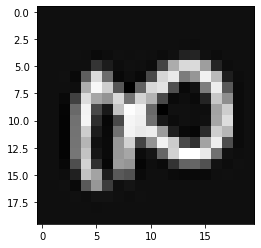

O dígito é: 8
O dígito previsto foi: 0


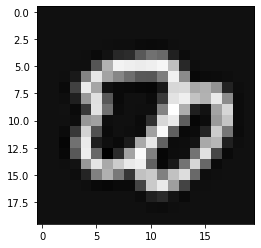

O dígito é: 8
O dígito previsto foi: 0


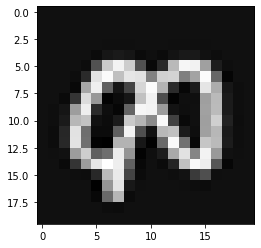

O dígito é: 8
O dígito previsto foi: 3


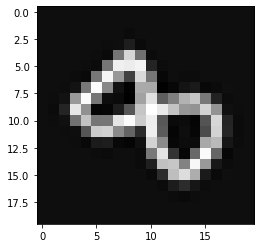

O dígito é: 8
O dígito previsto foi: 3


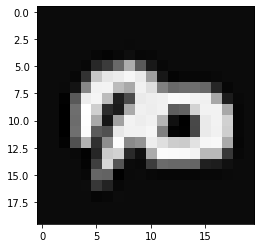

O dígito é: 8
O dígito previsto foi: 0


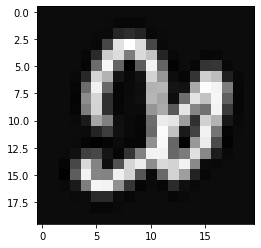

O dígito é: 8
O dígito previsto foi: 4


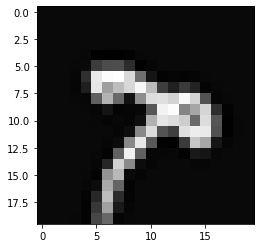

O dígito é: 8
O dígito previsto foi: 2


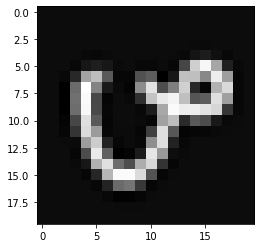

O dígito é: 8
O dígito previsto foi: 6


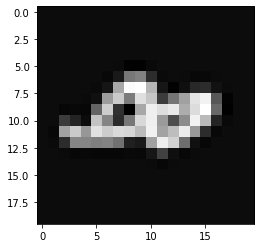

O dígito é: 8
O dígito previsto foi: 3


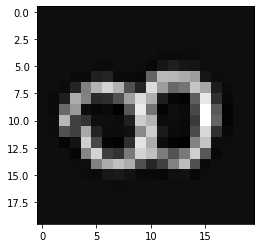

O dígito é: 8
O dígito previsto foi: 3


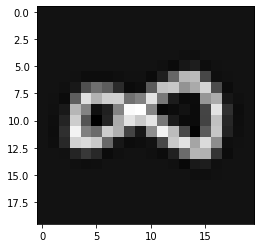

O dígito é: 8
O dígito previsto foi: 3


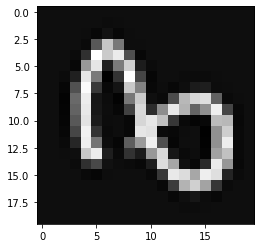

O dígito é: 8
O dígito previsto foi: 6


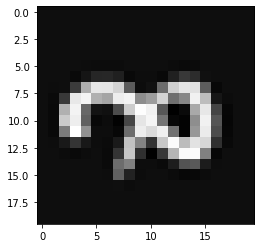

O dígito é: 8
O dígito previsto foi: 9


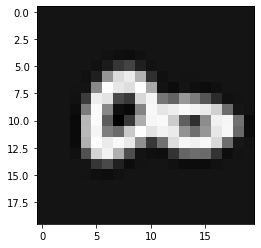

O dígito é: 8
O dígito previsto foi: 1


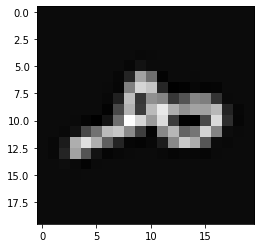

O dígito é: 8
O dígito previsto foi: 3


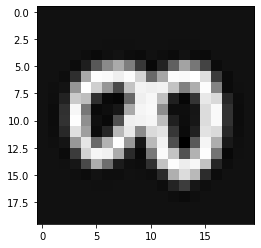

O dígito é: 8
O dígito previsto foi: 6


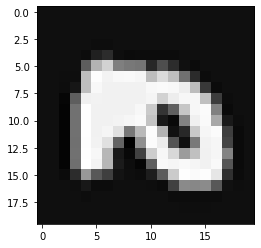

O dígito é: 8
O dígito previsto foi: 0


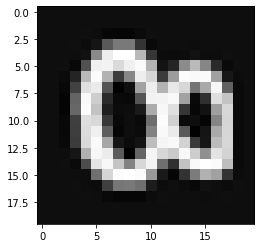

O dígito é: 8
O dígito previsto foi: 2


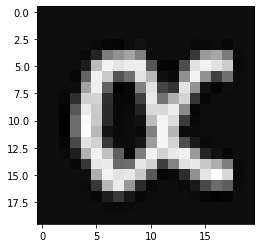

O dígito é: 8
O dígito previsto foi: 0


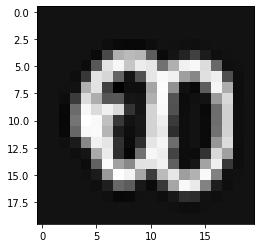

O dígito é: 8
O dígito previsto foi: 0


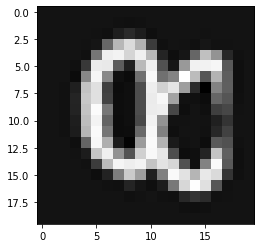

O dígito é: 8
O dígito previsto foi: 9


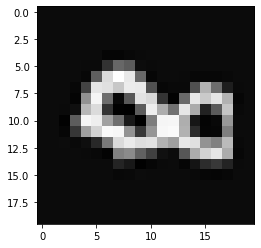

O dígito é: 8
O dígito previsto foi: 0


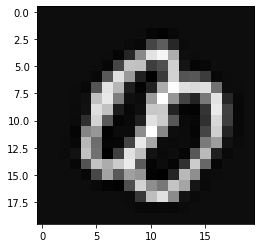

O dígito é: 8
O dígito previsto foi: 3


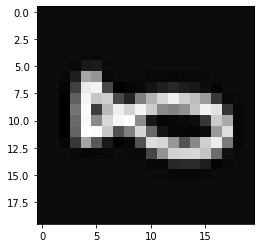

O dígito é: 8
O dígito previsto foi: 0


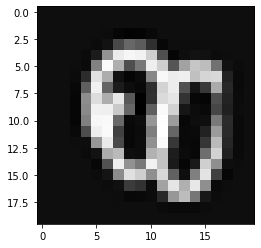

O dígito é: 8
O dígito previsto foi: 2


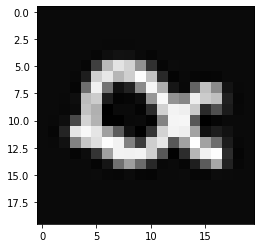

O dígito é: 8
O dígito previsto foi: 0


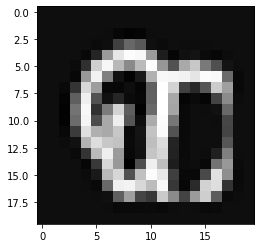

O dígito é: 8
O dígito previsto foi: 0


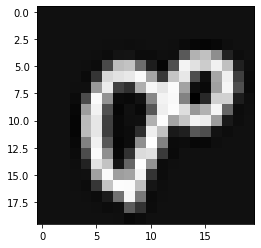

O dígito é: 8
O dígito previsto foi: 6


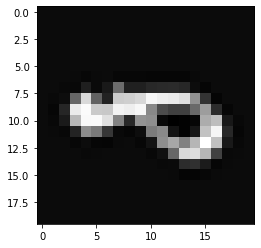

O dígito é: 8
O dígito previsto foi: 3


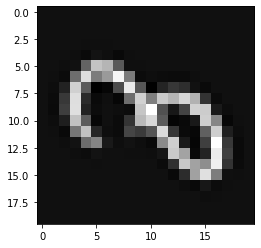

O dígito é: 8
O dígito previsto foi: 3


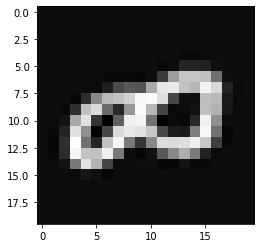

O dígito é: 8
O dígito previsto foi: 3


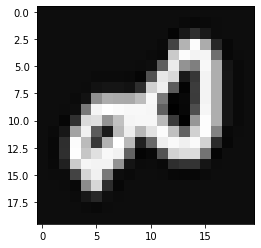

O dígito é: 8
O dígito previsto foi: 0


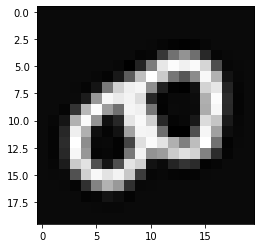

O dígito é: 8
O dígito previsto foi: 3


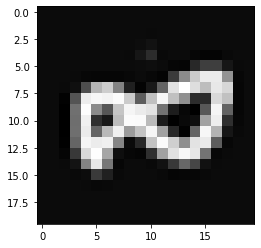

O dígito é: 8
O dígito previsto foi: 9


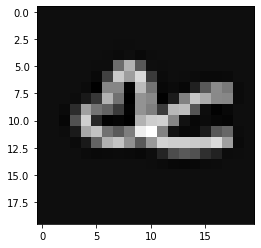

O dígito é: 8
O dígito previsto foi: 3


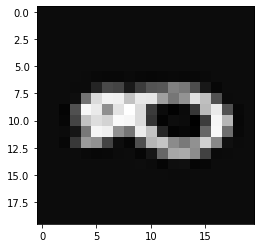

O dígito é: 9
O dígito previsto foi: 7


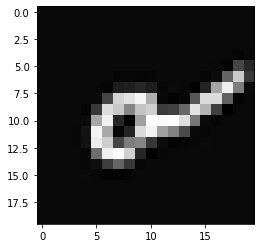

O dígito é: 9
O dígito previsto foi: 7


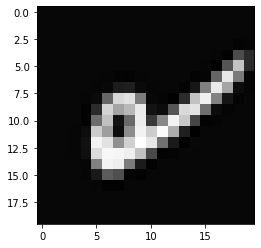

O dígito é: 9
O dígito previsto foi: 8


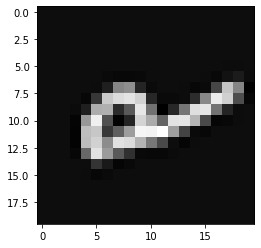

O dígito é: 9
O dígito previsto foi: 3


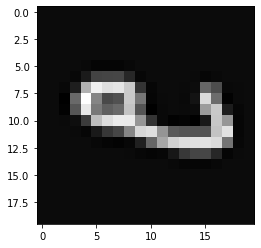

O dígito é: 9
O dígito previsto foi: 0


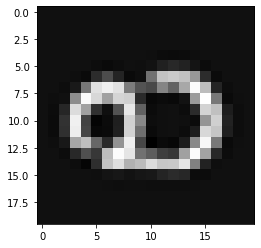

O dígito é: 9
O dígito previsto foi: 7


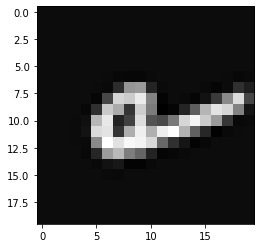

O dígito é: 9
O dígito previsto foi: 7


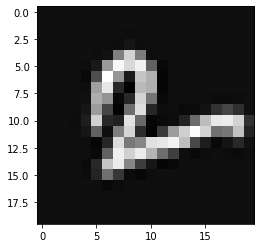

O dígito é: 9
O dígito previsto foi: 7


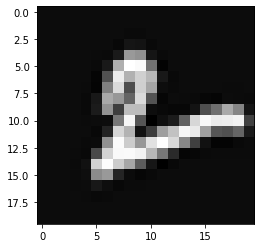

O dígito é: 9
O dígito previsto foi: 4


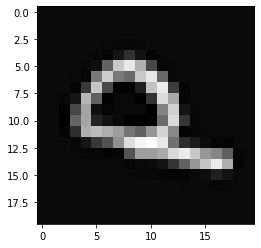

O dígito é: 9
O dígito previsto foi: 7


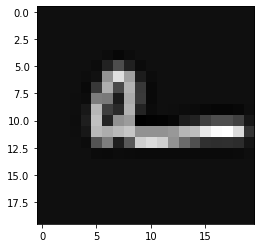

O dígito é: 9
O dígito previsto foi: 4


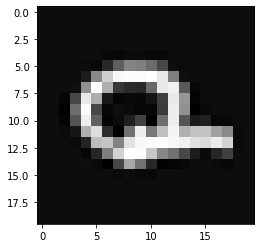

O dígito é: 9
O dígito previsto foi: 3


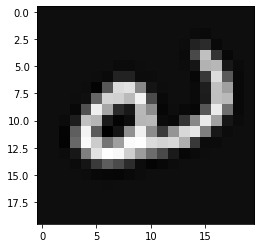

O dígito é: 9
O dígito previsto foi: 4


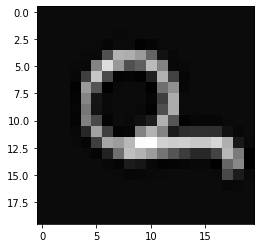

O dígito é: 9
O dígito previsto foi: 8


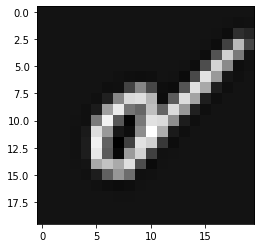

O dígito é: 9
O dígito previsto foi: 8


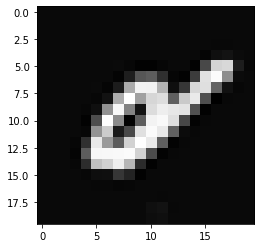

O dígito é: 9
O dígito previsto foi: 8


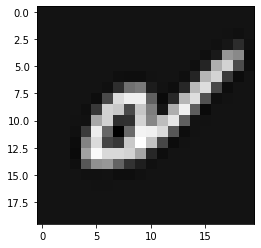

O dígito é: 9
O dígito previsto foi: 8


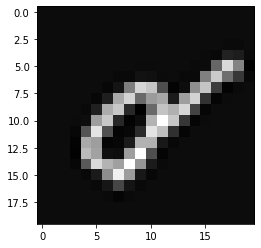

O dígito é: 9
O dígito previsto foi: 0


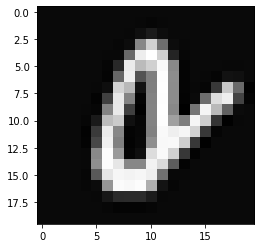

O dígito é: 9
O dígito previsto foi: 8


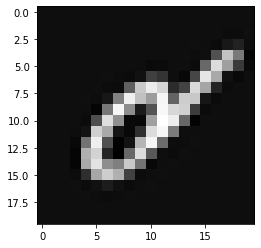

O dígito é: 9
O dígito previsto foi: 1


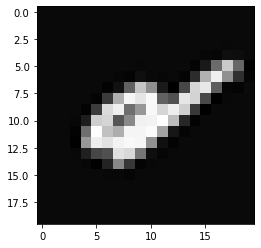

O dígito é: 9
O dígito previsto foi: 0


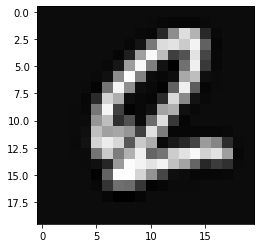

O dígito é: 9
O dígito previsto foi: 6


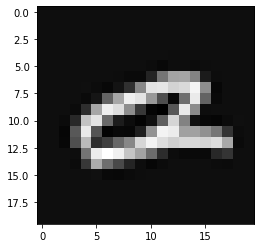

O dígito é: 9
O dígito previsto foi: 0


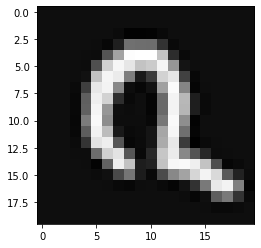

O dígito é: 9
O dígito previsto foi: 7


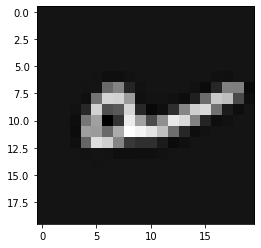

O dígito é: 9
O dígito previsto foi: 0


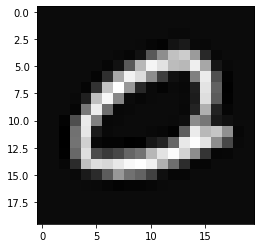

O dígito é: 9
O dígito previsto foi: 3


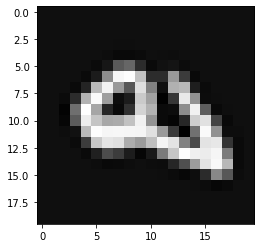

O dígito é: 9
O dígito previsto foi: 8


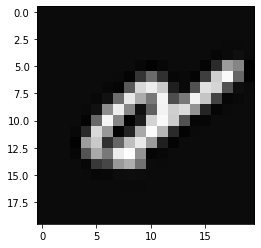

O dígito é: 9
O dígito previsto foi: 0


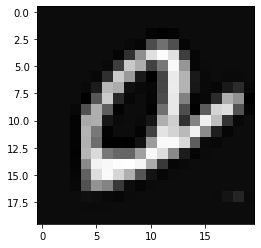

O dígito é: 9
O dígito previsto foi: 4


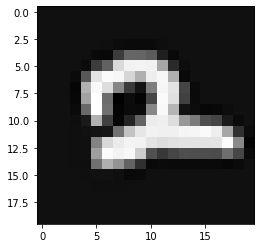

O dígito é: 9
O dígito previsto foi: 7


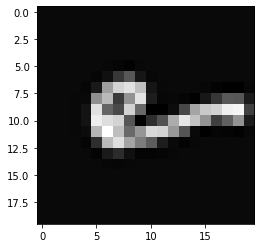

O dígito é: 9
O dígito previsto foi: 4


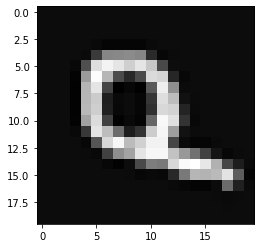

O dígito é: 9
O dígito previsto foi: 8


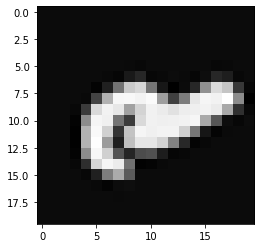

O dígito é: 9
O dígito previsto foi: 0


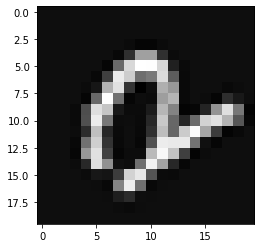

O dígito é: 9
O dígito previsto foi: 3


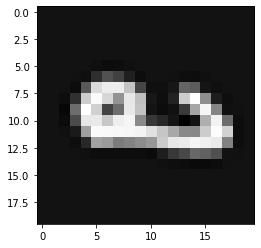

O dígito é: 9
O dígito previsto foi: 3


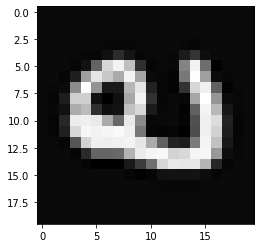

O dígito é: 9
O dígito previsto foi: 0


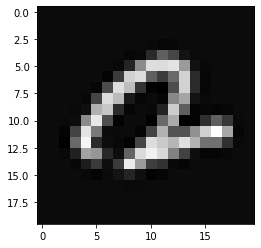

O dígito é: 9
O dígito previsto foi: 3


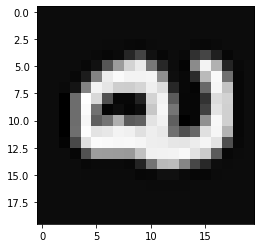

O dígito é: 9
O dígito previsto foi: 7


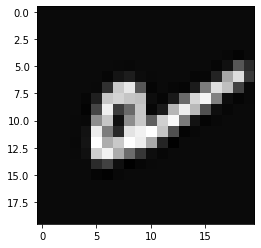

O dígito é: 9
O dígito previsto foi: 8


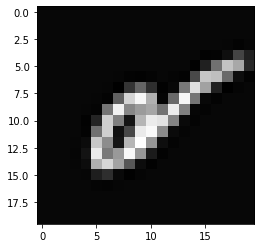

O dígito é: 9
O dígito previsto foi: 8


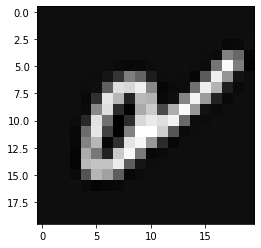

O dígito é: 9
O dígito previsto foi: 4


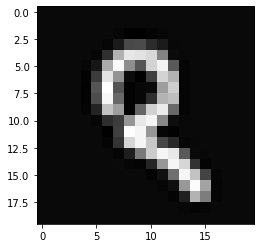

O dígito é: 9
O dígito previsto foi: 0


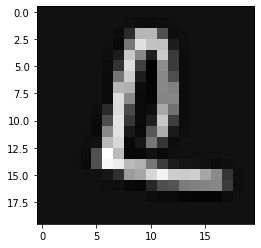

O dígito é: 9
O dígito previsto foi: 4


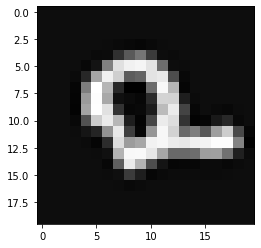

O dígito é: 9
O dígito previsto foi: 8


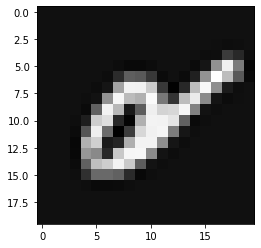

O dígito é: 9
O dígito previsto foi: 7


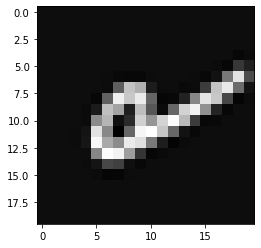

O dígito é: 9
O dígito previsto foi: 8


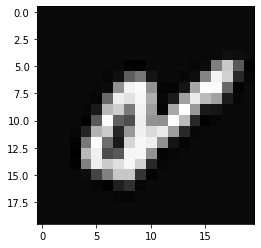

O dígito é: 9
O dígito previsto foi: 4


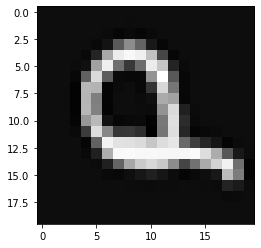

O dígito é: 9
O dígito previsto foi: 4


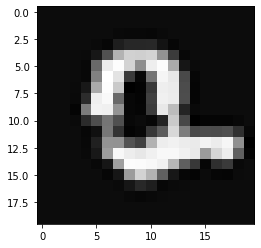

O dígito é: 9
O dígito previsto foi: 0


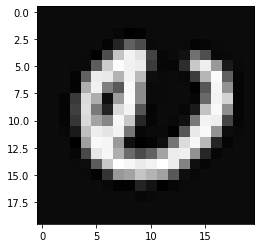

O dígito é: 9
O dígito previsto foi: 0


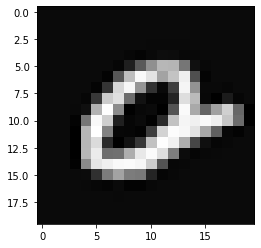

O dígito é: 9
O dígito previsto foi: 4


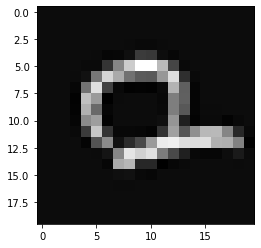

O dígito é: 9
O dígito previsto foi: 4


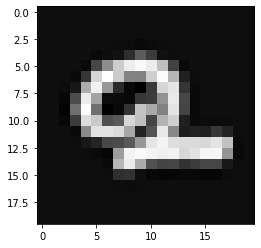

O dígito é: 9
O dígito previsto foi: 4


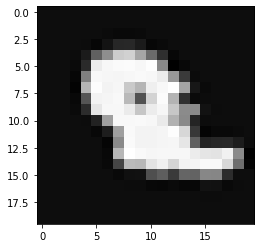

O dígito é: 9
O dígito previsto foi: 8


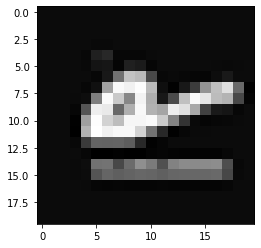

O dígito é: 9
O dígito previsto foi: 3


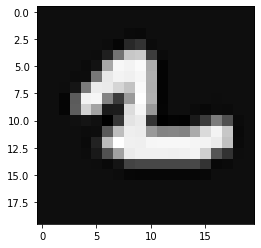

O dígito é: 9
O dígito previsto foi: 8


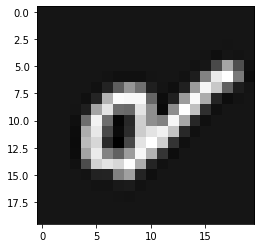

O dígito é: 9
O dígito previsto foi: 8


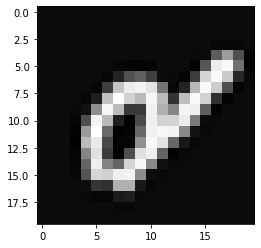

O dígito é: 9
O dígito previsto foi: 8


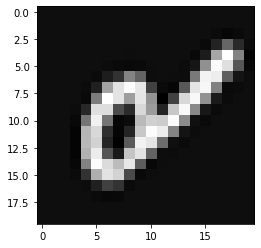

O dígito é: 9
O dígito previsto foi: 7


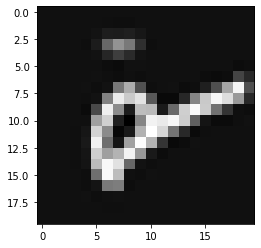

O dígito é: 9
O dígito previsto foi: 0


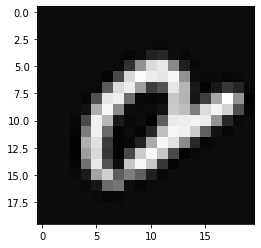

O dígito é: 9
O dígito previsto foi: 0


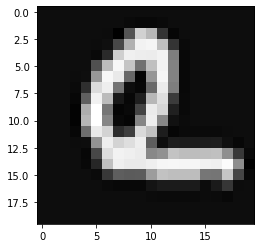

O dígito é: 9
O dígito previsto foi: 4


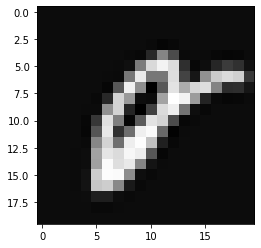

O dígito é: 9
O dígito previsto foi: 4


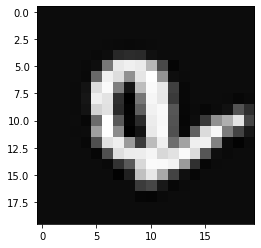

O dígito é: 9
O dígito previsto foi: 4


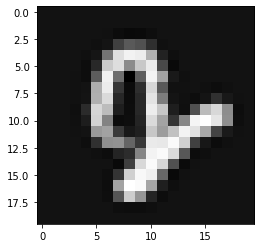

O dígito é: 9
O dígito previsto foi: 0


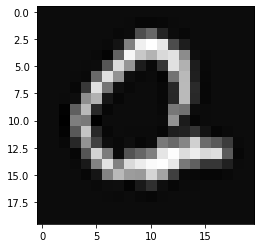

O dígito é: 9
O dígito previsto foi: 0


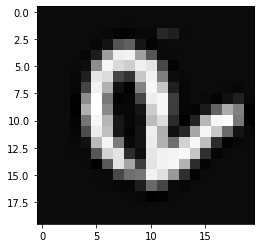

O dígito é: 9
O dígito previsto foi: 0


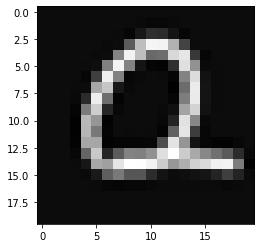

O dígito é: 9
O dígito previsto foi: 7


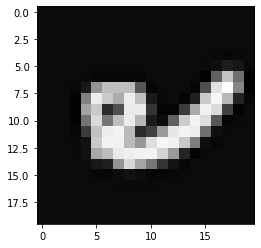

O dígito é: 9
O dígito previsto foi: 8


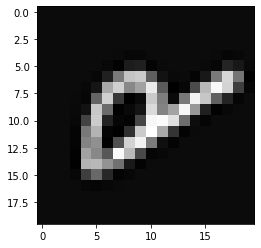

O dígito é: 9
O dígito previsto foi: 0


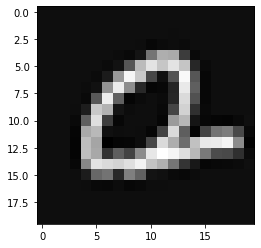

O dígito é: 9
O dígito previsto foi: 6


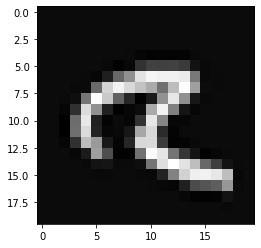

O dígito é: 9
O dígito previsto foi: 4


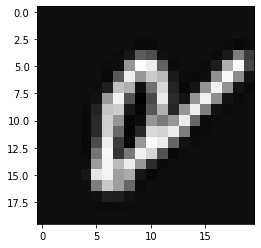

O dígito é: 9
O dígito previsto foi: 8


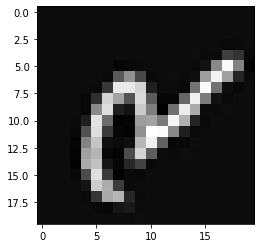

O dígito é: 9
O dígito previsto foi: 8


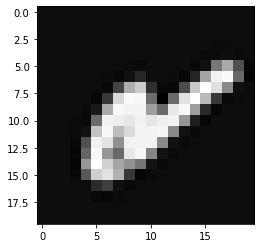

O dígito é: 9
O dígito previsto foi: 8


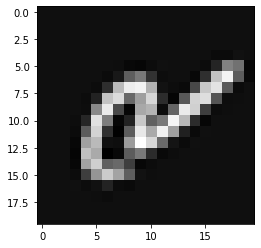

O dígito é: 9
O dígito previsto foi: 8


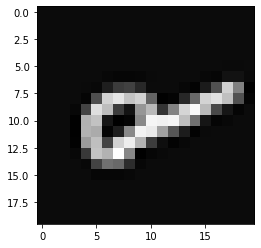

O dígito é: 9
O dígito previsto foi: 8


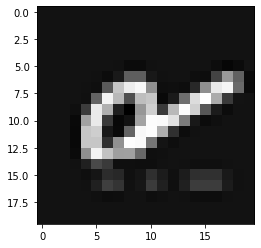

O dígito é: 9
O dígito previsto foi: 4


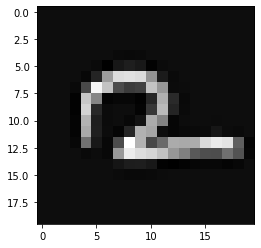

O dígito é: 9
O dígito previsto foi: 7


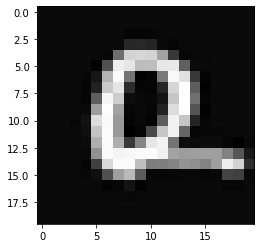

O dígito é: 9
O dígito previsto foi: 1


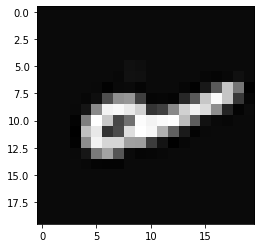

O dígito é: 9
O dígito previsto foi: 3


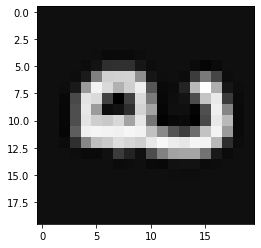

O dígito é: 9
O dígito previsto foi: 0


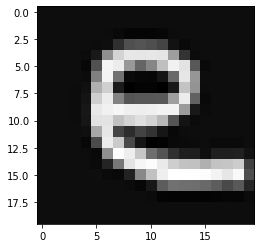

O dígito é: 9
O dígito previsto foi: 1


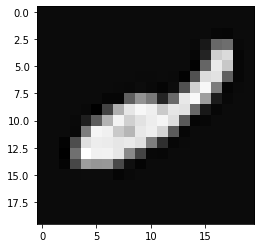

O dígito é: 9
O dígito previsto foi: 8


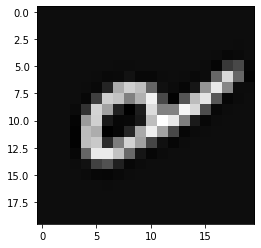

O dígito é: 9
O dígito previsto foi: 4


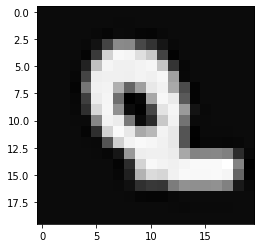

O dígito é: 9
O dígito previsto foi: 4


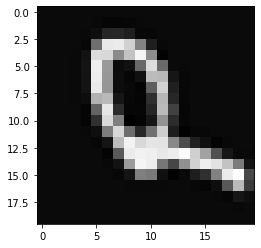

O dígito é: 9
O dígito previsto foi: 1


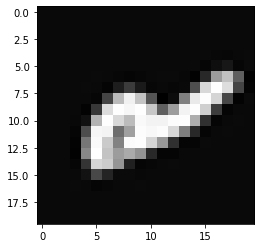

O dígito é: 9
O dígito previsto foi: 0


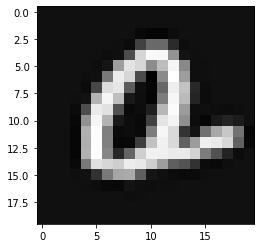

O dígito é: 9
O dígito previsto foi: 1


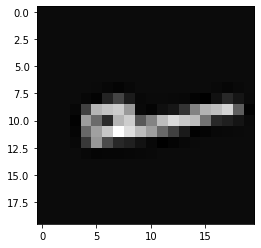

O dígito é: 9
O dígito previsto foi: 7


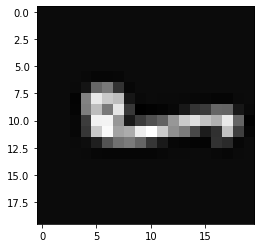

O dígito é: 9
O dígito previsto foi: 4


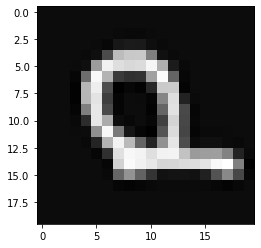

O dígito é: 9
O dígito previsto foi: 0


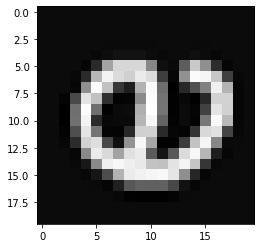

O dígito é: 9
O dígito previsto foi: 4


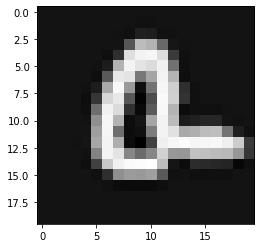

O dígito é: 9
O dígito previsto foi: 7


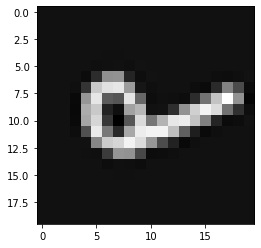

O dígito é: 9
O dígito previsto foi: 2


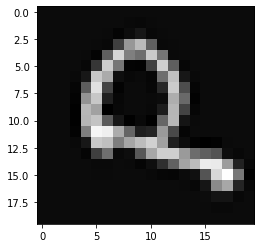

O dígito é: 9
O dígito previsto foi: 7


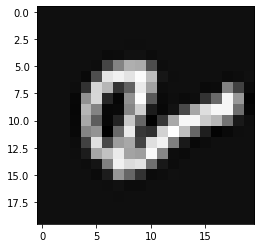

O dígito é: 9
O dígito previsto foi: 7


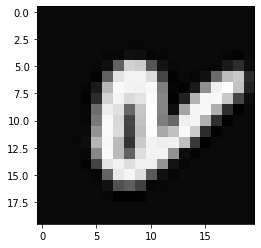

O dígito é: 9
O dígito previsto foi: 4


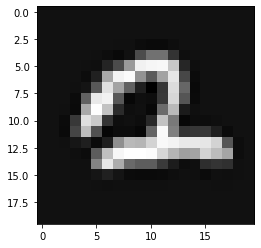

O dígito é: 9
O dígito previsto foi: 0


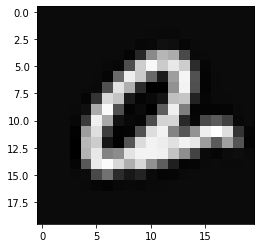

O dígito é: 9
O dígito previsto foi: 7


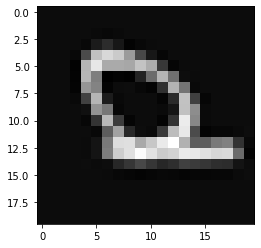

O dígito é: 9
O dígito previsto foi: 7


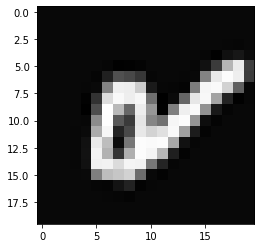

O dígito é: 9
O dígito previsto foi: 4


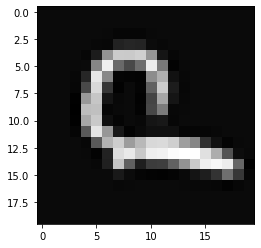

O dígito é: 9
O dígito previsto foi: 7


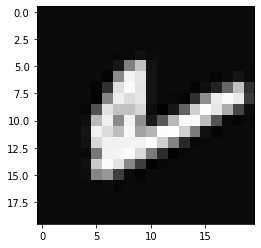

O dígito é: 9
O dígito previsto foi: 4


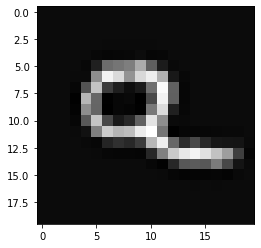

O dígito é: 9
O dígito previsto foi: 0


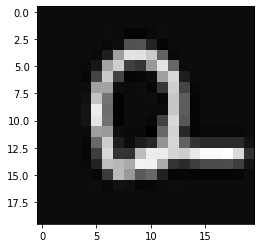

O dígito é: 9
O dígito previsto foi: 0


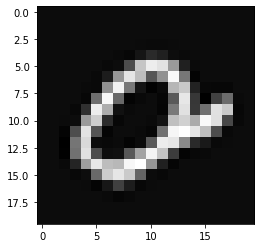

O dígito é: 9
O dígito previsto foi: 8


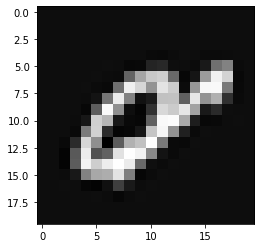

O dígito é: 9
O dígito previsto foi: 0


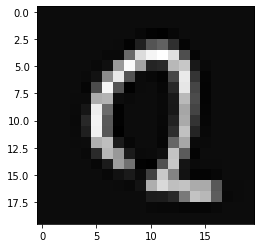

O dígito é: 9
O dígito previsto foi: 4


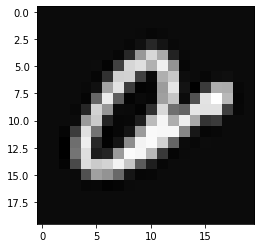

O dígito é: 9
O dígito previsto foi: 4


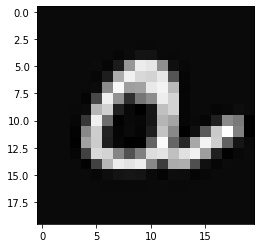

O dígito é: 9
O dígito previsto foi: 0


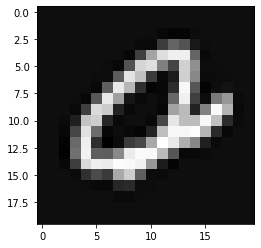

O dígito é: 9
O dígito previsto foi: 7


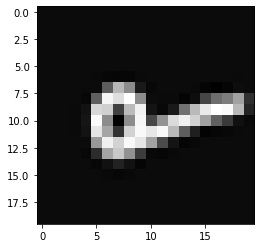

O dígito é: 9
O dígito previsto foi: 4


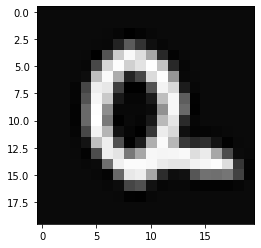

O dígito é: 9
O dígito previsto foi: 7


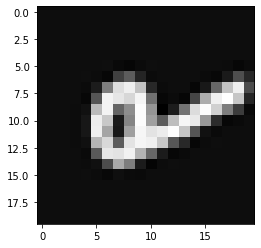

O dígito é: 9
O dígito previsto foi: 4


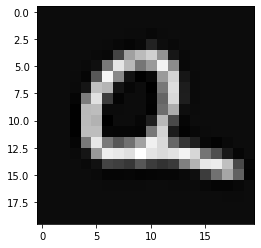

O dígito é: 9
O dígito previsto foi: 7


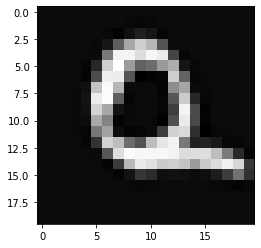

O dígito é: 9
O dígito previsto foi: 7


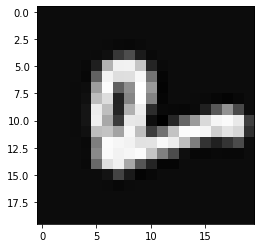

O dígito é: 9
O dígito previsto foi: 2


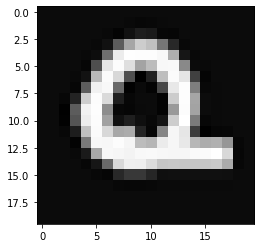

O dígito é: 9
O dígito previsto foi: 0


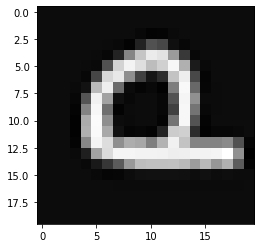

O dígito é: 9
O dígito previsto foi: 4


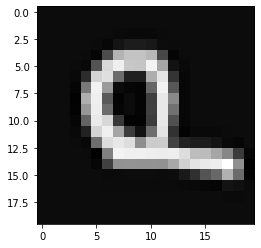

O dígito é: 9
O dígito previsto foi: 0


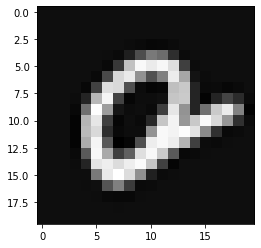

O dígito é: 9
O dígito previsto foi: 3


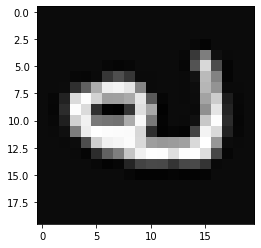

O dígito é: 9
O dígito previsto foi: 0


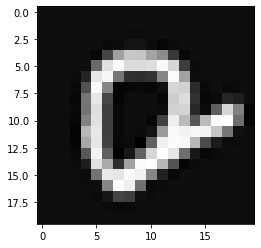

In [36]:
# Plotando as imagens erroneamente classificadas
for i in w_images:
    print("O dígito é:", labels[0][i])
    print("O dígito previsto foi:", pred[0][i])
    x_lg1 = images.iloc[i][:].values
    imagem = x_lg1.reshape(20, 20)
    plt.imshow(imagem, cmap='gray')
    plt.show()

In [ ]:
# Plotando a função de custo a cada iteração
plt.plot(range(len(J_history0_lg)), J_history0_lg)
plt.xlabel("Iterações")
plt.ylabel("Função de Custo")
plt.title("Valor da Função de Custo a cada iteração")
plt.show()

### 2)

In [38]:
# Inicializando x e y
y_lg_reg = normalize(labels[0].values)
y_lg_reg = np.array(y_lg_reg).reshape(-1,1)
x_lg_reg = features(images)

In [39]:
# Construindo matriz auxiliar para treinamento do conjunto dos parâmetros pra cada dígito (d). Y_lg[i] = 1 se y_lg[i] = d e 0, c.c. 
Y_lg_reg = adj_labels(y_lg_reg)

# Matriz de parâmetros: na i-ésima linha temos os parâmetros para o i-ésimo dígito
THETA_reg = np.zeros([len(np.unique(y_lg_reg)), x_lg_reg.shape[1]])

In [40]:
# Inicializando as variáveis e encontrando os 10 conjuntos de parâmetros, treinados para cada dígito, com o auxílio de lambda
alpha_lg_reg = 0.007908
max_iter_lg_reg = 50000
theta_lg_reg = np.full((x_lg_reg.shape[1], 1), 0.1)
lambda1 = np.full((1, x_lg_reg.shape[1]), 10)
lambda1[0, 0] = 0
for i in range(len(np.unique(y_lg_reg))):
    new_y_lg_reg = Y_lg_reg[i, :].copy()
    new_y_lg_reg = new_y_lg_reg.reshape(-1, 1)
    THETA_reg[i], J_history_lg_reg = descending_gradient_lg_reg(x_lg_reg, new_y_lg_reg, theta_lg_reg, alpha_lg_reg, max_iter_lg_reg, lambda1)

cont_dif_reg = 0
w_images_reg = []
pred_reg = labels.copy()
for j in range(len(y_lg_reg)):
    max_valor_reg = 0
    for i in range(10):
        valor_reg = prediction_lg(x_lg_reg[j], THETA_reg[i])
        if(valor_reg > max_valor_reg):
            max_valor_reg = valor_reg
            digito_reg = i
    if(labels[0][j] != digito_reg):
        w_images_reg.append(j)
        pred_reg[0][j] = digito_reg
        cont_dif_reg += 1
print("O números de previsões incorretas é:", cont_dif_reg, "\nLogo, o percentual de acerto é de:", round(100*((len(y_lg_reg)-cont_dif_reg)/len(y_lg_reg)), 2), "%")

O números de previsões incorretas é: 447 
Logo, o percentual de acerto é de: 91.06 %


O dígito é: 0
O dígito previsto foi: 6


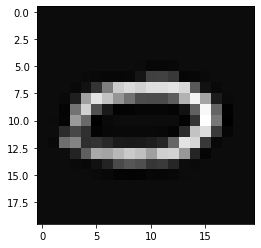

O dígito é: 0
O dígito previsto foi: 5


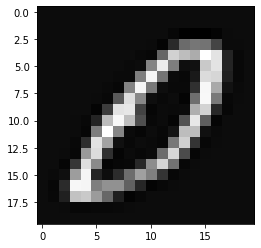

O dígito é: 0
O dígito previsto foi: 3


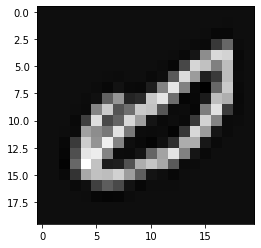

O dígito é: 0
O dígito previsto foi: 8


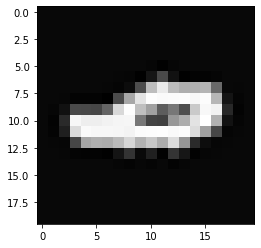

O dígito é: 0
O dígito previsto foi: 4


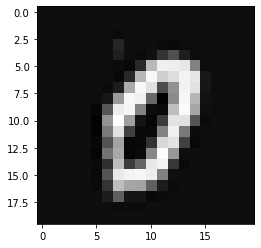

O dígito é: 0
O dígito previsto foi: 8


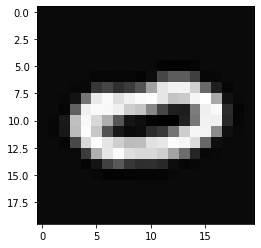

O dígito é: 0
O dígito previsto foi: 6


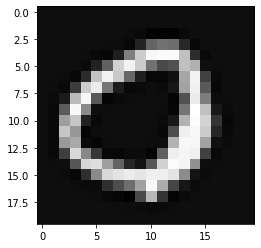

O dígito é: 0
O dígito previsto foi: 3


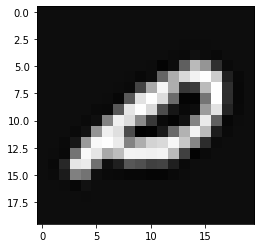

O dígito é: 0
O dígito previsto foi: 6


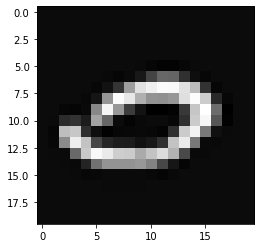

O dígito é: 0
O dígito previsto foi: 9


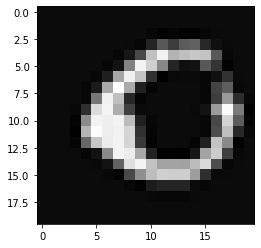

O dígito é: 0
O dígito previsto foi: 6


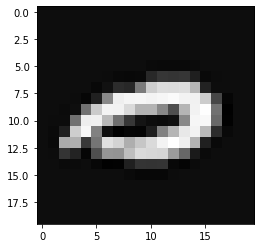

O dígito é: 0
O dígito previsto foi: 6


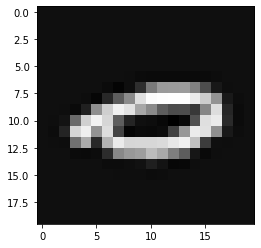

O dígito é: 1
O dígito previsto foi: 6


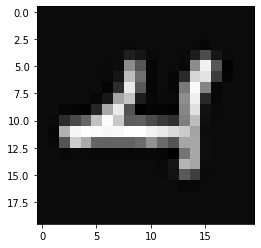

O dígito é: 1
O dígito previsto foi: 5


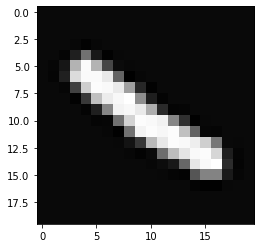

O dígito é: 1
O dígito previsto foi: 7


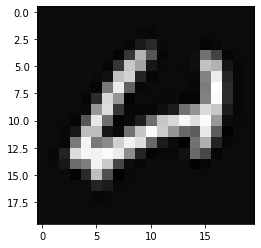

O dígito é: 1
O dígito previsto foi: 8


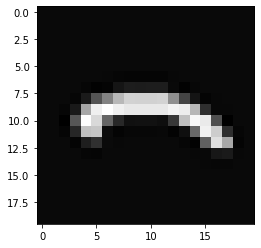

O dígito é: 1
O dígito previsto foi: 8


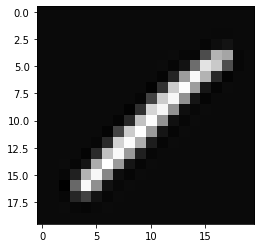

O dígito é: 1
O dígito previsto foi: 3


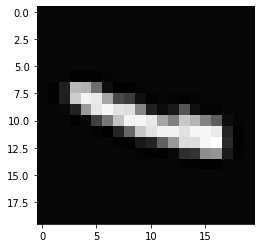

O dígito é: 1
O dígito previsto foi: 8


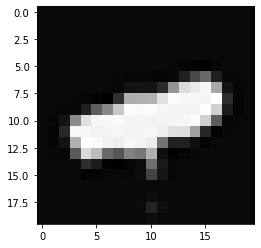

O dígito é: 1
O dígito previsto foi: 8


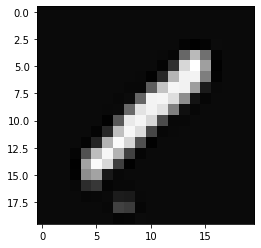

O dígito é: 1
O dígito previsto foi: 5


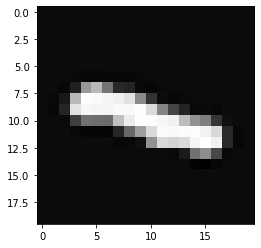

O dígito é: 1
O dígito previsto foi: 2


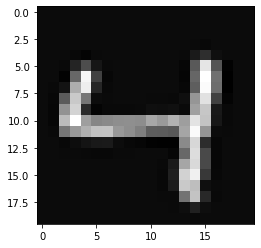

O dígito é: 1
O dígito previsto foi: 8


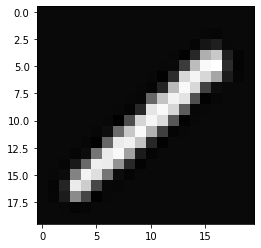

O dígito é: 1
O dígito previsto foi: 5


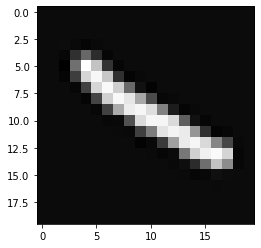

O dígito é: 1
O dígito previsto foi: 5


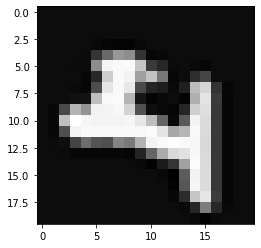

O dígito é: 2
O dígito previsto foi: 7


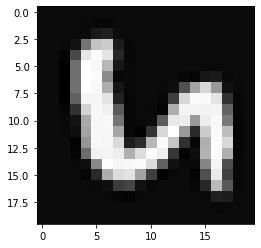

O dígito é: 2
O dígito previsto foi: 6


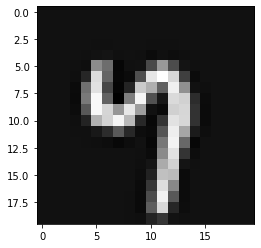

O dígito é: 2
O dígito previsto foi: 7


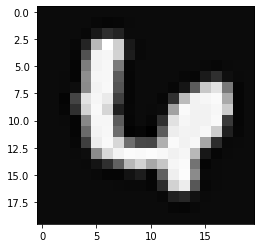

O dígito é: 2
O dígito previsto foi: 8


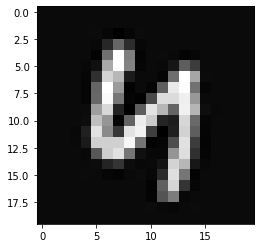

O dígito é: 2
O dígito previsto foi: 0


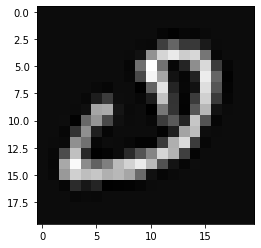

O dígito é: 2
O dígito previsto foi: 1


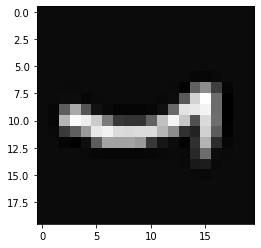

O dígito é: 2
O dígito previsto foi: 0


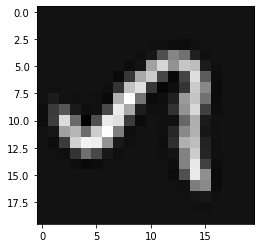

O dígito é: 2
O dígito previsto foi: 7


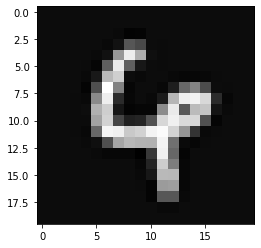

O dígito é: 2
O dígito previsto foi: 3


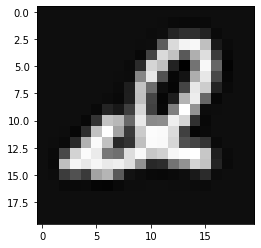

O dígito é: 2
O dígito previsto foi: 1


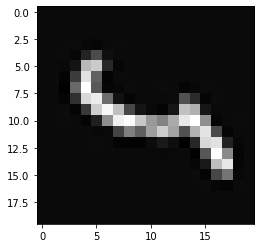

O dígito é: 2
O dígito previsto foi: 5


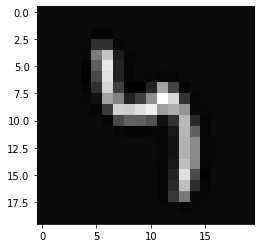

O dígito é: 2
O dígito previsto foi: 1


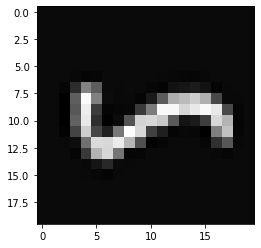

O dígito é: 2
O dígito previsto foi: 1


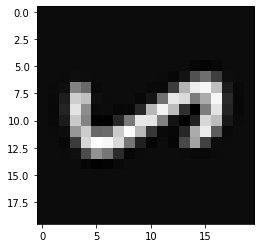

O dígito é: 2
O dígito previsto foi: 7


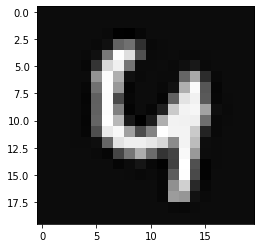

O dígito é: 2
O dígito previsto foi: 4


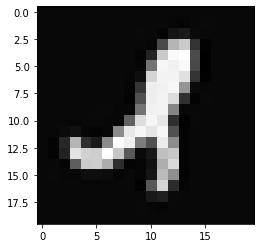

O dígito é: 2
O dígito previsto foi: 9


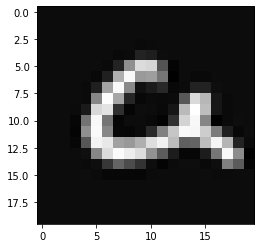

O dígito é: 2
O dígito previsto foi: 4


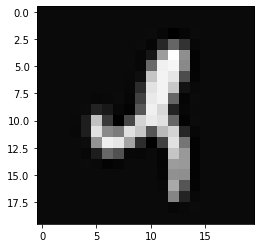

O dígito é: 2
O dígito previsto foi: 3


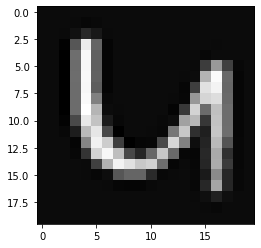

O dígito é: 2
O dígito previsto foi: 8


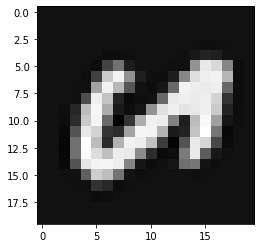

O dígito é: 2
O dígito previsto foi: 7


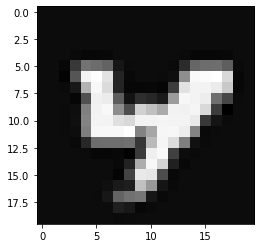

O dígito é: 2
O dígito previsto foi: 3


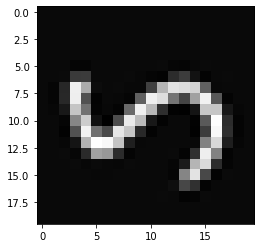

O dígito é: 2
O dígito previsto foi: 8


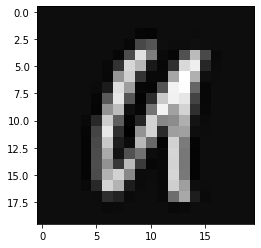

O dígito é: 2
O dígito previsto foi: 8


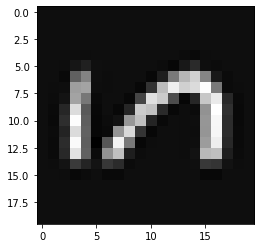

O dígito é: 2
O dígito previsto foi: 1


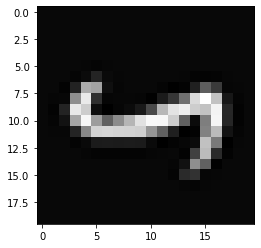

O dígito é: 2
O dígito previsto foi: 9


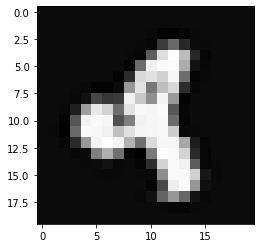

O dígito é: 2
O dígito previsto foi: 4


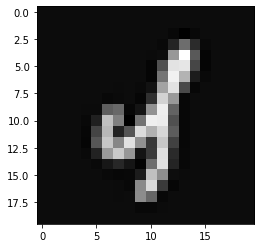

O dígito é: 2
O dígito previsto foi: 4


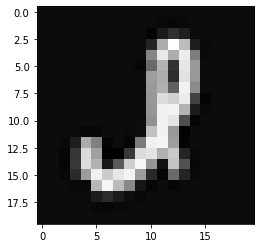

O dígito é: 2
O dígito previsto foi: 1


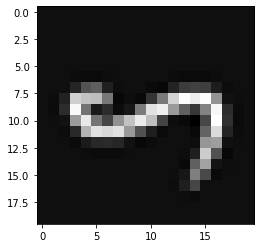

O dígito é: 2
O dígito previsto foi: 4


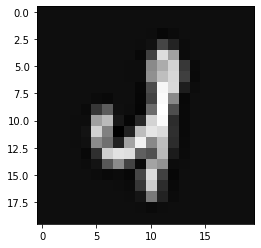

O dígito é: 2
O dígito previsto foi: 4


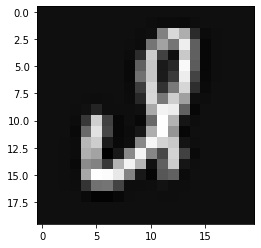

O dígito é: 2
O dígito previsto foi: 8


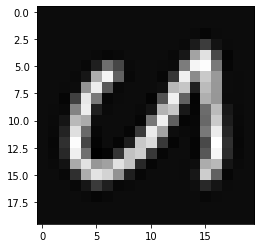

O dígito é: 2
O dígito previsto foi: 3


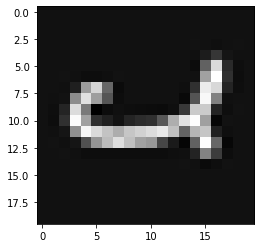

O dígito é: 2
O dígito previsto foi: 4


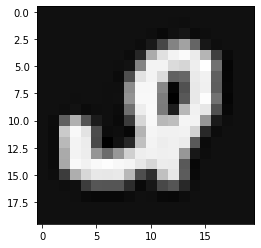

O dígito é: 2
O dígito previsto foi: 7


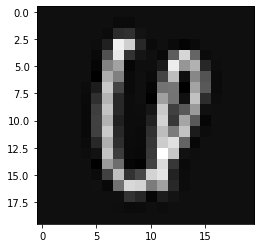

O dígito é: 2
O dígito previsto foi: 4


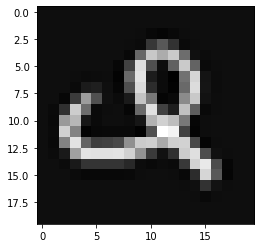

O dígito é: 2
O dígito previsto foi: 8


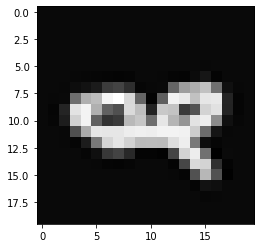

O dígito é: 2
O dígito previsto foi: 1


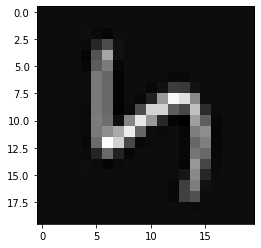

O dígito é: 2
O dígito previsto foi: 8


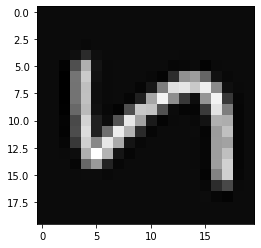

O dígito é: 2
O dígito previsto foi: 0


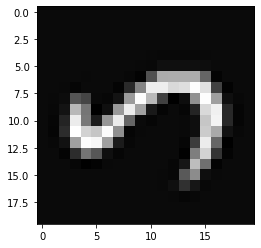

O dígito é: 2
O dígito previsto foi: 6


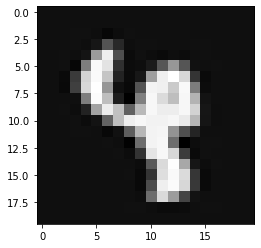

O dígito é: 2
O dígito previsto foi: 8


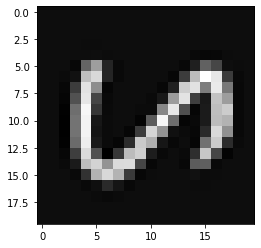

O dígito é: 2
O dígito previsto foi: 6


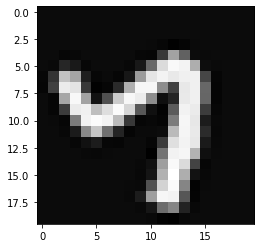

O dígito é: 2
O dígito previsto foi: 7


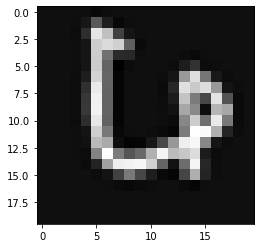

O dígito é: 2
O dígito previsto foi: 7


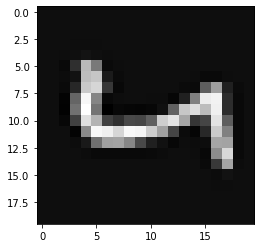

O dígito é: 2
O dígito previsto foi: 3


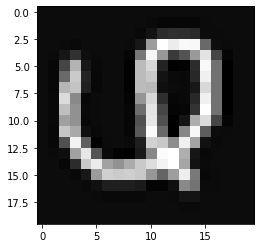

O dígito é: 2
O dígito previsto foi: 4


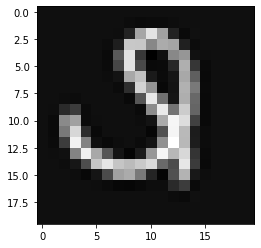

O dígito é: 2
O dígito previsto foi: 8


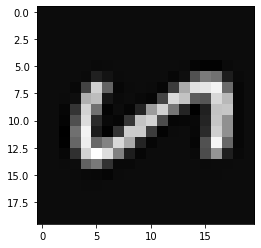

O dígito é: 2
O dígito previsto foi: 8


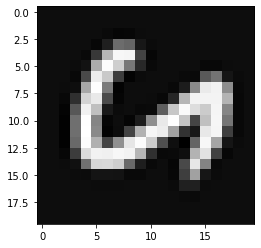

O dígito é: 2
O dígito previsto foi: 4


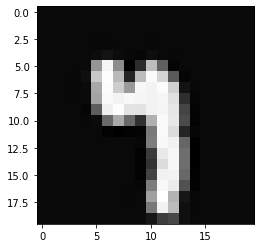

O dígito é: 2
O dígito previsto foi: 0


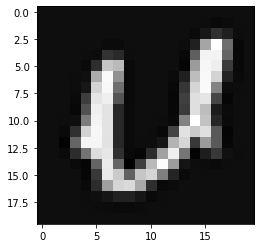

O dígito é: 2
O dígito previsto foi: 0


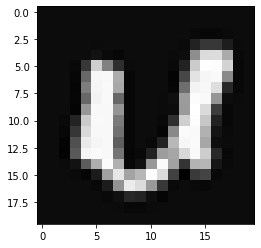

O dígito é: 2
O dígito previsto foi: 8


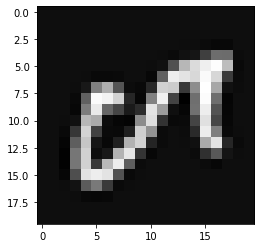

O dígito é: 2
O dígito previsto foi: 8


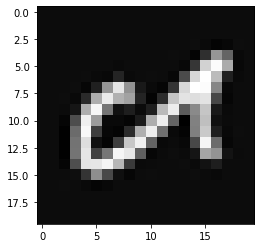

O dígito é: 2
O dígito previsto foi: 8


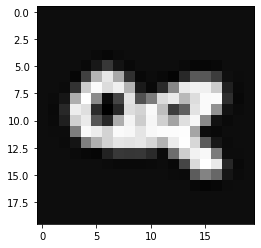

O dígito é: 2
O dígito previsto foi: 6


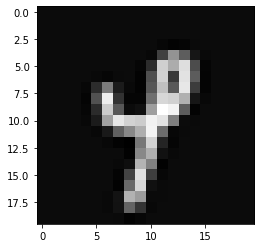

O dígito é: 2
O dígito previsto foi: 6


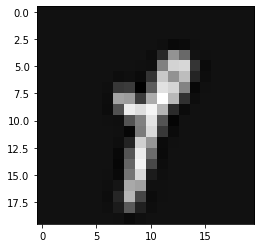

O dígito é: 2
O dígito previsto foi: 8


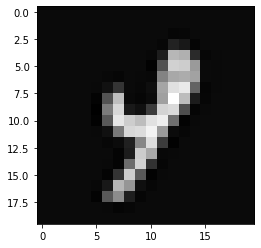

O dígito é: 2
O dígito previsto foi: 1


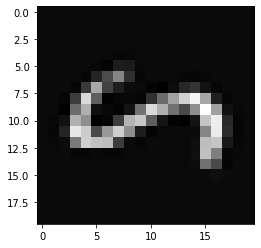

O dígito é: 2
O dígito previsto foi: 9


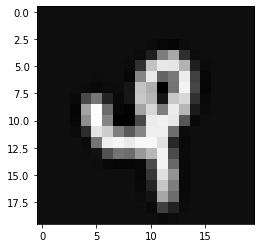

O dígito é: 2
O dígito previsto foi: 4


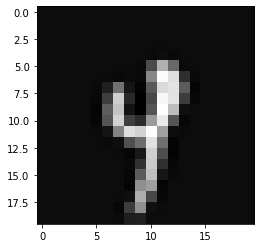

O dígito é: 2
O dígito previsto foi: 8


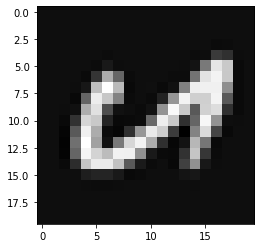

O dígito é: 2
O dígito previsto foi: 8


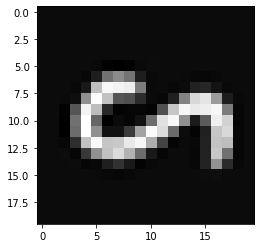

O dígito é: 2
O dígito previsto foi: 1


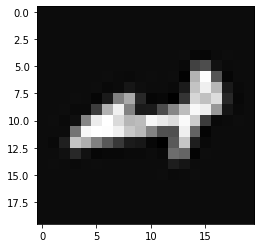

O dígito é: 2
O dígito previsto foi: 3


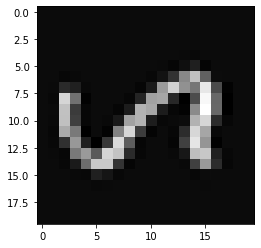

O dígito é: 2
O dígito previsto foi: 6


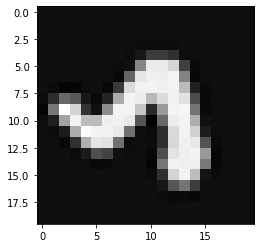

O dígito é: 2
O dígito previsto foi: 4


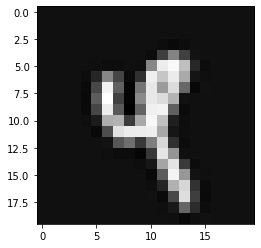

O dígito é: 2
O dígito previsto foi: 7


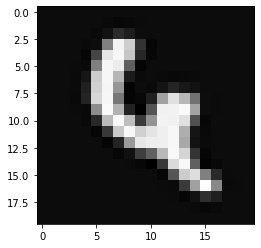

O dígito é: 2
O dígito previsto foi: 4


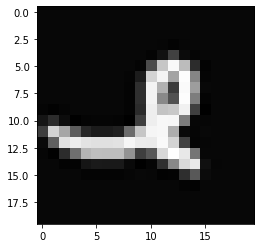

O dígito é: 2
O dígito previsto foi: 5


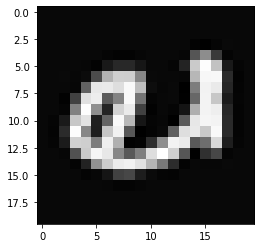

O dígito é: 2
O dígito previsto foi: 7


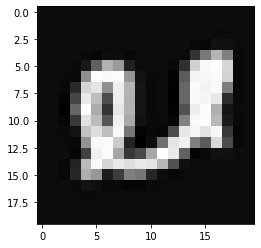

O dígito é: 2
O dígito previsto foi: 0


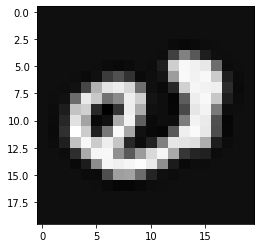

O dígito é: 2
O dígito previsto foi: 3


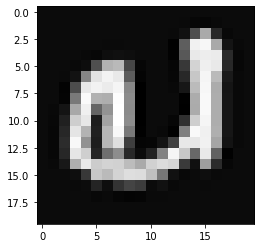

O dígito é: 3
O dígito previsto foi: 5


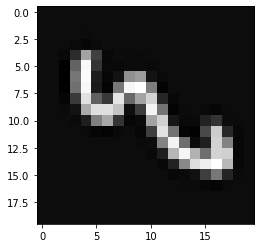

O dígito é: 3
O dígito previsto foi: 6


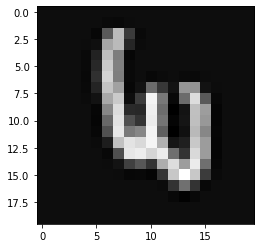

O dígito é: 3
O dígito previsto foi: 5


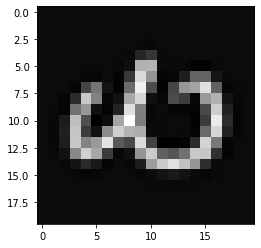

O dígito é: 3
O dígito previsto foi: 7


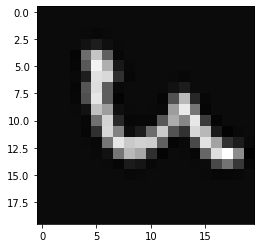

O dígito é: 3
O dígito previsto foi: 9


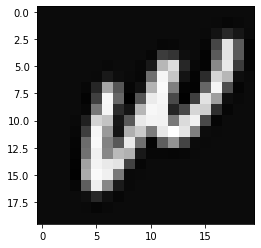

O dígito é: 3
O dígito previsto foi: 5


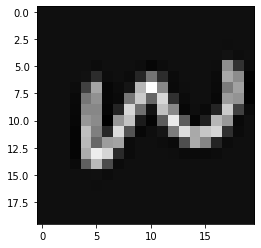

O dígito é: 3
O dígito previsto foi: 5


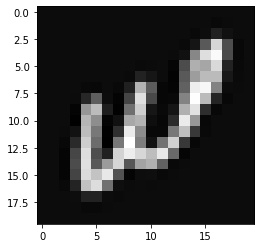

O dígito é: 3
O dígito previsto foi: 2


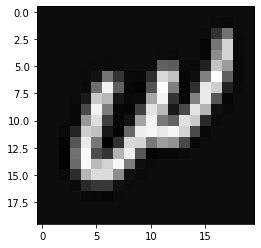

O dígito é: 3
O dígito previsto foi: 2


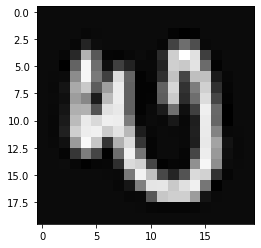

O dígito é: 3
O dígito previsto foi: 5


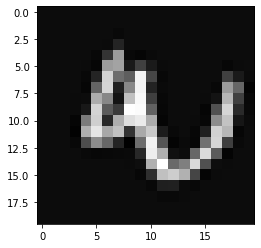

O dígito é: 3
O dígito previsto foi: 6


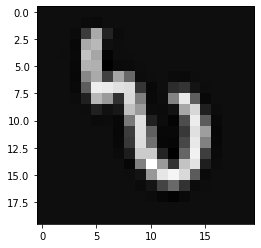

O dígito é: 3
O dígito previsto foi: 9


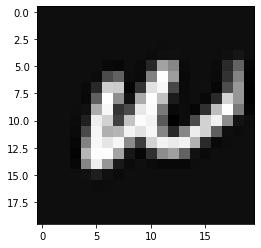

O dígito é: 3
O dígito previsto foi: 5


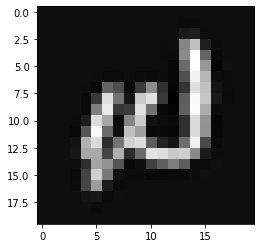

O dígito é: 3
O dígito previsto foi: 2


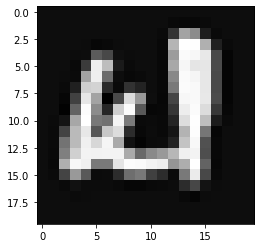

O dígito é: 3
O dígito previsto foi: 5


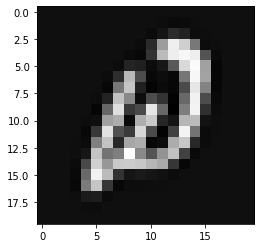

O dígito é: 3
O dígito previsto foi: 5


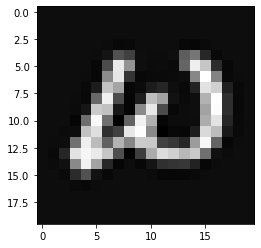

O dígito é: 3
O dígito previsto foi: 2


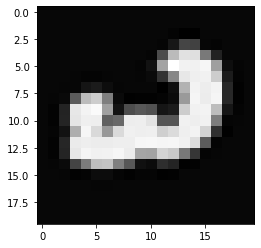

O dígito é: 3
O dígito previsto foi: 8


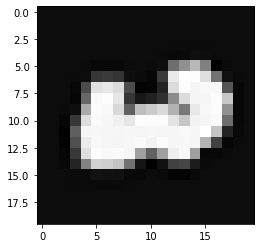

O dígito é: 3
O dígito previsto foi: 9


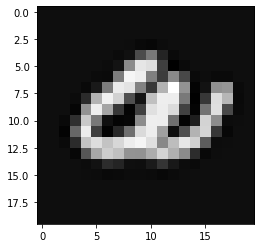

O dígito é: 3
O dígito previsto foi: 5


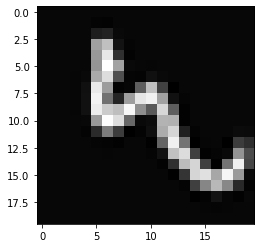

O dígito é: 3
O dígito previsto foi: 2


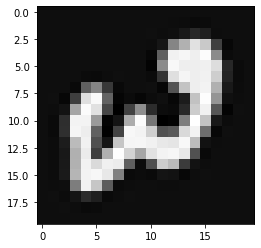

O dígito é: 3
O dígito previsto foi: 2


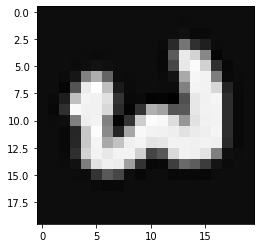

O dígito é: 3
O dígito previsto foi: 2


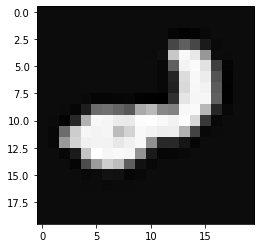

O dígito é: 3
O dígito previsto foi: 2


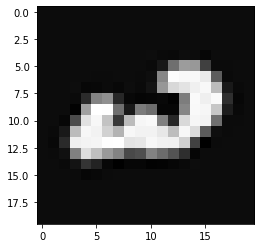

O dígito é: 3
O dígito previsto foi: 5


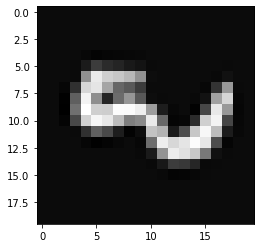

O dígito é: 3
O dígito previsto foi: 5


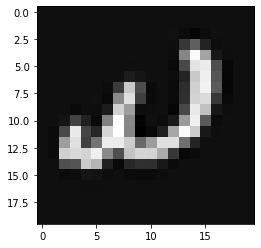

O dígito é: 3
O dígito previsto foi: 6


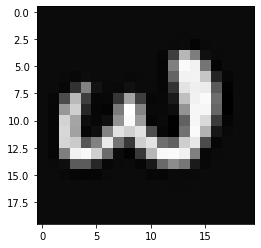

O dígito é: 3
O dígito previsto foi: 8


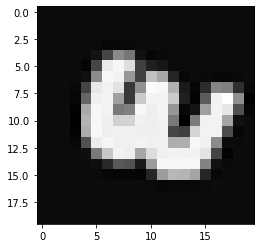

O dígito é: 3
O dígito previsto foi: 6


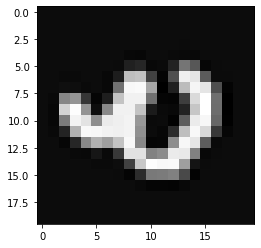

O dígito é: 3
O dígito previsto foi: 5


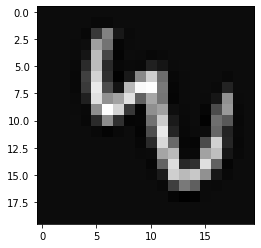

O dígito é: 3
O dígito previsto foi: 7


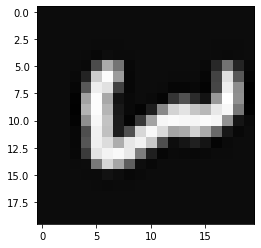

O dígito é: 3
O dígito previsto foi: 1


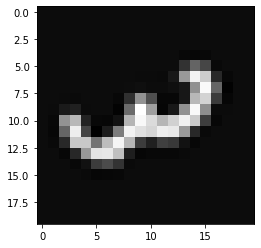

O dígito é: 3
O dígito previsto foi: 1


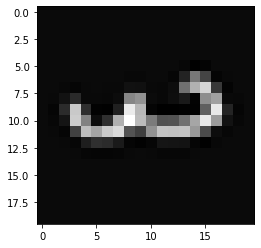

O dígito é: 3
O dígito previsto foi: 2


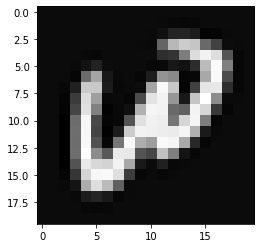

O dígito é: 3
O dígito previsto foi: 2


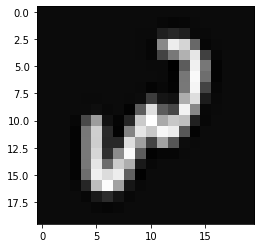

O dígito é: 3
O dígito previsto foi: 2


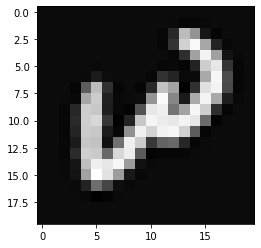

O dígito é: 3
O dígito previsto foi: 1


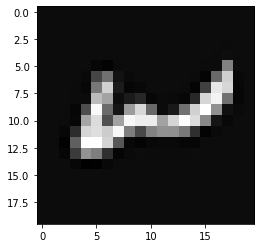

O dígito é: 3
O dígito previsto foi: 5


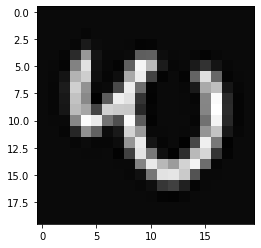

O dígito é: 3
O dígito previsto foi: 5


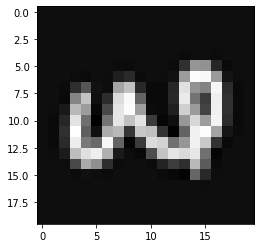

O dígito é: 3
O dígito previsto foi: 2


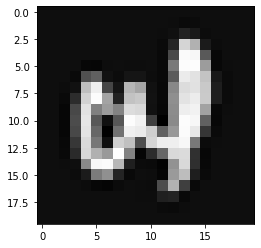

O dígito é: 3
O dígito previsto foi: 7


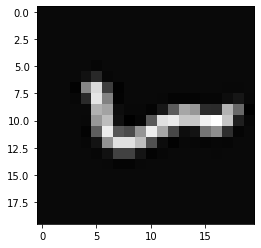

O dígito é: 3
O dígito previsto foi: 5


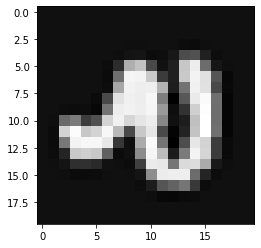

O dígito é: 3
O dígito previsto foi: 5


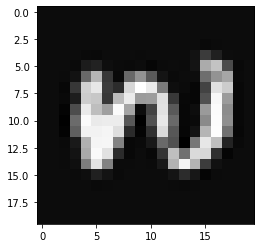

O dígito é: 3
O dígito previsto foi: 8


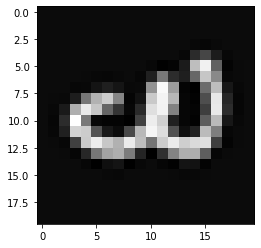

O dígito é: 3
O dígito previsto foi: 5


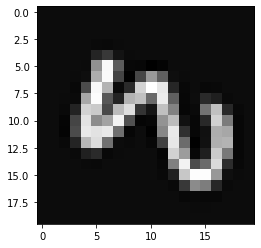

O dígito é: 3
O dígito previsto foi: 9


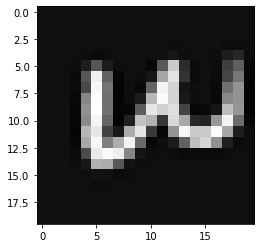

O dígito é: 3
O dígito previsto foi: 2


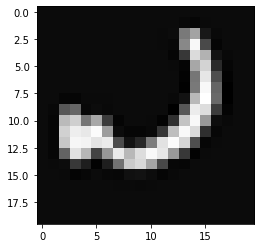

O dígito é: 3
O dígito previsto foi: 7


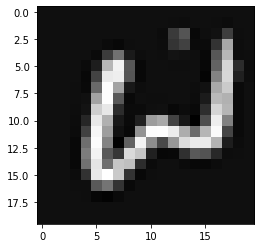

O dígito é: 3
O dígito previsto foi: 1


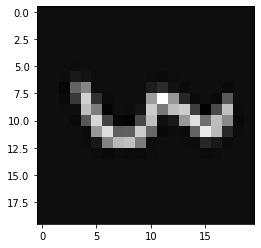

O dígito é: 3
O dígito previsto foi: 2


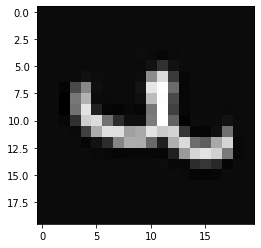

O dígito é: 3
O dígito previsto foi: 2


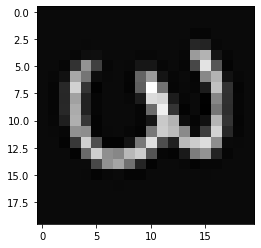

O dígito é: 3
O dígito previsto foi: 2


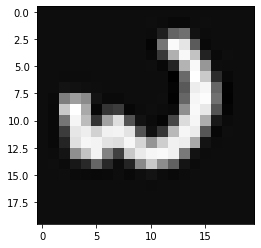

O dígito é: 3
O dígito previsto foi: 5


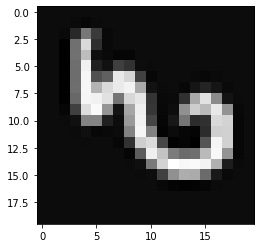

O dígito é: 3
O dígito previsto foi: 5


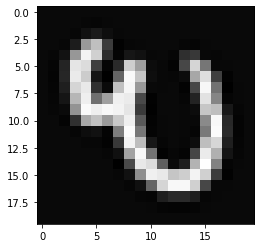

O dígito é: 3
O dígito previsto foi: 9


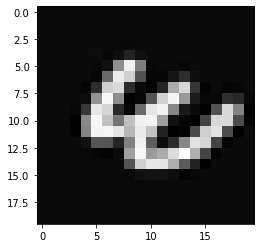

O dígito é: 3
O dígito previsto foi: 5


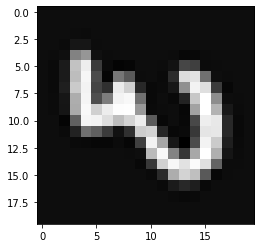

O dígito é: 3
O dígito previsto foi: 5


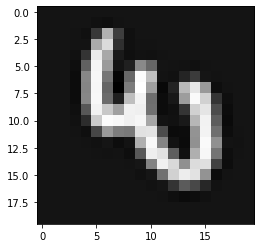

O dígito é: 3
O dígito previsto foi: 8


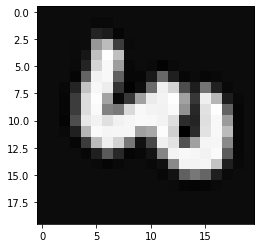

O dígito é: 3
O dígito previsto foi: 1


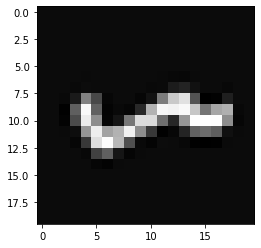

O dígito é: 3
O dígito previsto foi: 5


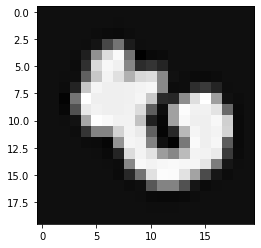

O dígito é: 3
O dígito previsto foi: 7


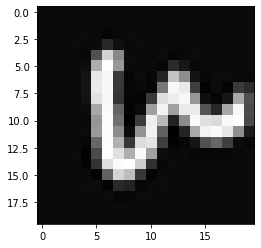

O dígito é: 3
O dígito previsto foi: 8


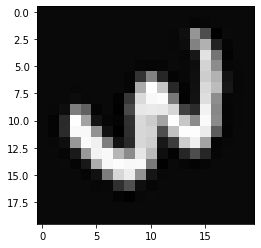

O dígito é: 3
O dígito previsto foi: 5


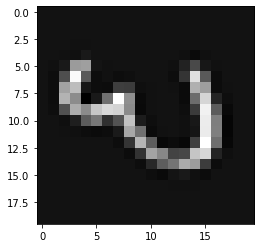

O dígito é: 3
O dígito previsto foi: 7


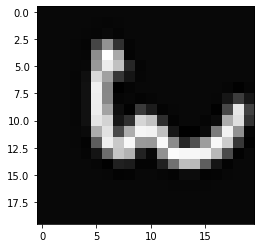

O dígito é: 4
O dígito previsto foi: 6


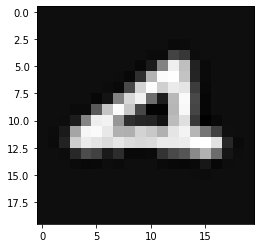

O dígito é: 4
O dígito previsto foi: 8


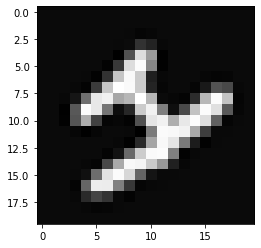

O dígito é: 4
O dígito previsto foi: 9


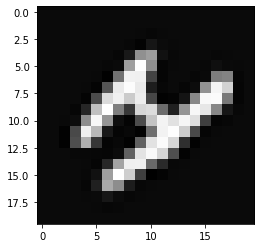

O dígito é: 4
O dígito previsto foi: 2


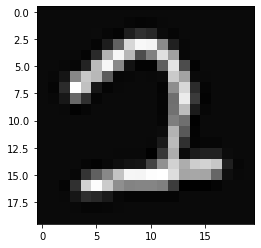

O dígito é: 4
O dígito previsto foi: 6


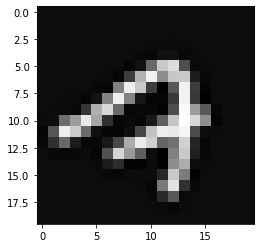

O dígito é: 4
O dígito previsto foi: 8


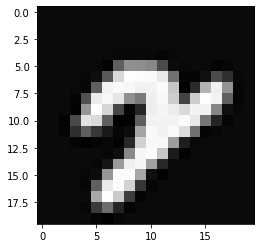

O dígito é: 4
O dígito previsto foi: 9


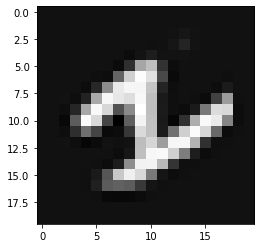

O dígito é: 4
O dígito previsto foi: 1


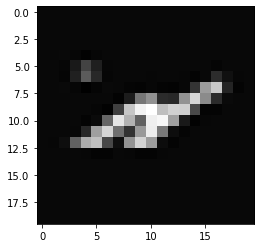

O dígito é: 4
O dígito previsto foi: 9


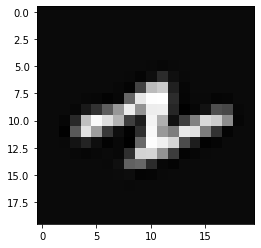

O dígito é: 4
O dígito previsto foi: 2


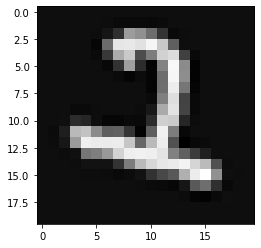

O dígito é: 4
O dígito previsto foi: 1


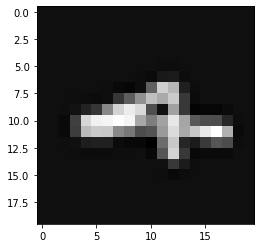

O dígito é: 4
O dígito previsto foi: 9


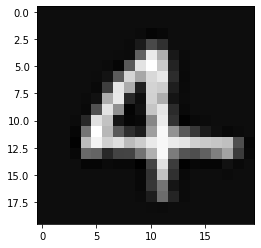

O dígito é: 4
O dígito previsto foi: 9


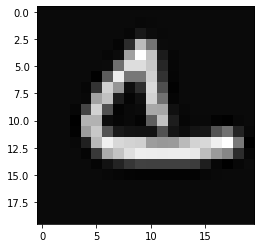

O dígito é: 4
O dígito previsto foi: 9


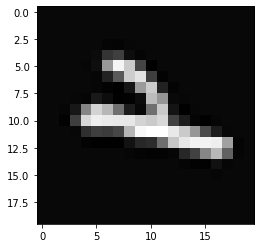

O dígito é: 4
O dígito previsto foi: 8


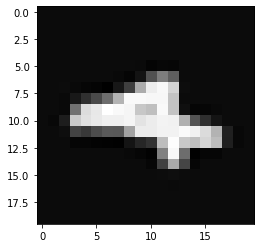

O dígito é: 4
O dígito previsto foi: 2


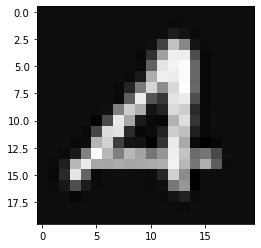

O dígito é: 4
O dígito previsto foi: 9


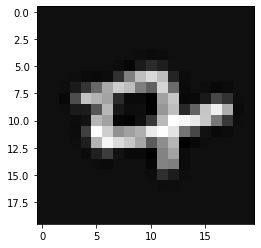

O dígito é: 4
O dígito previsto foi: 2


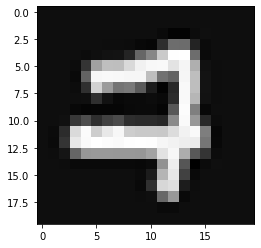

O dígito é: 4
O dígito previsto foi: 9


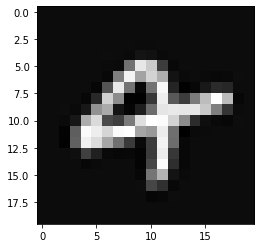

O dígito é: 4
O dígito previsto foi: 6


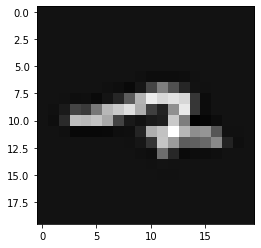

O dígito é: 4
O dígito previsto foi: 9


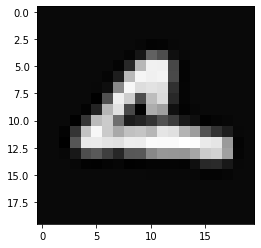

O dígito é: 4
O dígito previsto foi: 2


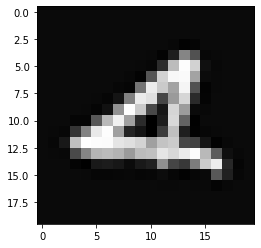

O dígito é: 4
O dígito previsto foi: 9


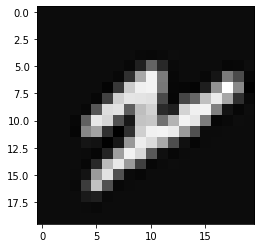

O dígito é: 4
O dígito previsto foi: 8


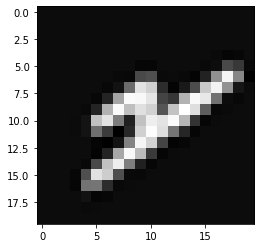

O dígito é: 4
O dígito previsto foi: 9


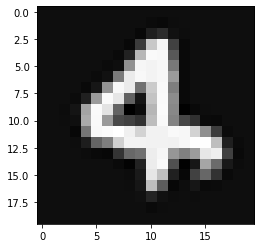

O dígito é: 4
O dígito previsto foi: 9


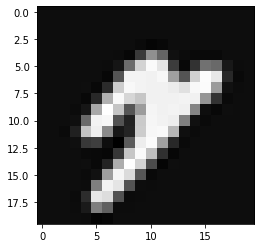

O dígito é: 4
O dígito previsto foi: 9


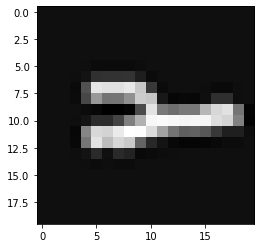

O dígito é: 4
O dígito previsto foi: 6


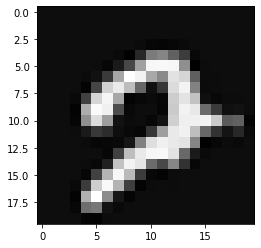

O dígito é: 4
O dígito previsto foi: 9


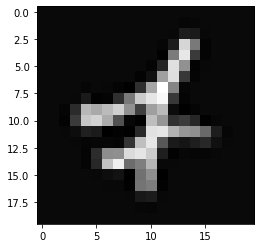

O dígito é: 4
O dígito previsto foi: 2


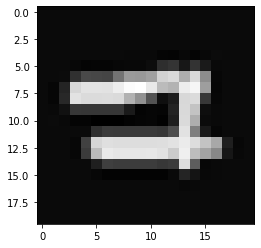

O dígito é: 4
O dígito previsto foi: 6


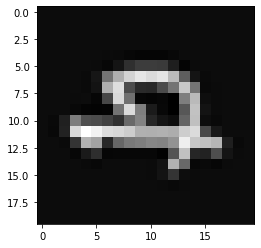

O dígito é: 4
O dígito previsto foi: 1


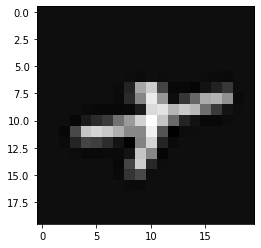

O dígito é: 4
O dígito previsto foi: 9


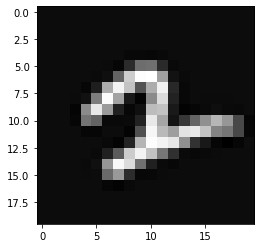

O dígito é: 4
O dígito previsto foi: 9


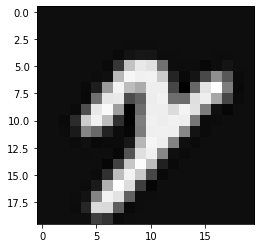

O dígito é: 4
O dígito previsto foi: 9


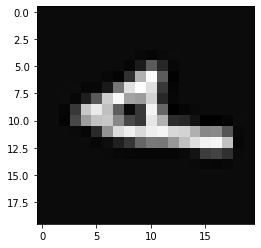

O dígito é: 4
O dígito previsto foi: 9


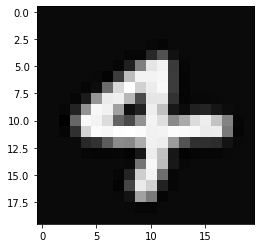

O dígito é: 4
O dígito previsto foi: 6


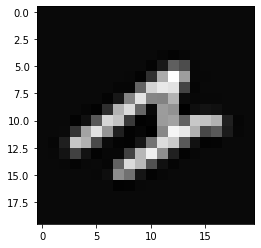

O dígito é: 4
O dígito previsto foi: 8


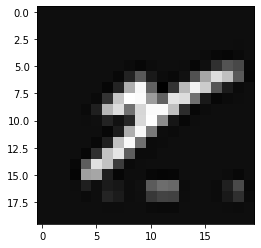

O dígito é: 4
O dígito previsto foi: 6


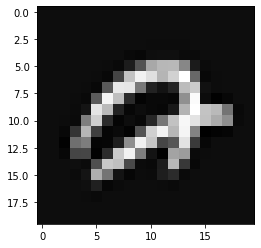

O dígito é: 4
O dígito previsto foi: 9


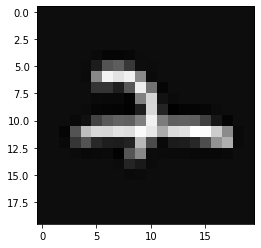

O dígito é: 4
O dígito previsto foi: 9


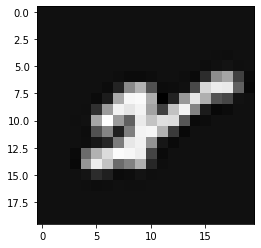

O dígito é: 5
O dígito previsto foi: 3


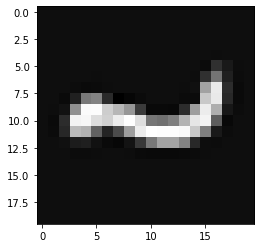

O dígito é: 5
O dígito previsto foi: 0


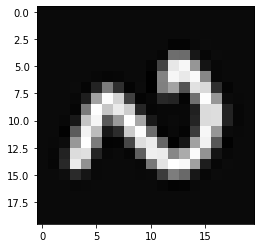

O dígito é: 5
O dígito previsto foi: 8


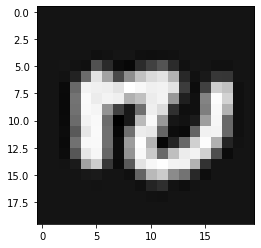

O dígito é: 5
O dígito previsto foi: 6


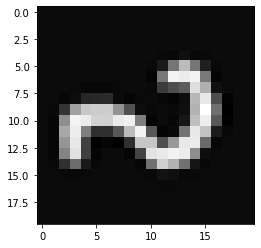

O dígito é: 5
O dígito previsto foi: 8


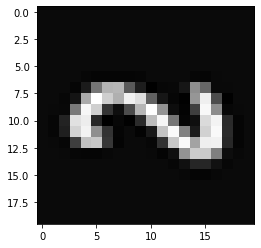

O dígito é: 5
O dígito previsto foi: 9


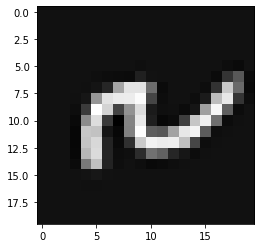

O dígito é: 5
O dígito previsto foi: 8


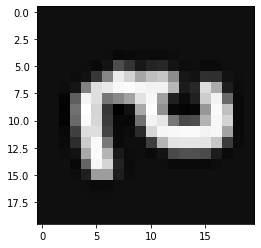

O dígito é: 5
O dígito previsto foi: 8


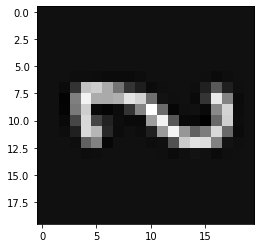

O dígito é: 5
O dígito previsto foi: 3


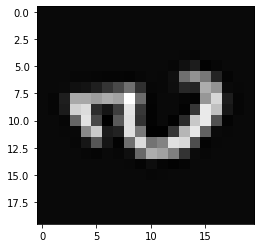

O dígito é: 5
O dígito previsto foi: 3


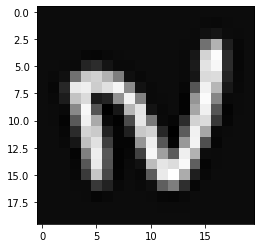

O dígito é: 5
O dígito previsto foi: 8


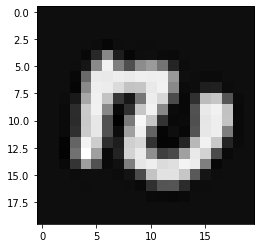

O dígito é: 5
O dígito previsto foi: 4


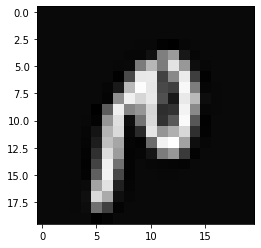

O dígito é: 5
O dígito previsto foi: 2


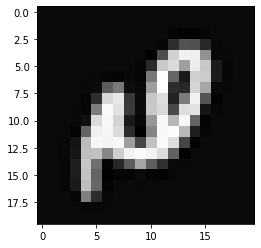

O dígito é: 5
O dígito previsto foi: 8


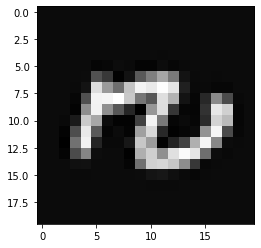

O dígito é: 5
O dígito previsto foi: 3


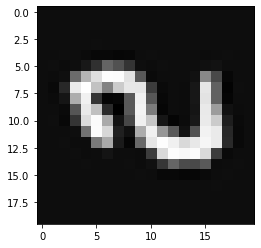

O dígito é: 5
O dígito previsto foi: 4


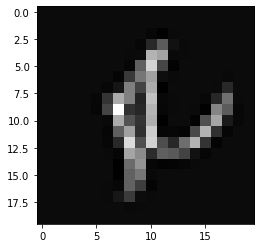

O dígito é: 5
O dígito previsto foi: 3


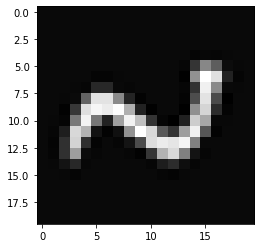

O dígito é: 5
O dígito previsto foi: 8


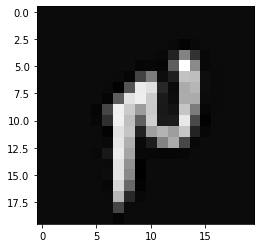

O dígito é: 5
O dígito previsto foi: 4


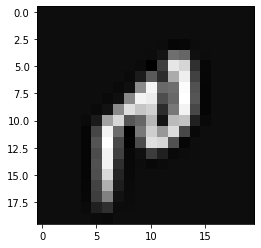

O dígito é: 5
O dígito previsto foi: 6


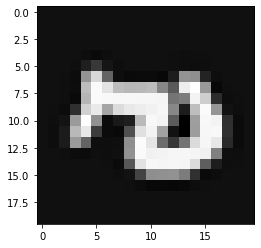

O dígito é: 5
O dígito previsto foi: 4


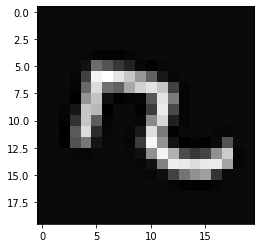

O dígito é: 5
O dígito previsto foi: 3


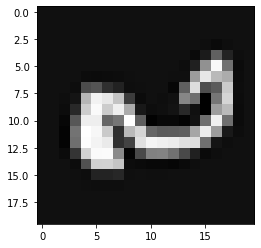

O dígito é: 5
O dígito previsto foi: 2


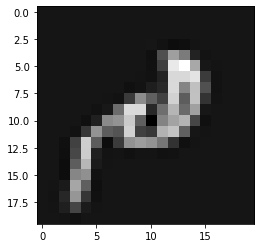

O dígito é: 5
O dígito previsto foi: 3


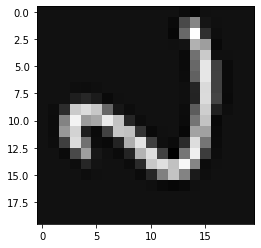

O dígito é: 5
O dígito previsto foi: 8


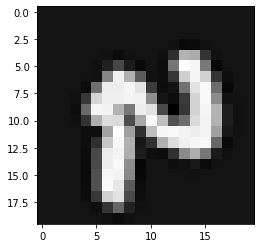

O dígito é: 5
O dígito previsto foi: 6


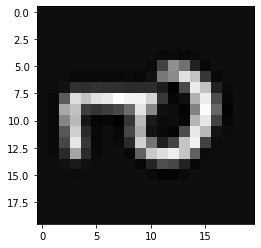

O dígito é: 5
O dígito previsto foi: 8


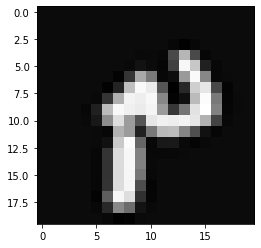

O dígito é: 5
O dígito previsto foi: 3


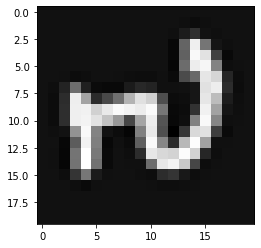

O dígito é: 5
O dígito previsto foi: 8


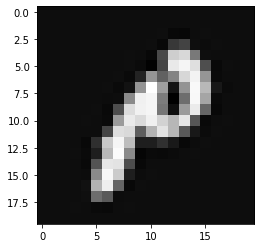

O dígito é: 5
O dígito previsto foi: 9


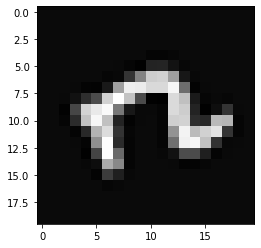

O dígito é: 5
O dígito previsto foi: 8


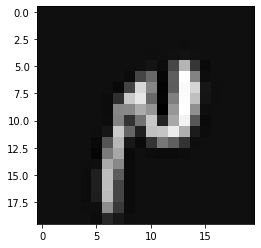

O dígito é: 5
O dígito previsto foi: 4


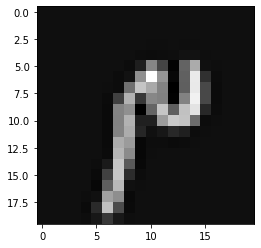

O dígito é: 5
O dígito previsto foi: 8


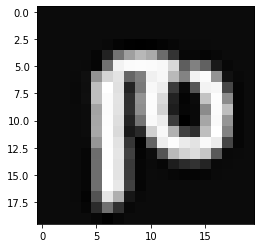

O dígito é: 5
O dígito previsto foi: 3


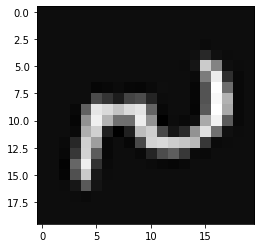

O dígito é: 5
O dígito previsto foi: 3


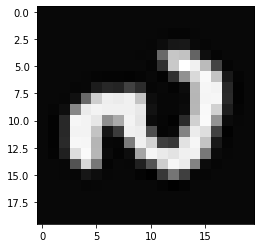

O dígito é: 5
O dígito previsto foi: 8


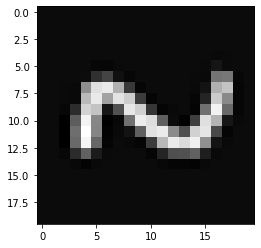

O dígito é: 5
O dígito previsto foi: 2


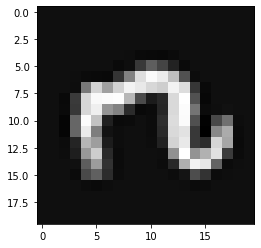

O dígito é: 5
O dígito previsto foi: 4


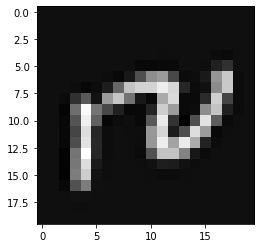

O dígito é: 5
O dígito previsto foi: 3


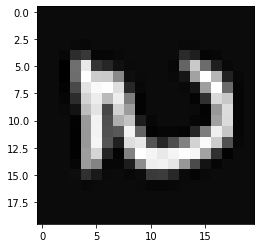

O dígito é: 5
O dígito previsto foi: 6


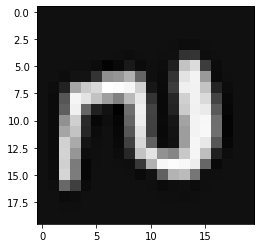

O dígito é: 5
O dígito previsto foi: 6


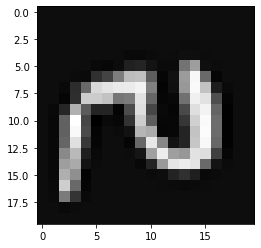

O dígito é: 5
O dígito previsto foi: 3


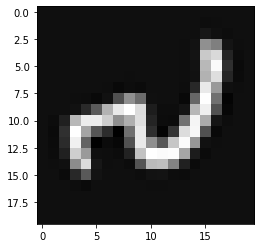

O dígito é: 5
O dígito previsto foi: 3


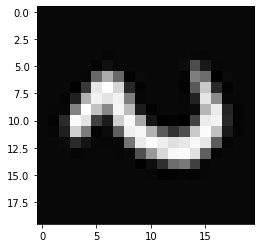

O dígito é: 5
O dígito previsto foi: 3


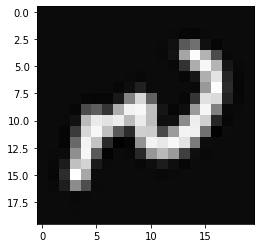

O dígito é: 5
O dígito previsto foi: 3


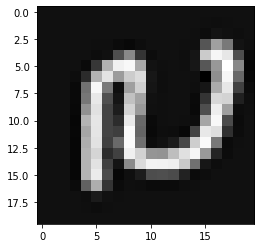

O dígito é: 5
O dígito previsto foi: 2


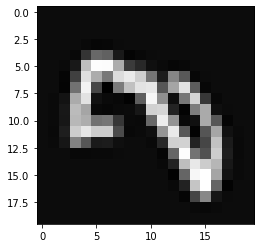

O dígito é: 5
O dígito previsto foi: 4


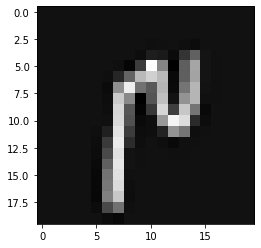

O dígito é: 5
O dígito previsto foi: 3


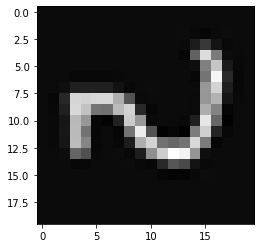

O dígito é: 5
O dígito previsto foi: 3


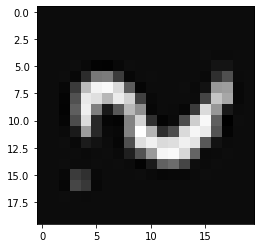

O dígito é: 5
O dígito previsto foi: 0


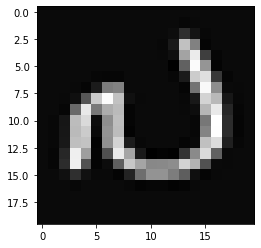

O dígito é: 5
O dígito previsto foi: 0


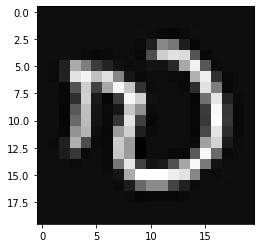

O dígito é: 5
O dígito previsto foi: 1


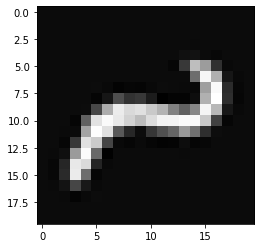

O dígito é: 5
O dígito previsto foi: 8


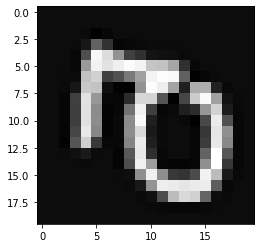

O dígito é: 5
O dígito previsto foi: 8


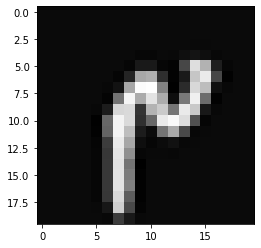

O dígito é: 5
O dígito previsto foi: 3


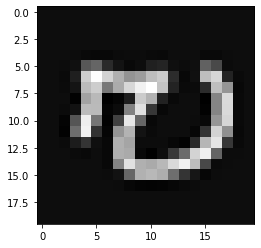

O dígito é: 5
O dígito previsto foi: 3


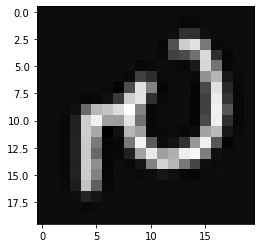

O dígito é: 5
O dígito previsto foi: 9


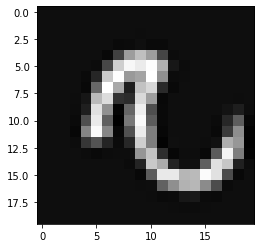

O dígito é: 5
O dígito previsto foi: 9


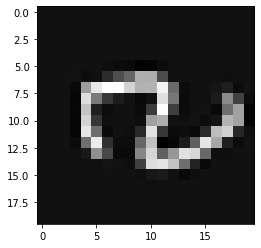

O dígito é: 5
O dígito previsto foi: 3


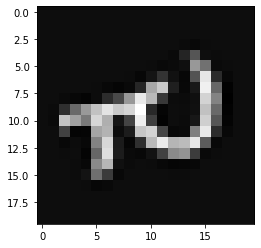

O dígito é: 5
O dígito previsto foi: 9


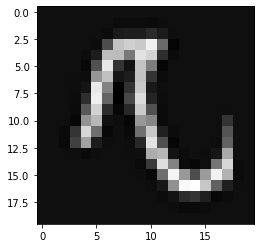

O dígito é: 5
O dígito previsto foi: 9


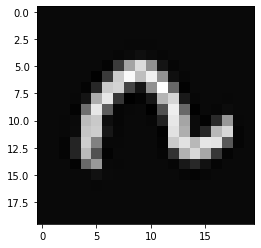

O dígito é: 5
O dígito previsto foi: 0


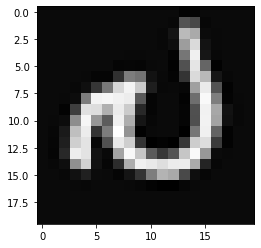

O dígito é: 5
O dígito previsto foi: 0


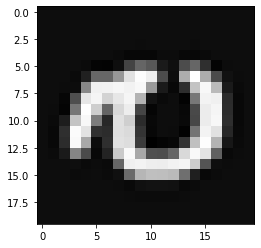

O dígito é: 5
O dígito previsto foi: 6


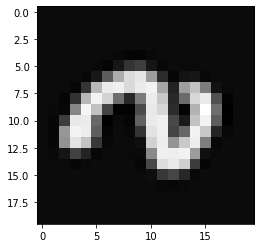

O dígito é: 5
O dígito previsto foi: 9


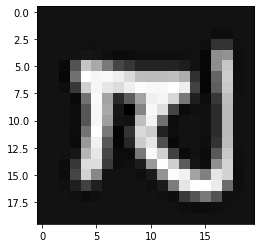

O dígito é: 5
O dígito previsto foi: 0


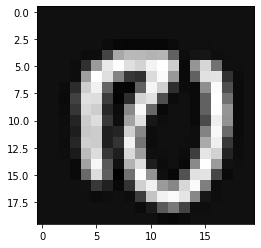

O dígito é: 5
O dígito previsto foi: 8


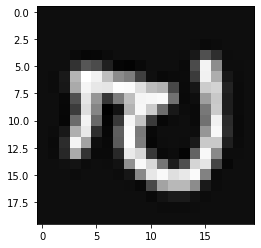

O dígito é: 5
O dígito previsto foi: 1


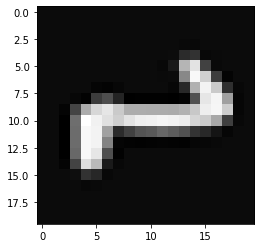

O dígito é: 5
O dígito previsto foi: 3


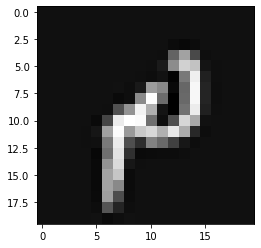

O dígito é: 5
O dígito previsto foi: 4


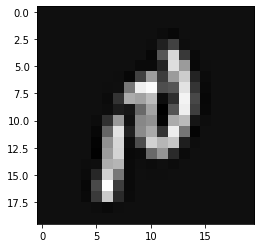

O dígito é: 5
O dígito previsto foi: 4


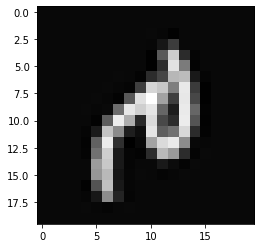

O dígito é: 5
O dígito previsto foi: 8


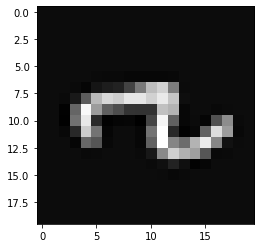

O dígito é: 5
O dígito previsto foi: 3


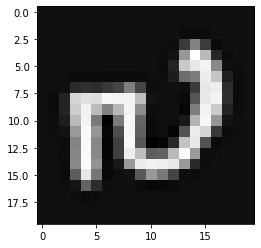

O dígito é: 5
O dígito previsto foi: 4


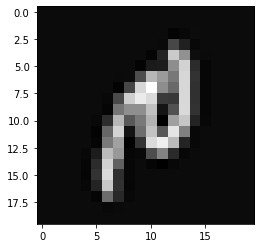

O dígito é: 5
O dígito previsto foi: 9


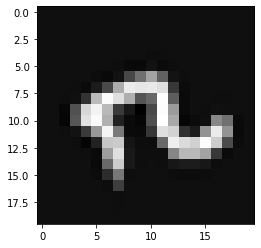

O dígito é: 5
O dígito previsto foi: 9


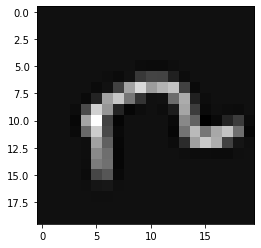

O dígito é: 5
O dígito previsto foi: 3


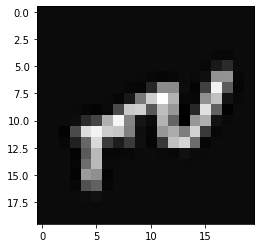

O dígito é: 5
O dígito previsto foi: 6


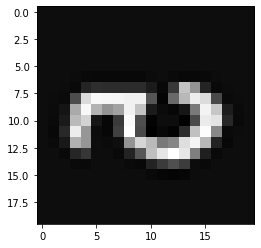

O dígito é: 5
O dígito previsto foi: 8


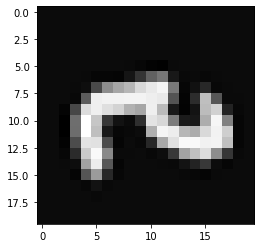

O dígito é: 5
O dígito previsto foi: 3


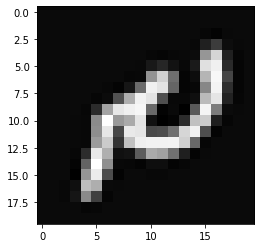

O dígito é: 5
O dígito previsto foi: 3


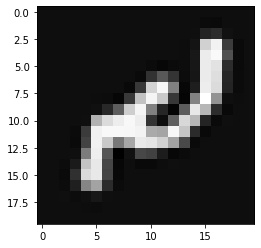

O dígito é: 5
O dígito previsto foi: 0


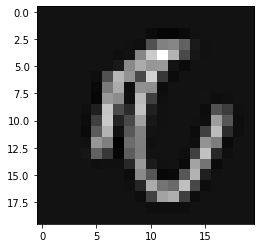

O dígito é: 6
O dígito previsto foi: 4


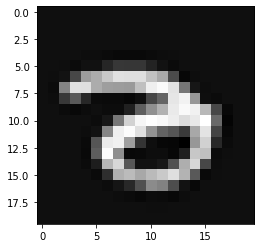

O dígito é: 6
O dígito previsto foi: 0


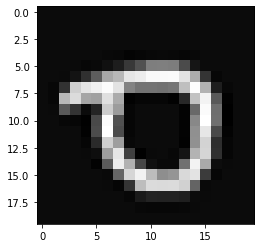

O dígito é: 6
O dígito previsto foi: 9


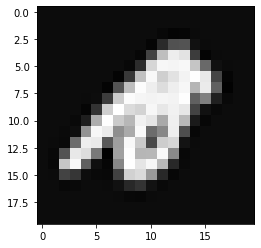

O dígito é: 6
O dígito previsto foi: 8


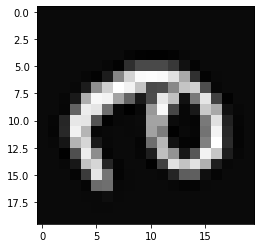

O dígito é: 6
O dígito previsto foi: 1


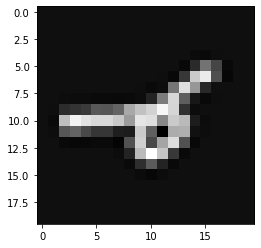

O dígito é: 6
O dígito previsto foi: 0


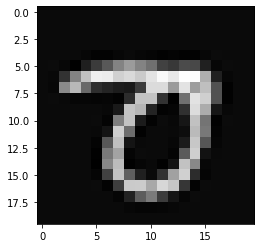

O dígito é: 6
O dígito previsto foi: 5


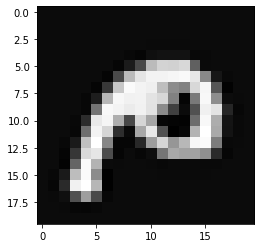

O dígito é: 6
O dígito previsto foi: 1


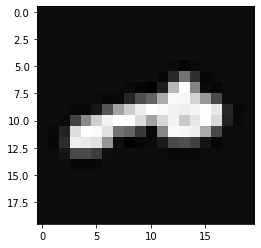

O dígito é: 6
O dígito previsto foi: 5


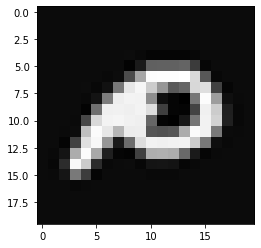

O dígito é: 6
O dígito previsto foi: 4


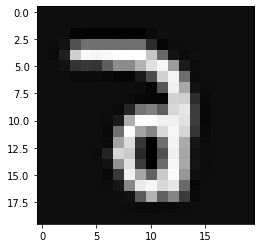

O dígito é: 6
O dígito previsto foi: 8


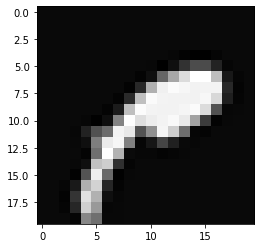

O dígito é: 6
O dígito previsto foi: 5


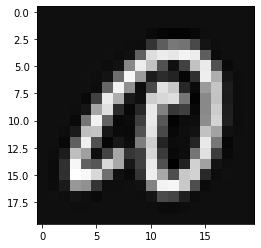

O dígito é: 6
O dígito previsto foi: 5


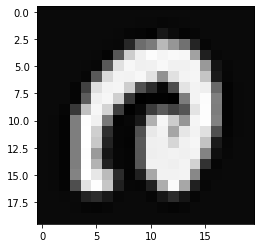

O dígito é: 6
O dígito previsto foi: 4


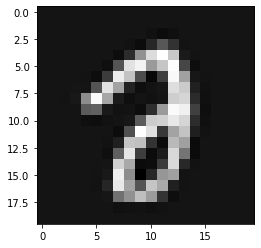

O dígito é: 6
O dígito previsto foi: 0


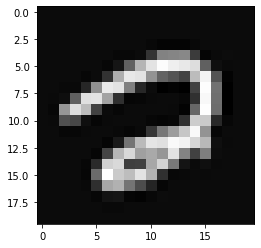

O dígito é: 6
O dígito previsto foi: 5


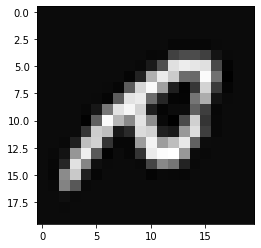

O dígito é: 6
O dígito previsto foi: 2


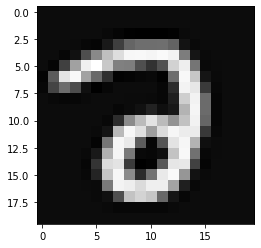

O dígito é: 6
O dígito previsto foi: 1


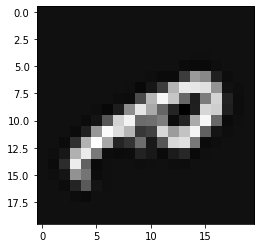

O dígito é: 6
O dígito previsto foi: 5


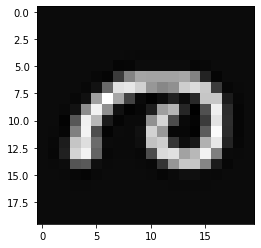

O dígito é: 6
O dígito previsto foi: 5


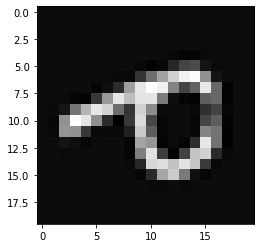

O dígito é: 7
O dígito previsto foi: 2


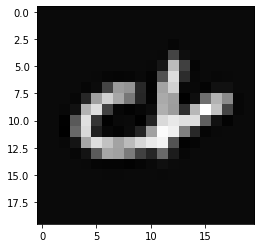

O dígito é: 7
O dígito previsto foi: 9


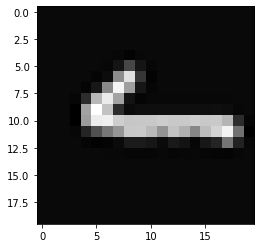

O dígito é: 7
O dígito previsto foi: 9


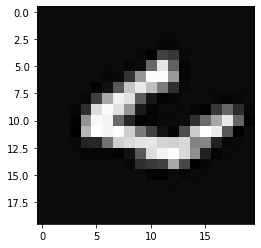

O dígito é: 7
O dígito previsto foi: 1


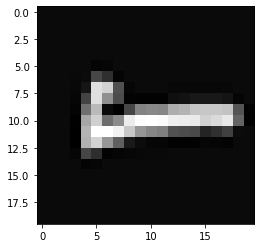

O dígito é: 7
O dígito previsto foi: 0


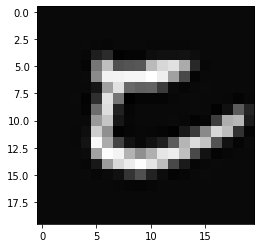

O dígito é: 7
O dígito previsto foi: 2


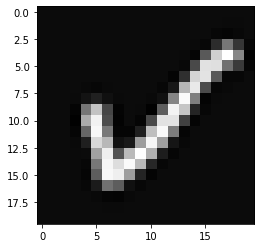

O dígito é: 7
O dígito previsto foi: 9


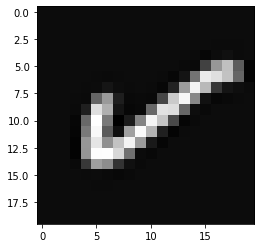

O dígito é: 7
O dígito previsto foi: 1


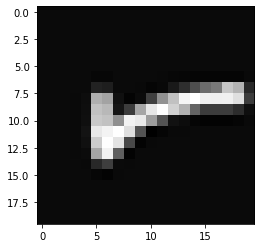

O dígito é: 7
O dígito previsto foi: 1


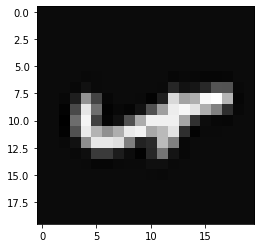

O dígito é: 7
O dígito previsto foi: 4


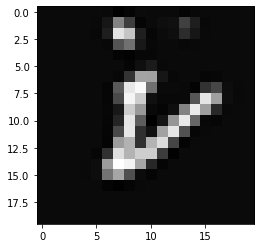

O dígito é: 7
O dígito previsto foi: 4


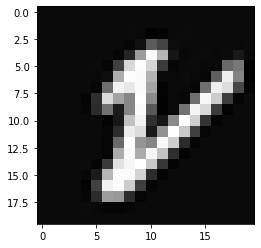

O dígito é: 7
O dígito previsto foi: 4


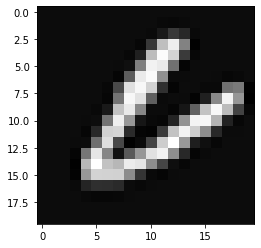

O dígito é: 7
O dígito previsto foi: 4


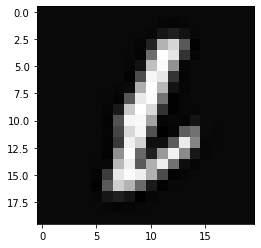

O dígito é: 7
O dígito previsto foi: 9


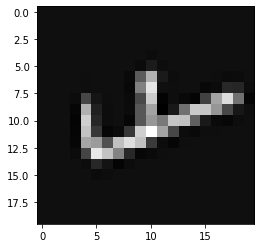

O dígito é: 7
O dígito previsto foi: 0


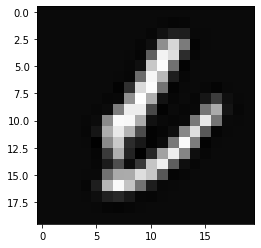

O dígito é: 7
O dígito previsto foi: 9


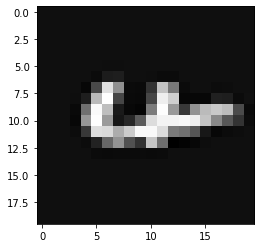

O dígito é: 7
O dígito previsto foi: 4


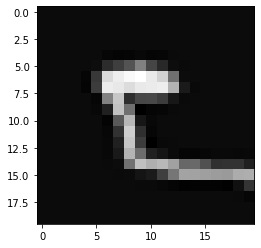

O dígito é: 7
O dígito previsto foi: 9


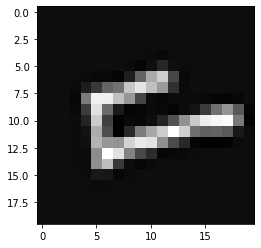

O dígito é: 7
O dígito previsto foi: 1


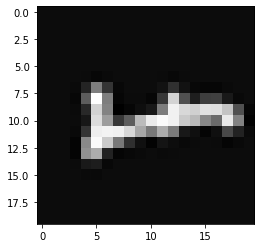

O dígito é: 7
O dígito previsto foi: 1


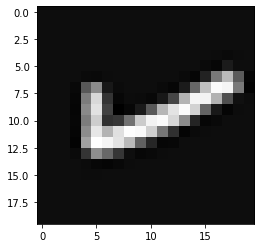

O dígito é: 7
O dígito previsto foi: 0


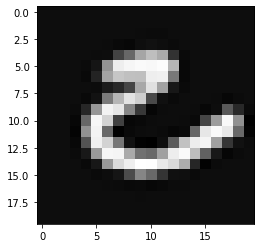

O dígito é: 7
O dígito previsto foi: 2


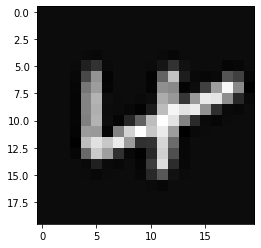

O dígito é: 7
O dígito previsto foi: 2


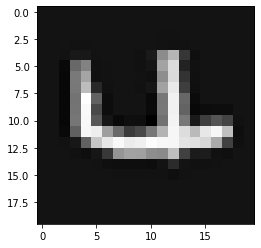

O dígito é: 7
O dígito previsto foi: 4


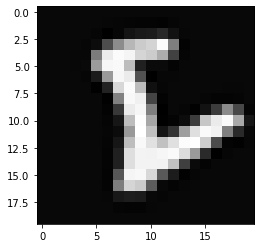

O dígito é: 7
O dígito previsto foi: 9


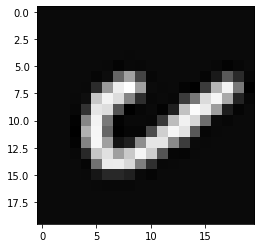

O dígito é: 7
O dígito previsto foi: 2


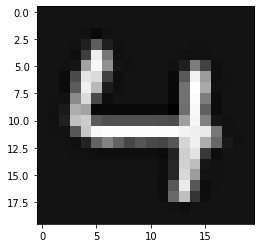

O dígito é: 7
O dígito previsto foi: 9


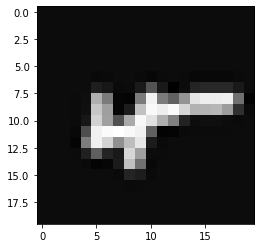

O dígito é: 7
O dígito previsto foi: 1


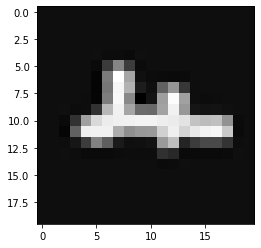

O dígito é: 7
O dígito previsto foi: 9


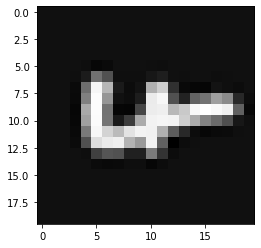

O dígito é: 7
O dígito previsto foi: 9


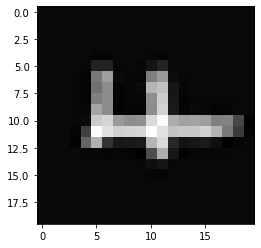

O dígito é: 7
O dígito previsto foi: 1


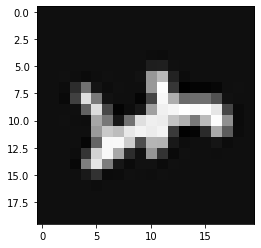

O dígito é: 7
O dígito previsto foi: 4


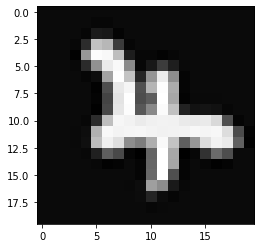

O dígito é: 7
O dígito previsto foi: 1


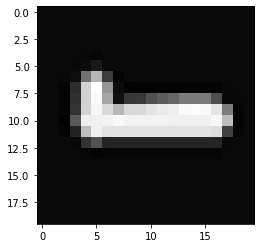

O dígito é: 7
O dígito previsto foi: 4


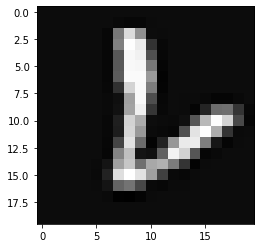

O dígito é: 7
O dígito previsto foi: 9


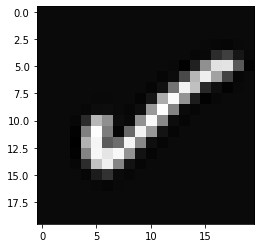

O dígito é: 7
O dígito previsto foi: 2


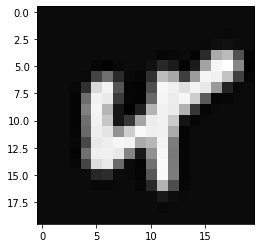

O dígito é: 7
O dígito previsto foi: 0


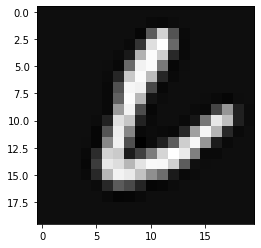

O dígito é: 7
O dígito previsto foi: 9


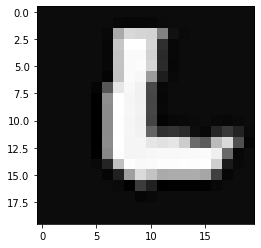

O dígito é: 7
O dígito previsto foi: 9


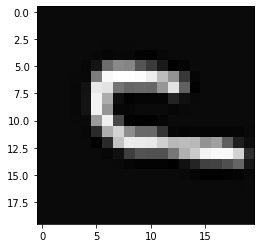

O dígito é: 8
O dígito previsto foi: 1


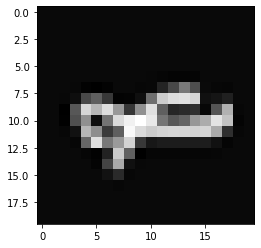

O dígito é: 8
O dígito previsto foi: 1


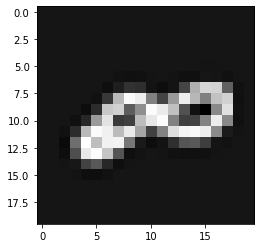

O dígito é: 8
O dígito previsto foi: 3


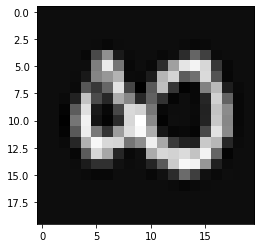

O dígito é: 8
O dígito previsto foi: 2


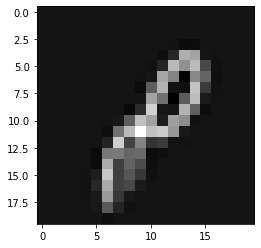

O dígito é: 8
O dígito previsto foi: 5


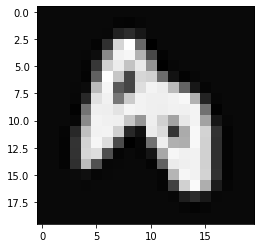

O dígito é: 8
O dígito previsto foi: 6


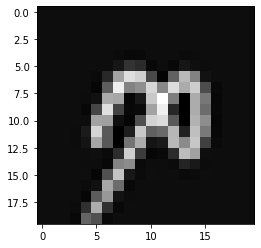

O dígito é: 8
O dígito previsto foi: 1


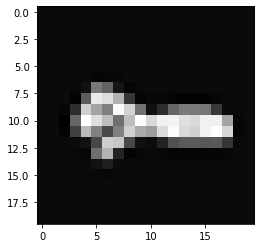

O dígito é: 8
O dígito previsto foi: 3


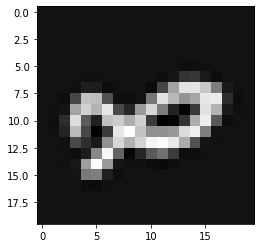

O dígito é: 8
O dígito previsto foi: 1


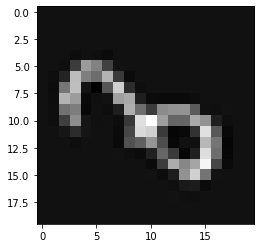

O dígito é: 8
O dígito previsto foi: 7


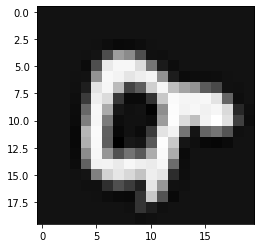

O dígito é: 8
O dígito previsto foi: 5


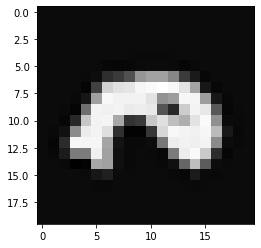

O dígito é: 8
O dígito previsto foi: 3


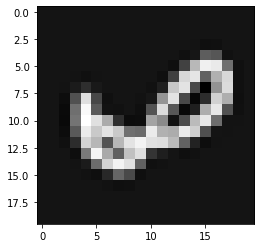

O dígito é: 8
O dígito previsto foi: 1


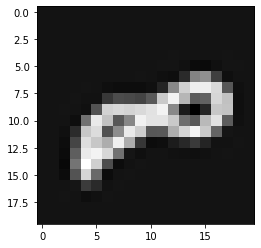

O dígito é: 8
O dígito previsto foi: 9


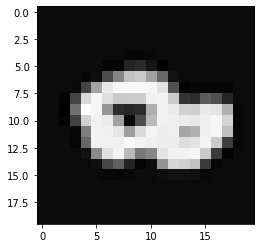

O dígito é: 8
O dígito previsto foi: 3


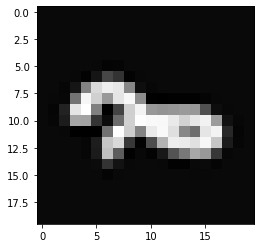

O dígito é: 8
O dígito previsto foi: 1


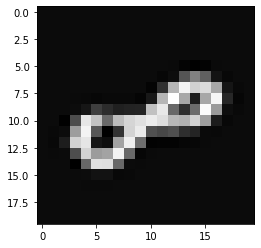

O dígito é: 8
O dígito previsto foi: 9


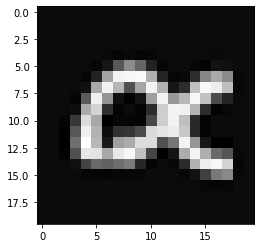

O dígito é: 8
O dígito previsto foi: 6


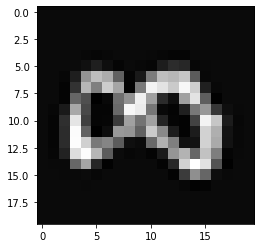

O dígito é: 8
O dígito previsto foi: 3


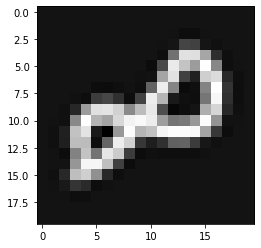

O dígito é: 8
O dígito previsto foi: 0


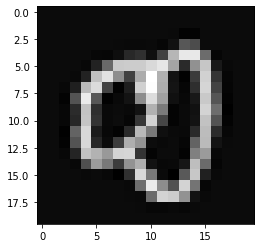

O dígito é: 8
O dígito previsto foi: 5


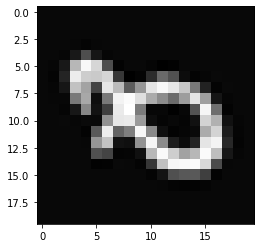

O dígito é: 8
O dígito previsto foi: 3


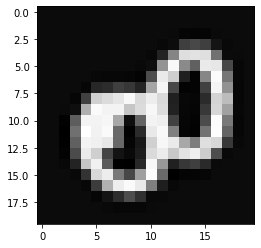

O dígito é: 8
O dígito previsto foi: 9


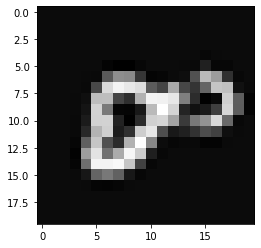

O dígito é: 8
O dígito previsto foi: 3


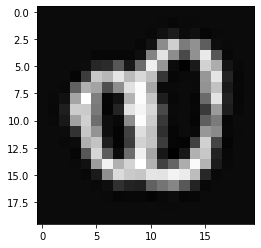

O dígito é: 8
O dígito previsto foi: 4


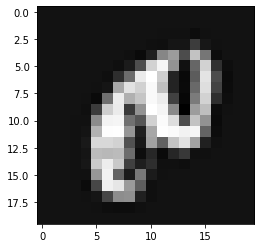

O dígito é: 8
O dígito previsto foi: 9


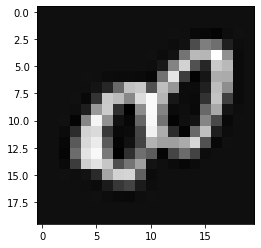

O dígito é: 8
O dígito previsto foi: 3


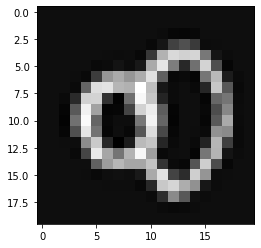

O dígito é: 8
O dígito previsto foi: 5


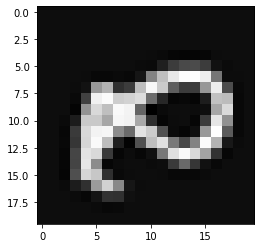

O dígito é: 8
O dígito previsto foi: 4


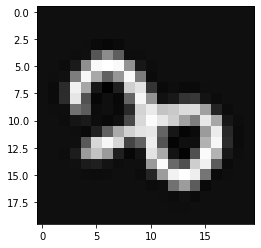

O dígito é: 8
O dígito previsto foi: 4


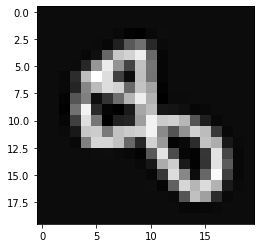

O dígito é: 8
O dígito previsto foi: 3


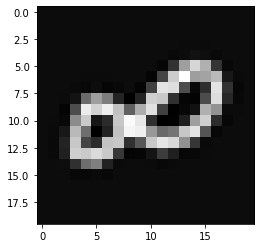

O dígito é: 8
O dígito previsto foi: 3


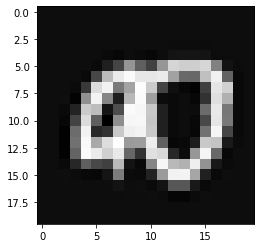

O dígito é: 8
O dígito previsto foi: 2


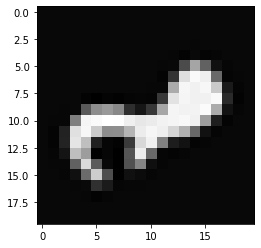

O dígito é: 8
O dígito previsto foi: 1


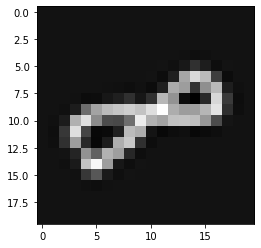

O dígito é: 8
O dígito previsto foi: 3


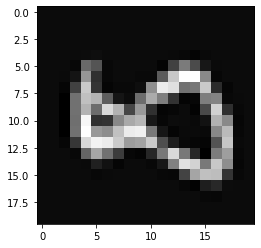

O dígito é: 8
O dígito previsto foi: 3


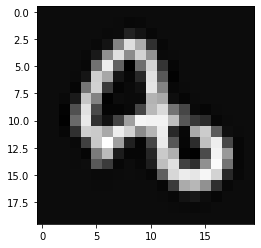

O dígito é: 8
O dígito previsto foi: 5


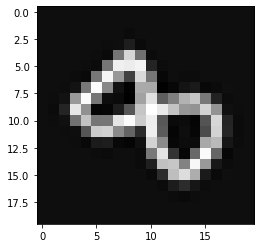

O dígito é: 8
O dígito previsto foi: 6


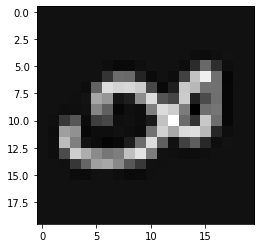

O dígito é: 8
O dígito previsto foi: 5


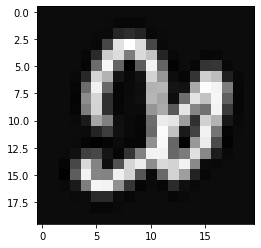

O dígito é: 8
O dígito previsto foi: 2


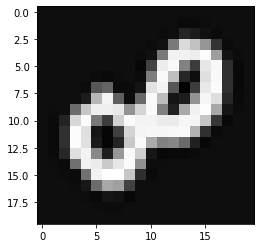

O dígito é: 8
O dígito previsto foi: 6


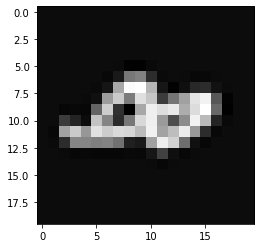

O dígito é: 8
O dígito previsto foi: 6


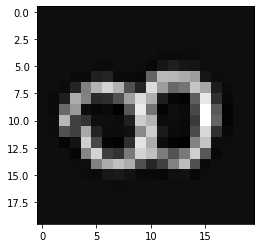

O dígito é: 8
O dígito previsto foi: 6


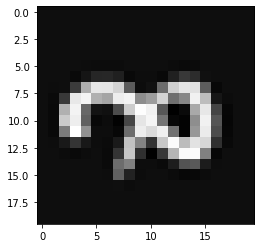

O dígito é: 8
O dígito previsto foi: 1


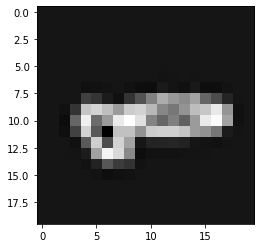

O dígito é: 8
O dígito previsto foi: 1


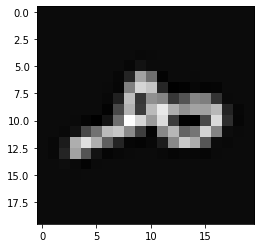

O dígito é: 8
O dígito previsto foi: 5


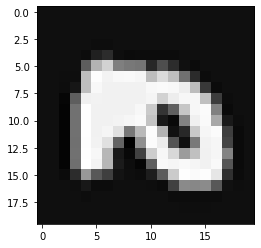

O dígito é: 8
O dígito previsto foi: 9


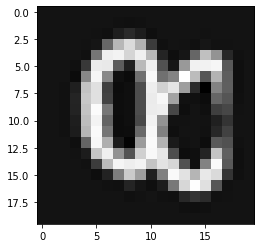

O dígito é: 8
O dígito previsto foi: 2


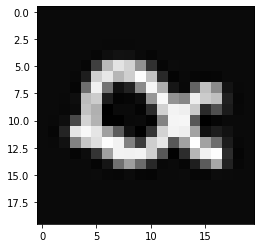

O dígito é: 8
O dígito previsto foi: 3


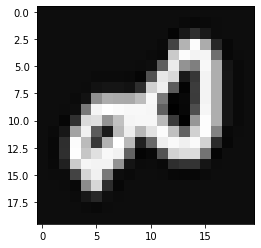

O dígito é: 8
O dígito previsto foi: 9


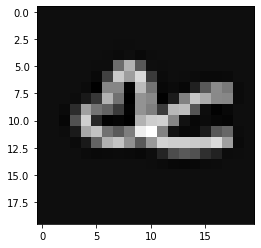

O dígito é: 9
O dígito previsto foi: 7


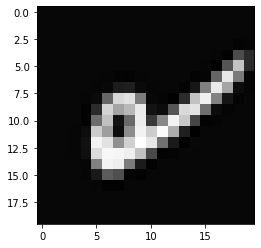

O dígito é: 9
O dígito previsto foi: 5


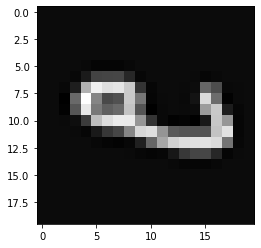

O dígito é: 9
O dígito previsto foi: 0


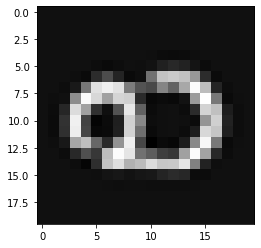

O dígito é: 9
O dígito previsto foi: 7


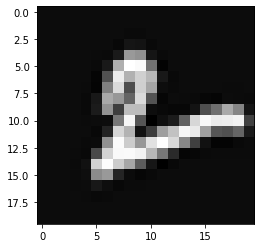

O dígito é: 9
O dígito previsto foi: 4


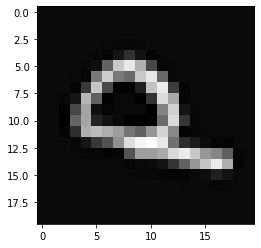

O dígito é: 9
O dígito previsto foi: 7


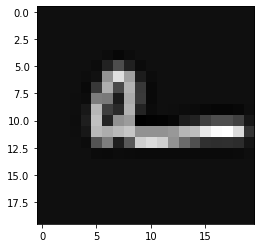

O dígito é: 9
O dígito previsto foi: 3


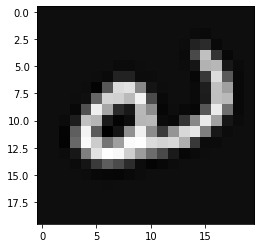

O dígito é: 9
O dígito previsto foi: 4


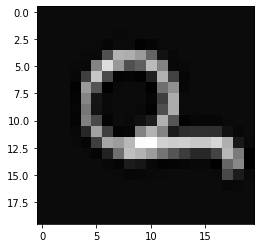

O dígito é: 9
O dígito previsto foi: 4


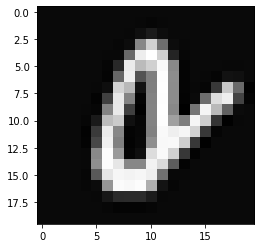

O dígito é: 9
O dígito previsto foi: 7


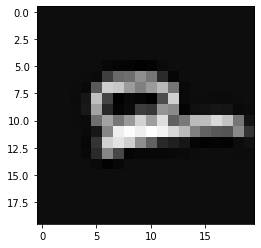

O dígito é: 9
O dígito previsto foi: 2


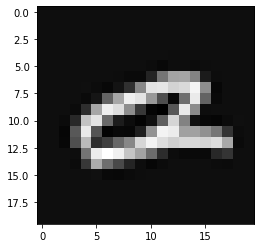

O dígito é: 9
O dígito previsto foi: 7


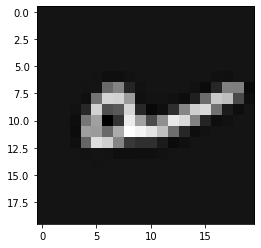

O dígito é: 9
O dígito previsto foi: 0


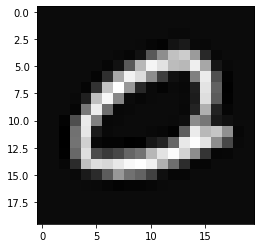

O dígito é: 9
O dígito previsto foi: 4


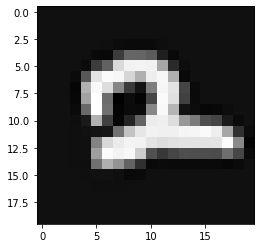

O dígito é: 9
O dígito previsto foi: 7


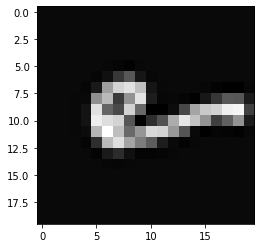

O dígito é: 9
O dígito previsto foi: 8


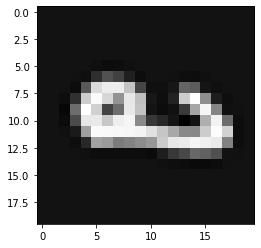

O dígito é: 9
O dígito previsto foi: 3


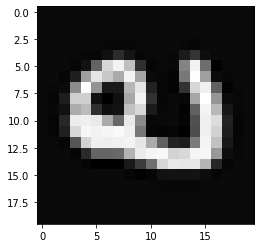

O dígito é: 9
O dígito previsto foi: 3


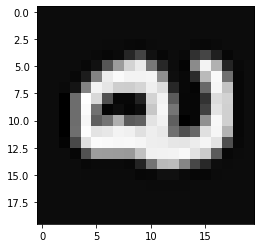

O dígito é: 9
O dígito previsto foi: 7


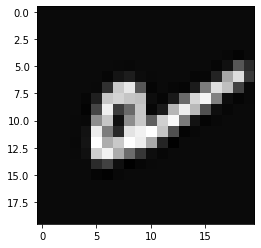

O dígito é: 9
O dígito previsto foi: 4


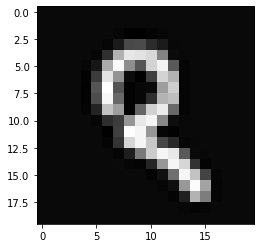

O dígito é: 9
O dígito previsto foi: 7


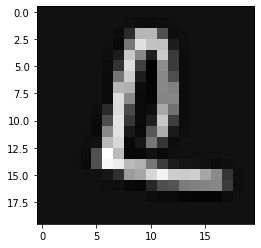

O dígito é: 9
O dígito previsto foi: 0


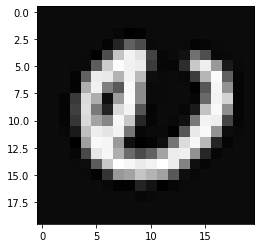

O dígito é: 9
O dígito previsto foi: 4


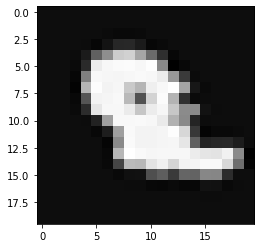

O dígito é: 9
O dígito previsto foi: 4


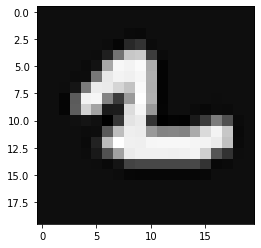

O dígito é: 9
O dígito previsto foi: 7


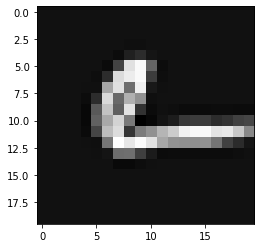

O dígito é: 9
O dígito previsto foi: 5


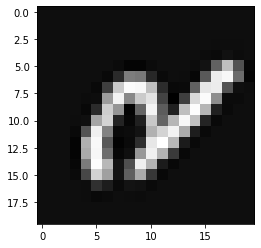

O dígito é: 9
O dígito previsto foi: 4


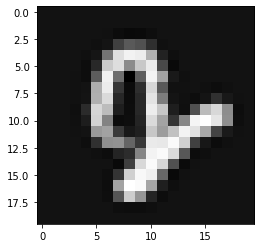

O dígito é: 9
O dígito previsto foi: 0


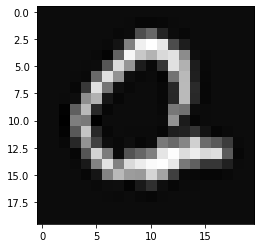

O dígito é: 9
O dígito previsto foi: 2


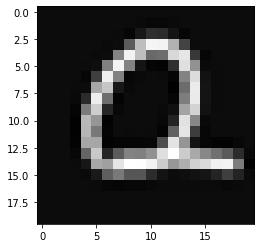

O dígito é: 9
O dígito previsto foi: 7


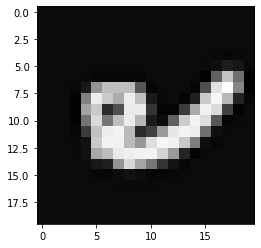

O dígito é: 9
O dígito previsto foi: 2


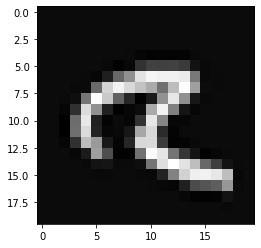

O dígito é: 9
O dígito previsto foi: 7


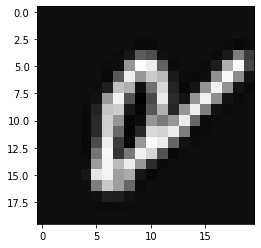

O dígito é: 9
O dígito previsto foi: 5


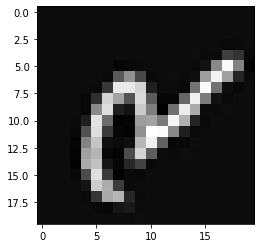

O dígito é: 9
O dígito previsto foi: 7


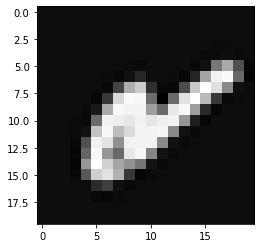

O dígito é: 9
O dígito previsto foi: 3


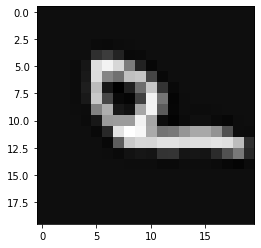

O dígito é: 9
O dígito previsto foi: 3


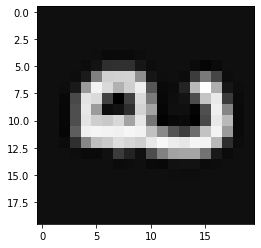

O dígito é: 9
O dígito previsto foi: 5


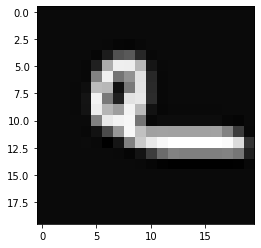

O dígito é: 9
O dígito previsto foi: 1


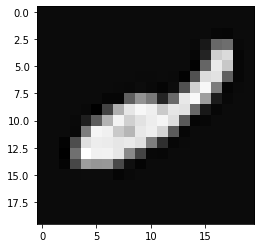

O dígito é: 9
O dígito previsto foi: 4


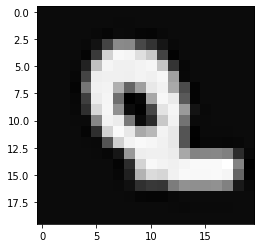

O dígito é: 9
O dígito previsto foi: 7


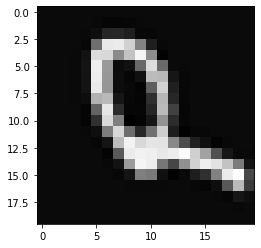

O dígito é: 9
O dígito previsto foi: 7


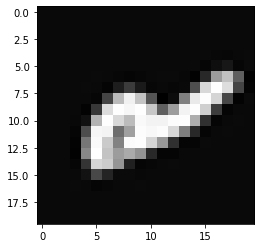

O dígito é: 9
O dígito previsto foi: 1


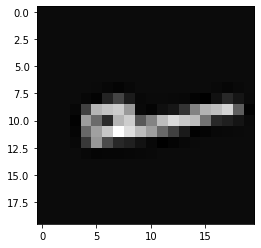

O dígito é: 9
O dígito previsto foi: 7


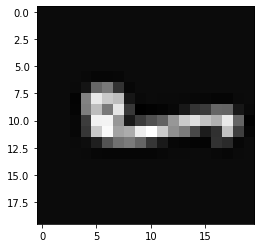

O dígito é: 9
O dígito previsto foi: 8


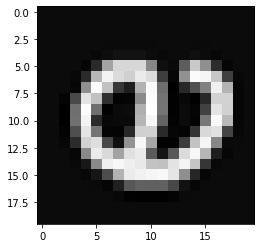

O dígito é: 9
O dígito previsto foi: 7


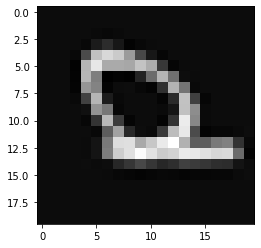

O dígito é: 9
O dígito previsto foi: 7


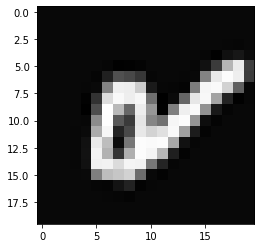

O dígito é: 9
O dígito previsto foi: 7


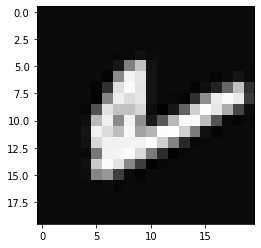

O dígito é: 9
O dígito previsto foi: 4


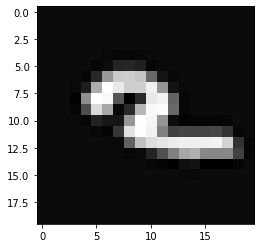

O dígito é: 9
O dígito previsto foi: 0


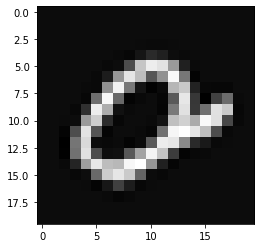

O dígito é: 9
O dígito previsto foi: 0


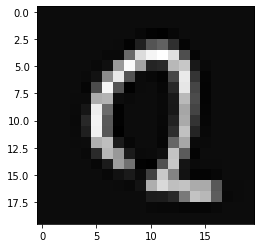

O dígito é: 9
O dígito previsto foi: 0


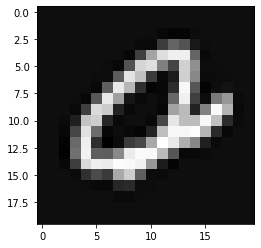

O dígito é: 9
O dígito previsto foi: 7


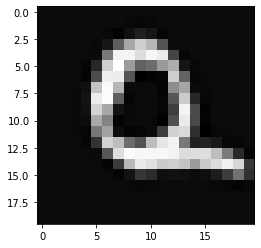

O dígito é: 9
O dígito previsto foi: 3


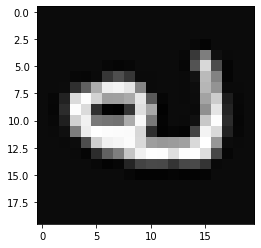

O dígito é: 9
O dígito previsto foi: 7


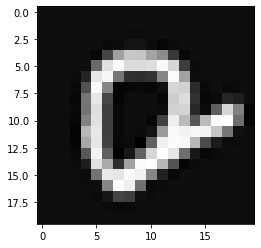

In [41]:
# Plotando as imagens erroneamente classificadas
for i in w_images_reg:
    print("O dígito é:", labels[0][i])
    print("O dígito previsto foi:", pred_reg[0][i])
    x_lg1_reg = images.iloc[i][:].values
    imagem_reg = x_lg1_reg.reshape(20, 20)
    plt.imshow(imagem_reg, cmap='gray')
    plt.show()